# 19. Bayesian MCMC: chord architecture v3 and LV adaptation costs

## Цель ноутбука

В этом ноутбуке проводится байесовский MCMC-анализ связи механистической классификации ложных хорд ЛЖ v3 с показателями механической адаптации ЛЖ.

Мы продолжаем линию предыдущего анализа:

- ложные хорды ЛЖ рассматриваются не как бинарный признак `есть / нет`;
- ключевой фокус — механистическая архитектура хорд;
- основная классификация — `chord_architecture_v3`;
- основной вопрос — связаны ли разные типы архитектуры хорд с различной “ценой адаптации” ЛЖ.

## Основные гипотезы

1. Сетевая архитектура хорд (`4_Chord_network`) связана с большей региональной неоднородностью деформации ЛЖ.
2. Одиночная протяжённая косая хорда (`2_Single_long_oblique_bridge`) может быть относительно “механически экономичным” вариантом.
3. Поперечные и сетевые конфигурации могут быть связаны с более низким функциональным резервом по VO₂max.
4. Архитектура хорд может влиять не столько на глобальный ΔSWS, сколько на региональное распределение механической нагрузки.
5. При одинаковом ΔSWS разные архитектуры хорд могут давать разную неоднородность деформации.

## Почему MCMC

Классические тесты в предыдущих ноутбуках ограничены малым и неравномерным размером групп. Поэтому здесь используется байесовский подход:

- вместо только `p-value` оцениваем posterior distribution;
- вместо “значимо / незначимо” оцениваем вероятность эффекта;
- используем робастное распределение Student-t, так как ключевые показатели не являются нормально распределёнными;
- используем частичный pooling, чтобы стабилизировать оценки в малых группах.

## Основные outputs

- posterior means / medians по группам;
- 89% и 95% credible intervals;
- posterior probability направленных гипотез;
- posterior ranking групп;
- posterior predictive checks;
- trace plots;
- таблицы и рисунки для будущей статьи.

In [1]:
# ============================================================
# 19. Bayesian MCMC: chord architecture v3 and LV adaptation costs
# ============================================================

from pathlib import Path
import warnings
import itertools
import re

warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd

from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns

# MCMC stack
try:
    import pymc as pm
    import arviz as az
except ImportError as e:
    raise ImportError(
        "Не найдены pymc / arviz. Установи в окружении проекта:\n\n"
        "uv pip install pymc arviz\n\n"
        "или:\n\n"
        "pip install pymc arviz"
    ) from e


# ------------------------------------------------------------
# Paths: используем старую структуру проекта
# ------------------------------------------------------------

PROJECT_ROOT = Path(r"C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords")

DATA_DIR = PROJECT_ROOT / "data"
OUTPUT_DIR = PROJECT_ROOT / "output"
FIGURES_DIR = OUTPUT_DIR / "figures" / "19_bayesian_mcmc_v3"
TABLES_DIR = OUTPUT_DIR / "tables" / "19_bayesian_mcmc_v3"

FIGURES_DIR.mkdir(parents=True, exist_ok=True)
TABLES_DIR.mkdir(parents=True, exist_ok=True)

FINAL_DATA_PATH = DATA_DIR / "final_analysis_dataset_ver2.xlsx"

print("PROJECT_ROOT:", PROJECT_ROOT)
print("FINAL_DATA_PATH exists:", FINAL_DATA_PATH.exists(), FINAL_DATA_PATH)
print("FIGURES_DIR:", FIGURES_DIR)
print("TABLES_DIR:", TABLES_DIR)


# ------------------------------------------------------------
# Reproducibility
# ------------------------------------------------------------

RANDOM_SEED = 42
rng = np.random.default_rng(RANDOM_SEED)


# ------------------------------------------------------------
# Academic plot style
# ------------------------------------------------------------

sns.set_theme(
    context="paper",
    style="white",
    font_scale=1.15,
)

plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 300,
    "figure.figsize": (8.5, 5.2),

    "axes.facecolor": "white",
    "figure.facecolor": "white",
    "axes.edgecolor": "black",
    "axes.linewidth": 1.0,
    "axes.grid": False,

    "axes.spines.top": False,
    "axes.spines.right": False,

    "font.family": "DejaVu Sans",
    "axes.titleweight": "bold",
    "axes.labelsize": 11,
    "axes.titlesize": 12,

    "xtick.direction": "out",
    "ytick.direction": "out",

    "legend.frameon": False,
})

ARCH_PALETTE = {
    "1_Local_transverse_or_low_angle": "#4C72B0",
    "2_Single_long_oblique_bridge": "#55A868",
    "3_Double_transverse_no_long_oblique": "#C44E52",
    "4_Chord_network": "#8172B2",
}

plt.rcParams["axes.prop_cycle"] = plt.cycler(color=list(ARCH_PALETTE.values()))

g++ not available, if using conda: `conda install gxx`


PROJECT_ROOT: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords
FINAL_DATA_PATH exists: True C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\data\final_analysis_dataset_ver2.xlsx
FIGURES_DIR: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\output\figures\19_bayesian_mcmc_v3
TABLES_DIR: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\output\tables\19_bayesian_mcmc_v3


## 1. Загрузка данных

Используем ту же структуру данных, что и в предыдущих ноутбуках:

- `data/final_analysis_dataset_ver2.xlsx` — основной аналитический датасет;
- `regression_mechanistic_dataset.xlsx` — механистические признаки хорд, если файл найден в проекте.

Если часть механистических признаков уже есть в основном датасете, они не дублируются.## 1. Загрузка данных

Используется та же схема, что и в предыдущем ноутбуке:

- основной файл: `data/final_analysis_dataset_ver2.xlsx`;
- при наличии автоматически подтягивается `regression_mechanistic_dataset.xlsx`;
- механистические переменные хорд добавляются по `subject_full_name`.

In [2]:
# ============================================================
# Load final dataset and mechanistic dataset if available
# ============================================================

ID_COL = "subject_full_name"

df_final = pd.read_excel(FINAL_DATA_PATH)

print("df_final:", df_final.shape)
display(df_final.head())

mech_candidates = list(PROJECT_ROOT.rglob("regression_mechanistic_dataset.xlsx"))

print("\nMechanistic dataset candidates:")
for p in mech_candidates:
    print(p)

if len(mech_candidates) > 0:
    MECH_DATA_PATH = mech_candidates[0]
    df_mech = pd.read_excel(MECH_DATA_PATH)
    print("\nUsing MECH_DATA_PATH:", MECH_DATA_PATH)
    print("df_mech:", df_mech.shape)
else:
    MECH_DATA_PATH = None
    df_mech = None
    print("\nWARNING: regression_mechanistic_dataset.xlsx was not found. Will use df_final only.")

candidate_mech_cols = [
    "mechanical_chord_phenotype",
    "chord_type_complexity_class",
    "lv_false_tendon_total_count",
    "transverse_load",
    "oblique_load",
    "long_oblique_bridge_load",
    "chord_type_diversity",
    "tethering_index",
]

if df_mech is not None:
    existing_mech_cols = [c for c in candidate_mech_cols if c in df_mech.columns]
    df = df_final.copy()
    cols_to_add = [c for c in existing_mech_cols if c not in df.columns]

    print("\nExisting mechanistic columns in df_mech:")
    print(existing_mech_cols)

    print("\nMechanistic columns to add:")
    print(cols_to_add)

    if len(cols_to_add) > 0:
        if ID_COL in df.columns and ID_COL in df_mech.columns:
            df = df.merge(
                df_mech[[ID_COL] + cols_to_add],
                on=ID_COL,
                how="left",
                validate="one_to_one",
            )
            print("\nMerged by subject_full_name:", df.shape)
        else:
            print("\nWARNING: subject_full_name not found in both datasets. Using row-order fallback.")
            if len(df) != len(df_mech):
                raise ValueError("Cannot row-order merge: df_final and df_mech have different number of rows.")
            for col in cols_to_add:
                df[col] = df_mech[col].values
else:
    df = df_final.copy()

print("\nWorking df:", df.shape)

print("\nExisting mechanistic columns in working df:")
print([c for c in candidate_mech_cols if c in df.columns])

print("\nMissing mechanistic columns in working df:")
print([c for c in candidate_mech_cols if c not in df.columns])

df_final: (153, 222)


,subject_full_name,age,height_cm,weight_cm,BSA,sex,IMT,echo_ascending_aorta_diameter_mm_div_bsa,echo_ascending_aorta_diameter_mm,echo_aortic_sinus_diameter_mm_div_bsa,...,echo_lv_strain_plus_cv_pct,echo_lv_strain_rate_cv_pct,echo_lv_systolic_wall_stress_g_cm2,merged_lv_deformation_cv_pct,hemo_sbp_rest_mmhg,hemo_sbp_exercise_mmhg,dsws,echo_lv_sws_rest_g_cm2,echo_lv_sws_max_g_cm2,echo_lv_sws_delta_g_cm2
0,Абатурова,23.0,176.0,70.0,1.849925,1.0,23.0,14.054624,26.0,13.514062,...,NaN,NaN,114.446420,24.0,122.0,159.0,37.0,116.630910,152.002579,35.371669
1,Абросимова,15.0,163.0,62.0,1.675477,1.0,23.3,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Айтиева,20.0,155.0,58.5,1.587057,1.0,24.5,16.382524,26.0,16.382524,...,NaN,NaN,169.629253,37.0,119.0,161.0,42.0,109.309091,147.888770,38.579679
3,Алиева,21.0,152.0,53.3,1.500148,1.0,23.0,17.331622,26.0,15.331819,...,NaN,NaN,67.794404,33.0,109.0,155.0,46.0,96.054733,136.591592,40.536860
4,Артемова,17.0,161.0,55.0,1.568350,1.0,21.0,13.389867,21.0,13.389867,...,NaN,NaN,96.909213,NaN,118.0,139.0,21.0,75.558075,101.839145,26.281070



Mechanistic dataset candidates:
C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\data\interim\regression_mechanistic_dataset.xlsx

Using MECH_DATA_PATH: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\data\interim\regression_mechanistic_dataset.xlsx
df_mech: (153, 224)

Existing mechanistic columns in df_mech:
['mechanical_chord_phenotype', 'chord_type_complexity_class', 'lv_false_tendon_total_count', 'transverse_load', 'oblique_load', 'long_oblique_bridge_load', 'chord_type_diversity', 'tethering_index']

Mechanistic columns to add:
['mechanical_chord_phenotype', 'chord_type_complexity_class', 'transverse_load', 'oblique_load', 'long_oblique_bridge_load', 'chord_type_diversity', 'tethering_index']

Merged by subject_full_name: (153, 229)

Working df: (153, 229)

Existing mechanistic columns in working df:
['mechanical_chord_phenotype', 'chord_type_complexity_class', 'lv_false_tendon_total_count', 'transverse_load', 'oblique_load', 'long_oblique_bridge_loa

## 2. Восстановление топологических признаков и классификации v3

Классификация `chord_architecture_v3` воспроизводится по правилам предыдущего ноутбука.

Основные группы:

1. `1_Local_transverse_or_low_angle`  
   Локальная поперечная или низкоугловая хорда.

2. `2_Single_long_oblique_bridge`  
   Одиночная протяжённая косая хорда.

3. `3_Double_transverse_no_long_oblique`  
   Две поперечные хорды без длинной косой хорды.

4. `4_Chord_network`  
   Сеть хорд или множественная внутриполостная архитектура.

Неясные случаи не отправляются автоматически в сеть, а остаются `unclassified`, чтобы не создавать искусственную остаточную группу.

In [3]:
# ============================================================
# Detect chord attachment columns and create topology helpers
# ============================================================

attachment_cols = [
    c for c in df.columns
    if ("chord_attachment" in c.lower()) or ("attachment_flag" in c.lower() and "chord" in c.lower())
]

basal_attachment_cols = [c for c in attachment_cols if "_basal_" in c.lower()]
mid_attachment_cols = [c for c in attachment_cols if "_mid_" in c.lower()]
apical_attachment_cols = [c for c in attachment_cols if "_apical_" in c.lower()]

print("All attachment cols:", len(attachment_cols))
print("Basal attachment cols:", len(basal_attachment_cols))
print("Mid attachment cols:", len(mid_attachment_cols))
print("Apical attachment cols:", len(apical_attachment_cols))

print("\nBasal:")
print(basal_attachment_cols)

print("\nMid:")
print(mid_attachment_cols)

print("\nApical:")
print(apical_attachment_cols)


def row_any_positive(row, cols):
    if not cols:
        return False
    values = pd.to_numeric(row[cols], errors="coerce").fillna(0)
    return bool((values > 0).any())


def row_sum_positive(row, cols):
    if not cols:
        return 0
    values = pd.to_numeric(row[cols], errors="coerce").fillna(0)
    return int((values > 0).sum())


# Attachment level flags
df["has_basal_chord_attachment"] = df.apply(lambda r: row_any_positive(r, basal_attachment_cols), axis=1)
df["has_mid_chord_attachment"] = df.apply(lambda r: row_any_positive(r, mid_attachment_cols), axis=1)
df["has_apical_chord_attachment"] = df.apply(lambda r: row_any_positive(r, apical_attachment_cols), axis=1)

df["n_basal_chord_attachment_segments"] = df.apply(lambda r: row_sum_positive(r, basal_attachment_cols), axis=1)
df["n_mid_chord_attachment_segments"] = df.apply(lambda r: row_sum_positive(r, mid_attachment_cols), axis=1)
df["n_apical_chord_attachment_segments"] = df.apply(lambda r: row_sum_positive(r, apical_attachment_cols), axis=1)

df["n_chord_attachment_segments_total"] = (
    df["n_basal_chord_attachment_segments"]
    + df["n_mid_chord_attachment_segments"]
    + df["n_apical_chord_attachment_segments"]
)

df["n_involved_lv_levels"] = (
    df[[
        "has_basal_chord_attachment",
        "has_mid_chord_attachment",
        "has_apical_chord_attachment",
    ]]
    .astype(int)
    .sum(axis=1)
)

# Pure apical exclusion flag
df["is_pure_apical_chord_topology"] = (
    df["has_apical_chord_attachment"]
    & ~df["has_basal_chord_attachment"]
    & ~df["has_mid_chord_attachment"]
)

# Proxy for long basal-apical bridge
df["has_basal_apical_bridge_proxy"] = (
    df["has_basal_chord_attachment"]
    & df["has_apical_chord_attachment"]
)

# Convert numeric chord variables
numeric_chord_cols = [
    "lv_false_tendon_total_count",
    "transverse_load",
    "oblique_load",
    "long_oblique_bridge_load",
    "chord_type_diversity",
    "tethering_index",
]

for col in numeric_chord_cols:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce")


helper_cols = [
    "has_basal_chord_attachment",
    "has_mid_chord_attachment",
    "has_apical_chord_attachment",
    "is_pure_apical_chord_topology",
    "has_basal_apical_bridge_proxy",
    "n_involved_lv_levels",
    "n_chord_attachment_segments_total",
]

display(df[helper_cols].describe(include="all"))


# ============================================================
# New mechanistic chord architecture classification v3
# ============================================================

def classify_chord_architecture_v3(row):
    """
    1. Local_transverse_or_low_angle:
       local transverse / low-angle chord connecting adjacent regions.

    2. Single_long_oblique_bridge:
       single long oblique chord only.

    3. Double_transverse_no_long_oblique:
       two transverse chords without long oblique bridge.

    4. Chord_network:
       distributed chord network.

    Exclusion:
       pure apical cases are excluded if is_pure_apical_chord_topology == True.

    Important:
       unclear cases are not automatically assigned to network.
       They remain unclassified.
    """

    total = pd.to_numeric(row.get("lv_false_tendon_total_count", np.nan), errors="coerce")
    transverse = pd.to_numeric(row.get("transverse_load", np.nan), errors="coerce")
    oblique = pd.to_numeric(row.get("oblique_load", np.nan), errors="coerce")
    long_oblique = pd.to_numeric(row.get("long_oblique_bridge_load", np.nan), errors="coerce")
    n_levels = pd.to_numeric(row.get("n_involved_lv_levels", np.nan), errors="coerce")

    pure_apical = bool(row.get("is_pure_apical_chord_topology", False))

    has_basal = bool(row.get("has_basal_chord_attachment", False))
    has_mid = bool(row.get("has_mid_chord_attachment", False))
    has_apical = bool(row.get("has_apical_chord_attachment", False))
    basal_apical_bridge = bool(row.get("has_basal_apical_bridge_proxy", False))

    # 0. Exclude pure apical
    if pure_apical:
        return pd.Series([np.nan, "excluded_pure_apical"])

    # Missing total count: do not force into any group
    if pd.isna(total):
        return pd.Series([np.nan, "missing_total_chord_count"])

    # 4. Chord network
    if total >= 3:
        return pd.Series(["4_Chord_network", "network_total_chords_ge_3"])

    # Additional conservative network rule:
    # 2 chords + broad 3-level involvement may represent network-like architecture.
    if total >= 2 and not pd.isna(n_levels) and n_levels >= 3:
        return pd.Series(["4_Chord_network", "network_multilevel_involvement"])

    # 2. Single long oblique bridge
    if total == 1 and not pd.isna(long_oblique) and long_oblique >= 1:
        return pd.Series(["2_Single_long_oblique_bridge", "single_long_oblique_load"])

    # Proxy version: one chord with oblique component and basal-apical bridge
    if (
        total == 1
        and basal_apical_bridge
        and not pd.isna(oblique)
        and oblique >= 1
    ):
        return pd.Series(["2_Single_long_oblique_bridge", "single_basal_apical_oblique_proxy"])

    # 3. Two transverse, no long oblique
    if (
        total == 2
        and not pd.isna(transverse)
        and transverse >= 2
        and (pd.isna(long_oblique) or long_oblique == 0)
    ):
        return pd.Series(["3_Double_transverse_no_long_oblique", "two_transverse_no_long_oblique"])

    # 1. Local transverse / low angle
    if (
        total == 1
        and not pd.isna(transverse)
        and transverse >= 1
        and (pd.isna(long_oblique) or long_oblique == 0)
        and not basal_apical_bridge
    ):
        return pd.Series(["1_Local_transverse_or_low_angle", "single_local_transverse_no_bridge"])

    # Fallback proxy: one chord involving local / adjacent non-apical levels
    local_or_adjacent_non_apical = (
        (has_basal and not has_mid and not has_apical)
        or (has_mid and not has_basal and not has_apical)
        or (has_basal and has_mid and not has_apical)
    )

    if (
        total == 1
        and local_or_adjacent_non_apical
        and not basal_apical_bridge
        and (pd.isna(long_oblique) or long_oblique == 0)
    ):
        return pd.Series(["1_Local_transverse_or_low_angle", "single_adjacent_non_apical_proxy"])

    # Everything else remains unclassified
    return pd.Series([np.nan, "unclassified_by_v3_rules"])


df[["chord_architecture_v3", "chord_architecture_v3_reason"]] = df.apply(
    classify_chord_architecture_v3,
    axis=1
)

ARCH_GROUP_COL = "chord_architecture_v3"

ARCH_GROUP_ORDER = [
    "1_Local_transverse_or_low_angle",
    "2_Single_long_oblique_bridge",
    "3_Double_transverse_no_long_oblique",
    "4_Chord_network",
]

ARCH_GROUP_LABELS_RU = {
    "1_Local_transverse_or_low_angle": "1. Локальная\nпоперечная / малый угол",
    "2_Single_long_oblique_bridge": "2. Одиночная\nпротяжённая косая",
    "3_Double_transverse_no_long_oblique": "3. Две поперечные\nбез длинной косой",
    "4_Chord_network": "4. Сеть хорд",
}

ARCH_GROUP_LABELS_SHORT = {
    "1_Local_transverse_or_low_angle": "Local transverse",
    "2_Single_long_oblique_bridge": "Single long oblique",
    "3_Double_transverse_no_long_oblique": "Double transverse",
    "4_Chord_network": "Chord network",
}

print("New v3 architecture counts:")
display(
    df[ARCH_GROUP_COL]
    .value_counts(dropna=False)
    .rename_axis(ARCH_GROUP_COL)
    .reset_index(name="n")
)

print("\nReasons by group:")
display(
    pd.crosstab(
        df[ARCH_GROUP_COL],
        df["chord_architecture_v3_reason"],
        dropna=False
    )
)

print("\nAll reasons including unclassified:")
display(
    df["chord_architecture_v3_reason"]
    .value_counts(dropna=False)
    .rename_axis("reason")
    .reset_index(name="n")
)

All attachment cols: 18
Basal attachment cols: 6
Mid attachment cols: 6
Apical attachment cols: 6

Basal:
['strain_plus_basal_anteroseptal_chord_attachment_flag', 'strain_plus_basal_anterior_chord_attachment_flag', 'strain_plus_basal_anterolateral_chord_attachment_flag', 'strain_plus_basal_inferolateral_chord_attachment_flag', 'strain_plus_basal_inferior_chord_attachment_flag', 'strain_plus_basal_inferoseptal_chord_attachment_flag']

Mid:
['strain_plus_mid_anteroseptal_chord_attachment_flag', 'strain_plus_mid_anterior_chord_attachment_flag', 'strain_plus_mid_anterolateral_chord_attachment_flag', 'strain_plus_mid_inferolateral_chord_attachment_flag', 'strain_plus_mid_inferior_chord_attachment_flag', 'strain_plus_mid_inferoseptal_chord_attachment_flag']

Apical:
['strain_plus_apical_anteroseptal_chord_attachment_flag', 'strain_plus_apical_anterior_chord_attachment_flag', 'strain_plus_apical_anterolateral_chord_attachment_flag', 'strain_plus_apical_inferolateral_chord_attachment_flag', 's

,has_basal_chord_attachment,has_mid_chord_attachment,has_apical_chord_attachment,is_pure_apical_chord_topology,has_basal_apical_bridge_proxy,n_involved_lv_levels,n_chord_attachment_segments_total
count,153,153,153,153,153,153.000000,153.000000
unique,2,2,2,1,2,NaN,NaN
top,False,False,False,False,False,NaN,NaN
freq,131,130,140,153,140,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,0.379085,0.745098
std,NaN,NaN,NaN,NaN,NaN,0.873638,1.695697
min,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000
25%,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000
50%,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000
75%,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000


New v3 architecture counts:


,chord_architecture_v3,n
0,NaN,64
1,4_Chord_network,62
2,3_Double_transverse_no_long_oblique,11
3,2_Single_long_oblique_bridge,8
4,1_Local_transverse_or_low_angle,8



Reasons by group:


chord_architecture_v3_reason,missing_total_chord_count,network_multilevel_involvement,network_total_chords_ge_3,single_local_transverse_no_bridge,single_long_oblique_load,two_transverse_no_long_oblique,unclassified_by_v3_rules
chord_architecture_v3,,,,,,,
1_Local_transverse_or_low_angle,0,0,0,8,0,0,0
2_Single_long_oblique_bridge,0,0,0,0,8,0,0
3_Double_transverse_no_long_oblique,0,0,0,0,0,11,0
4_Chord_network,0,2,60,0,0,0,0
NaN,21,0,0,0,0,0,43



All reasons including unclassified:


,reason,n
0,network_total_chords_ge_3,60
1,unclassified_by_v3_rules,43
2,missing_total_chord_count,21
3,two_transverse_no_long_oblique,11
4,single_long_oblique_load,8
5,single_local_transverse_no_bridge,8
6,network_multilevel_involvement,2


In [ ]:
# ============================================================
# Classification audit
# ============================================================

audit_cols = [
    ID_COL,
    ARCH_GROUP_COL,
    "chord_architecture_v3_reason",
    "lv_false_tendon_total_count",
    "transverse_load",
    "oblique_load",
    "long_oblique_bridge_load",
    "chord_type_diversity",
    "tethering_index",
    "mechanical_chord_phenotype",
    "chord_type_complexity_class",
    "has_basal_chord_attachment",
    "has_mid_chord_attachment",
    "has_apical_chord_attachment",
    "is_pure_apical_chord_topology",
    "has_basal_apical_bridge_proxy",
    "n_involved_lv_levels",
    "n_chord_attachment_segments_total",
]

audit_cols = [c for c in audit_cols if c in df.columns]

classification_audit_v3 = df[audit_cols].copy()

display(classification_audit.head(30))

classification_audit_v3.to_excel(
    TABLES_DIR / "19_chord_architecture_v3_classification_audit.xlsx", index=False
)

# Cross-tabs with previous classifications
for col in ["mechanical_chord_phenotype", "chord_type_complexity_class"]:
    if col in df.columns:
        print("\n" + "=" * 90)
        print(f"Cross-tab: {ARCH_GROUP_COL} × {col}")
        display(pd.crosstab(df[ARCH_GROUP_COL], df[col], dropna=False))


,subject_full_name,chord_architecture_v3,chord_architecture_v3_reason,lv_false_tendon_total_count,transverse_load,oblique_load,long_oblique_bridge_load,chord_type_diversity,tethering_index,mechanical_chord_phenotype,chord_type_complexity_class,has_basal_chord_attachment,has_mid_chord_attachment,has_apical_chord_attachment,is_pure_apical_chord_topology,has_basal_apical_bridge_proxy,n_involved_lv_levels,n_chord_attachment_segments_total
0,Абатурова,2_Single_long_oblique_bridge,single_long_oblique_load,1.0,0.0,4.0,1.0,3,1,Oblique-Only,3_complex_network,False,False,False,False,False,0,0
1,Абросимова,NaN,unclassified_by_v3_rules,2.0,NaN,NaN,NaN,0,0,No-selected-chord-types,0_no_selected_types,False,False,False,False,False,0,0
2,Айтиева,4_Chord_network,network_total_chords_ge_3,4.0,4.0,2.0,2.0,4,10,Transverse-Involved,3_complex_network,False,False,False,False,False,0,0
3,Алиева,4_Chord_network,network_total_chords_ge_3,3.0,4.0,1.0,1.0,4,9,Transverse-Involved,3_complex_network,False,False,False,False,False,0,0
4,Артемова,4_Chord_network,network_total_chords_ge_3,3.0,NaN,NaN,NaN,0,0,No-selected-chord-types,0_no_selected_types,False,False,False,False,False,0,0
5,Бирюкова,4_Chord_network,network_total_chords_ge_3,4.0,6.0,1.0,1.0,4,13,Transverse-Involved,3_complex_network,False,False,False,False,False,0,0
6,Бузакова,3_Double_transverse_no_long_oblique,two_transverse_no_long_oblique,2.0,4.0,0.0,0.0,3,8,Transverse-Involved,3_complex_network,False,False,False,False,False,0,0
7,Булатова,NaN,unclassified_by_v3_rules,2.0,0.0,2.0,2.0,1,2,Oblique-Only,1_single_type,False,False,False,False,False,0,0
8,Варвашеня,4_Chord_network,network_total_chords_ge_3,4.0,6.0,1.0,1.0,4,13,Transverse-Involved,3_complex_network,False,False,False,False,False,0,0
9,Волкова,NaN,missing_total_chord_count,NaN,NaN,NaN,NaN,0,0,No-selected-chord-types,0_no_selected_types,False,False,False,False,False,0,0



Cross-tab: chord_architecture_v3 × mechanical_chord_phenotype


mechanical_chord_phenotype,No-selected-chord-types,Oblique-Only,Transverse-Involved
chord_architecture_v3,,,
1_Local_transverse_or_low_angle,0,0,8
2_Single_long_oblique_bridge,0,8,0
3_Double_transverse_no_long_oblique,0,0,11
4_Chord_network,21,10,31
NaN,34,14,16



Cross-tab: chord_architecture_v3 × chord_type_complexity_class


chord_type_complexity_class,0_no_selected_types,1_single_type,2_two_types,3_complex_network
chord_architecture_v3,,,,
1_Local_transverse_or_low_angle,0,3,2,3
2_Single_long_oblique_bridge,0,5,2,1
3_Double_transverse_no_long_oblique,0,1,3,7
4_Chord_network,21,4,6,31
NaN,34,7,15,8


## 3. Outcomes и предобработка

Так как ключевые показатели имеют ненормальные распределения и малые группы, в MCMC-моделях используется:

- робастное z-масштабирование через median / MAD;
- Student-t likelihood;
- частичный pooling по группам v3;
- posterior predictive checks;
- диагностика цепей: R-hat, ESS, BFMI, trace plots.

Основные outcomes:

- сферичность ЛЖ в диастолу;
- сферичность ЛЖ в систолу;
- индекс массы миокарда ЛЖ;
- ΔSWS ЛЖ;
- интегральный CV деформации ЛЖ;
- DICOR KDTR CV;
- VO₂max.

Для VO₂max дополнительно используется adjusted model: пол, возраст, BSA.

In [5]:
# ============================================================
# Outcomes
# ============================================================

OUTCOME_INFO = {
    "echo_lv_sphericity_index_end_diastolic_ratio": {
        "label_ru": "Индекс сферичности ЛЖ, КД",
        "label_en": "LV sphericity index, ED",
        "unit": "ratio",
        "domain": "geometry",
        "higher_means": "more spherical LV geometry in end-diastole",
    },
    "echo_lv_sphericity_index_end_systolic_ratio": {
        "label_ru": "Индекс сферичности ЛЖ, КС",
        "label_en": "LV sphericity index, ES",
        "unit": "ratio",
        "domain": "geometry",
        "higher_means": "more spherical LV geometry in end-systole",
    },
    "echo_lv_myocardial_mass_index_g_m2": {
        "label_ru": "Индекс массы миокарда ЛЖ, г/м²",
        "label_en": "LV myocardial mass index",
        "unit": "g/m²",
        "domain": "morphology",
        "higher_means": "higher LV myocardial mass index",
    },
    "echo_lv_sws_delta_g_cm2": {
        "label_ru": "ΔSWS ЛЖ, г/см²",
        "label_en": "LV systolic wall stress increase",
        "unit": "g/cm²",
        "domain": "wall_stress",
        "higher_means": "higher increase in systolic wall stress",
    },
    "merged_lv_deformation_cv_pct": {
        "label_ru": "CV деформации ЛЖ, %",
        "label_en": "LV deformation CV",
        "unit": "%",
        "domain": "adaptation_cost",
        "higher_means": "higher regional deformation heterogeneity",
    },
    "dicor_sm_kdtr_cv_pct": {
        "label_ru": "DICOR KDTR CV, %",
        "label_en": "DICOR KDTR CV",
        "unit": "%",
        "domain": "adaptation_cost",
        "higher_means": "higher DICOR-derived heterogeneity",
    },
    "dicor_ssou_cv_pct": {
        "label_ru": "DICOR SSOU CV, %",
        "label_en": "DICOR SSOU CV",
        "unit": "%",
        "domain": "adaptation_cost",
        "higher_means": "higher DICOR-derived heterogeneity",
    },
    "echo_lv_strain_plus_cv_pct": {
        "label_ru": "Strain+ CV ЛЖ, %",
        "label_en": "LV strain plus CV",
        "unit": "%",
        "domain": "adaptation_cost",
        "higher_means": "higher strain heterogeneity",
    },
    "echo_lv_strain_rate_cv_pct": {
        "label_ru": "Strain rate CV ЛЖ, %",
        "label_en": "LV strain rate CV",
        "unit": "%",
        "domain": "adaptation_cost",
        "higher_means": "higher strain rate heterogeneity",
    },
    "vo2_max_absolute_ml_min": {
        "label_ru": "VO₂max",
        "label_en": "VO₂max",
        "unit": "check_units",
        "domain": "functional_capacity",
        "higher_means": "higher aerobic capacity",
    },
}

OUTCOMES = [c for c in OUTCOME_INFO.keys() if c in df.columns]

print("Existing outcomes:")
print(OUTCOMES)

print("\nMissing outcomes:")
print([c for c in OUTCOME_INFO.keys() if c not in df.columns])


# ------------------------------------------------------------
# Numeric conversion
# ------------------------------------------------------------

for col in OUTCOMES + ["age", "BSA", "sex"]:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce")


# ------------------------------------------------------------
# Keep only classified v3 cases for main analysis
# ------------------------------------------------------------

df_v3 = df[df[ARCH_GROUP_COL].isin(ARCH_GROUP_ORDER)].copy()

df_v3[ARCH_GROUP_COL] = pd.Categorical(
    df_v3[ARCH_GROUP_COL],
    categories=ARCH_GROUP_ORDER,
    ordered=True,
)

print("\ndf_v3:", df_v3.shape)
display(
    df_v3[ARCH_GROUP_COL]
    .value_counts()
    .reindex(ARCH_GROUP_ORDER)
    .rename_axis(ARCH_GROUP_COL)
    .reset_index(name="n")
)


# ------------------------------------------------------------
# Availability table
# ------------------------------------------------------------

availability_rows = []

for outcome in OUTCOMES:
    for group in ARCH_GROUP_ORDER:
        sub = df_v3[df_v3[ARCH_GROUP_COL] == group]
        availability_rows.append(
            {
                "outcome": outcome,
                "outcome_label_ru": OUTCOME_INFO[outcome]["label_ru"],
                "group": group,
                "group_label": ARCH_GROUP_LABELS_SHORT[group],
                "n_non_missing": int(sub[outcome].notna().sum()),
                "n_total_group": int(len(sub)),
                "availability_pct": 100 * sub[outcome].notna().sum() / max(len(sub), 1),
            }
        )

availability_df = pd.DataFrame(availability_rows)

display(availability_df)

availability_df.to_excel(
    TABLES_DIR / "19_outcome_availability_by_chord_architecture_v3.xlsx", index=False
)


Existing outcomes:
['echo_lv_sphericity_index_end_diastolic_ratio', 'echo_lv_sphericity_index_end_systolic_ratio', 'echo_lv_myocardial_mass_index_g_m2', 'echo_lv_sws_delta_g_cm2', 'merged_lv_deformation_cv_pct', 'dicor_sm_kdtr_cv_pct', 'dicor_ssou_cv_pct', 'echo_lv_strain_plus_cv_pct', 'echo_lv_strain_rate_cv_pct', 'vo2_max_absolute_ml_min']

Missing outcomes:
[]

df_v3: (89, 241)


,chord_architecture_v3,n
0,1_Local_transverse_or_low_angle,8
1,2_Single_long_oblique_bridge,8
2,3_Double_transverse_no_long_oblique,11
3,4_Chord_network,62


,outcome,outcome_label_ru,group,group_label,n_non_missing,n_total_group,availability_pct
0,echo_lv_sphericity_index_end_diastolic_ratio,"Индекс сферичности ЛЖ, КД",1_Local_transverse_or_low_angle,Local transverse,8,8,100.000000
1,echo_lv_sphericity_index_end_diastolic_ratio,"Индекс сферичности ЛЖ, КД",2_Single_long_oblique_bridge,Single long oblique,8,8,100.000000
2,echo_lv_sphericity_index_end_diastolic_ratio,"Индекс сферичности ЛЖ, КД",3_Double_transverse_no_long_oblique,Double transverse,11,11,100.000000
3,echo_lv_sphericity_index_end_diastolic_ratio,"Индекс сферичности ЛЖ, КД",4_Chord_network,Chord network,42,62,67.741935
4,echo_lv_sphericity_index_end_systolic_ratio,"Индекс сферичности ЛЖ, КС",1_Local_transverse_or_low_angle,Local transverse,8,8,100.000000
5,echo_lv_sphericity_index_end_systolic_ratio,"Индекс сферичности ЛЖ, КС",2_Single_long_oblique_bridge,Single long oblique,8,8,100.000000
6,echo_lv_sphericity_index_end_systolic_ratio,"Индекс сферичности ЛЖ, КС",3_Double_transverse_no_long_oblique,Double transverse,11,11,100.000000
7,echo_lv_sphericity_index_end_systolic_ratio,"Индекс сферичности ЛЖ, КС",4_Chord_network,Chord network,42,62,67.741935
8,echo_lv_myocardial_mass_index_g_m2,"Индекс массы миокарда ЛЖ, г/м²",1_Local_transverse_or_low_angle,Local transverse,3,8,37.500000
9,echo_lv_myocardial_mass_index_g_m2,"Индекс массы миокарда ЛЖ, г/м²",2_Single_long_oblique_bridge,Single long oblique,5,8,62.500000


In [6]:
# ============================================================
# Outcome-specific transformations
# ============================================================

# Логика:
# identity — оставляем исходную шкалу;
# log — для строго положительных правоскошенных показателей;
# log1p — для ΔSWS, чтобы безопасно обработать малые значения и сильный правый хвост.

OUTCOME_TRANSFORM = {
    "echo_lv_sphericity_index_end_diastolic_ratio": "identity",
    "echo_lv_sphericity_index_end_systolic_ratio": "identity",
    "echo_lv_myocardial_mass_index_g_m2": "log",
    "echo_lv_sws_delta_g_cm2": "log1p",
    "merged_lv_deformation_cv_pct": "log",
    "dicor_sm_kdtr_cv_pct": "log",
    "dicor_ssou_cv_pct": "log",
    "echo_lv_strain_plus_cv_pct": "log",
    "echo_lv_strain_rate_cv_pct": "log",
    "vo2_max_absolute_ml_min": "identity",
}


def apply_outcome_transform(x, transform):
    x = pd.Series(x).astype(float)

    if transform == "identity":
        return x

    if transform == "log":
        if (x <= 0).any():
            raise ValueError(
                f"log-transform impossible: outcome contains values <= 0. Min value = {x.min()}"
            )
        return np.log(x)

    if transform == "log1p":
        if (x <= -1).any():
            raise ValueError(
                f"log1p-transform impossible: outcome contains values <= -1. Min value = {x.min()}"
            )
        return np.log1p(x)

    raise ValueError(f"Unknown transform: {transform}")


def inverse_outcome_transform(x, transform):
    x = np.asarray(x)

    if transform == "identity":
        return x

    if transform == "log":
        return np.exp(x)

    if transform == "log1p":
        return np.expm1(x)

    raise ValueError(f"Unknown transform: {transform}")


def transform_label(transform):
    if transform == "identity":
        return "исходная шкала"
    if transform == "log":
        return "log-шкала"
    if transform == "log1p":
        return "log1p-шкала"
    return transform


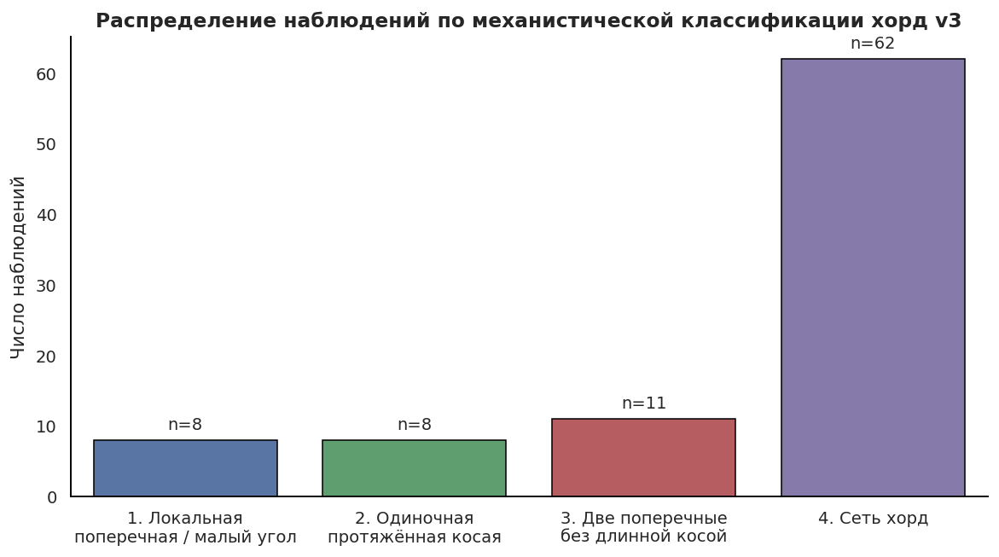

In [7]:
# ============================================================
# Figure 1. Group sizes
# ============================================================

group_counts = (
    df_v3[ARCH_GROUP_COL]
    .value_counts()
    .reindex(ARCH_GROUP_ORDER)
    .rename_axis("group")
    .reset_index(name="n")
)

group_counts["group_label"] = group_counts["group"].map(ARCH_GROUP_LABELS_RU)

fig, ax = plt.subplots(figsize=(8.5, 4.8))

sns.barplot(
    data=group_counts,
    x="group_label",
    y="n",
    order=[ARCH_GROUP_LABELS_RU[g] for g in ARCH_GROUP_ORDER],
    palette=[ARCH_PALETTE[g] for g in ARCH_GROUP_ORDER],
    ax=ax,
    edgecolor="black",
    linewidth=0.8,
)

for i, row in group_counts.iterrows():
    ax.text(i, row["n"] + 1, f"n={row['n']}", ha="center", va="bottom", fontsize=10)

ax.set_title("Распределение наблюдений по механистической классификации хорд v3")
ax.set_xlabel("")
ax.set_ylabel("Число наблюдений")
ax.tick_params(axis="x", rotation=0)

sns.despine(ax=ax)
plt.tight_layout()

fig.savefig(FIGURES_DIR / "19_fig01_v3_group_sizes.png", bbox_inches="tight")
plt.show()

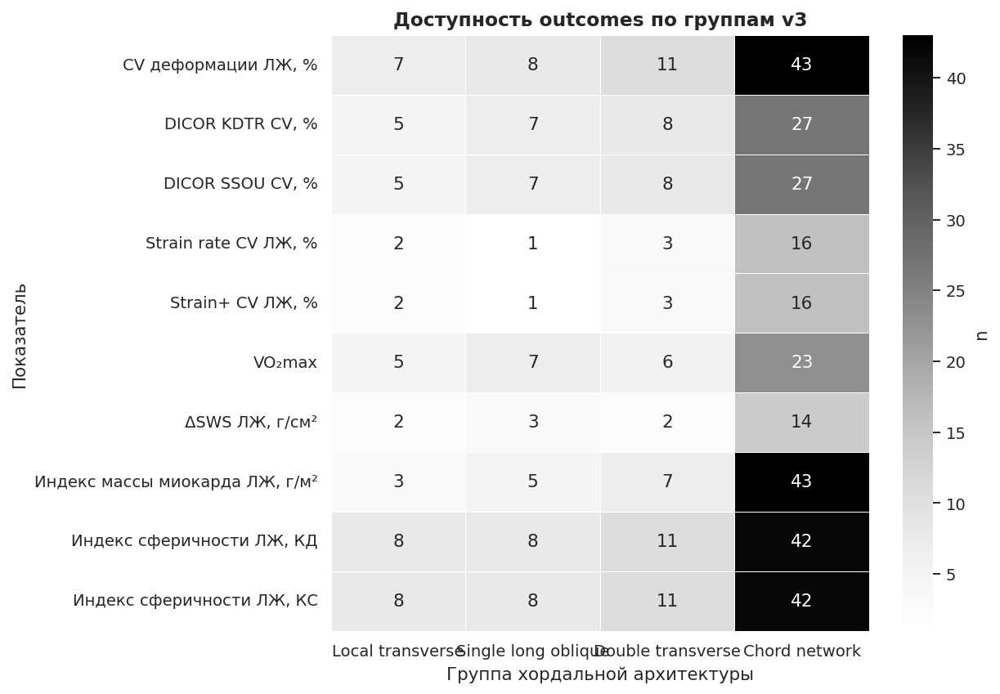

In [8]:
# ============================================================
# Figure 2. Outcome availability heatmap
# ============================================================

availability_pivot = availability_df.pivot_table(
    index="outcome_label_ru",
    columns="group_label",
    values="n_non_missing",
    aggfunc="sum",
)

availability_pivot = availability_pivot[[ARCH_GROUP_LABELS_SHORT[g] for g in ARCH_GROUP_ORDER]]

fig, ax = plt.subplots(figsize=(9.0, 6.2))

sns.heatmap(
    availability_pivot,
    annot=True,
    fmt=".0f",
    cmap="Greys",
    cbar_kws={"label": "n"},
    linewidths=0.5,
    linecolor="white",
    ax=ax,
)

ax.set_title("Доступность outcomes по группам v3")
ax.set_xlabel("Группа хордальной архитектуры")
ax.set_ylabel("Показатель")

plt.tight_layout()
fig.savefig(FIGURES_DIR / "19_fig02_outcome_availability_heatmap.png", bbox_inches="tight")
plt.show()


In [9]:
# ============================================================
# Descriptive statistics and distribution shape
# ============================================================

desc_rows = []

for outcome in OUTCOMES:
    for group in ARCH_GROUP_ORDER:
        values = (
            df_v3.loc[df_v3[ARCH_GROUP_COL] == group, outcome]
            .dropna()
            .astype(float)
        )

        if len(values) == 0:
            continue

        q1, q3 = np.percentile(values, [25, 75])
        iqr = q3 - q1

        desc_rows.append({
            "outcome": outcome,
            "outcome_label_ru": OUTCOME_INFO[outcome]["label_ru"],
            "group": group,
            "group_label": ARCH_GROUP_LABELS_SHORT[group],
            "n": len(values),
            "mean": values.mean(),
            "std": values.std(ddof=1) if len(values) > 1 else np.nan,
            "median": np.median(values),
            "q1": q1,
            "q3": q3,
            "iqr": iqr,
            "min": values.min(),
            "max": values.max(),
            "skew": stats.skew(values, bias=False) if len(values) > 2 else np.nan,
            "kurtosis": stats.kurtosis(values, bias=False) if len(values) > 3 else np.nan,
        })

desc_df = pd.DataFrame(desc_rows)

display(desc_df)

desc_df.to_excel(
    TABLES_DIR / "19_descriptive_statistics_by_v3_group.xlsx",
    index=False
)


# ------------------------------------------------------------
# Общая проверка распределения outcomes без привязки к группам
# Не используем её как основание для выбора модели: выбор уже сделан
# в пользу robust Student-t из-за малых n, асимметрии и выбросов.
# ------------------------------------------------------------

shape_rows = []

for outcome in OUTCOMES:
    values = df_v3[outcome].dropna().astype(float)

    if len(values) < 3:
        continue

    shape_rows.append({
        "outcome": outcome,
        "outcome_label_ru": OUTCOME_INFO[outcome]["label_ru"],
        "n": len(values),
        "median": np.median(values),
        "mad": stats.median_abs_deviation(values, scale="normal"),
        "skew": stats.skew(values, bias=False),
        "kurtosis": stats.kurtosis(values, bias=False),
        "shapiro_p": stats.shapiro(values).pvalue if 3 <= len(values) <= 5000 else np.nan,
    })

shape_df = pd.DataFrame(shape_rows)

display(shape_df)

shape_df.to_excel(
    TABLES_DIR / "19_distribution_shape_outcomes.xlsx",
    index=False
)

,outcome,outcome_label_ru,group,group_label,n,mean,std,median,q1,q3,iqr,min,max,skew,kurtosis
0,echo_lv_sphericity_index_end_diastolic_ratio,"Индекс сферичности ЛЖ, КД",1_Local_transverse_or_low_angle,Local transverse,8,0.521500,0.070993,0.519000,0.453500,0.560000,0.106500,0.448000,0.642000,0.543414,-0.717100
1,echo_lv_sphericity_index_end_diastolic_ratio,"Индекс сферичности ЛЖ, КД",2_Single_long_oblique_bridge,Single long oblique,8,0.517500,0.093263,0.546500,0.464750,0.588250,0.123500,0.343000,0.610000,-0.964695,0.124477
2,echo_lv_sphericity_index_end_diastolic_ratio,"Индекс сферичности ЛЖ, КД",3_Double_transverse_no_long_oblique,Double transverse,11,0.540364,0.071093,0.538000,0.482500,0.570500,0.088000,0.469000,0.709000,1.323546,2.184313
3,echo_lv_sphericity_index_end_diastolic_ratio,"Индекс сферичности ЛЖ, КД",4_Chord_network,Chord network,42,0.521833,0.071676,0.511500,0.469000,0.587500,0.118500,0.370000,0.689000,0.188867,-0.562488
4,echo_lv_sphericity_index_end_systolic_ratio,"Индекс сферичности ЛЖ, КС",1_Local_transverse_or_low_angle,Local transverse,8,0.475125,0.091764,0.457000,0.408250,0.564750,0.156500,0.353000,0.590000,0.080457,-1.997219
5,echo_lv_sphericity_index_end_systolic_ratio,"Индекс сферичности ЛЖ, КС",2_Single_long_oblique_bridge,Single long oblique,8,0.454250,0.085737,0.466000,0.393750,0.483250,0.089500,0.328000,0.610000,0.425837,0.692564
6,echo_lv_sphericity_index_end_systolic_ratio,"Индекс сферичности ЛЖ, КС",3_Double_transverse_no_long_oblique,Double transverse,11,0.466636,0.077831,0.450000,0.409000,0.516000,0.107000,0.336000,0.590000,0.108875,-0.653930
7,echo_lv_sphericity_index_end_systolic_ratio,"Индекс сферичности ЛЖ, КС",4_Chord_network,Chord network,42,0.472738,0.085505,0.479000,0.394750,0.548750,0.154000,0.345000,0.600000,0.037691,-1.419397
8,echo_lv_myocardial_mass_index_g_m2,"Индекс массы миокарда ЛЖ, г/м²",1_Local_transverse_or_low_angle,Local transverse,3,65.000000,10.440307,60.000000,59.000000,68.500000,9.500000,58.000000,77.000000,1.660818,NaN
9,echo_lv_myocardial_mass_index_g_m2,"Индекс массы миокарда ЛЖ, г/м²",2_Single_long_oblique_bridge,Single long oblique,5,96.400000,19.578049,97.000000,92.000000,106.000000,14.000000,67.000000,120.000000,-0.636758,1.071256


,outcome,outcome_label_ru,n,median,mad,skew,kurtosis,shapiro_p
0,echo_lv_sphericity_index_end_diastolic_ratio,"Индекс сферичности ЛЖ, КД",69,0.516000,0.080061,0.115877,-0.154788,4.623342e-01
1,echo_lv_sphericity_index_end_systolic_ratio,"Индекс сферичности ЛЖ, КС",69,0.472000,0.106747,0.091675,-1.265843,3.433145e-03
2,echo_lv_myocardial_mass_index_g_m2,"Индекс массы миокарда ЛЖ, г/м²",58,76.000000,13.343420,1.413349,2.967606,1.842412e-04
3,echo_lv_sws_delta_g_cm2,"ΔSWS ЛЖ, г/см²",21,23.793374,17.531689,3.259671,13.029670,4.828242e-06
4,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",69,26.173717,10.936285,1.166195,2.022633,2.890538e-04
5,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",47,16.826395,10.388045,2.351473,6.538944,1.310490e-07
6,dicor_ssou_cv_pct,"DICOR SSOU CV, %",47,24.390348,11.137051,1.041767,0.408356,4.718464e-04
7,echo_lv_strain_plus_cv_pct,"Strain+ CV ЛЖ, %",22,21.514719,10.973815,0.991772,0.350941,4.412445e-02
8,echo_lv_strain_rate_cv_pct,"Strain rate CV ЛЖ, %",22,35.468431,14.139215,2.179921,5.587183,1.927667e-04
9,vo2_max_absolute_ml_min,VO₂max,41,46.550000,11.934948,-0.059905,-1.129098,2.129227e-03


In [10]:
# ============================================================
# Academic EDA plotting functions
# ============================================================


def safe_filename(text):
    text = re.sub(r"[^\w\-_\. ]", "_", str(text))
    text = text.replace(" ", "_")
    return text


def get_outcome_label(outcome):
    info = OUTCOME_INFO.get(outcome, {})
    label = info.get("label_ru", outcome)
    unit = info.get("unit", "")
    if unit and unit not in ["ratio", "check_units"]:
        return f"{label}, {unit}"
    return label


def plot_violin_box_points(data, outcome, save=True):
    d = data[[ARCH_GROUP_COL, outcome]].dropna().copy()
    d["group_label"] = d[ARCH_GROUP_COL].map(ARCH_GROUP_LABELS_RU)

    if d.empty:
        print(f"Skip {outcome}: no data")
        return

    order_labels = [ARCH_GROUP_LABELS_RU[g] for g in ARCH_GROUP_ORDER]

    fig, ax = plt.subplots(figsize=(9.2, 5.4))

    sns.violinplot(
        data=d,
        x="group_label",
        y=outcome,
        order=order_labels,
        palette=[ARCH_PALETTE[g] for g in ARCH_GROUP_ORDER],
        inner=None,
        cut=0,
        linewidth=0.8,
        ax=ax,
    )

    sns.boxplot(
        data=d,
        x="group_label",
        y=outcome,
        order=order_labels,
        width=0.22,
        showcaps=True,
        boxprops={"facecolor": "white", "edgecolor": "black", "linewidth": 1.0},
        whiskerprops={"color": "black", "linewidth": 1.0},
        medianprops={"color": "black", "linewidth": 1.3},
        showfliers=False,
        ax=ax,
    )

    sns.stripplot(
        data=d,
        x="group_label",
        y=outcome,
        order=order_labels,
        color="black",
        size=3.5,
        jitter=0.18,
        alpha=0.65,
        ax=ax,
    )

    # n над группами
    ymax = d[outcome].max()
    ymin = d[outcome].min()
    y_range = ymax - ymin if ymax > ymin else 1

    for i, group in enumerate(ARCH_GROUP_ORDER):
        n = d.loc[d[ARCH_GROUP_COL] == group, outcome].notna().sum()
        ax.text(i, ymax + 0.04 * y_range, f"n={n}", ha="center", fontsize=9)

    ax.set_title(f"{get_outcome_label(outcome)} по группам v3")
    ax.set_xlabel("")
    ax.set_ylabel(get_outcome_label(outcome))
    ax.tick_params(axis="x", rotation=0)

    sns.despine(ax=ax)
    plt.tight_layout()

    if save:
        fig.savefig(
            FIGURES_DIR / f"19_eda_violin_box_points_{safe_filename(outcome)}.png",
            bbox_inches="tight",
        )

    plt.show()


def plot_ecdf(data, outcome, save=True):
    d = data[[ARCH_GROUP_COL, outcome]].dropna().copy()
    if d.empty:
        print(f"Skip {outcome}: no data")
        return

    fig, ax = plt.subplots(figsize=(8.4, 5.0))

    for group in ARCH_GROUP_ORDER:
        values = d.loc[d[ARCH_GROUP_COL] == group, outcome].dropna().values
        if len(values) == 0:
            continue
        values = np.sort(values)
        y = np.arange(1, len(values) + 1) / len(values)

        ax.step(
            values,
            y,
            where="post",
            label=f"{ARCH_GROUP_LABELS_SHORT[group]} (n={len(values)})",
            color=ARCH_PALETTE[group],
            linewidth=1.8,
        )

    ax.set_title(f"ECDF: {get_outcome_label(outcome)}")
    ax.set_xlabel(get_outcome_label(outcome))
    ax.set_ylabel("Эмпирическая накопленная вероятность")
    ax.legend(loc="best", fontsize=9)

    sns.despine(ax=ax)
    plt.tight_layout()

    if save:
        fig.savefig(FIGURES_DIR / f"19_eda_ecdf_{safe_filename(outcome)}.png", bbox_inches="tight")

    plt.show()


def plot_hist_kde(data, outcome, save=True):
    d = data[[outcome]].dropna().copy()
    if d.empty:
        print(f"Skip {outcome}: no data")
        return

    fig, ax = plt.subplots(figsize=(8.4, 5.0))

    sns.histplot(
        d[outcome],
        bins="auto",
        kde=True,
        color="0.35",
        edgecolor="white",
        linewidth=0.5,
        ax=ax,
    )

    median = d[outcome].median()
    mean = d[outcome].mean()

    ax.axvline(median, color="black", linestyle="-", linewidth=1.5, label=f"Median = {median:.2f}")
    ax.axvline(mean, color="black", linestyle="--", linewidth=1.3, label=f"Mean = {mean:.2f}")

    ax.set_title(f"Распределение: {get_outcome_label(outcome)}")
    ax.set_xlabel(get_outcome_label(outcome))
    ax.set_ylabel("Частота")
    ax.legend(loc="best", fontsize=9)

    sns.despine(ax=ax)
    plt.tight_layout()

    if save:
        fig.savefig(
            FIGURES_DIR / f"19_eda_hist_kde_{safe_filename(outcome)}.png", bbox_inches="tight"
        )

    plt.show()


def plot_qq(data, outcome, save=True):
    values = data[outcome].dropna().astype(float).values

    if len(values) < 3:
        print(f"Skip QQ {outcome}: n < 3")
        return

    fig, ax = plt.subplots(figsize=(5.4, 5.4))

    stats.probplot(values, dist="norm", plot=ax)

    ax.get_lines()[0].set_markerfacecolor("black")
    ax.get_lines()[0].set_markeredgecolor("black")
    ax.get_lines()[0].set_alpha(0.65)
    ax.get_lines()[1].set_color("black")
    ax.get_lines()[1].set_linewidth(1.2)

    ax.set_title(f"QQ plot: {get_outcome_label(outcome)}")
    ax.set_xlabel("Теоретические квантили")
    ax.set_ylabel("Наблюдаемые квантили")

    sns.despine(ax=ax)
    plt.tight_layout()

    if save:
        fig.savefig(FIGURES_DIR / f"19_eda_qq_{safe_filename(outcome)}.png", bbox_inches="tight")

    plt.show()



echo_lv_sphericity_index_end_diastolic_ratio | Индекс сферичности ЛЖ, КД


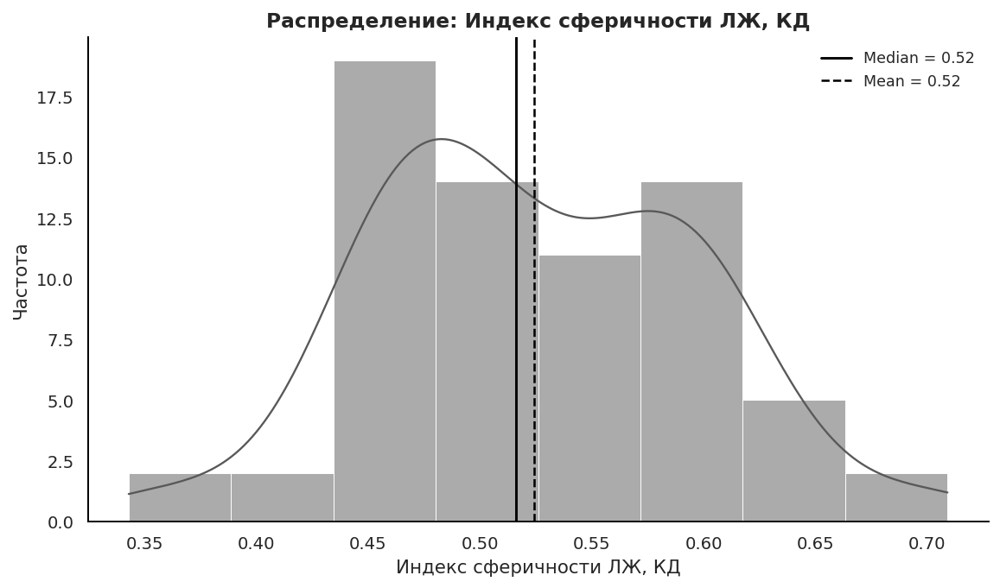

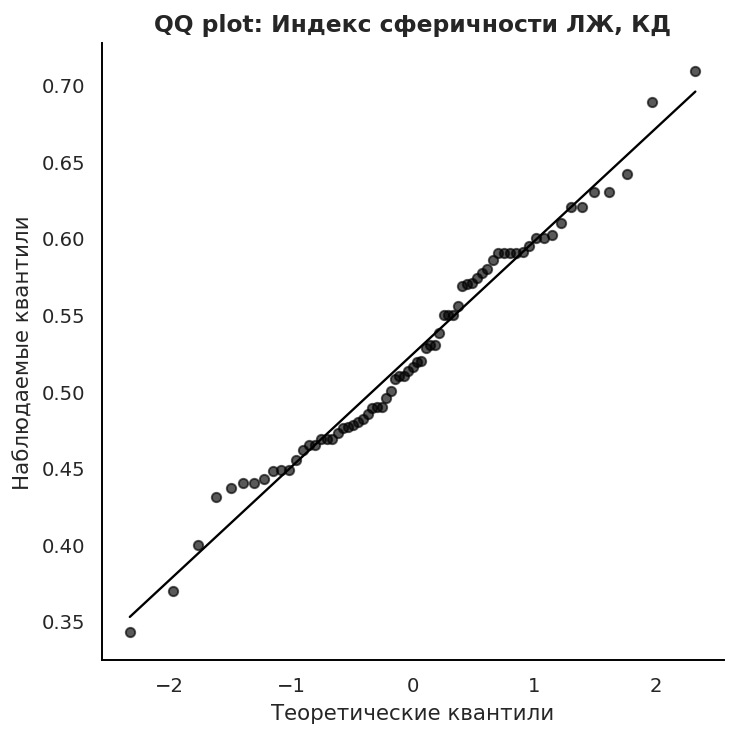

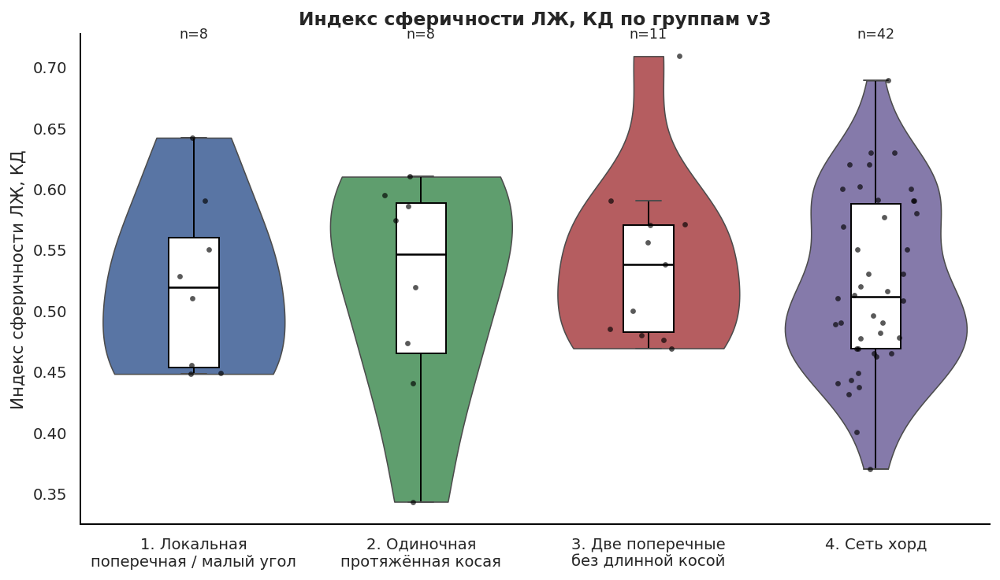

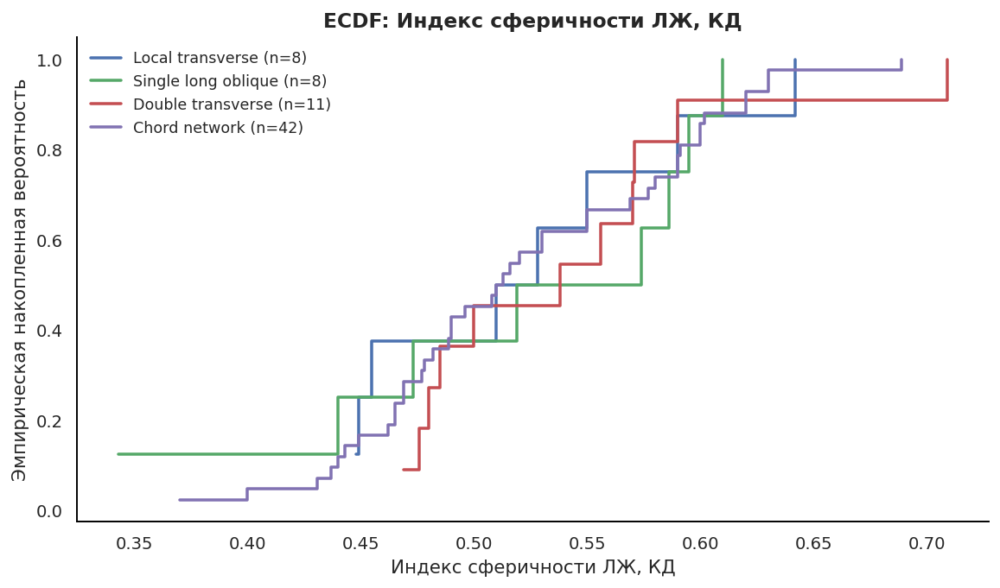


echo_lv_sphericity_index_end_systolic_ratio | Индекс сферичности ЛЖ, КС


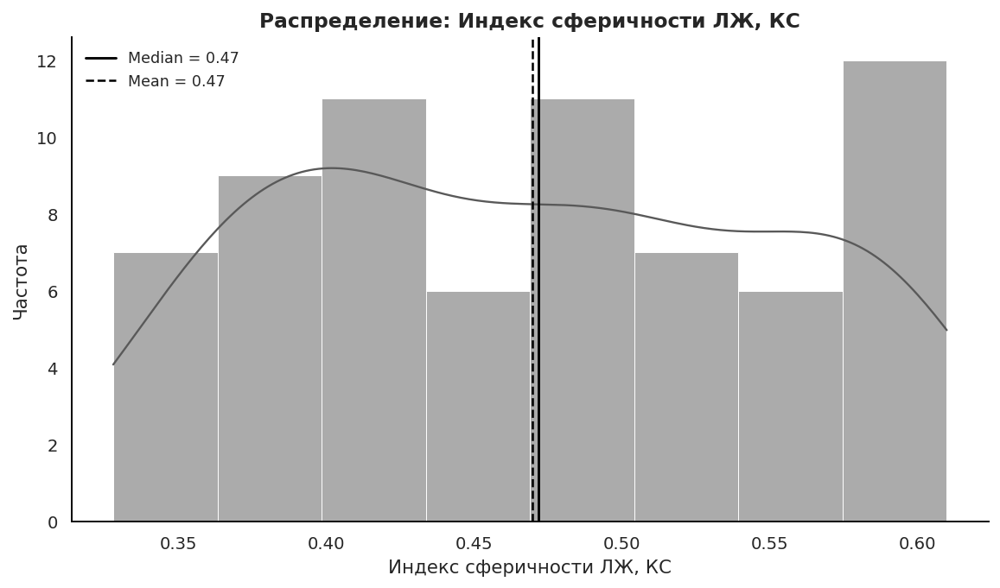

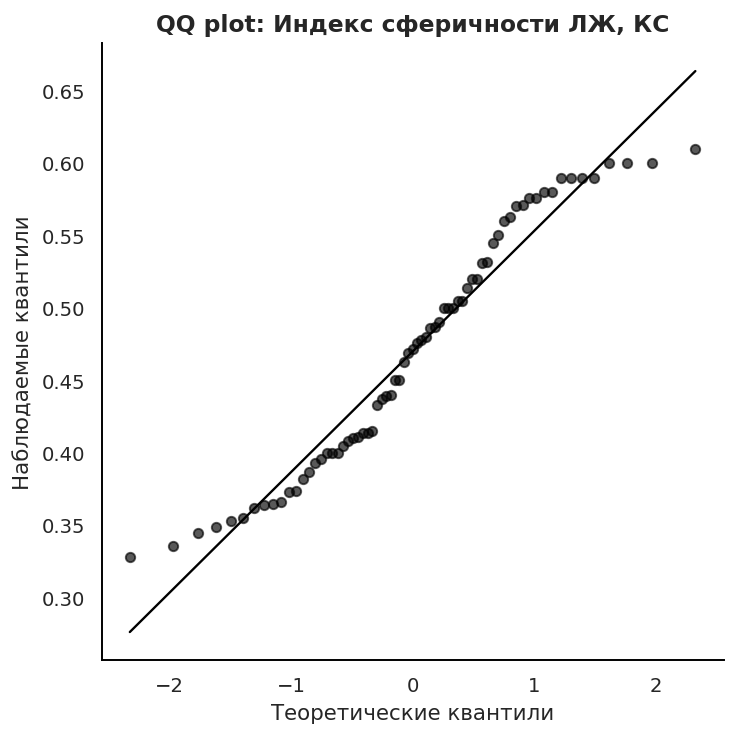

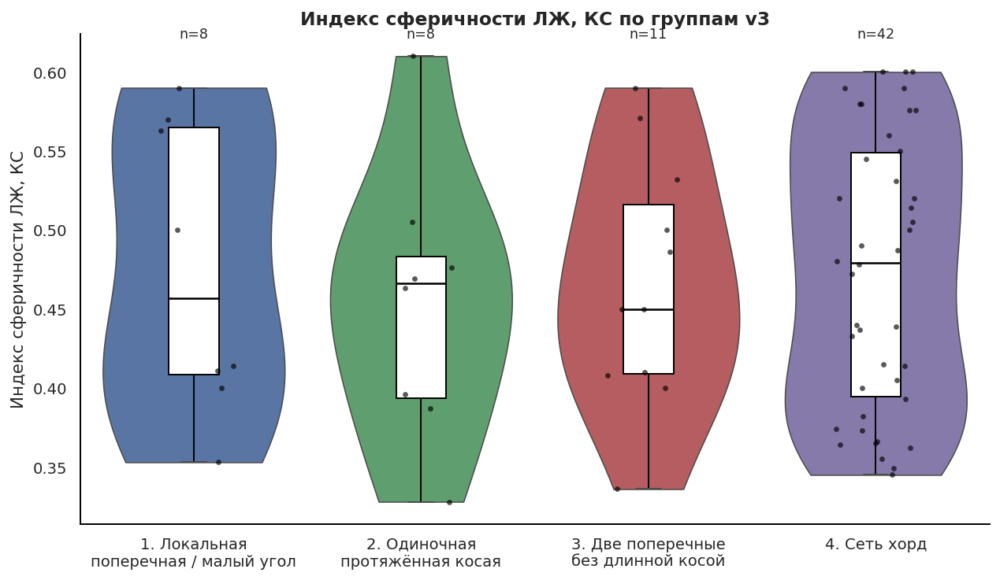

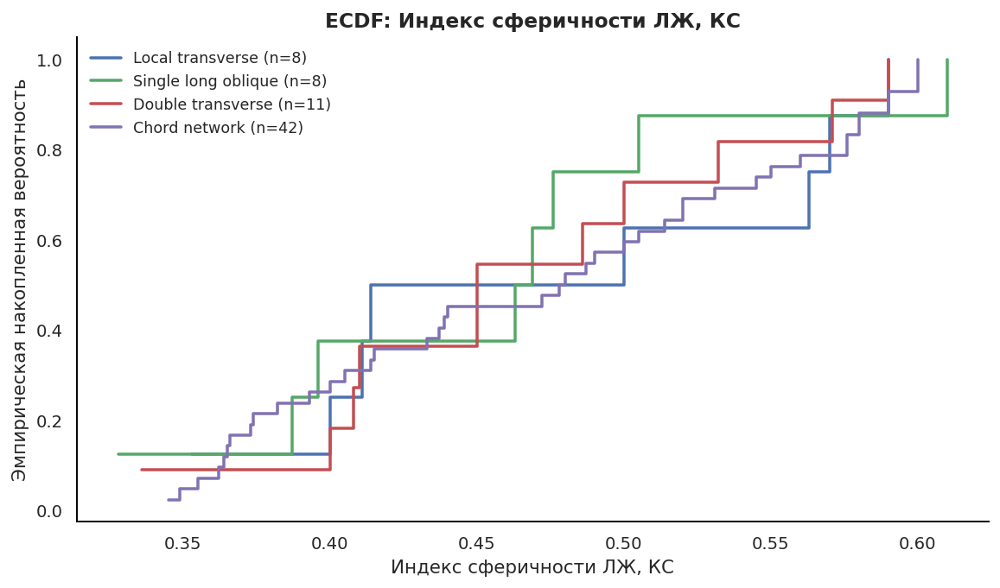


echo_lv_myocardial_mass_index_g_m2 | Индекс массы миокарда ЛЖ, г/м²


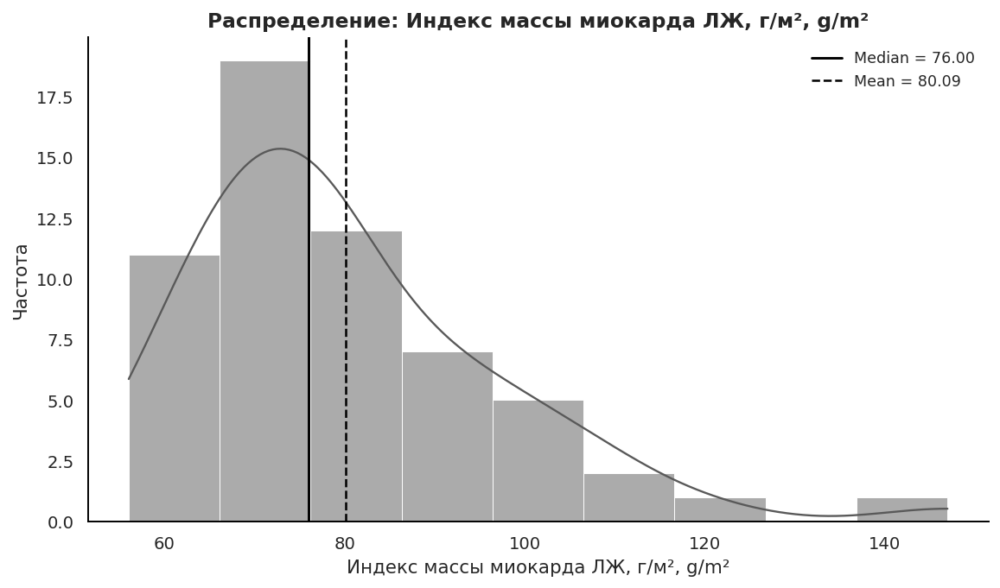

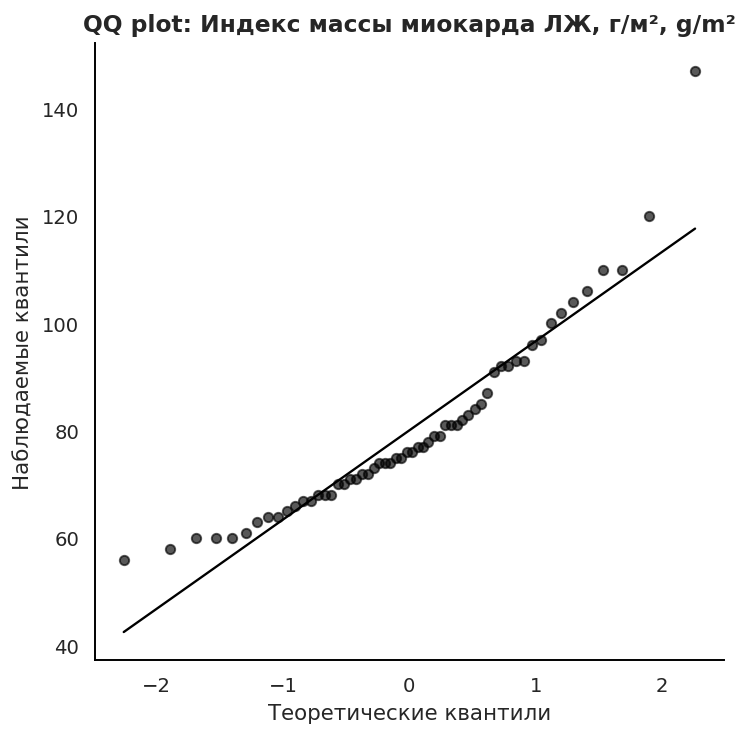

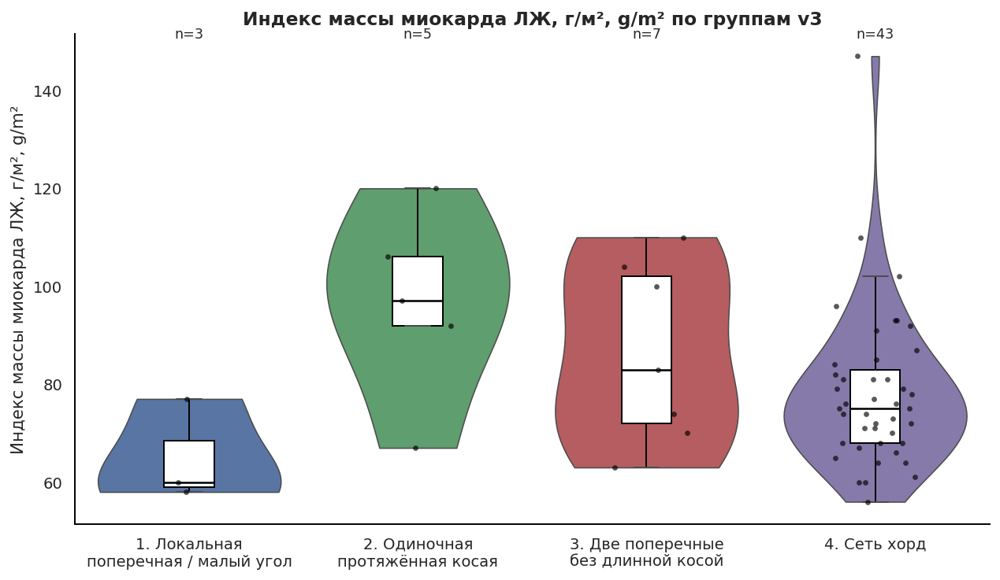

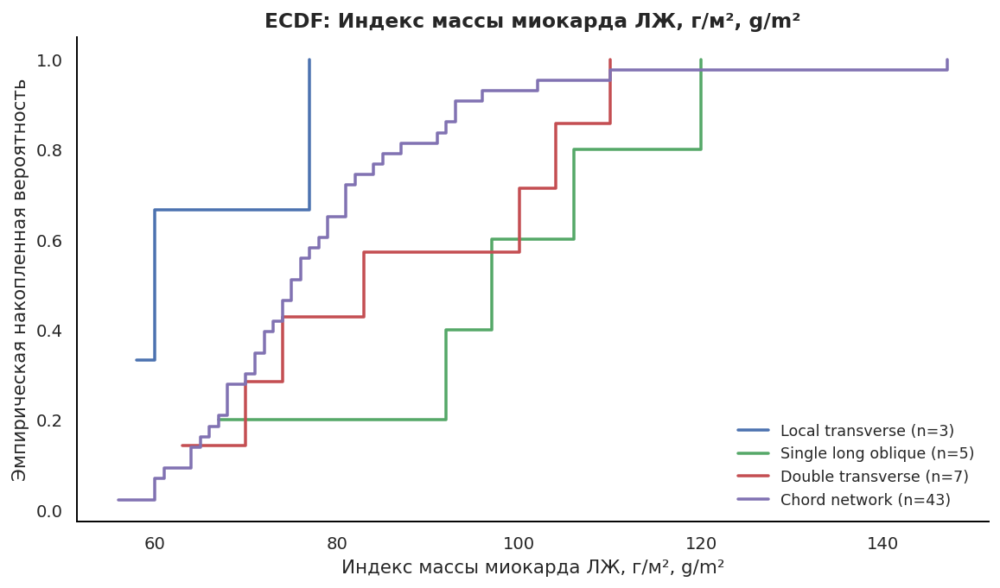


echo_lv_sws_delta_g_cm2 | ΔSWS ЛЖ, г/см²


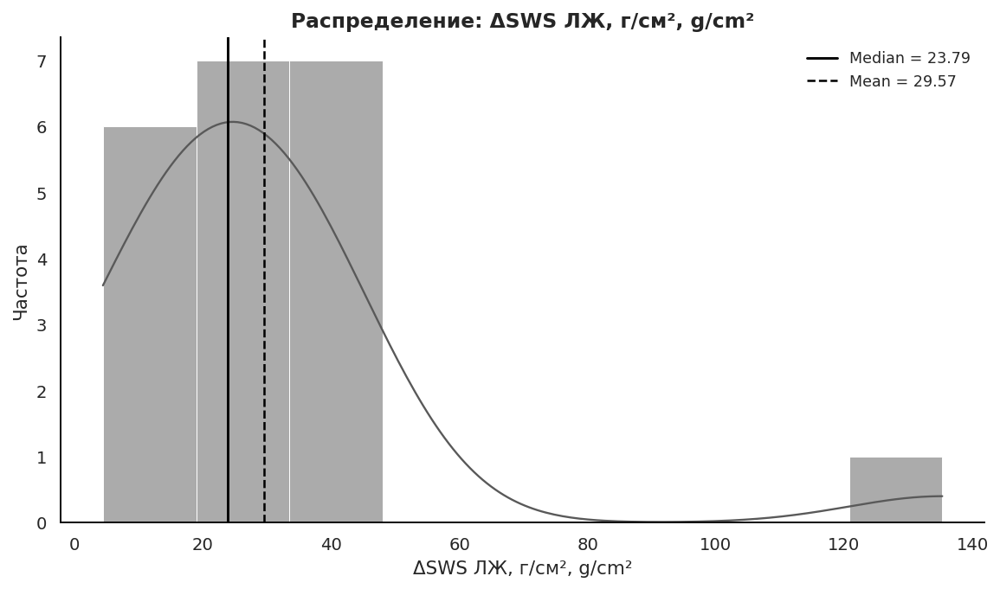

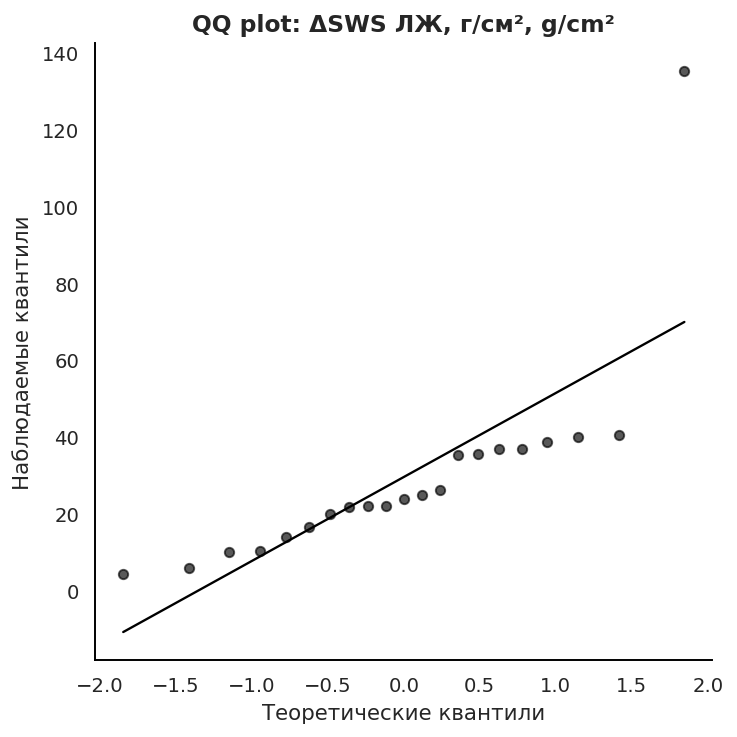

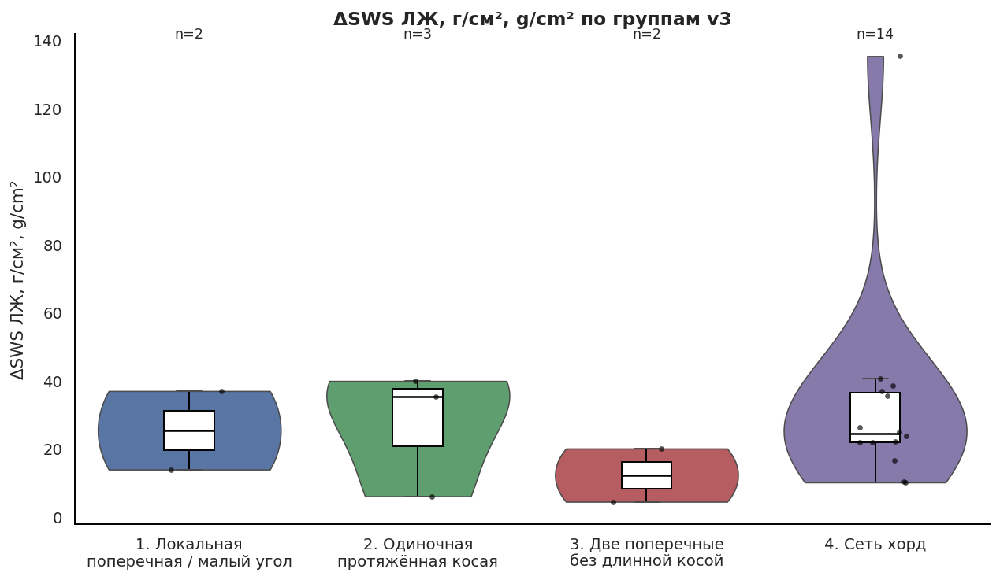

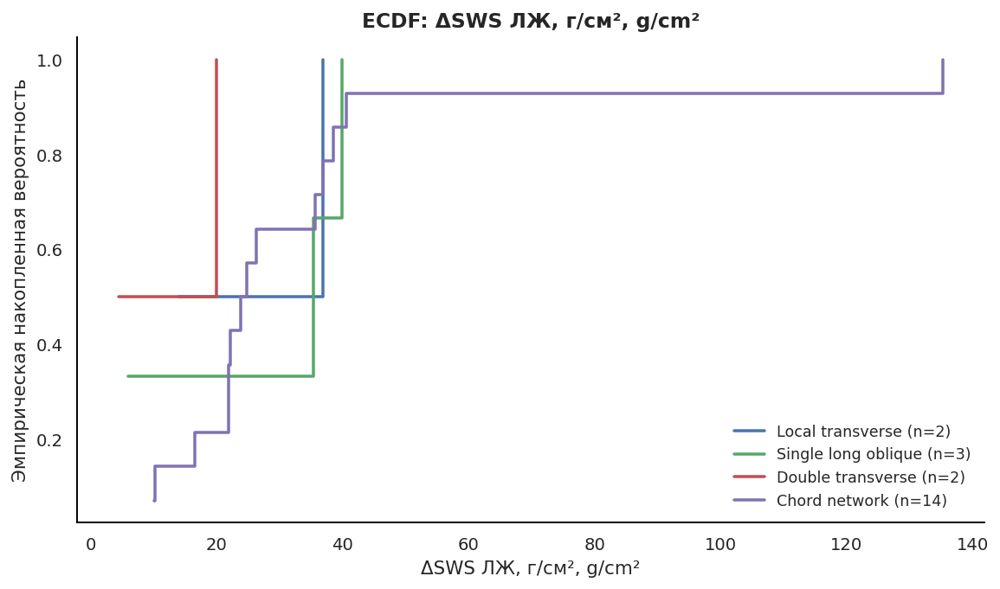


merged_lv_deformation_cv_pct | CV деформации ЛЖ, %


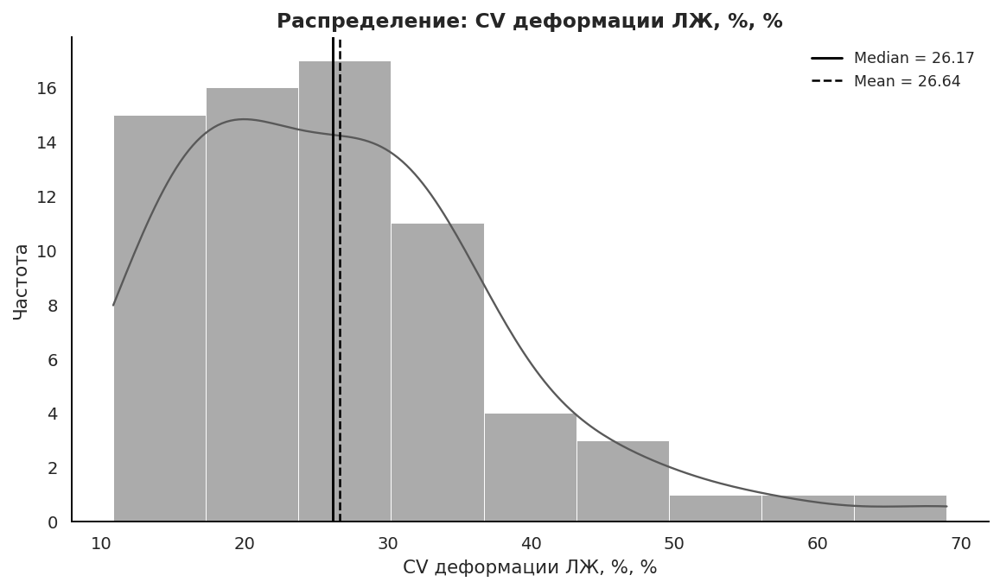

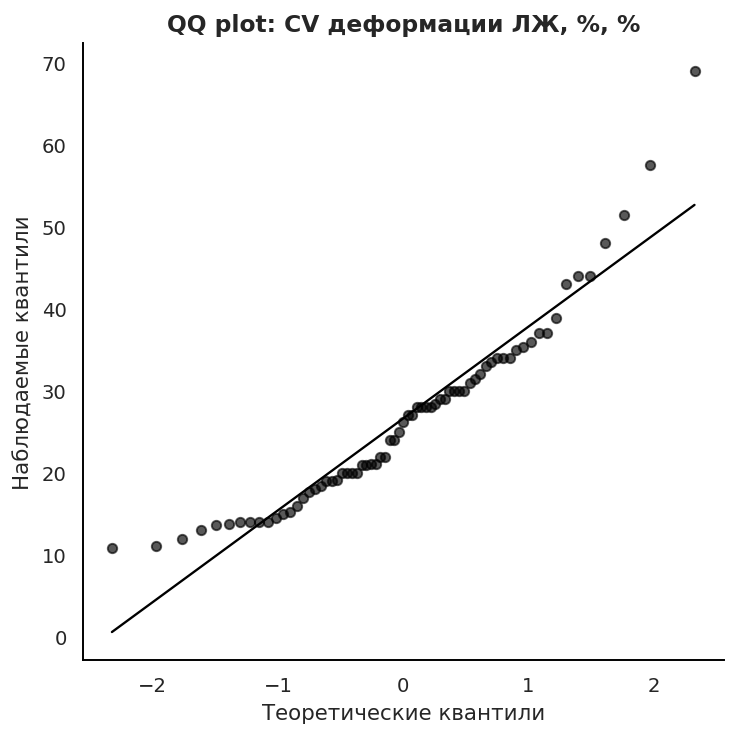

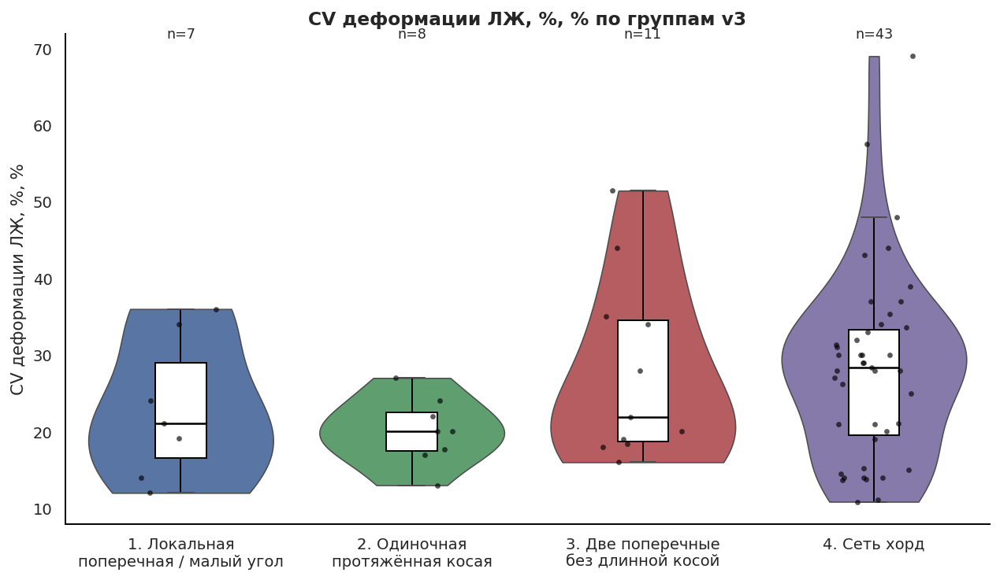

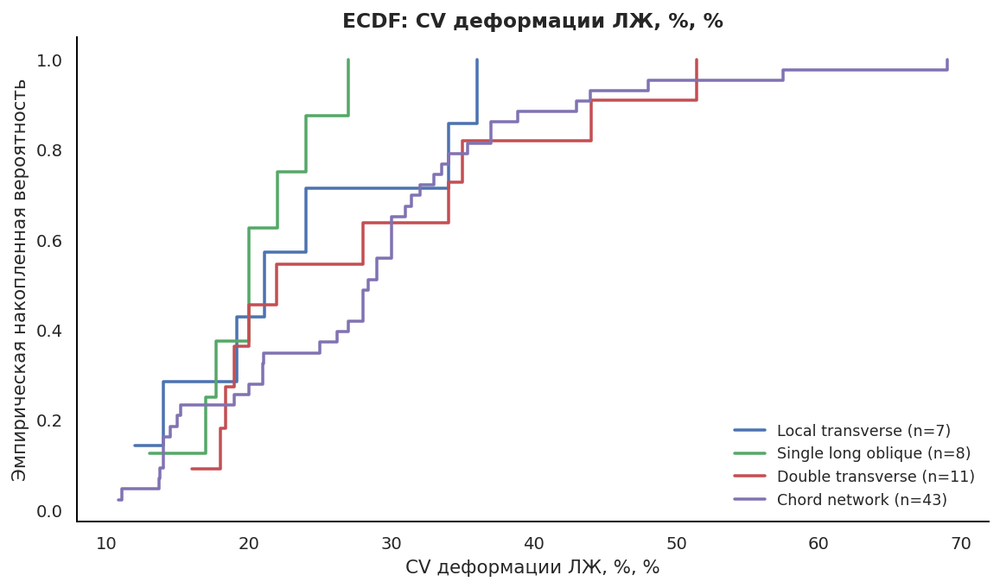


dicor_sm_kdtr_cv_pct | DICOR KDTR CV, %


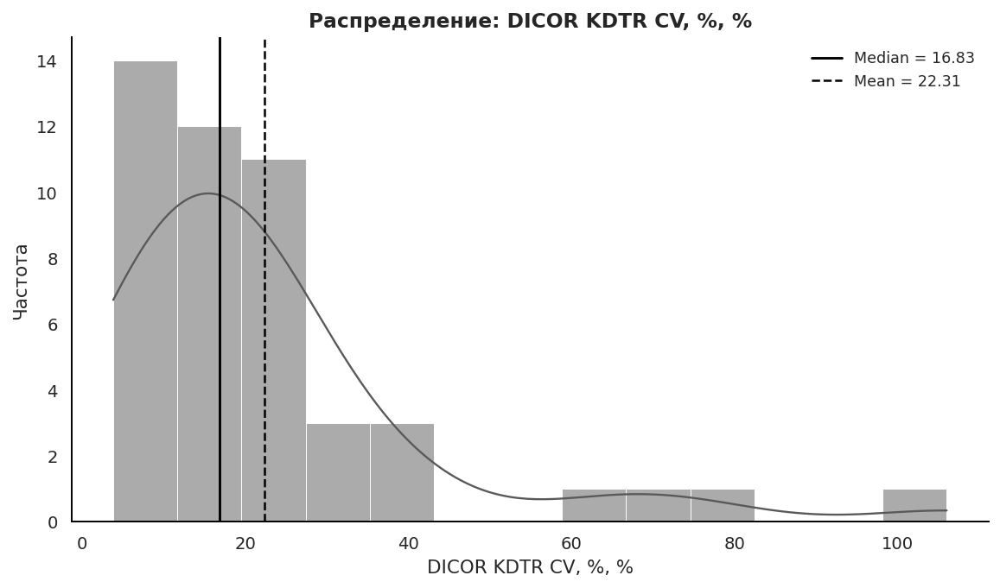

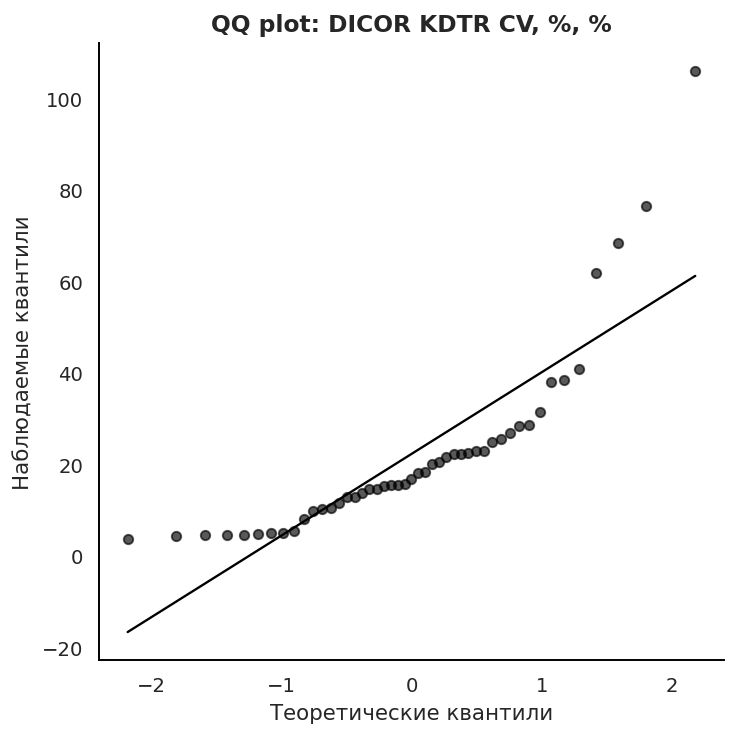

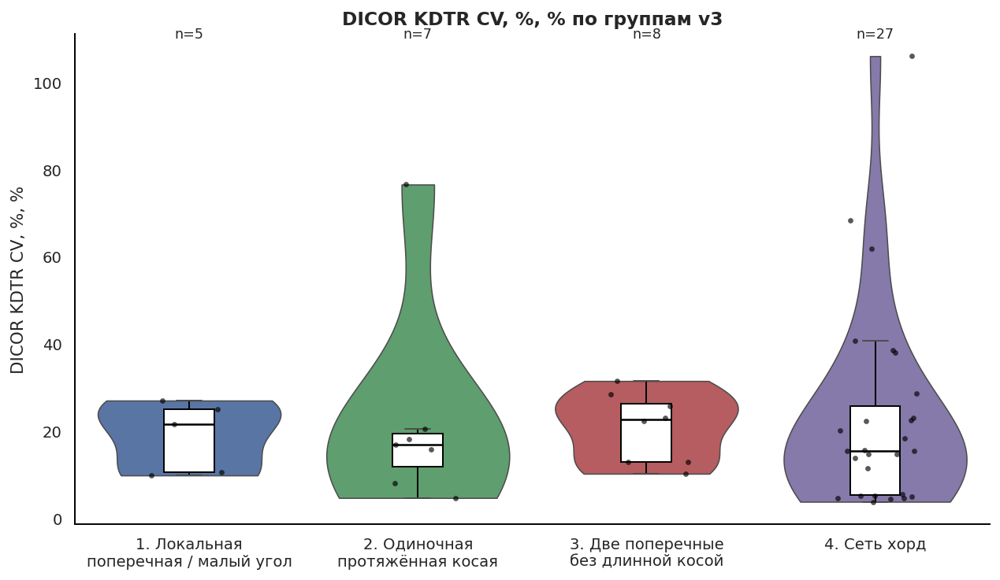

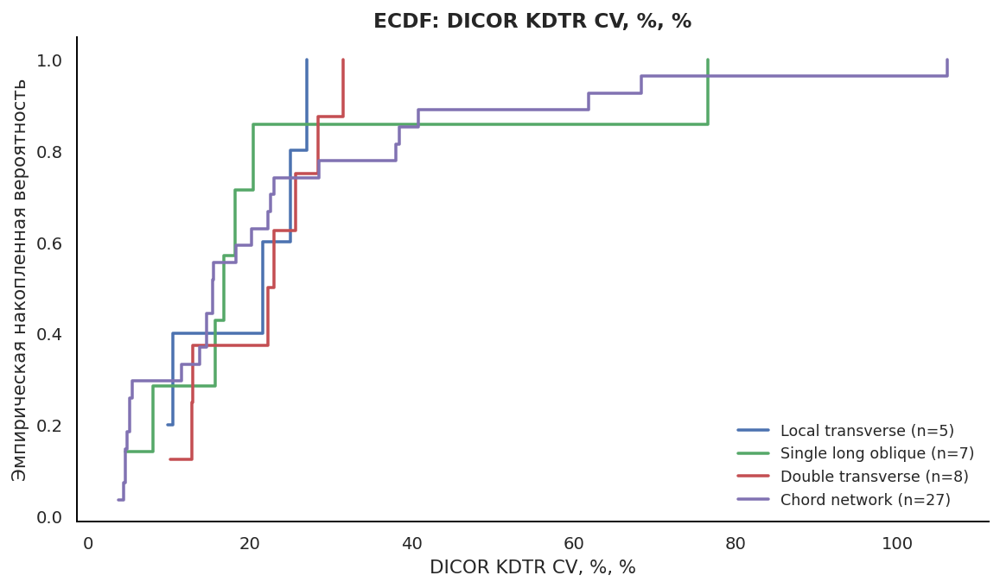


dicor_ssou_cv_pct | DICOR SSOU CV, %


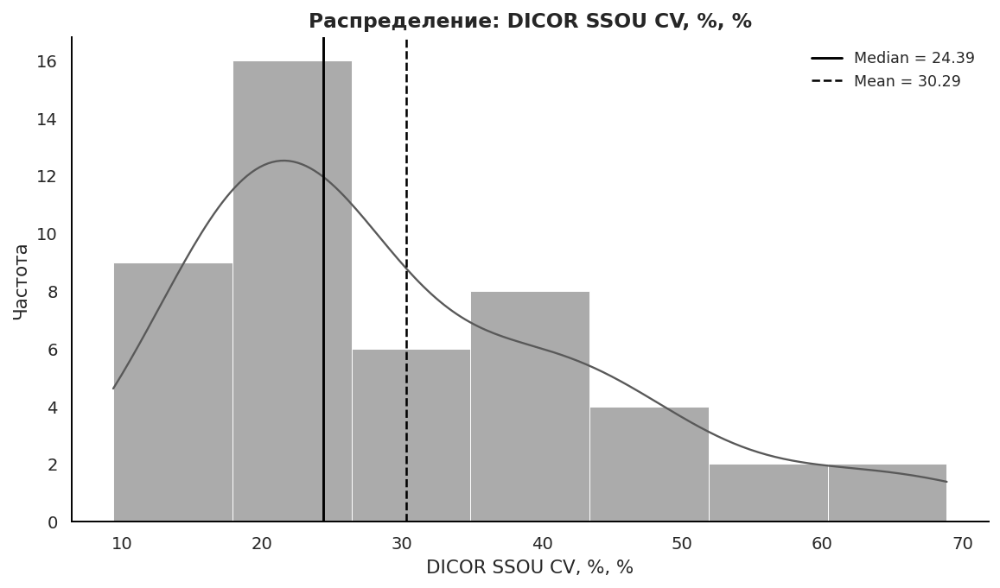

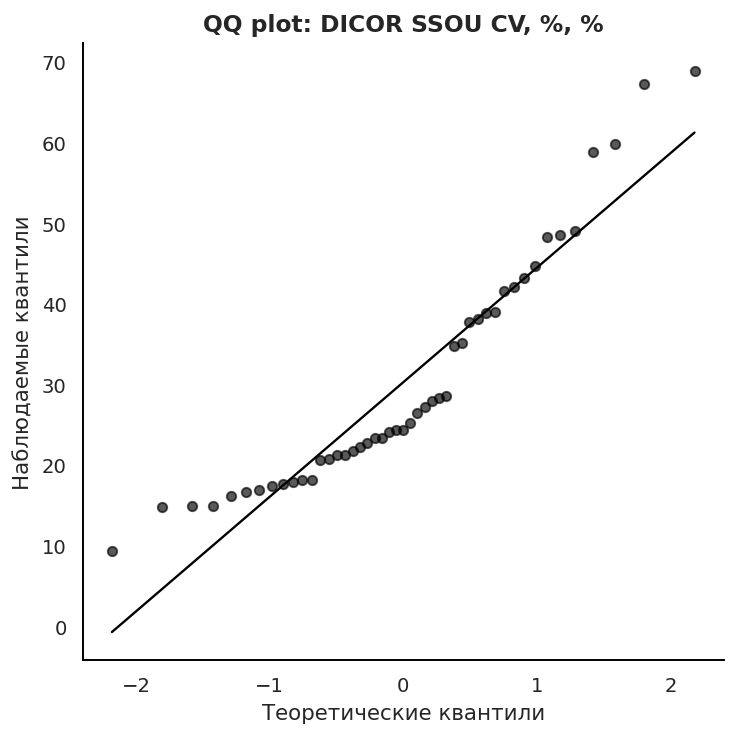

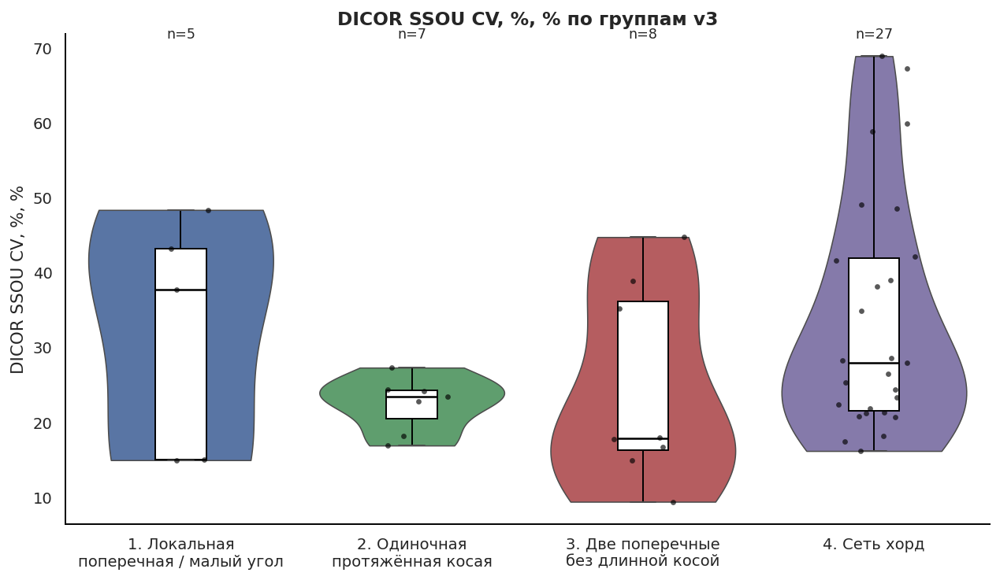

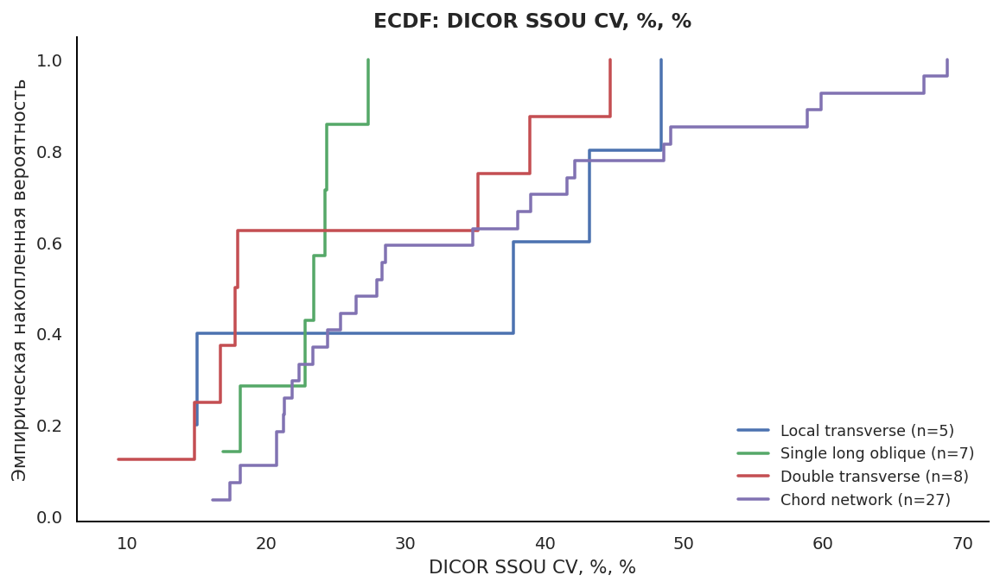


echo_lv_strain_plus_cv_pct | Strain+ CV ЛЖ, %


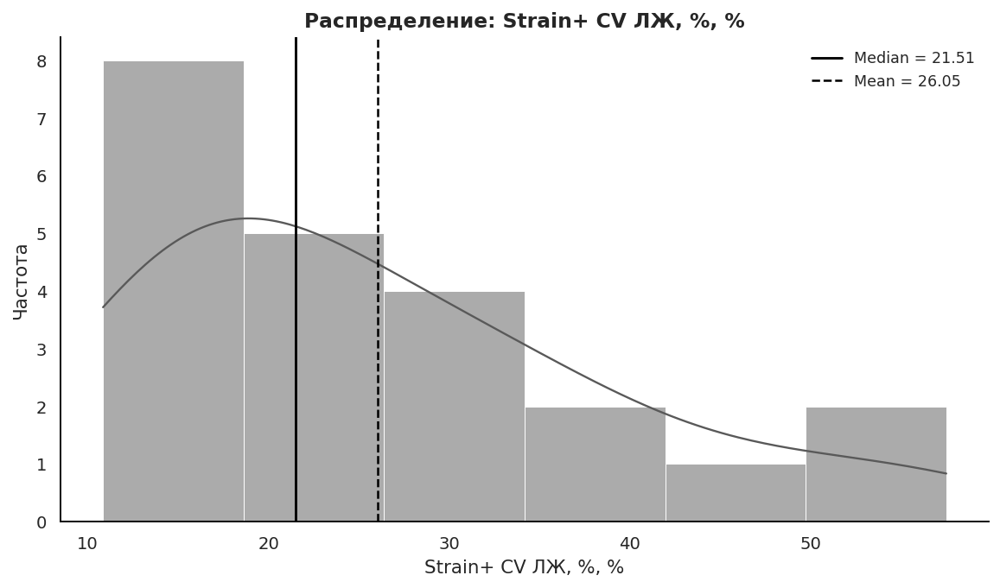

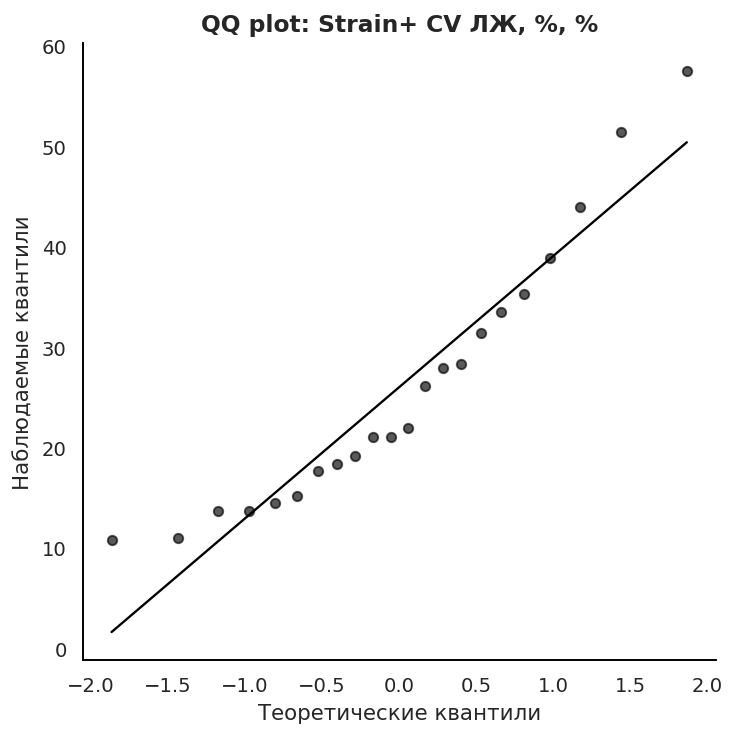

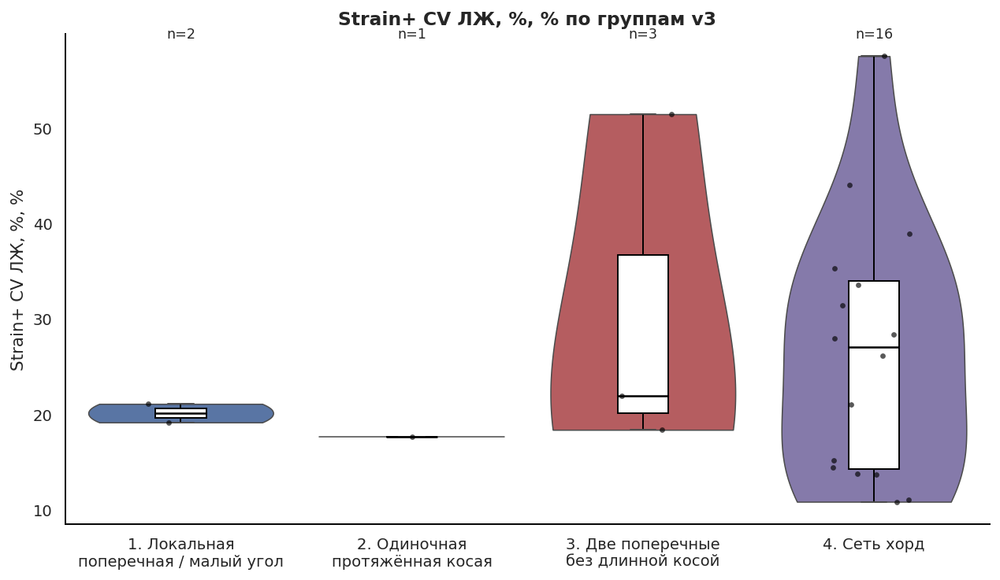

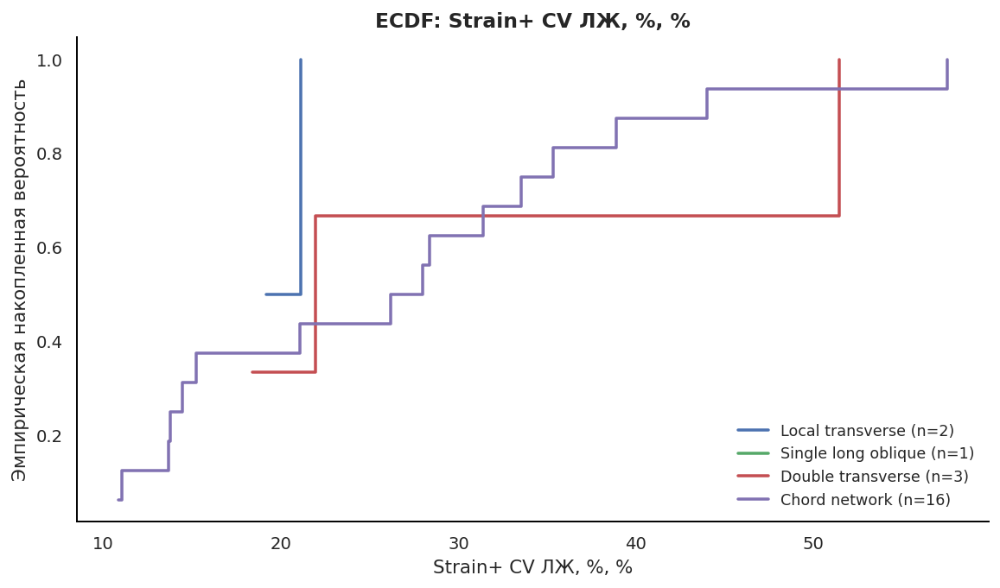


echo_lv_strain_rate_cv_pct | Strain rate CV ЛЖ, %


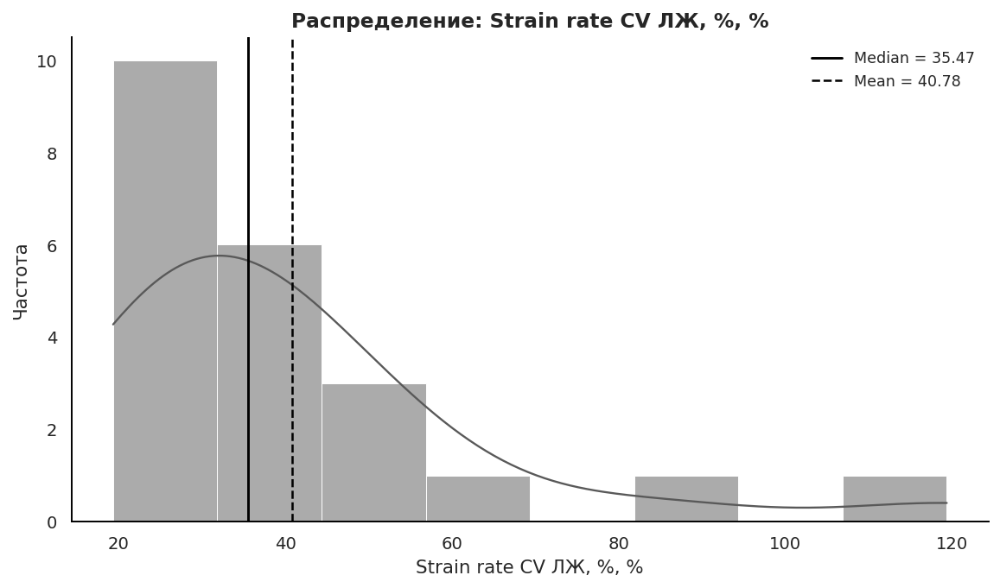

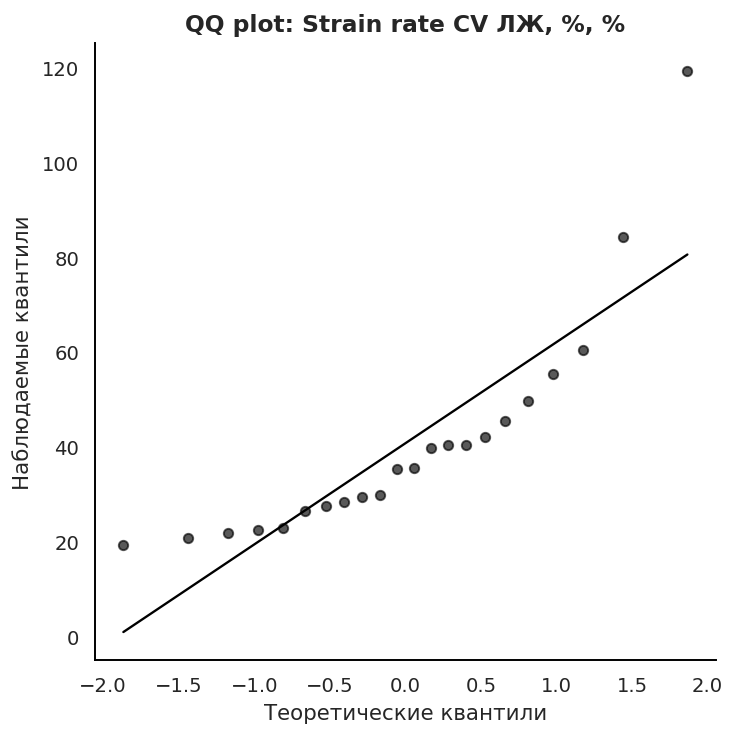

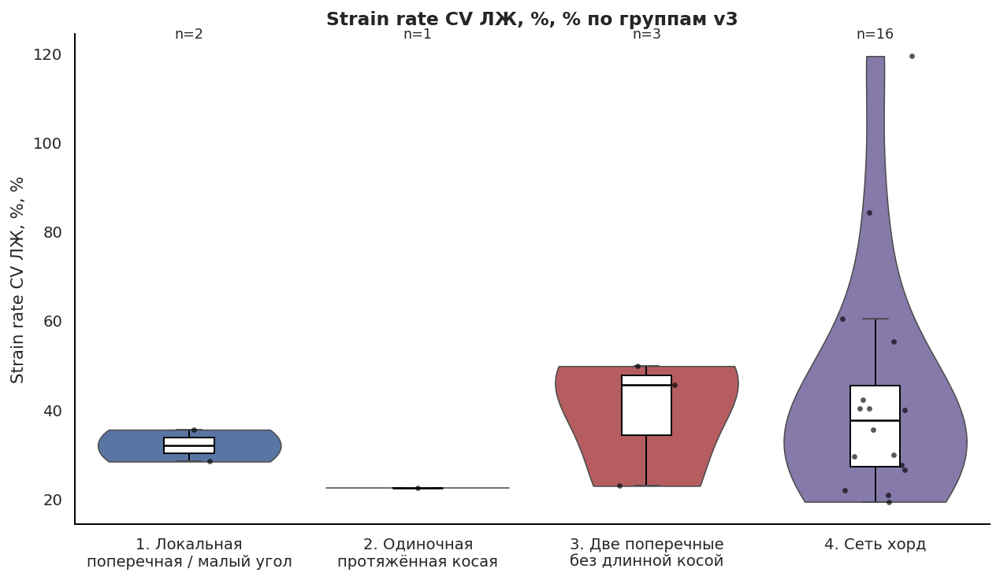

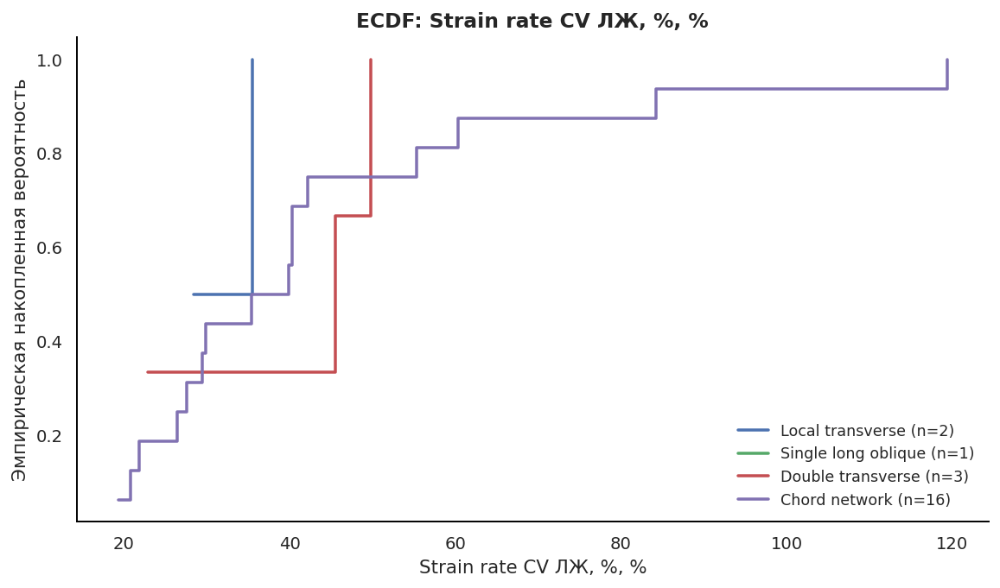


vo2_max_absolute_ml_min | VO₂max


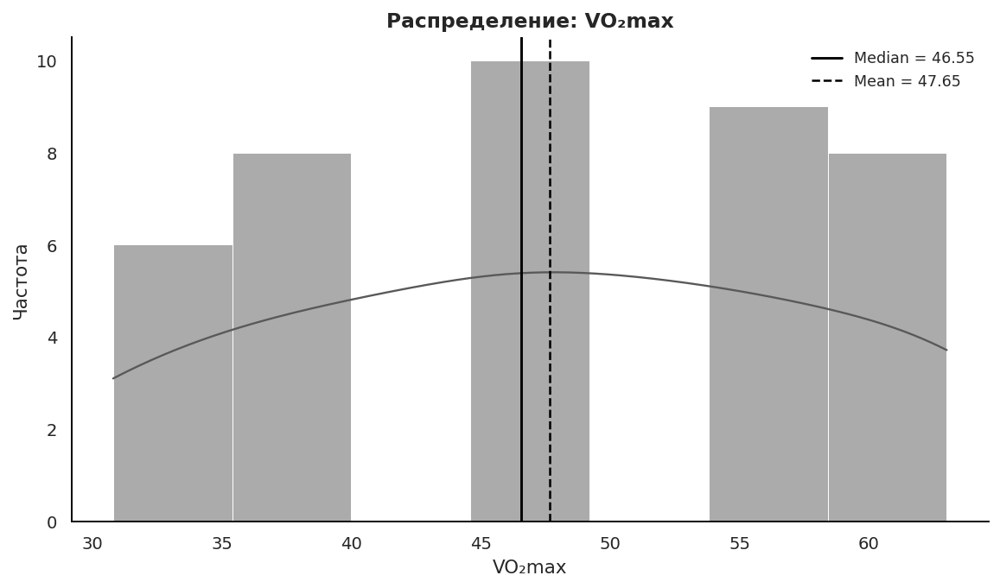

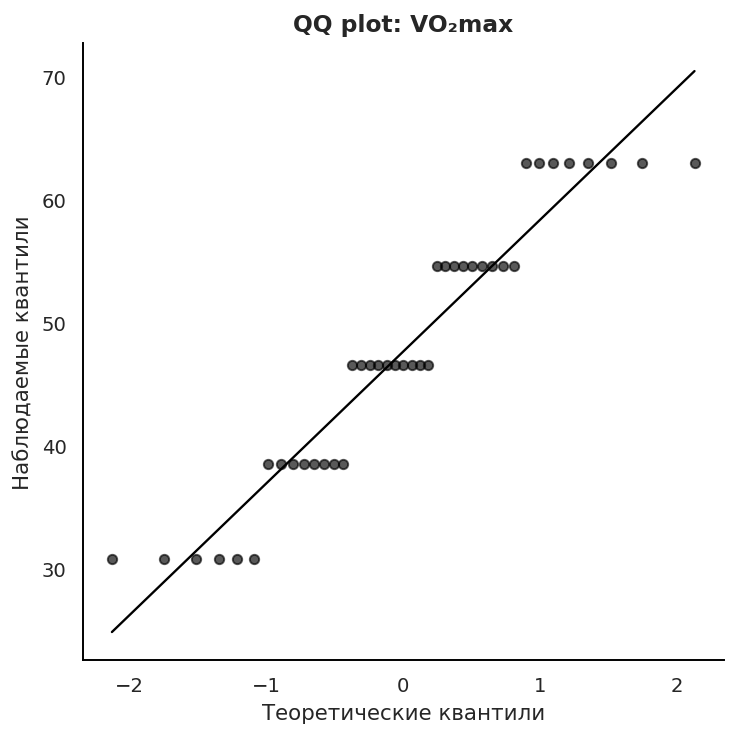

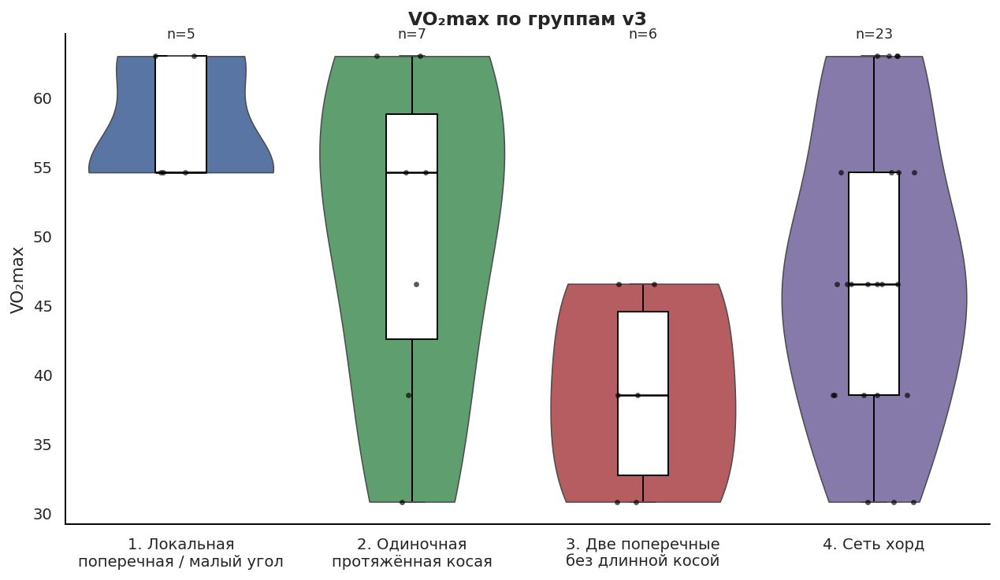

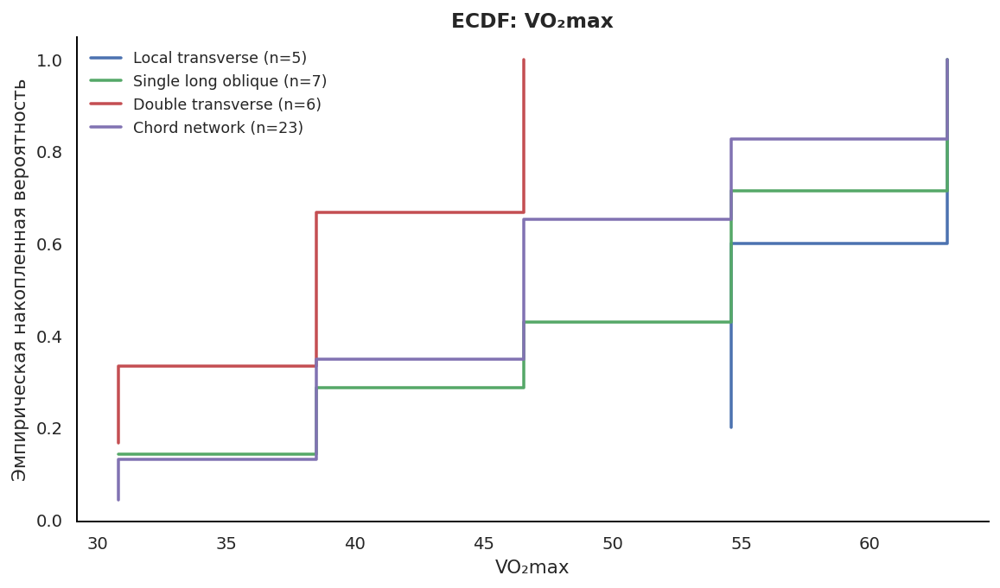

In [11]:
# ============================================================
# EDA visualizations for all available outcomes
# ============================================================

for outcome in OUTCOMES:
    print("\n" + "=" * 100)
    print(outcome, "|", OUTCOME_INFO[outcome]["label_ru"])

    plot_hist_kde(df_v3, outcome)
    plot_qq(df_v3, outcome)
    plot_violin_box_points(df_v3, outcome)
    plot_ecdf(df_v3, outcome)


## 4. Байесовская модель для групп v3

Для каждого outcome используется робастная иерархическая модель:

\[
y_i \sim StudentT(\nu, \mu_i, \sigma)
\]

\[
\mu_i = \alpha_{group[i]}
\]

\[
\alpha_g \sim Normal(\mu_\alpha, \tau_\alpha)
\]

\[
\mu_\alpha \sim Normal(0, 1)
\]

\[
\tau_\alpha \sim HalfNormal(1)
\]

\[
\sigma \sim HalfStudentT(4, 1)
\]

\[
\nu = 2 + Exponential(1/10)
\]

Почему так:

- Student-t устойчивее к выбросам и тяжелым хвостам;
- частичный pooling стабилизирует оценки малых групп;
- outcome предварительно переводится в робастную z-шкалу через median / MAD;
- затем posterior estimates возвращаются в исходные единицы измерения.

Для VO₂max используется adjusted model:

\[
\mu_i = \alpha_{group[i]} + \beta_{sex} sex_i + \beta_{age} age_i + \beta_{BSA} BSA_i
\]

In [12]:
# ============================================================
# Robust scaling helpers
# ============================================================

def robust_center_scale(x):
    x = pd.Series(x).astype(float)
    center = np.nanmedian(x)
    scale = stats.median_abs_deviation(x.dropna(), scale="normal")

    if not np.isfinite(scale) or scale == 0:
        scale = np.nanstd(x, ddof=1)

    if not np.isfinite(scale) or scale == 0:
        scale = 1.0

    z = (x - center) / scale

    return z, center, scale


def inverse_robust_scale(z, center, scale):
    return z * scale + center


def prepare_model_data(
    df_input,
    outcome,
    covariates=None,
    min_group_n=2,
):
    """
    Подготовка данных для MCMC.

    Важное изменение:
    сначала применяем outcome-specific transform,
    потом делаем robust z-scale через median / MAD.

    Это нужно, потому что большинство CV/SWS-показателей положительные
    и имеют выраженный правый хвост.
    """

    covariates = covariates or []

    required_cols = [ARCH_GROUP_COL, outcome] + covariates
    required_cols = [c for c in required_cols if c in df_input.columns]

    d = df_input[required_cols].copy()

    d = d[d[ARCH_GROUP_COL].isin(ARCH_GROUP_ORDER)]
    d = d.dropna(subset=[outcome])

    if covariates:
        d = d.dropna(subset=covariates)

    # Keep only groups with enough data
    group_counts = d[ARCH_GROUP_COL].value_counts()
    keep_groups = [g for g in ARCH_GROUP_ORDER if group_counts.get(g, 0) >= min_group_n]

    d = d[d[ARCH_GROUP_COL].isin(keep_groups)].copy()

    d[ARCH_GROUP_COL] = pd.Categorical(
        d[ARCH_GROUP_COL],
        categories=keep_groups,
        ordered=True,
    )

    group_names = list(d[ARCH_GROUP_COL].cat.categories)
    d["group_idx"] = d[ARCH_GROUP_COL].cat.codes.astype(int)

    # Raw outcome
    d["y_raw"] = pd.to_numeric(d[outcome], errors="coerce")

    # Transform outcome
    transform = OUTCOME_TRANSFORM.get(outcome, "identity")
    d["y_transformed"] = apply_outcome_transform(d["y_raw"], transform)

    # Robust z-scale after transformation
    d["y_z"], y_center, y_scale = robust_center_scale(d["y_transformed"])

    # Covariates
    covariate_info = {}

    for cov in covariates:
        if cov not in d.columns:
            continue

        if cov == "sex":
            d["sex_c"] = pd.to_numeric(d[cov], errors="coerce")
            d["sex_c"] = d["sex_c"] - d["sex_c"].mean()
            covariate_info["sex_c"] = {
                "source": cov,
                "type": "centered_numeric",
            }
        else:
            new_col = f"{cov}_z"
            d[new_col], c_center, c_scale = robust_center_scale(d[cov])
            covariate_info[new_col] = {
                "source": cov,
                "type": "robust_z",
                "center": c_center,
                "scale": c_scale,
            }

    meta = {
        "outcome": outcome,
        "outcome_label_ru": OUTCOME_INFO[outcome]["label_ru"],
        "outcome_label_en": OUTCOME_INFO[outcome]["label_en"],
        "unit": OUTCOME_INFO[outcome]["unit"],
        "transform": transform,
        "transform_label": transform_label(transform),
        "n": len(d),
        "group_names": group_names,
        "y_center": y_center,
        "y_scale": y_scale,
        "covariates": covariates,
        "covariate_info": covariate_info,
    }

    return d.reset_index(drop=True), meta


# Example check
example_outcome = "merged_lv_deformation_cv_pct" if "merged_lv_deformation_cv_pct" in OUTCOMES else OUTCOMES[0]
d_example, meta_example = prepare_model_data(df_v3, example_outcome)

print(meta_example)
display(d_example.head())
display(d_example[ARCH_GROUP_COL].value_counts().reindex(meta_example["group_names"]))

{'outcome': 'merged_lv_deformation_cv_pct', 'outcome_label_ru': 'CV деформации ЛЖ, %', 'outcome_label_en': 'LV deformation CV', 'unit': '%', 'transform': 'log', 'transform_label': 'log-шкала', 'n': 69, 'group_names': ['1_Local_transverse_or_low_angle', '2_Single_long_oblique_bridge', '3_Double_transverse_no_long_oblique', '4_Chord_network'], 'y_center': np.float64(3.264755740413917), 'y_scale': np.float64(0.39885478879659464), 'covariates': [], 'covariate_info': {}}


,chord_architecture_v3,merged_lv_deformation_cv_pct,group_idx,y_raw,y_transformed,y_z
0,2_Single_long_oblique_bridge,24.0,1,24.0,3.178054,-0.217377
1,4_Chord_network,37.0,3,37.0,3.610918,0.867890
2,4_Chord_network,33.0,3,33.0,3.496508,0.581043
3,4_Chord_network,30.0,3,30.0,3.401197,0.342083
4,3_Double_transverse_no_long_oblique,34.0,2,34.0,3.526361,0.655890


chord_architecture_v3
1_Local_transverse_or_low_angle         7
2_Single_long_oblique_bridge            8
3_Double_transverse_no_long_oblique    11
4_Chord_network                        43
Name: count, dtype: int64

In [13]:
models = {}
idatas = {}
model_metas = {}
model_data_store = {}


In [14]:
# ============================================================
# MCMC model functions
# ============================================================

MCMC_KWARGS = dict(
    draws=2000,
    tune=4000,
    chains=4,
    target_accept=0.97,
    random_seed=RANDOM_SEED,
    return_inferencedata=True,
    idata_kwargs={"log_likelihood": True},
)

PPC_KWARGS = dict(
    random_seed=RANDOM_SEED,
)


def _safe_set_idata_attrs(idata, attrs: dict):
    """
    PyMC 6 / ArviZ 1.x могут возвращать DataTree вместо старого InferenceData.
    Поэтому attrs записываем безопасно: если не получится, просто пропускаем.
    Основная информация всё равно хранится в model_metas.
    """
    try:
        idata.attrs.update(attrs)
    except Exception:
        pass

    return idata


def fit_student_t_group_model(
    model_data,
    meta,
    adjusted=False,
    model_name=None,
):
    """
    Robust Bayesian hierarchical Student-t model.

    Basic:
        y_z ~ StudentT(nu, alpha_group[group_idx], sigma)

    Adjusted:
        y_z ~ StudentT(
            nu,
            alpha_group[group_idx] + beta_sex + beta_age + beta_BSA,
            sigma
        )

    В этой версии:
    - prior predictive отключен;
    - posterior predictive добавляется через extend_inferencedata=True;
    - idata.extend(...) не используется, потому что в PyMC 6 может возвращаться DataTree.
    """

    y = model_data["y_z"].values.astype(float)
    group_idx = model_data["group_idx"].values.astype(int)
    group_names = meta["group_names"]

    coords = {
        "obs_id": np.arange(len(model_data)),
        "group": group_names,
    }

    if model_name is None:
        model_name = meta["outcome"]

    with pm.Model(coords=coords) as model:
        group_idx_data = pm.Data(
            "group_idx",
            group_idx,
            dims="obs_id",
        )

        # -----------------------------
        # Hyperpriors
        # -----------------------------
        mu_alpha = pm.Normal(
            "mu_alpha",
            mu=0.0,
            sigma=1.0,
        )

        tau_alpha = pm.HalfNormal(
            "tau_alpha",
            sigma=1.0,
        )

        # -----------------------------
        # Non-centered group intercepts
        # -----------------------------
        alpha_raw = pm.Normal(
            "alpha_raw",
            mu=0.0,
            sigma=1.0,
            dims="group",
        )

        alpha = pm.Deterministic(
            "alpha",
            mu_alpha + alpha_raw * tau_alpha,
            dims="group",
        )

        mu = alpha[group_idx_data]

        # -----------------------------
        # Optional covariate adjustment
        # -----------------------------
        if adjusted:
            if "sex_c" in model_data.columns:
                sex_data = pm.Data(
                    "sex_c",
                    model_data["sex_c"].values.astype(float),
                    dims="obs_id",
                )

                beta_sex = pm.Normal(
                    "beta_sex",
                    mu=0.0,
                    sigma=0.5,
                )

                mu = mu + beta_sex * sex_data

            if "age_z" in model_data.columns:
                age_data = pm.Data(
                    "age_z",
                    model_data["age_z"].values.astype(float),
                    dims="obs_id",
                )

                beta_age = pm.Normal(
                    "beta_age",
                    mu=0.0,
                    sigma=0.5,
                )

                mu = mu + beta_age * age_data

            if "BSA_z" in model_data.columns:
                bsa_data = pm.Data(
                    "BSA_z",
                    model_data["BSA_z"].values.astype(float),
                    dims="obs_id",
                )

                beta_bsa = pm.Normal(
                    "beta_bsa",
                    mu=0.0,
                    sigma=0.5,
                )

                mu = mu + beta_bsa * bsa_data

        # -----------------------------
        # Robust likelihood
        # -----------------------------
        sigma = pm.HalfStudentT(
            "sigma",
            nu=4,
            sigma=1.0,
        )

        nu_minus_two = pm.Exponential(
            "nu_minus_two",
            lam=1 / 10,
        )

        nu = pm.Deterministic(
            "nu",
            nu_minus_two + 2,
        )

        pm.StudentT(
            "y_obs",
            nu=nu,
            mu=mu,
            sigma=sigma,
            observed=y,
            dims="obs_id",
        )

        # -----------------------------
        # Posterior sampling
        # -----------------------------
        idata = pm.sample(**MCMC_KWARGS)

        # -----------------------------
        # Posterior predictive
        # PyMC 6-compatible
        # -----------------------------
        idata = pm.sample_posterior_predictive(
            idata,
            var_names=["y_obs"],
            extend_inferencedata=True,
            random_seed=RANDOM_SEED,
        )

    idata = _safe_set_idata_attrs(
        idata,
        {
            "model_name": model_name,
            "outcome": meta["outcome"],
            "adjusted": adjusted,
            "y_center": meta["y_center"],
            "y_scale": meta["y_scale"],
            "transform": meta.get("transform", "identity"),
        },
    )

    return model, idata


def fit_gaussian_group_model(
    model_data,
    meta,
    adjusted=False,
    model_name=None,
):
    """
    Sensitivity model: Gaussian likelihood.

    Используется только для сравнения с Student-t через LOO.
    Основная модель всё равно Student-t.
    """

    y = model_data["y_z"].values.astype(float)
    group_idx = model_data["group_idx"].values.astype(int)
    group_names = meta["group_names"]

    coords = {
        "obs_id": np.arange(len(model_data)),
        "group": group_names,
    }

    if model_name is None:
        model_name = meta["outcome"] + "_gaussian"

    with pm.Model(coords=coords) as model:
        group_idx_data = pm.Data(
            "group_idx",
            group_idx,
            dims="obs_id",
        )

        # -----------------------------
        # Hyperpriors
        # -----------------------------
        mu_alpha = pm.Normal(
            "mu_alpha",
            mu=0.0,
            sigma=1.0,
        )

        tau_alpha = pm.HalfNormal(
            "tau_alpha",
            sigma=1.0,
        )

        # -----------------------------
        # Non-centered group intercepts
        # -----------------------------
        alpha_raw = pm.Normal(
            "alpha_raw",
            mu=0.0,
            sigma=1.0,
            dims="group",
        )

        alpha = pm.Deterministic(
            "alpha",
            mu_alpha + alpha_raw * tau_alpha,
            dims="group",
        )

        mu = alpha[group_idx_data]

        # -----------------------------
        # Optional covariate adjustment
        # -----------------------------
        if adjusted:
            if "sex_c" in model_data.columns:
                sex_data = pm.Data(
                    "sex_c",
                    model_data["sex_c"].values.astype(float),
                    dims="obs_id",
                )

                beta_sex = pm.Normal(
                    "beta_sex",
                    mu=0.0,
                    sigma=0.5,
                )

                mu = mu + beta_sex * sex_data

            if "age_z" in model_data.columns:
                age_data = pm.Data(
                    "age_z",
                    model_data["age_z"].values.astype(float),
                    dims="obs_id",
                )

                beta_age = pm.Normal(
                    "beta_age",
                    mu=0.0,
                    sigma=0.5,
                )

                mu = mu + beta_age * age_data

            if "BSA_z" in model_data.columns:
                bsa_data = pm.Data(
                    "BSA_z",
                    model_data["BSA_z"].values.astype(float),
                    dims="obs_id",
                )

                beta_bsa = pm.Normal(
                    "beta_bsa",
                    mu=0.0,
                    sigma=0.5,
                )

                mu = mu + beta_bsa * bsa_data

        # -----------------------------
        # Gaussian likelihood
        # -----------------------------
        sigma = pm.HalfStudentT(
            "sigma",
            nu=4,
            sigma=1.0,
        )

        pm.Normal(
            "y_obs",
            mu=mu,
            sigma=sigma,
            observed=y,
            dims="obs_id",
        )

        # -----------------------------
        # Posterior sampling
        # -----------------------------
        idata = pm.sample(**MCMC_KWARGS)

        # -----------------------------
        # Posterior predictive
        # PyMC 6-compatible
        # -----------------------------
        idata = pm.sample_posterior_predictive(
            idata,
            var_names=["y_obs"],
            extend_inferencedata=True,
            random_seed=RANDOM_SEED,
        )

    idata = _safe_set_idata_attrs(
        idata,
        {
            "model_name": model_name,
            "outcome": meta["outcome"],
            "adjusted": adjusted,
            "y_center": meta["y_center"],
            "y_scale": meta["y_scale"],
            "transform": meta.get("transform", "identity"),
        },
    )

    return model, idata


## 5. Запуск MCMC-моделей

На первом прогоне лучше запускать не все outcomes сразу, а по одному или небольшим блоком.

Рекомендуемый порядок:

1. `merged_lv_deformation_cv_pct` — главный показатель цены адаптации.
2. `dicor_sm_kdtr_cv_pct` — дополнительный показатель неоднородности.
3. `echo_lv_myocardial_mass_index_g_m2` — морфологический сигнал.
4. `echo_lv_sws_delta_g_cm2` — стрессовый ответ.
5. `vo2_max_absolute_ml_min` — функциональный резерв, adjusted model.

Для тяжелого запуска поставь `RUN_MCMC = True`.

In [15]:
# ============================================================
# Run MCMC models
# ============================================================

RUN_MCMC = True
SAVE_IDATA = False  # Временно не сохраняем idata, чтобы не падало на ArviZ 1.1.0

PRIMARY_OUTCOMES = [
    "merged_lv_deformation_cv_pct",
    "dicor_sm_kdtr_cv_pct",
    "dicor_ssou_cv_pct",
    "echo_lv_myocardial_mass_index_g_m2",
    "echo_lv_sws_delta_g_cm2",
    "echo_lv_sphericity_index_end_diastolic_ratio",
    "echo_lv_sphericity_index_end_systolic_ratio",
]

PRIMARY_OUTCOMES = [c for c in PRIMARY_OUTCOMES if c in OUTCOMES]

print("PRIMARY_OUTCOMES:")
print(PRIMARY_OUTCOMES)


models = {}
idatas = {}
model_metas = {}
model_data_store = {}


def safe_save_idata(idata, path):
    """
    Совместимое сохранение для PyMC 6 / ArviZ 1.1.0.
    Если объект DataTree умеет .to_netcdf(), сохраняем так.
    Если нет — просто пропускаем сохранение.
    """
    try:
        idata.to_netcdf(path)
        print("Saved idata:", path)
    except Exception as e:
        print("WARNING: idata was not saved.")
        print("Reason:", repr(e))


if RUN_MCMC:
    for outcome in PRIMARY_OUTCOMES:
        print("\n" + "=" * 110)
        print("Fitting Student-t group model:", outcome, "|", OUTCOME_INFO[outcome]["label_ru"])

        model_data, meta = prepare_model_data(
            df_v3,
            outcome=outcome,
            covariates=None,
            min_group_n=2,
        )

        print("n:", meta["n"])
        print("groups:", meta["group_names"])
        display(model_data[ARCH_GROUP_COL].value_counts().reindex(meta["group_names"]))

        if meta["n"] < 8 or len(meta["group_names"]) < 2:
            print(f"SKIP {outcome}: too few observations or groups.")
            continue

        model, idata = fit_student_t_group_model(
            model_data=model_data,
            meta=meta,
            adjusted=False,
            model_name=f"{outcome}_student_t_group",
        )

        models[outcome] = model
        idatas[outcome] = idata
        model_metas[outcome] = meta
        model_data_store[outcome] = model_data

        if SAVE_IDATA:
            safe_save_idata(idata, TABLES_DIR / f"19_idata_{outcome}_student_t.nc")
else:
    print("RUN_MCMC = False. Models were not fitted.")


PRIMARY_OUTCOMES:
['merged_lv_deformation_cv_pct', 'dicor_sm_kdtr_cv_pct', 'dicor_ssou_cv_pct', 'echo_lv_myocardial_mass_index_g_m2', 'echo_lv_sws_delta_g_cm2', 'echo_lv_sphericity_index_end_diastolic_ratio', 'echo_lv_sphericity_index_end_systolic_ratio']

Fitting Student-t group model: merged_lv_deformation_cv_pct | CV деформации ЛЖ, %
n: 69
groups: ['1_Local_transverse_or_low_angle', '2_Single_long_oblique_bridge', '3_Double_transverse_no_long_oblique', '4_Chord_network']


chord_architecture_v3
1_Local_transverse_or_low_angle         7
2_Single_long_oblique_bridge            8
3_Double_transverse_no_long_oblique    11
4_Chord_network                        43
Name: count, dtype: int64

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, tau_alpha, alpha_raw, sigma, nu_minus_two]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 28 seconds.
Sampling: [y_obs]



Fitting Student-t group model: dicor_sm_kdtr_cv_pct | DICOR KDTR CV, %
n: 47
groups: ['1_Local_transverse_or_low_angle', '2_Single_long_oblique_bridge', '3_Double_transverse_no_long_oblique', '4_Chord_network']


chord_architecture_v3
1_Local_transverse_or_low_angle         5
2_Single_long_oblique_bridge            7
3_Double_transverse_no_long_oblique     8
4_Chord_network                        27
Name: count, dtype: int64

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, tau_alpha, alpha_raw, sigma, nu_minus_two]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 22 seconds.
Sampling: [y_obs]



Fitting Student-t group model: dicor_ssou_cv_pct | DICOR SSOU CV, %
n: 47
groups: ['1_Local_transverse_or_low_angle', '2_Single_long_oblique_bridge', '3_Double_transverse_no_long_oblique', '4_Chord_network']


chord_architecture_v3
1_Local_transverse_or_low_angle         5
2_Single_long_oblique_bridge            7
3_Double_transverse_no_long_oblique     8
4_Chord_network                        27
Name: count, dtype: int64

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, tau_alpha, alpha_raw, sigma, nu_minus_two]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 28 seconds.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
Sampling: [y_obs]



Fitting Student-t group model: echo_lv_myocardial_mass_index_g_m2 | Индекс массы миокарда ЛЖ, г/м²
n: 58
groups: ['1_Local_transverse_or_low_angle', '2_Single_long_oblique_bridge', '3_Double_transverse_no_long_oblique', '4_Chord_network']


chord_architecture_v3
1_Local_transverse_or_low_angle         3
2_Single_long_oblique_bridge            5
3_Double_transverse_no_long_oblique     7
4_Chord_network                        43
Name: count, dtype: int64

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, tau_alpha, alpha_raw, sigma, nu_minus_two]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 27 seconds.
Sampling: [y_obs]



Fitting Student-t group model: echo_lv_sws_delta_g_cm2 | ΔSWS ЛЖ, г/см²
n: 21
groups: ['1_Local_transverse_or_low_angle', '2_Single_long_oblique_bridge', '3_Double_transverse_no_long_oblique', '4_Chord_network']


chord_architecture_v3
1_Local_transverse_or_low_angle         2
2_Single_long_oblique_bridge            3
3_Double_transverse_no_long_oblique     2
4_Chord_network                        14
Name: count, dtype: int64

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, tau_alpha, alpha_raw, sigma, nu_minus_two]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 24 seconds.
Sampling: [y_obs]



Fitting Student-t group model: echo_lv_sphericity_index_end_diastolic_ratio | Индекс сферичности ЛЖ, КД
n: 69
groups: ['1_Local_transverse_or_low_angle', '2_Single_long_oblique_bridge', '3_Double_transverse_no_long_oblique', '4_Chord_network']


chord_architecture_v3
1_Local_transverse_or_low_angle         8
2_Single_long_oblique_bridge            8
3_Double_transverse_no_long_oblique    11
4_Chord_network                        42
Name: count, dtype: int64

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, tau_alpha, alpha_raw, sigma, nu_minus_two]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 23 seconds.
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.
Sampling: [y_obs]



Fitting Student-t group model: echo_lv_sphericity_index_end_systolic_ratio | Индекс сферичности ЛЖ, КС
n: 69
groups: ['1_Local_transverse_or_low_angle', '2_Single_long_oblique_bridge', '3_Double_transverse_no_long_oblique', '4_Chord_network']


chord_architecture_v3
1_Local_transverse_or_low_angle         8
2_Single_long_oblique_bridge            8
3_Double_transverse_no_long_oblique    11
4_Chord_network                        42
Name: count, dtype: int64

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, tau_alpha, alpha_raw, sigma, nu_minus_two]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 23 seconds.
There were 2 divergences after tuning. Increase `target_accept` or reparameterize.
Sampling: [y_obs]


In [16]:
# ============================================================
# Adjusted VO2max model
# ============================================================

RUN_VO2_MODEL = True
SAVE_IDATA = False  # Для PyMC 6 / ArviZ 1.1.0 пока не сохраняем idata в .nc

VO2_OUTCOME = "vo2_max_absolute_ml_min"


def safe_save_idata(idata, path):
    """
    Совместимое сохранение для PyMC 6 / ArviZ 1.1.0.
    Если объект DataTree умеет .to_netcdf(), сохраняем.
    Если не умеет — просто пропускаем.
    """
    try:
        idata.to_netcdf(path)
        print("Saved idata:", path)
    except Exception as e:
        print("WARNING: idata was not saved.")
        print("Reason:", repr(e))


if RUN_MCMC and RUN_VO2_MODEL and VO2_OUTCOME in OUTCOMES:
    print("\n" + "=" * 110)
    print("Fitting adjusted Student-t model for VO2max")

    vo2_covariates = [c for c in ["sex", "age", "BSA"] if c in df_v3.columns]

    model_data_vo2, meta_vo2 = prepare_model_data(
        df_v3,
        outcome=VO2_OUTCOME,
        covariates=vo2_covariates,
        min_group_n=2,
    )

    print("n:", meta_vo2["n"])
    print("groups:", meta_vo2["group_names"])
    print("covariates:", vo2_covariates)
    print("transform:", meta_vo2.get("transform", "identity"))

    display(model_data_vo2[ARCH_GROUP_COL].value_counts().reindex(meta_vo2["group_names"]))

    if meta_vo2["n"] >= 8 and len(meta_vo2["group_names"]) >= 2:
        model_vo2, idata_vo2 = fit_student_t_group_model(
            model_data=model_data_vo2,
            meta=meta_vo2,
            adjusted=True,
            model_name="vo2max_student_t_adjusted",
        )

        models[VO2_OUTCOME] = model_vo2
        idatas[VO2_OUTCOME] = idata_vo2
        model_metas[VO2_OUTCOME] = meta_vo2
        model_data_store[VO2_OUTCOME] = model_data_vo2

        if SAVE_IDATA:
            safe_save_idata(idata_vo2, TABLES_DIR / f"19_idata_{VO2_OUTCOME}_student_t_adjusted.nc")

        print("Adjusted VO2max model fitted.")
    else:
        print("SKIP VO2max: too few observations or groups.")
else:
    print("VO2max model was not fitted.")



Fitting adjusted Student-t model for VO2max
n: 41
groups: ['1_Local_transverse_or_low_angle', '2_Single_long_oblique_bridge', '3_Double_transverse_no_long_oblique', '4_Chord_network']
covariates: ['sex', 'age', 'BSA']
transform: identity


chord_architecture_v3
1_Local_transverse_or_low_angle         5
2_Single_long_oblique_bridge            7
3_Double_transverse_no_long_oblique     6
4_Chord_network                        23
Name: count, dtype: int64

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, tau_alpha, alpha_raw, beta_sex, beta_age, beta_bsa, sigma, nu_minus_two]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 27 seconds.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
Sampling: [y_obs]


Adjusted VO2max model fitted.


## 6. Диагностика MCMC

Минимальные критерии качества:

- R-hat желательно < 1.01;
- bulk ESS и tail ESS должны быть достаточно большими;
- BFMI желательно > 0.3;
- отсутствие выраженных divergences;
- trace plots должны выглядеть как хорошо перемешанные цепи;
- posterior predictive checks должны воспроизводить масштаб и форму наблюдаемых данных.

Если есть divergences:

1. увеличить `target_accept` до 0.95–0.97;
2. увеличить `tune`;
3. проверить выбросы;
4. упростить модель;
5. проверить масштабирование переменных.

Важно: в текущей связке PyMC 6 / ArviZ 1.1.0 объект результата может быть `DataTree`, поэтому далее используются совместимые helper-функции.

In [17]:
# ============================================================
# MCMC diagnostics helpers for PyMC 6 / ArviZ 1.1.0
# Custom version without az.summary()
# ============================================================


def get_idata_group(idata, group_name):
    """
    Возвращает xarray Dataset для группы:
    posterior / sample_stats / posterior_predictive.

    Работает и со старым InferenceData, и с новым DataTree.
    """

    # Old-style InferenceData
    if hasattr(idata, group_name):
        return getattr(idata, group_name)

    # DataTree style
    try:
        node = idata[group_name]
    except Exception:
        try:
            node = idata[f"/{group_name}"]
        except Exception as e:
            raise KeyError(f"Group {group_name} not found in idata") from e

    if hasattr(node, "to_dataset"):
        try:
            return node.to_dataset()
        except Exception:
            pass

    if hasattr(node, "ds"):
        return node.ds

    return node


def has_idata_group(idata, group_name):
    try:
        _ = get_idata_group(idata, group_name)
        return True
    except Exception:
        return False


def manual_rhat(values_2d):
    """
    Простая оценка R-hat.

    values_2d shape:
        chains x draws

    Если цепей меньше 2, возвращает NaN.
    """

    values_2d = np.asarray(values_2d, dtype=float)

    if values_2d.ndim != 2:
        return np.nan

    m, n = values_2d.shape

    if m < 2 or n < 2:
        return np.nan

    chain_means = values_2d.mean(axis=1)
    chain_vars = values_2d.var(axis=1, ddof=1)

    W = chain_vars.mean()
    B = n * chain_means.var(ddof=1)

    if W <= 0 or not np.isfinite(W):
        return np.nan

    var_hat = ((n - 1) / n) * W + (B / n)

    if var_hat <= 0 or not np.isfinite(var_hat):
        return np.nan

    return np.sqrt(var_hat / W)


def credible_interval(draws, prob=0.95):
    """
    Совместимая замена az.hdi().
    Возвращает центральный credible interval по процентилям.

    Для prob=0.95:
        2.5% и 97.5%

    Для prob=0.89:
        5.5% и 94.5%
    """

    draws = np.asarray(draws, dtype=float)
    draws = draws[np.isfinite(draws)]

    if len(draws) == 0:
        return np.array([np.nan, np.nan])

    alpha = 1 - prob
    low = np.percentile(draws, 100 * alpha / 2)
    high = np.percentile(draws, 100 * (1 - alpha / 2))

    return np.array([low, high])


def summarize_posterior_array(values, var_name, label=None):
    """
    Ручная summary-таблица для одного массива posterior values.

    values ожидается shape:
        chains x draws

    Возвращает mean, sd, median, 95% CrI, R-hat, число сэмплов.
    """

    values = np.asarray(values, dtype=float)

    if values.ndim != 2:
        values = np.squeeze(values)

    if values.ndim != 2:
        return {
            "var_name": label or var_name,
            "mean": np.nan,
            "sd": np.nan,
            "median": np.nan,
            "cr95_low": np.nan,
            "cr95_high": np.nan,
            "r_hat": np.nan,
            "n_chains": np.nan,
            "n_draws": np.nan,
            "n_samples": np.nan,
            "note": f"unexpected_shape_{values.shape}",
        }

    n_chains, n_draws = values.shape
    flat = values.reshape(-1)
    flat = flat[np.isfinite(flat)]

    cr95 = credible_interval(flat, prob=0.95)

    return {
        "var_name": label or var_name,
        "mean": np.mean(flat),
        "sd": np.std(flat, ddof=1),
        "median": np.median(flat),
        "cr95_low": cr95[0],
        "cr95_high": cr95[1],
        "r_hat": manual_rhat(values),
        "n_chains": n_chains,
        "n_draws": n_draws,
        "n_samples": n_chains * n_draws,
        "note": "",
    }

def diagnostic_summary(idata, var_names=None):
    """
    Совместимая замена az.summary().

    Поддерживает:
    - scalar-параметры: mu_alpha, tau_alpha, sigma, nu;
    - group-параметры: alpha[group].
    """

    if var_names is None:
        var_names = ["mu_alpha", "tau_alpha", "sigma", "nu", "alpha"]

    posterior = get_idata_group(idata, "posterior")

    rows = []

    for var in var_names:
        if var not in posterior.data_vars:
            continue

        da = posterior[var]

        # Scalar variable: dims chain, draw
        if set(da.dims) == {"chain", "draw"}:
            values = da.transpose("chain", "draw").values

            rows.append(
                summarize_posterior_array(
                    values,
                    var_name=var,
                    label=var,
                )
            )

        # Group variable: dims chain, draw, group
        elif "group" in da.dims:
            groups = list(da["group"].values)

            for group in groups:
                da_group = da.sel(group=group)

                if set(da_group.dims) == {"chain", "draw"}:
                    values = da_group.transpose("chain", "draw").values

                    rows.append(
                        summarize_posterior_array(
                            values,
                            var_name=var,
                            label=f"{var}[{group}]",
                        )
                    )
                else:
                    rows.append(
                        {
                            "var_name": f"{var}[{group}]",
                            "mean": np.nan,
                            "sd": np.nan,
                            "median": np.nan,
                            "hdi95_low": np.nan,
                            "hdi95_high": np.nan,
                            "r_hat": np.nan,
                            "n_chains": np.nan,
                            "n_draws": np.nan,
                            "n_samples": np.nan,
                            "note": f"unexpected_dims_{da_group.dims}",
                        }
                    )

        else:
            rows.append(
                {
                    "var_name": var,
                    "mean": np.nan,
                    "sd": np.nan,
                    "median": np.nan,
                    "hdi95_low": np.nan,
                    "hdi95_high": np.nan,
                    "r_hat": np.nan,
                    "n_chains": np.nan,
                    "n_draws": np.nan,
                    "n_samples": np.nan,
                    "note": f"unsupported_dims_{da.dims}",
                }
            )

    if len(rows) == 0:
        print("No requested variables found in posterior.")
        return pd.DataFrame()

    return pd.DataFrame(rows)


def count_divergences(idata):
    """
    Считает divergences из sample_stats.
    """

    if not has_idata_group(idata, "sample_stats"):
        return np.nan

    sample_stats = get_idata_group(idata, "sample_stats")

    if "diverging" not in sample_stats.data_vars:
        return np.nan

    return int(sample_stats["diverging"].sum().values)


def manual_bfmi(idata):
    """
    Упрощенный BFMI diagnostic.

    Если energy недоступна, возвращает NaN.
    """

    if not has_idata_group(idata, "sample_stats"):
        return np.nan

    sample_stats = get_idata_group(idata, "sample_stats")

    if "energy" not in sample_stats.data_vars:
        return np.nan

    energy = sample_stats["energy"].values

    # expected shape: chain x draw
    energy = np.asarray(energy, dtype=float)

    if energy.ndim != 2:
        return np.nan

    bfmi_values = []

    for chain_energy in energy:
        diff_energy = np.diff(chain_energy)

        numerator = np.mean(diff_energy**2)
        denominator = np.var(chain_energy)

        if denominator > 0:
            bfmi_values.append(numerator / denominator)

    if len(bfmi_values) == 0:
        return np.nan

    return np.array(bfmi_values)


diagnostic_tables = {}

for outcome, idata in idatas.items():
    print("\n" + "=" * 110)
    print("Diagnostics:", outcome, "|", OUTCOME_INFO[outcome]["label_ru"])

    diag = diagnostic_summary(idata)
    diagnostic_tables[outcome] = diag

    display(diag)

    if not diag.empty:
        diag.to_excel(TABLES_DIR / f"19_diagnostics_{outcome}.xlsx", index=False)

    div = count_divergences(idata)
    print("Divergences:", div)

    bfmi = manual_bfmi(idata)
    print("BFMI:", bfmi)

    if isinstance(bfmi, np.ndarray):
        if np.any(bfmi < 0.3):
            print("WARNING: BFMI < 0.3 for at least one chain.")



Diagnostics: merged_lv_deformation_cv_pct | CV деформации ЛЖ, %


,var_name,mean,sd,median,cr95_low,cr95_high,r_hat,n_chains,n_draws,n_samples,note
0,mu_alpha,-0.227157,0.255233,-0.220509,-0.772825,0.289275,1.000641,4,2000,8000,
1,tau_alpha,0.357853,0.291907,0.289704,0.016051,1.114839,1.001584,4,2000,8000,
2,sigma,0.989677,0.100443,0.984397,0.806685,1.202477,1.000244,4,2000,8000,
3,nu,18.060670,11.469159,15.166054,4.538457,48.099488,1.000036,4,2000,8000,
4,alpha[1_Local_transverse_or_low_angle],-0.325856,0.293316,-0.293915,-0.974111,0.193078,1.000386,4,2000,8000,
5,alpha[2_Single_long_oblique_bridge],-0.422555,0.297723,-0.393786,-1.063915,0.074278,1.000750,4,2000,8000,
6,alpha[3_Double_transverse_no_long_oblique],-0.150746,0.240108,-0.157452,-0.623986,0.349425,1.000234,4,2000,8000,
7,alpha[4_Chord_network],-0.082762,0.157809,-0.086397,-0.380248,0.238907,1.000073,4,2000,8000,


Divergences: 0
BFMI: [0.78805142 0.82921114 0.79519286 0.84103252]

Diagnostics: dicor_sm_kdtr_cv_pct | DICOR KDTR CV, %


,var_name,mean,sd,median,cr95_low,cr95_high,r_hat,n_chains,n_draws,n_samples,note
0,mu_alpha,-0.022660,0.253128,-0.023370,-0.519429,0.507088,0.999888,4,2000,8000,
1,tau_alpha,0.284724,0.262728,0.208652,0.010508,0.984094,0.999984,4,2000,8000,
2,sigma,1.088968,0.142839,1.083816,0.824029,1.387023,0.999782,4,2000,8000,
3,nu,15.214327,10.820577,12.285096,3.109673,43.921891,0.999962,4,2000,8000,
4,alpha[1_Local_transverse_or_low_angle],-0.016506,0.290765,-0.021192,-0.603538,0.593315,0.999874,4,2000,8000,
5,alpha[2_Single_long_oblique_bridge],-0.046251,0.281797,-0.044652,-0.635724,0.519689,1.000087,4,2000,8000,
6,alpha[3_Double_transverse_no_long_oblique],0.042928,0.263533,0.027016,-0.453057,0.615947,1.000008,4,2000,8000,
7,alpha[4_Chord_network],-0.076193,0.204408,-0.073171,-0.493368,0.326789,0.999787,4,2000,8000,


Divergences: 0
BFMI: [0.88686695 0.90313689 0.85440516 0.90153306]

Diagnostics: dicor_ssou_cv_pct | DICOR SSOU CV, %


,var_name,mean,sd,median,cr95_low,cr95_high,r_hat,n_chains,n_draws,n_samples,note
0,mu_alpha,0.105786,0.266013,0.116292,-0.447381,0.637948,1.000960,4,2000,8000,
1,tau_alpha,0.396670,0.295242,0.334113,0.022278,1.161800,1.001116,4,2000,8000,
2,sigma,0.817409,0.098620,0.809848,0.643379,1.029627,1.001020,4,2000,8000,
3,nu,17.854620,11.574553,15.081595,4.151730,47.716979,1.000399,4,2000,8000,
4,alpha[1_Local_transverse_or_low_angle],0.197088,0.296474,0.192215,-0.403167,0.793960,0.999974,4,2000,8000,
5,alpha[2_Single_long_oblique_bridge],-0.029632,0.258243,-0.011582,-0.573170,0.431033,0.999875,4,2000,8000,
6,alpha[3_Double_transverse_no_long_oblique],-0.065488,0.278934,-0.042851,-0.647776,0.411089,1.000075,4,2000,8000,
7,alpha[4_Chord_network],0.329460,0.164526,0.331663,0.003738,0.650922,1.000261,4,2000,8000,


Divergences: 1
BFMI: [0.77263852 0.74166444 0.77884565 0.76165015]

Diagnostics: echo_lv_myocardial_mass_index_g_m2 | Индекс массы миокарда ЛЖ, г/м²


,var_name,mean,sd,median,cr95_low,cr95_high,r_hat,n_chains,n_draws,n_samples,note
0,mu_alpha,0.205546,0.426468,0.200595,-0.686487,1.054896,1.000329,4,2000,8000,
1,tau_alpha,0.782280,0.425712,0.725449,0.108233,1.790430,0.999992,4,2000,8000,
2,sigma,0.953539,0.124129,0.949113,0.721124,1.210558,0.999937,4,2000,8000,
3,nu,12.415277,9.268791,9.795861,3.006924,36.225676,0.999793,4,2000,8000,
4,alpha[1_Local_transverse_or_low_angle],-0.437998,0.554808,-0.410017,-1.584053,0.560026,1.000088,4,2000,8000,
5,alpha[2_Single_long_oblique_bridge],0.917642,0.503336,0.915758,-0.015074,1.902942,0.999827,4,2000,8000,
6,alpha[3_Double_transverse_no_long_oblique],0.481809,0.382138,0.468721,-0.235783,1.258336,0.999973,4,2000,8000,
7,alpha[4_Chord_network],0.023411,0.158845,0.023853,-0.290470,0.336206,0.999865,4,2000,8000,


Divergences: 0
BFMI: [0.7772048  0.65666226 0.81441386 0.80612905]

Diagnostics: echo_lv_sws_delta_g_cm2 | ΔSWS ЛЖ, г/см²


,var_name,mean,sd,median,cr95_low,cr95_high,r_hat,n_chains,n_draws,n_samples,note
0,mu_alpha,-0.111722,0.387560,-0.099026,-0.917280,0.621821,1.000204,4,2000,8000,
1,tau_alpha,0.478051,0.381339,0.392758,0.016680,1.448004,1.000320,4,2000,8000,
2,sigma,0.978006,0.213844,0.961607,0.608225,1.449059,1.000023,4,2000,8000,
3,nu,11.373519,9.853307,8.219520,2.272031,37.757326,1.000267,4,2000,8000,
4,alpha[1_Local_transverse_or_low_angle],-0.082535,0.469143,-0.075406,-1.063425,0.866224,0.999840,4,2000,8000,
5,alpha[2_Single_long_oblique_bridge],-0.055782,0.454725,-0.045729,-1.005639,0.851694,0.999944,4,2000,8000,
6,alpha[3_Double_transverse_no_long_oblique],-0.397277,0.579084,-0.304381,-1.778681,0.509599,1.000217,4,2000,8000,
7,alpha[4_Chord_network],0.042932,0.256371,0.038005,-0.455758,0.558281,0.999768,4,2000,8000,


Divergences: 0
BFMI: [0.78294665 0.94254984 0.88263929 0.8601897 ]

Diagnostics: echo_lv_sphericity_index_end_diastolic_ratio | Индекс сферичности ЛЖ, КД


,var_name,mean,sd,median,cr95_low,cr95_high,r_hat,n_chains,n_draws,n_samples,note
0,mu_alpha,0.098032,0.180097,0.103255,-0.270321,0.448353,0.999776,4,2000,8000,
1,tau_alpha,0.211818,0.210050,0.152260,0.006918,0.780676,1.000701,4,2000,8000,
2,sigma,0.874242,0.087085,0.869364,0.715014,1.058221,1.000954,4,2000,8000,
3,nu,17.860430,11.303538,15.028003,4.571437,47.149395,1.000835,4,2000,8000,
4,alpha[1_Local_transverse_or_low_angle],0.086278,0.199926,0.092210,-0.337284,0.477588,1.000292,4,2000,8000,
5,alpha[2_Single_long_oblique_bridge],0.101218,0.206851,0.098670,-0.320437,0.532133,1.000764,4,2000,8000,
6,alpha[3_Double_transverse_no_long_oblique],0.145982,0.193649,0.132743,-0.218264,0.580451,0.999984,4,2000,8000,
7,alpha[4_Chord_network],0.078937,0.125000,0.079991,-0.164716,0.325484,0.999891,4,2000,8000,


Divergences: 3
BFMI: [0.87677766 0.90487326 0.89171044 0.88893005]

Diagnostics: echo_lv_sphericity_index_end_systolic_ratio | Индекс сферичности ЛЖ, КС


,var_name,mean,sd,median,cr95_low,cr95_high,r_hat,n_chains,n_draws,n_samples,note
0,mu_alpha,-0.028211,0.165544,-0.030179,-0.358542,0.304692,1.001067,4,2000,8000,
1,tau_alpha,0.186346,0.190459,0.132566,0.004833,0.686823,1.000832,4,2000,8000,
2,sigma,0.780270,0.073067,0.774741,0.652028,0.936162,1.000157,4,2000,8000,
3,nu,22.338062,12.595642,19.657209,6.240611,53.905235,0.999825,4,2000,8000,
4,alpha[1_Local_transverse_or_low_angle],-0.020183,0.180021,-0.024036,-0.375854,0.362773,1.000134,4,2000,8000,
5,alpha[2_Single_long_oblique_bridge],-0.071000,0.180681,-0.060291,-0.472696,0.263889,0.999903,4,2000,8000,
6,alpha[3_Double_transverse_no_long_oblique],-0.038661,0.165805,-0.037052,-0.382979,0.297111,0.999967,4,2000,8000,
7,alpha[4_Chord_network],-0.014634,0.110422,-0.016092,-0.229754,0.200669,1.000511,4,2000,8000,


Divergences: 2
BFMI: [0.8836945  0.85786068 0.77081941 0.90970595]

Diagnostics: vo2_max_absolute_ml_min | VO₂max


,var_name,mean,sd,median,cr95_low,cr95_high,r_hat,n_chains,n_draws,n_samples,note
0,mu_alpha,0.124733,0.355768,0.121336,-0.606129,0.856074,0.999945,4,2000,8000,
1,tau_alpha,0.627746,0.365971,0.570133,0.063157,1.510982,1.000398,4,2000,8000,
2,sigma,0.768256,0.113842,0.759962,0.565760,1.014058,1.000169,4,2000,8000,
3,nu,15.297669,10.575628,12.404553,3.307806,43.120612,0.999770,4,2000,8000,
4,alpha[1_Local_transverse_or_low_angle],0.621124,0.365912,0.623600,-0.075056,1.324177,1.000277,4,2000,8000,
5,alpha[2_Single_long_oblique_bridge],0.308638,0.306285,0.292410,-0.268923,0.941879,0.999904,4,2000,8000,
6,alpha[3_Double_transverse_no_long_oblique],-0.391639,0.343452,-0.395886,-1.064450,0.253742,1.000440,4,2000,8000,
7,alpha[4_Chord_network],0.016677,0.173020,0.016530,-0.321348,0.359209,0.999866,4,2000,8000,


Divergences: 1
BFMI: [0.77661027 0.66176312 0.76279849 0.77106634]



Trace: merged_lv_deformation_cv_pct


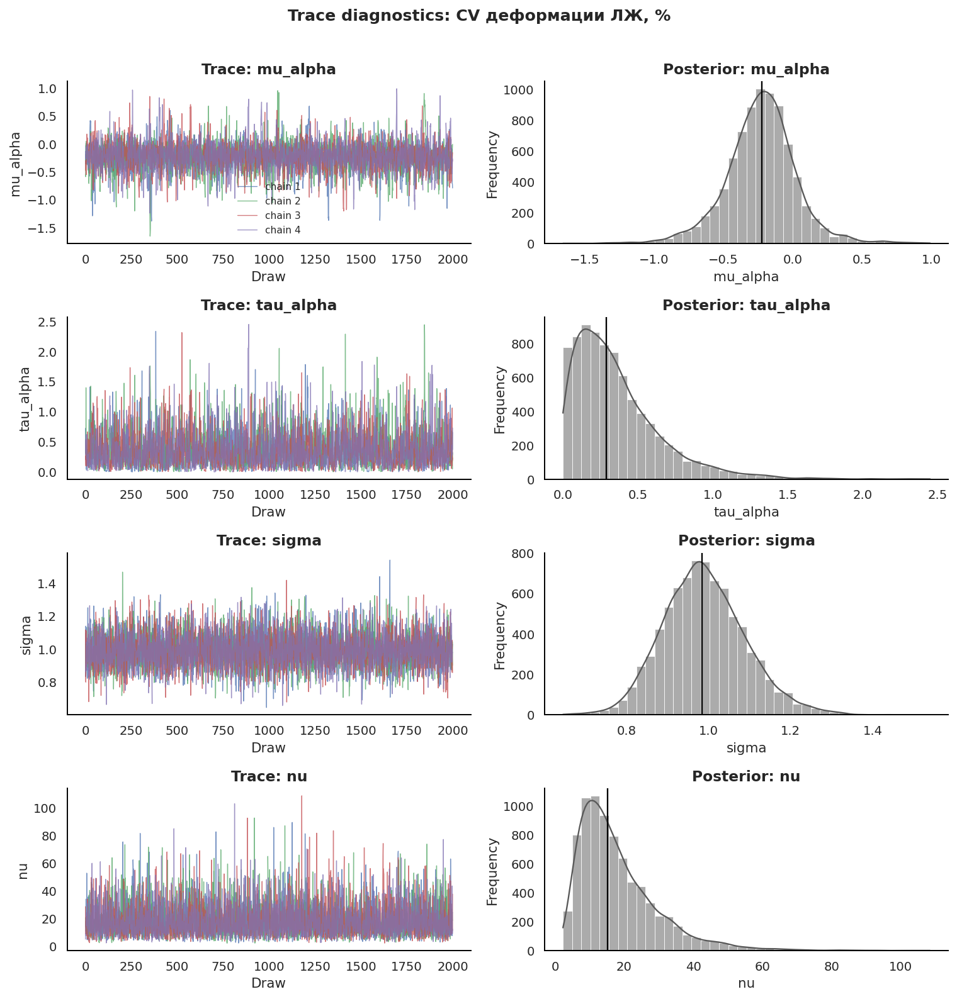


Trace: dicor_sm_kdtr_cv_pct


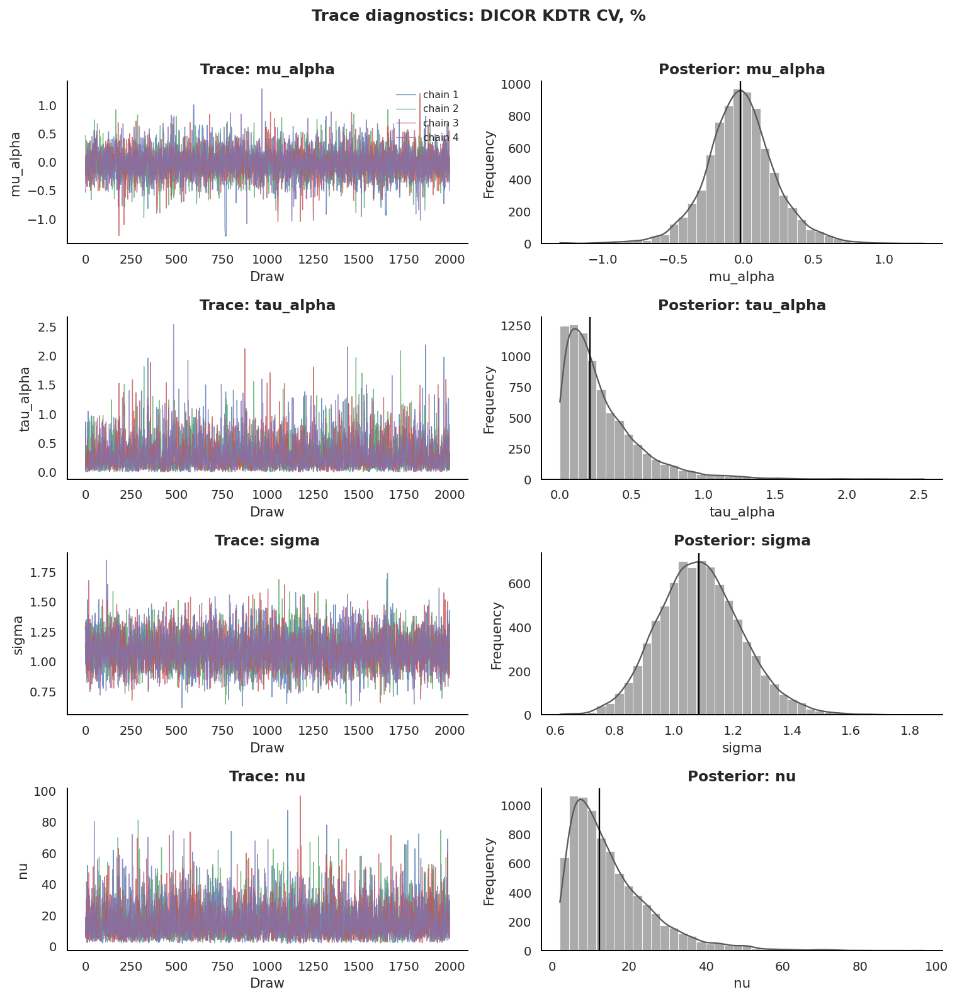


Trace: dicor_ssou_cv_pct


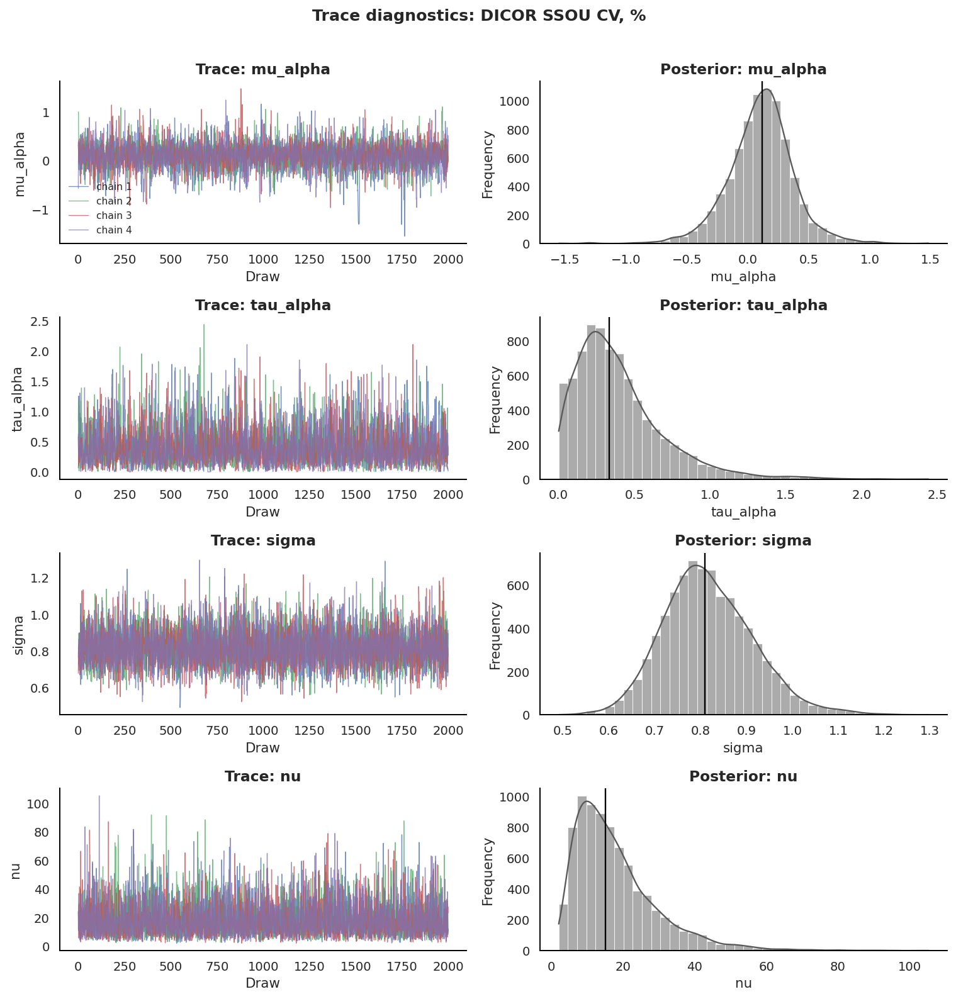


Trace: echo_lv_myocardial_mass_index_g_m2


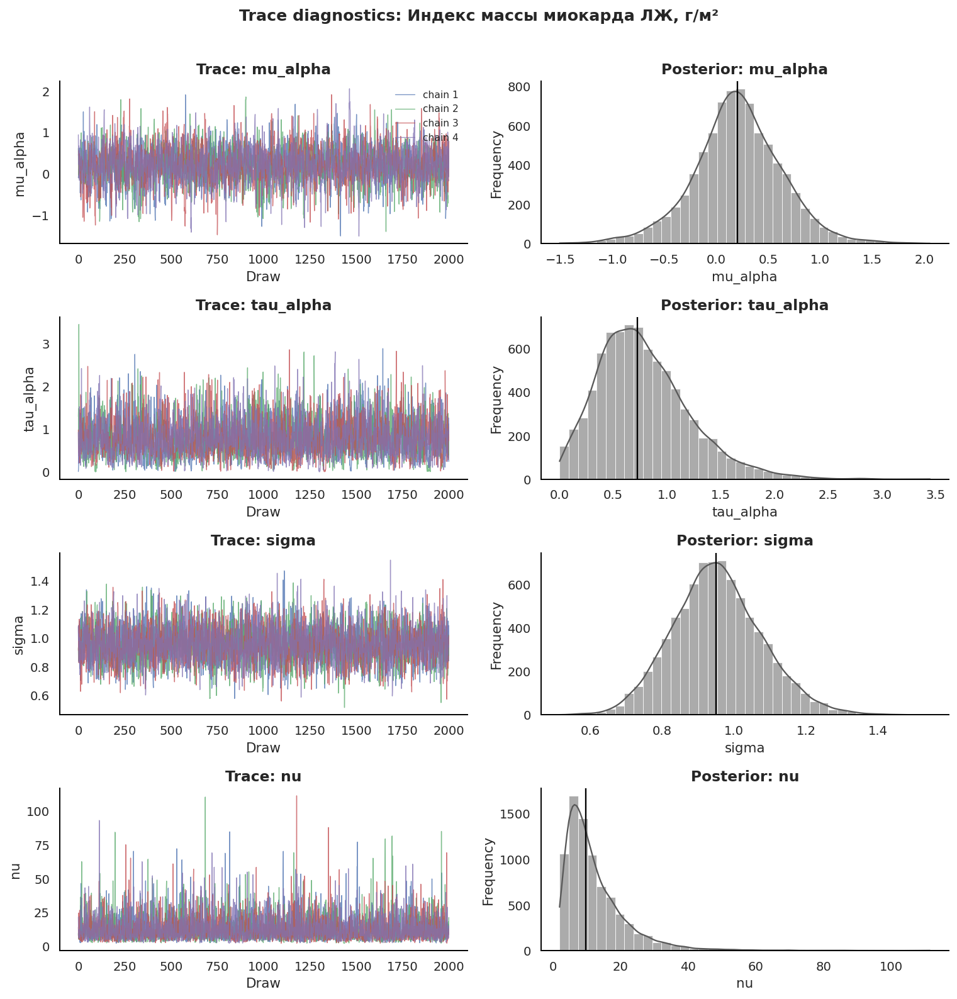


Trace: echo_lv_sws_delta_g_cm2


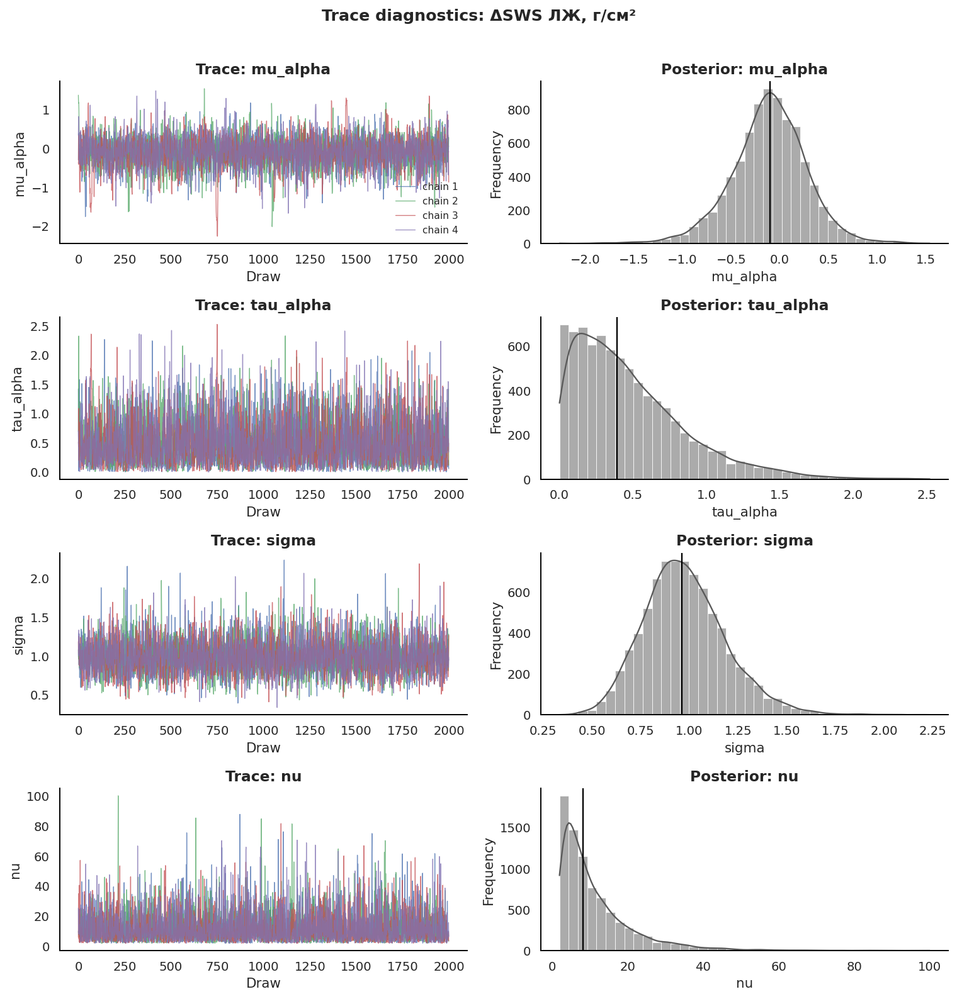


Trace: echo_lv_sphericity_index_end_diastolic_ratio


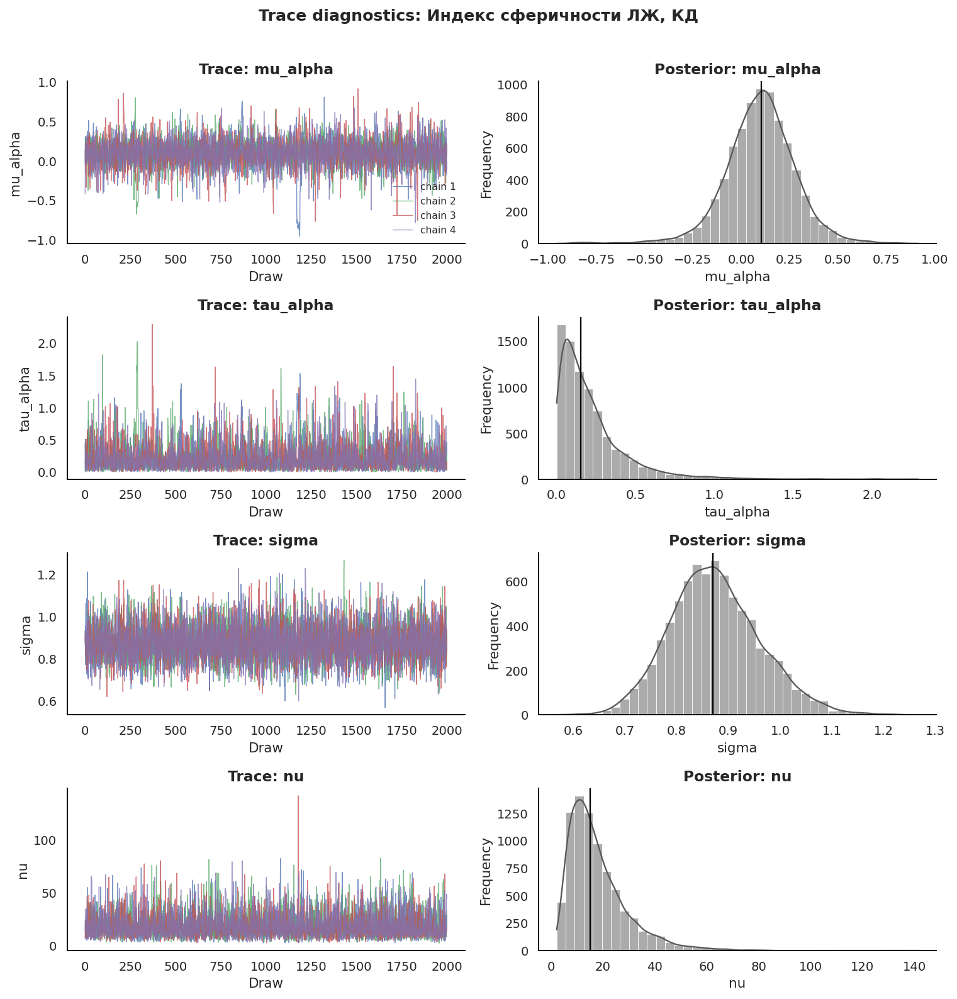


Trace: echo_lv_sphericity_index_end_systolic_ratio


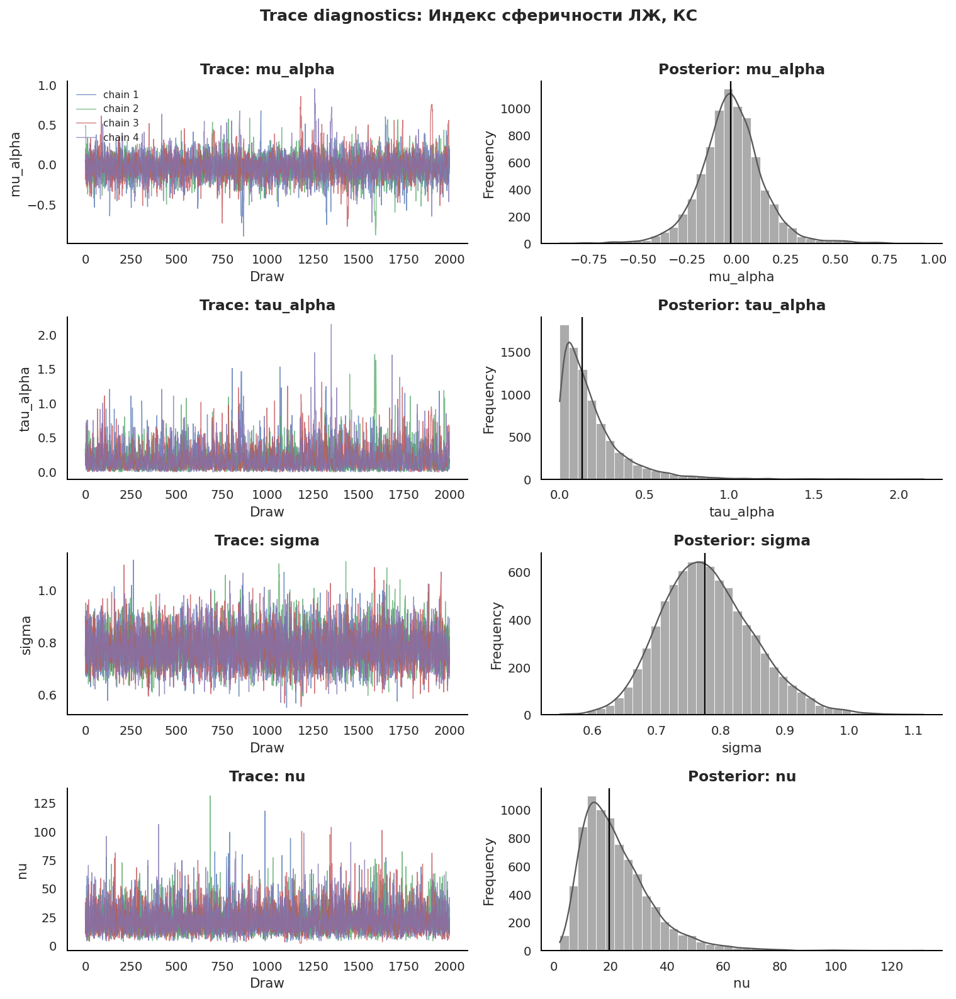


Trace: vo2_max_absolute_ml_min


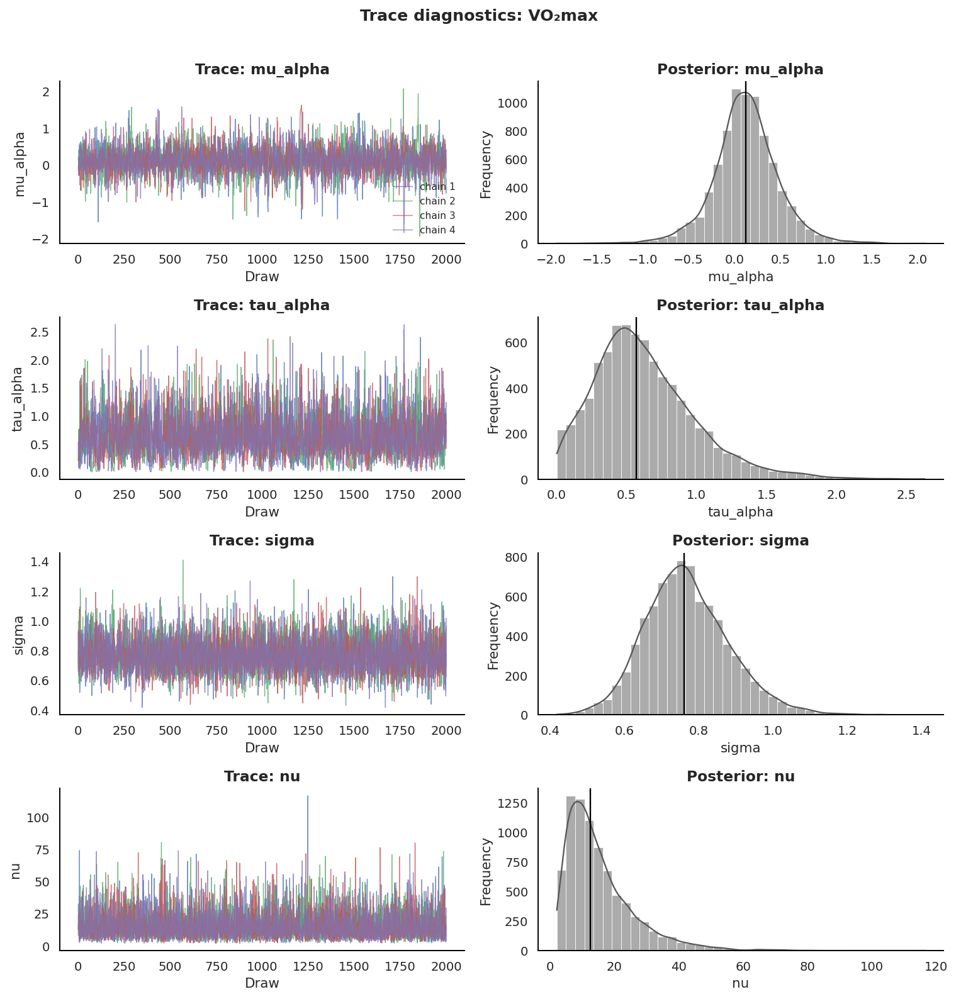

In [18]:
# ============================================================
# Trace plots
# Custom version, no az.plot_trace()
# ============================================================


def plot_custom_trace(idata, outcome, var_names=None):
    """
    Простая совместимая замена az.plot_trace.

    Для каждой переменной:
    - слева: trace по цепям;
    - справа: posterior distribution.
    """

    posterior = get_idata_group(idata, "posterior")

    if var_names is None:
        var_names = ["mu_alpha", "tau_alpha", "sigma", "nu"]

    var_names = [v for v in var_names if v in posterior.data_vars]

    if len(var_names) == 0:
        print(f"No trace variables found for {outcome}.")
        return

    n_vars = len(var_names)

    fig, axes = plt.subplots(
        nrows=n_vars,
        ncols=2,
        figsize=(11, 2.8 * n_vars),
        squeeze=False,
    )

    for row_idx, var in enumerate(var_names):
        da = posterior[var]

        extra_dims = [d for d in da.dims if d not in ["chain", "draw"]]

        if len(extra_dims) > 0:
            axes[row_idx, 0].text(
                0.5,
                0.5,
                f"{var}: skipped\nextra dims: {extra_dims}",
                ha="center",
                va="center",
                transform=axes[row_idx, 0].transAxes,
            )
            axes[row_idx, 1].axis("off")
            continue

        values = da.transpose("chain", "draw").values
        values = np.asarray(values, dtype=float)

        if values.ndim != 2:
            axes[row_idx, 0].text(
                0.5,
                0.5,
                f"{var}: unexpected shape {values.shape}",
                ha="center",
                va="center",
                transform=axes[row_idx, 0].transAxes,
            )
            axes[row_idx, 1].axis("off")
            continue

        n_chains, n_draws = values.shape

        # Trace
        ax_trace = axes[row_idx, 0]

        for chain_idx in range(n_chains):
            ax_trace.plot(
                np.arange(n_draws),
                values[chain_idx, :],
                linewidth=0.7,
                alpha=0.75,
                label=f"chain {chain_idx + 1}" if row_idx == 0 else None,
            )

        ax_trace.set_title(f"Trace: {var}")
        ax_trace.set_xlabel("Draw")
        ax_trace.set_ylabel(var)

        # Posterior distribution
        ax_hist = axes[row_idx, 1]

        flat_values = values.reshape(-1)
        flat_values = flat_values[np.isfinite(flat_values)]

        sns.histplot(
            flat_values,
            bins=40,
            kde=True,
            color="0.35",
            edgecolor="white",
            linewidth=0.4,
            ax=ax_hist,
        )

        ax_hist.axvline(
            np.median(flat_values),
            color="black",
            linestyle="-",
            linewidth=1.2,
            label="median",
        )

        ax_hist.set_title(f"Posterior: {var}")
        ax_hist.set_xlabel(var)
        ax_hist.set_ylabel("Frequency")

    axes[0, 0].legend(loc="best", fontsize=8)

    fig.suptitle(
        f"Trace diagnostics: {OUTCOME_INFO[outcome]['label_ru']}",
        fontsize=13,
        fontweight="bold",
        y=1.01,
    )

    sns.despine()
    plt.tight_layout()

    fig.savefig(
        FIGURES_DIR / f"19_trace_custom_{safe_filename(outcome)}.png",
        bbox_inches="tight",
        dpi=300,
    )

    plt.show()


for outcome, idata in idatas.items():
    print("\nTrace:", outcome)
    plot_custom_trace(idata, outcome)


In [19]:
# ============================================================
# Posterior group estimates in original units
# ============================================================


def posterior_alpha_draws_transformed_units(idata, meta):
    """
    Возвращает posterior draws групповых средних alpha
    на transformed-шкале.

    1. alpha находится на z-шкале;
    2. переводим обратно в transformed-шкалу.
    """

    posterior = get_idata_group(idata, "posterior")

    if "alpha" not in posterior.data_vars:
        raise KeyError("alpha not found in posterior.")

    alpha = posterior["alpha"]

    alpha_stacked = alpha.stack(sample=("chain", "draw")).transpose("sample", "group")

    alpha_z = alpha_stacked.values

    alpha_transformed = inverse_robust_scale(
        alpha_z,
        center=meta["y_center"],
        scale=meta["y_scale"],
    )

    group_names = list(alpha_stacked["group"].values)

    return pd.DataFrame(alpha_transformed, columns=group_names)


def posterior_alpha_draws_original_units(idata, meta):
    """
    Возвращает posterior draws групповых средних alpha
    в исходных единицах outcome.
    """

    alpha_transformed = posterior_alpha_draws_transformed_units(idata, meta)

    transform = meta.get("transform", "identity")

    alpha_raw = inverse_outcome_transform(
        alpha_transformed.values,
        transform=transform,
    )

    return pd.DataFrame(
        alpha_raw,
        columns=alpha_transformed.columns,
    )


def summarize_draws(draws, ci_probs=(0.89, 0.95)):
    """
    Summary для posterior draws.

    Используем credible_interval() вместо az.hdi().
    """

    draws = np.asarray(draws, dtype=float)
    draws = draws[np.isfinite(draws)]

    result = {
        "mean": np.mean(draws),
        "sd": np.std(draws, ddof=1),
        "median": np.median(draws),
    }

    for ci_prob in ci_probs:
        ci = credible_interval(draws, prob=ci_prob)
        pct = int(ci_prob * 100)

        result[f"cr{pct}_low"] = ci[0]
        result[f"cr{pct}_high"] = ci[1]

    return result


posterior_group_rows = []
posterior_group_draws = {}
posterior_group_draws_transformed = {}

for outcome, idata in idatas.items():
    meta = model_metas[outcome]

    alpha_draws_raw = posterior_alpha_draws_original_units(idata, meta)
    alpha_draws_transformed = posterior_alpha_draws_transformed_units(idata, meta)

    posterior_group_draws[outcome] = alpha_draws_raw
    posterior_group_draws_transformed[outcome] = alpha_draws_transformed

    for group in alpha_draws_raw.columns:
        s = summarize_draws(alpha_draws_raw[group].values)

        posterior_group_rows.append(
            {
                "outcome": outcome,
                "outcome_label_ru": OUTCOME_INFO[outcome]["label_ru"],
                "group": group,
                "group_label": ARCH_GROUP_LABELS_SHORT.get(group, group),
                "transform": meta.get("transform", "identity"),
                "n_model": meta["n"],
                **s,
            }
        )

posterior_group_df = pd.DataFrame(posterior_group_rows)

display(posterior_group_df)

posterior_group_df.to_excel(
    TABLES_DIR / "19_posterior_group_estimates_original_units.xlsx",
    index=False,
)


,outcome,outcome_label_ru,group,group_label,transform,n_model,mean,sd,median,cr89_low,cr89_high,cr95_low,cr95_high
0,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",1_Local_transverse_or_low_angle,Local transverse,log,69,23.138816,2.648776,23.278406,18.729957,27.139373,17.747187,28.269001
1,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",2_Single_long_oblique_bridge,Single long oblique,log,69,22.267698,2.580561,22.369362,18.020464,26.136618,17.122755,26.960740
2,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",3_Double_transverse_no_long_oblique,Double transverse,log,69,24.760213,2.396890,24.580548,21.210666,28.789408,20.406956,30.087971
3,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",4_Chord_network,Chord network,log,69,25.374143,1.604002,25.287138,22.926270,28.047154,22.490474,28.790486
4,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",1_Local_transverse_or_low_angle,Local transverse,log,47,16.981494,3.557448,16.580224,12.166938,23.058839,11.058744,25.420771
5,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",2_Single_long_oblique_bridge,Single long oblique,log,47,16.608113,3.287955,16.311917,11.931563,22.195418,10.813962,24.151924
6,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",3_Double_transverse_no_long_oblique,Double transverse,log,47,17.635197,3.368543,17.145519,13.217217,23.448393,12.278781,25.824037
7,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",4_Chord_network,Chord network,log,47,16.119184,2.286408,15.991576,12.655066,19.969196,11.939340,21.119830
8,dicor_ssou_cv_pct,"DICOR SSOU CV, %",1_Local_transverse_or_low_angle,Local transverse,log,47,27.405581,4.372825,26.999521,21.050320,34.754119,19.707861,37.113639
9,dicor_ssou_cv_pct,"DICOR SSOU CV, %",2_Single_long_oblique_bridge,Single long oblique,log,47,24.233121,3.260242,24.241441,19.025619,29.408817,18.013665,30.633411


In [20]:
# ============================================================
# Posterior pairwise contrasts in original units
# ============================================================


def compute_pairwise_contrasts(alpha_draws, outcome):
    rows = []

    groups = list(alpha_draws.columns)

    for g1, g2 in itertools.combinations(groups, 2):
        # Contrast: g2 - g1
        diff = alpha_draws[g2].values - alpha_draws[g1].values

        s = summarize_draws(diff)

        rows.append(
            {
                "outcome": outcome,
                "outcome_label_ru": OUTCOME_INFO[outcome]["label_ru"],
                "contrast": f"{g2} - {g1}",
                "group_reference": g1,
                "group_comparison": g2,
                "group_reference_label": ARCH_GROUP_LABELS_SHORT.get(g1, g1),
                "group_comparison_label": ARCH_GROUP_LABELS_SHORT.get(g2, g2),
                "p_comparison_gt_reference": np.mean(diff > 0),
                "p_comparison_lt_reference": np.mean(diff < 0),
                "p_direction": max(np.mean(diff > 0), np.mean(diff < 0)),
                **s,
            }
        )

    return pd.DataFrame(rows)


contrast_tables = []

for outcome, alpha_draws in posterior_group_draws.items():
    contrast_df = compute_pairwise_contrasts(alpha_draws, outcome)
    contrast_tables.append(contrast_df)

posterior_contrasts_df = pd.concat(contrast_tables, ignore_index=True)

display(posterior_contrasts_df)

posterior_contrasts_df.to_excel(
    TABLES_DIR / "19_posterior_pairwise_contrasts_original_units.xlsx",
    index=False,
)


,outcome,outcome_label_ru,contrast,group_reference,group_comparison,group_reference_label,group_comparison_label,p_comparison_gt_reference,p_comparison_lt_reference,p_direction,mean,sd,median,cr89_low,cr89_high,cr95_low,cr95_high
0,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",2_Single_long_oblique_bridge - 1_Local_transve...,1_Local_transverse_or_low_angle,2_Single_long_oblique_bridge,Local transverse,Single long oblique,0.391375,0.608625,0.608625,-0.871118,3.026134,-0.510488,-6.106365,3.683327,-7.680937,5.014591
1,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",3_Double_transverse_no_long_oblique - 1_Local_...,1_Local_transverse_or_low_angle,3_Double_transverse_no_long_oblique,Local transverse,Double transverse,0.682125,0.317875,0.682125,1.621397,3.322581,1.036168,-2.967940,7.569791,-4.294914,9.117472
2,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",4_Chord_network - 1_Local_transverse_or_low_angle,1_Local_transverse_or_low_angle,4_Chord_network,Local transverse,Chord network,0.780250,0.219750,0.780250,2.235327,2.999769,1.780162,-1.820566,7.611516,-2.967595,8.798492
3,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",3_Double_transverse_no_long_oblique - 2_Single...,2_Single_long_oblique_bridge,3_Double_transverse_no_long_oblique,Single long oblique,Double transverse,0.780500,0.219500,0.780500,2.492515,3.290660,1.929064,-1.699547,8.374445,-2.813844,10.098715
4,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",4_Chord_network - 2_Single_long_oblique_bridge,2_Single_long_oblique_bridge,4_Chord_network,Single long oblique,Chord network,0.854750,0.145250,0.854750,3.106445,2.990011,2.775279,-0.823893,8.248018,-1.611983,9.330854
5,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",4_Chord_network - 3_Double_transverse_no_long_...,3_Double_transverse_no_long_oblique,4_Chord_network,Double transverse,Chord network,0.602750,0.397250,0.602750,0.613930,2.598688,0.465234,-3.510068,4.881815,-4.912149,5.959071
6,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",2_Single_long_oblique_bridge - 1_Local_transve...,1_Local_transverse_or_low_angle,2_Single_long_oblique_bridge,Local transverse,Single long oblique,0.472750,0.527250,0.527250,-0.373380,4.056859,-0.079390,-6.934908,5.489391,-9.337457,7.986779
7,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",3_Double_transverse_no_long_oblique - 1_Local_...,1_Local_transverse_or_low_angle,3_Double_transverse_no_long_oblique,Local transverse,Double transverse,0.562375,0.437625,0.562375,0.653704,4.095125,0.223806,-5.218748,7.436130,-7.664792,9.882697
8,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",4_Chord_network - 1_Local_transverse_or_low_angle,1_Local_transverse_or_low_angle,4_Chord_network,Local transverse,Chord network,0.430625,0.569375,0.569375,-0.862310,3.606136,-0.257147,-7.108472,4.003751,-9.767787,5.518338
9,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",3_Double_transverse_no_long_oblique - 2_Single...,2_Single_long_oblique_bridge,3_Double_transverse_no_long_oblique,Single long oblique,Double transverse,0.594500,0.405500,0.594500,1.027084,3.907488,0.407761,-4.277365,7.683011,-6.309680,10.197280


In [21]:
# ============================================================
# Ratio contrasts for log / log1p transformed outcomes
# ============================================================

ratio_rows = []

for outcome, idata in idatas.items():
    meta = model_metas[outcome]
    transform = meta.get("transform", "identity")

    if transform not in ["log", "log1p"]:
        continue

    alpha_trans = posterior_group_draws_transformed[outcome]
    groups = list(alpha_trans.columns)

    for g1, g2 in itertools.combinations(groups, 2):
        # Contrast: g2 - g1 on transformed scale
        diff = alpha_trans[g2].values - alpha_trans[g1].values

        ratio = np.exp(diff)
        percent_change = (ratio - 1) * 100

        ratio_cr95 = credible_interval(ratio, prob=0.95)
        pct_cr95 = credible_interval(percent_change, prob=0.95)

        ratio_rows.append(
            {
                "outcome": outcome,
                "outcome_label_ru": OUTCOME_INFO[outcome]["label_ru"],
                "transform": transform,
                "contrast": f"{g2} / {g1}",
                "group_reference": g1,
                "group_comparison": g2,
                "group_reference_label": ARCH_GROUP_LABELS_SHORT.get(g1, g1),
                "group_comparison_label": ARCH_GROUP_LABELS_SHORT.get(g2, g2),
                "p_ratio_gt_1": np.mean(ratio > 1),
                "p_ratio_lt_1": np.mean(ratio < 1),
                "p_direction": max(np.mean(ratio > 1), np.mean(ratio < 1)),
                "ratio_median": np.median(ratio),
                "ratio_cr95_low": ratio_cr95[0],
                "ratio_cr95_high": ratio_cr95[1],
                "percent_change_median": np.median(percent_change),
                "percent_change_cr95_low": pct_cr95[0],
                "percent_change_cr95_high": pct_cr95[1],
            }
        )

ratio_contrasts_df = pd.DataFrame(ratio_rows)

display(ratio_contrasts_df)

if not ratio_contrasts_df.empty:
    ratio_contrasts_df.to_excel(
        TABLES_DIR / "19_posterior_ratio_contrasts_for_log_models.xlsx",
        index=False,
    )


,outcome,outcome_label_ru,transform,contrast,group_reference,group_comparison,group_reference_label,group_comparison_label,p_ratio_gt_1,p_ratio_lt_1,p_direction,ratio_median,ratio_cr95_low,ratio_cr95_high,percent_change_median,percent_change_cr95_low,percent_change_cr95_high
0,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",log,2_Single_long_oblique_bridge / 1_Local_transve...,1_Local_transverse_or_low_angle,2_Single_long_oblique_bridge,Local transverse,Single long oblique,0.391375,0.608625,0.608625,0.977914,0.708673,1.259764,-2.208621,-29.132717,25.976427
1,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",log,3_Double_transverse_no_long_oblique / 1_Local_...,1_Local_transverse_or_low_angle,3_Double_transverse_no_long_oblique,Local transverse,Double transverse,0.682125,0.317875,0.682125,1.044069,0.838855,1.478990,4.406938,-16.114477,47.899024
2,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",log,4_Chord_network / 1_Local_transverse_or_low_angle,1_Local_transverse_or_low_angle,4_Chord_network,Local transverse,Chord network,0.780250,0.219750,0.780250,1.075728,0.890777,1.479554,7.572763,-10.922288,47.955413
3,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",log,3_Double_transverse_no_long_oblique / 2_Single...,2_Single_long_oblique_bridge,3_Double_transverse_no_long_oblique,Single long oblique,Double transverse,0.780500,0.219500,0.780500,1.085943,0.888882,1.555275,8.594286,-11.111752,55.527511
4,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",log,4_Chord_network / 2_Single_long_oblique_bridge,2_Single_long_oblique_bridge,4_Chord_network,Single long oblique,Chord network,0.854750,0.145250,0.854750,1.123726,0.938138,1.521268,12.372620,-6.186177,52.126770
5,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",log,4_Chord_network / 3_Double_transverse_no_long_...,3_Double_transverse_no_long_oblique,4_Chord_network,Double transverse,Chord network,0.602750,0.397250,0.602750,1.018819,0.835349,1.279892,1.881921,-16.465146,27.989197
6,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",log,2_Single_long_oblique_bridge / 1_Local_transve...,1_Local_transverse_or_low_angle,2_Single_long_oblique_bridge,Local transverse,Single long oblique,0.472750,0.527250,0.527250,0.994874,0.573638,1.587840,-0.512629,-42.636160,58.784048
7,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",log,3_Double_transverse_no_long_oblique / 1_Local_...,1_Local_transverse_or_low_angle,3_Double_transverse_no_long_oblique,Local transverse,Double transverse,0.562375,0.437625,0.562375,1.013589,0.664703,1.763520,1.358873,-33.529654,76.351988
8,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",log,4_Chord_network / 1_Local_transverse_or_low_angle,1_Local_transverse_or_low_angle,4_Chord_network,Local transverse,Chord network,0.430625,0.569375,0.569375,0.984140,0.594597,1.443775,-1.586035,-40.540335,44.377515
9,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",log,3_Double_transverse_no_long_oblique / 2_Single...,2_Single_long_oblique_bridge,3_Double_transverse_no_long_oblique,Single long oblique,Double transverse,0.594500,0.405500,0.594500,1.025203,0.700069,1.797692,2.520296,-29.993126,79.769206


In [22]:
# ============================================================
# Predefined mechanistic contrasts
# ============================================================

PREDEFINED_CONTRASTS = [
    {
        "name": "Network minus single long oblique",
        "higher_group": "4_Chord_network",
        "lower_group": "2_Single_long_oblique_bridge",
        "hypothesis": "network_has_higher_adaptation_cost",
    },
    {
        "name": "Double transverse minus single long oblique",
        "higher_group": "3_Double_transverse_no_long_oblique",
        "lower_group": "2_Single_long_oblique_bridge",
        "hypothesis": "double_transverse_has_higher_adaptation_cost",
    },
    {
        "name": "Network minus local transverse",
        "higher_group": "4_Chord_network",
        "lower_group": "1_Local_transverse_or_low_angle",
        "hypothesis": "network_vs_local",
    },
    {
        "name": "Double transverse minus local transverse",
        "higher_group": "3_Double_transverse_no_long_oblique",
        "lower_group": "1_Local_transverse_or_low_angle",
        "hypothesis": "double_transverse_vs_local",
    },
]

predefined_rows = []

for outcome, alpha_draws in posterior_group_draws.items():
    for contrast in PREDEFINED_CONTRASTS:
        higher_group = contrast["higher_group"]
        lower_group = contrast["lower_group"]

        if higher_group not in alpha_draws.columns or lower_group not in alpha_draws.columns:
            continue

        diff = alpha_draws[higher_group].values - alpha_draws[lower_group].values
        s = summarize_draws(diff)

        predefined_rows.append(
            {
                "outcome": outcome,
                "outcome_label_ru": OUTCOME_INFO[outcome]["label_ru"],
                "contrast_name": contrast["name"],
                "hypothesis": contrast["hypothesis"],
                "higher_group": higher_group,
                "lower_group": lower_group,
                "higher_group_label": ARCH_GROUP_LABELS_SHORT[higher_group],
                "lower_group_label": ARCH_GROUP_LABELS_SHORT[lower_group],
                "transform": model_metas[outcome].get("transform", "identity"),
                "p_higher_gt_lower": np.mean(diff > 0),
                "p_higher_lt_lower": np.mean(diff < 0),
                "p_direction": max(np.mean(diff > 0), np.mean(diff < 0)),
                **s,
            }
        )

predefined_contrasts_df = pd.DataFrame(predefined_rows)

display(predefined_contrasts_df)

predefined_contrasts_df.to_excel(
    TABLES_DIR / "19_predefined_mechanistic_contrasts.xlsx",
    index=False,
)


,outcome,outcome_label_ru,contrast_name,hypothesis,higher_group,lower_group,higher_group_label,lower_group_label,transform,p_higher_gt_lower,p_higher_lt_lower,p_direction,mean,sd,median,cr89_low,cr89_high,cr95_low,cr95_high
0,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",Network minus single long oblique,network_has_higher_adaptation_cost,4_Chord_network,2_Single_long_oblique_bridge,Chord network,Single long oblique,log,0.854750,0.145250,0.854750,3.106445,2.990011,2.775279,-0.823893,8.248018,-1.611983,9.330854
1,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",Double transverse minus single long oblique,double_transverse_has_higher_adaptation_cost,3_Double_transverse_no_long_oblique,2_Single_long_oblique_bridge,Double transverse,Single long oblique,log,0.780500,0.219500,0.780500,2.492515,3.290660,1.929064,-1.699547,8.374445,-2.813844,10.098715
2,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",Network minus local transverse,network_vs_local,4_Chord_network,1_Local_transverse_or_low_angle,Chord network,Local transverse,log,0.780250,0.219750,0.780250,2.235327,2.999769,1.780162,-1.820566,7.611516,-2.967595,8.798492
3,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",Double transverse minus local transverse,double_transverse_vs_local,3_Double_transverse_no_long_oblique,1_Local_transverse_or_low_angle,Double transverse,Local transverse,log,0.682125,0.317875,0.682125,1.621397,3.322581,1.036168,-2.967940,7.569791,-4.294914,9.117472
4,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",Network minus single long oblique,network_has_higher_adaptation_cost,4_Chord_network,2_Single_long_oblique_bridge,Chord network,Single long oblique,log,0.460375,0.539625,0.539625,-0.488930,3.357437,-0.120209,-6.146207,4.307378,-8.387899,5.853802
5,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",Double transverse minus single long oblique,double_transverse_has_higher_adaptation_cost,3_Double_transverse_no_long_oblique,2_Single_long_oblique_bridge,Double transverse,Single long oblique,log,0.594500,0.405500,0.594500,1.027084,3.907488,0.407761,-4.277365,7.683011,-6.309680,10.197280
6,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",Network minus local transverse,network_vs_local,4_Chord_network,1_Local_transverse_or_low_angle,Chord network,Local transverse,log,0.430625,0.569375,0.569375,-0.862310,3.606136,-0.257147,-7.108472,4.003751,-9.767787,5.518338
7,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",Double transverse minus local transverse,double_transverse_vs_local,3_Double_transverse_no_long_oblique,1_Local_transverse_or_low_angle,Double transverse,Local transverse,log,0.562375,0.437625,0.562375,0.653704,4.095125,0.223806,-5.218748,7.436130,-7.664792,9.882697
8,dicor_ssou_cv_pct,"DICOR SSOU CV, %",Network minus single long oblique,network_has_higher_adaptation_cost,4_Chord_network,2_Single_long_oblique_bridge,Chord network,Single long oblique,log,0.889250,0.110750,0.889250,4.908552,4.132543,4.705263,-0.806725,11.835183,-1.953951,13.517264
9,dicor_ssou_cv_pct,"DICOR SSOU CV, %",Double transverse minus single long oblique,double_transverse_has_higher_adaptation_cost,3_Double_transverse_no_long_oblique,2_Single_long_oblique_bridge,Double transverse,Single long oblique,log,0.458000,0.542000,0.542000,-0.419521,3.902007,-0.224131,-6.723479,5.704143,-8.591869,7.366578


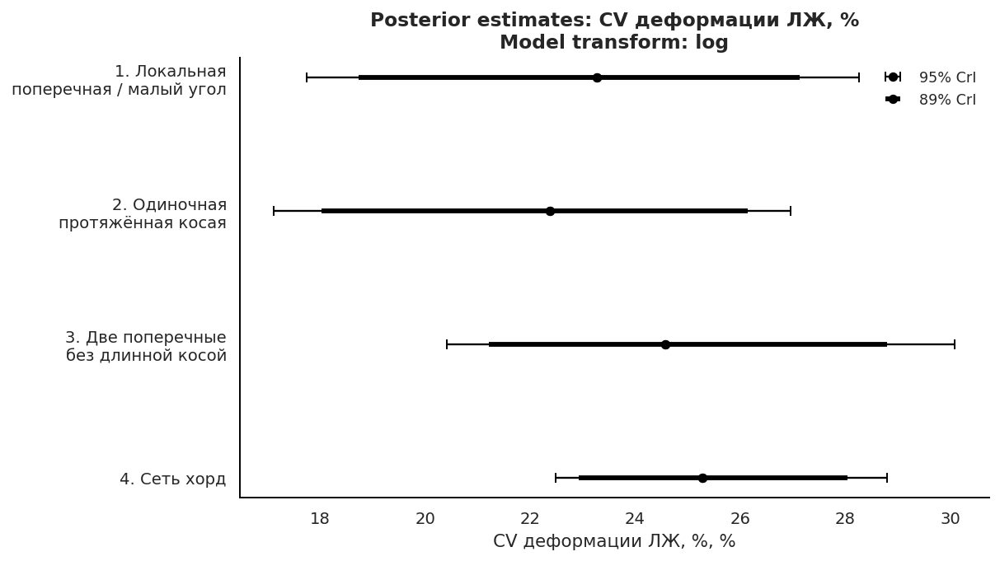

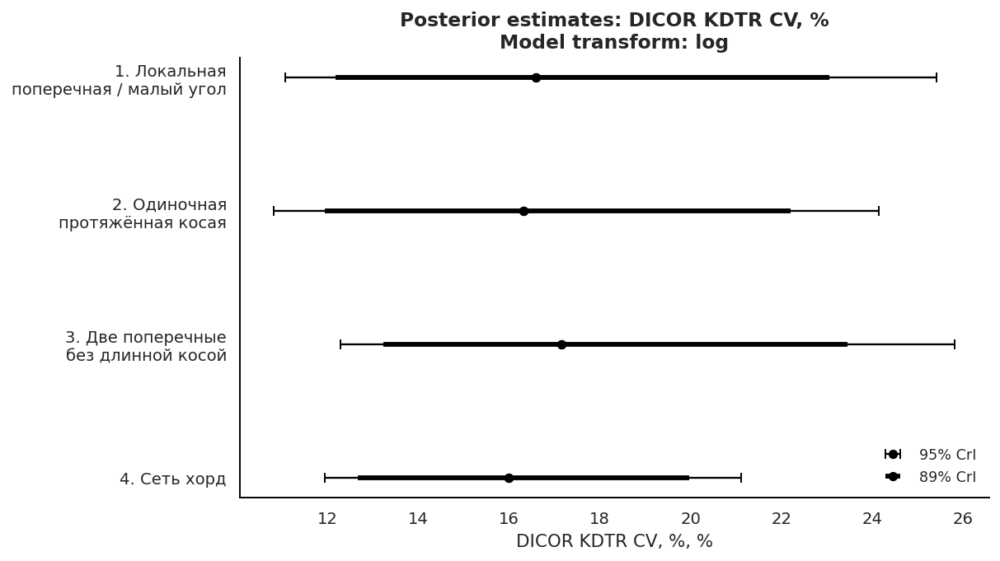

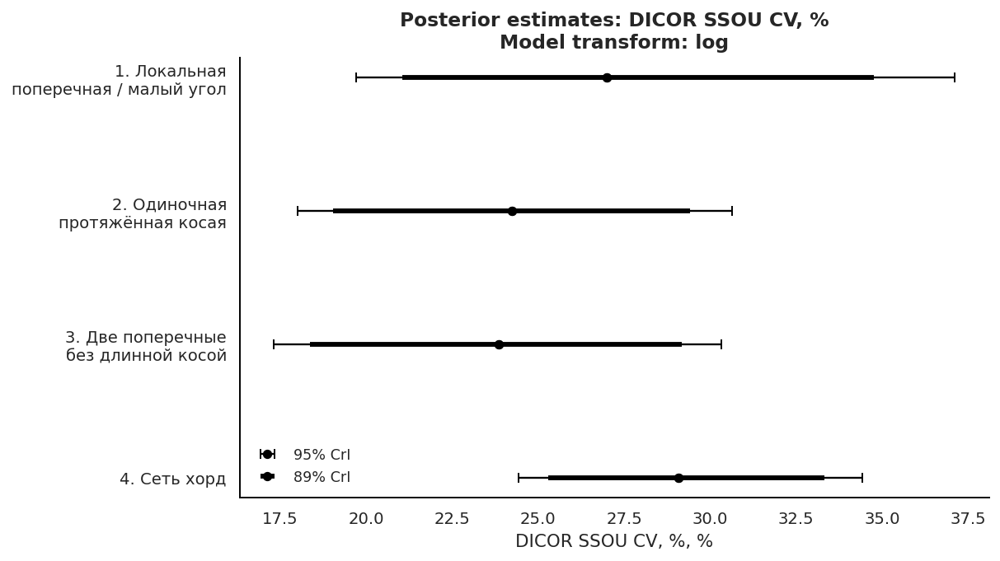

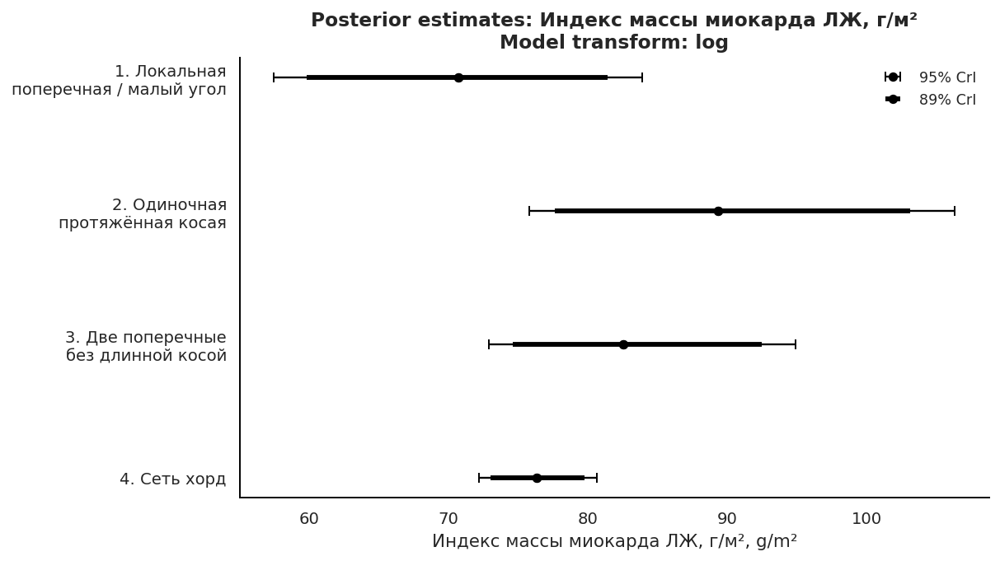

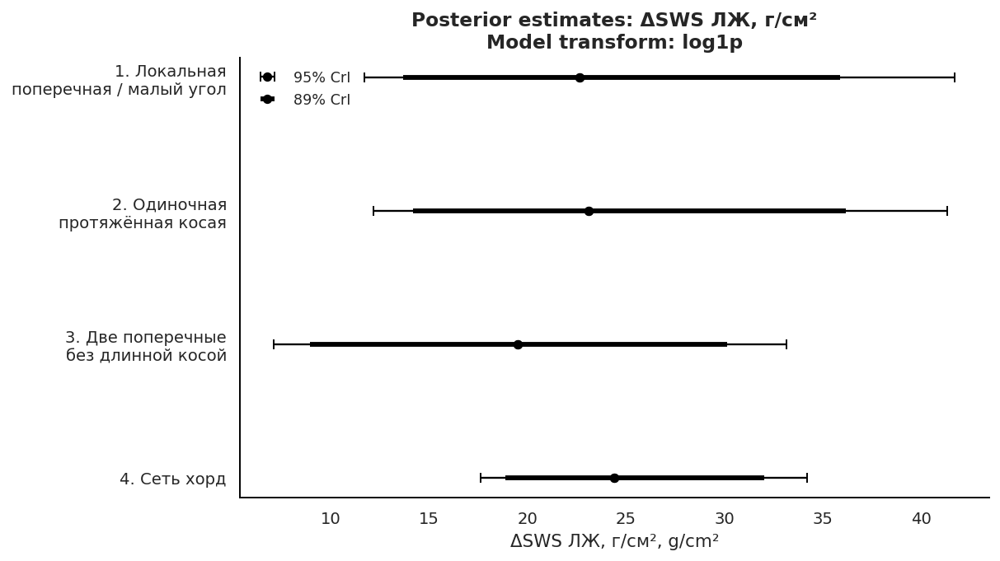

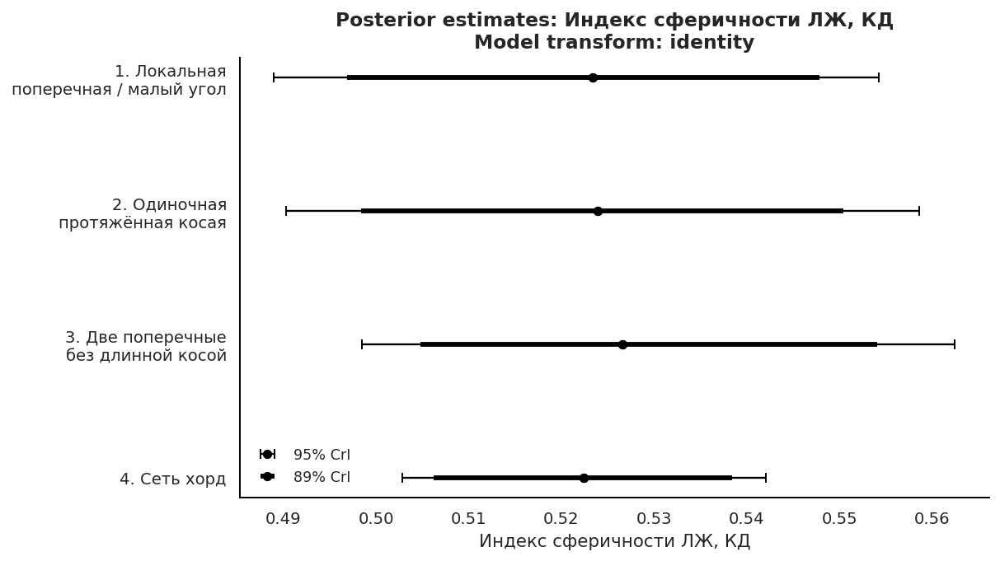

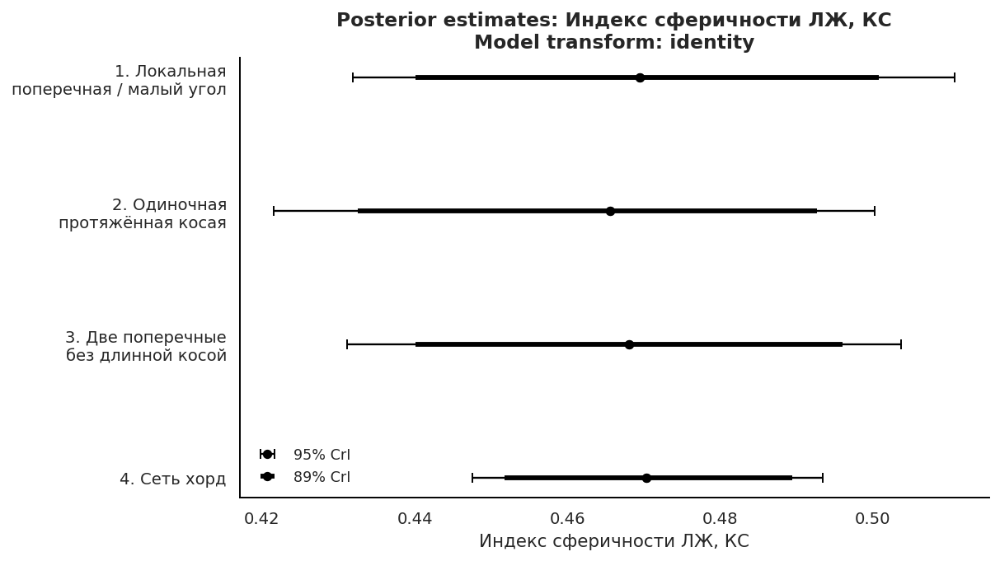

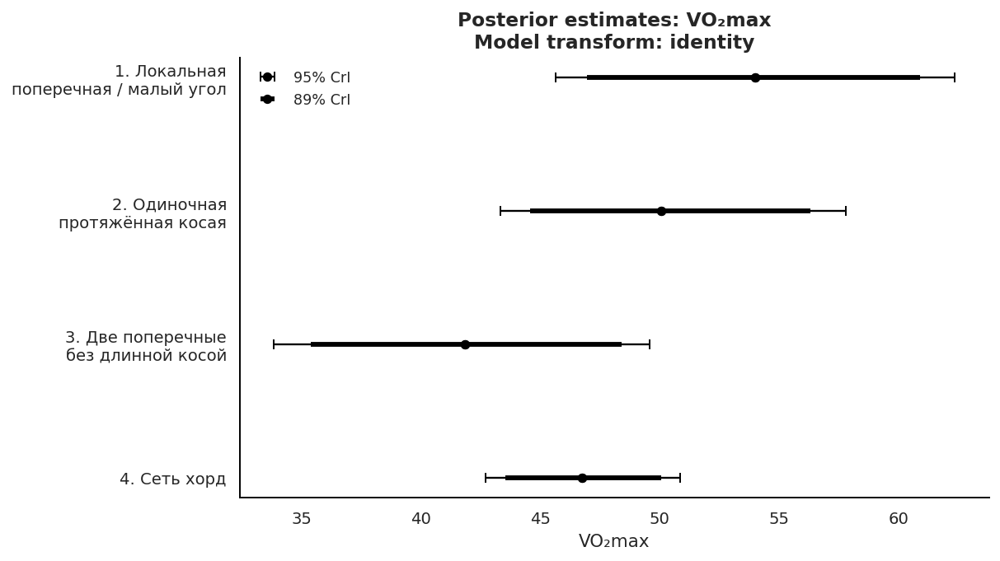

In [23]:
# ============================================================
# Forest plot: posterior group estimates
# ============================================================


def plot_posterior_group_forest(outcome):
    if outcome not in posterior_group_df["outcome"].unique():
        print(f"No posterior group estimates for {outcome}")
        return

    d = posterior_group_df[posterior_group_df["outcome"] == outcome].copy()
    d["group_label_full"] = d["group"].map(ARCH_GROUP_LABELS_RU)

    order_groups = [g for g in ARCH_GROUP_ORDER if g in d["group"].values]

    d = d.set_index("group").reindex(order_groups).reset_index()
    d = d.dropna(subset=["median"])

    fig, ax = plt.subplots(figsize=(8.8, 5.0))

    y_pos = np.arange(len(d))

    # 95% CrI
    ax.errorbar(
        d["median"],
        y_pos,
        xerr=[
            d["median"] - d["cr95_low"],
            d["cr95_high"] - d["median"],
        ],
        fmt="o",
        color="black",
        ecolor="black",
        elinewidth=1.2,
        capsize=3,
        label="95% CrI",
    )

    # 89% CrI
    ax.errorbar(
        d["median"],
        y_pos,
        xerr=[
            d["median"] - d["cr89_low"],
            d["cr89_high"] - d["median"],
        ],
        fmt="o",
        color="black",
        ecolor="black",
        elinewidth=3.0,
        capsize=0,
        label="89% CrI",
    )

    ax.set_yticks(y_pos)
    ax.set_yticklabels(d["group_label_full"])
    ax.invert_yaxis()

    transform = model_metas[outcome].get("transform", "identity")

    ax.set_title(
        f"Posterior estimates: {OUTCOME_INFO[outcome]['label_ru']}\nModel transform: {transform}"
    )

    ax.set_xlabel(get_outcome_label(outcome))
    ax.set_ylabel("")

    ax.legend(loc="best", fontsize=9)

    sns.despine(ax=ax)
    plt.tight_layout()

    fig.savefig(
        FIGURES_DIR / f"19_posterior_group_forest_{safe_filename(outcome)}.png",
        bbox_inches="tight",
    )

    plt.show()


for outcome in idatas.keys():
    plot_posterior_group_forest(outcome)


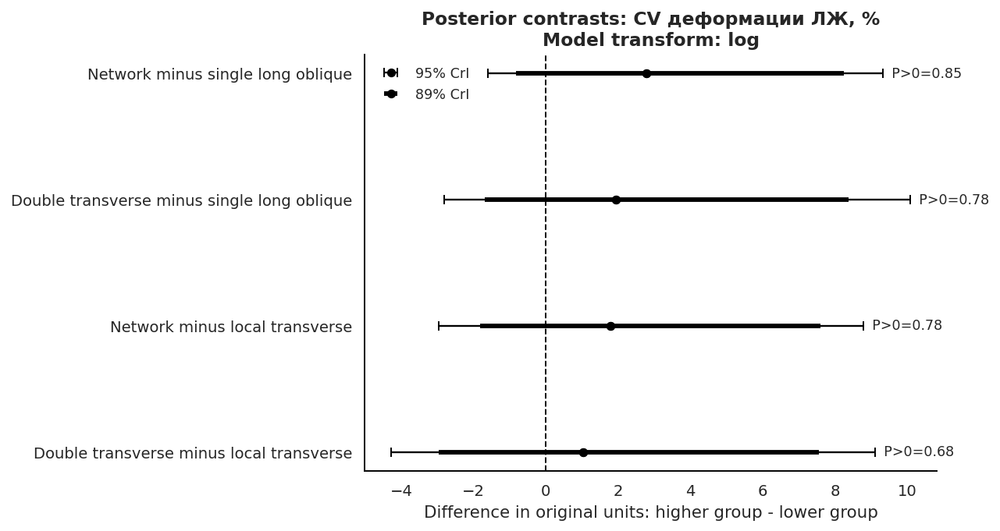

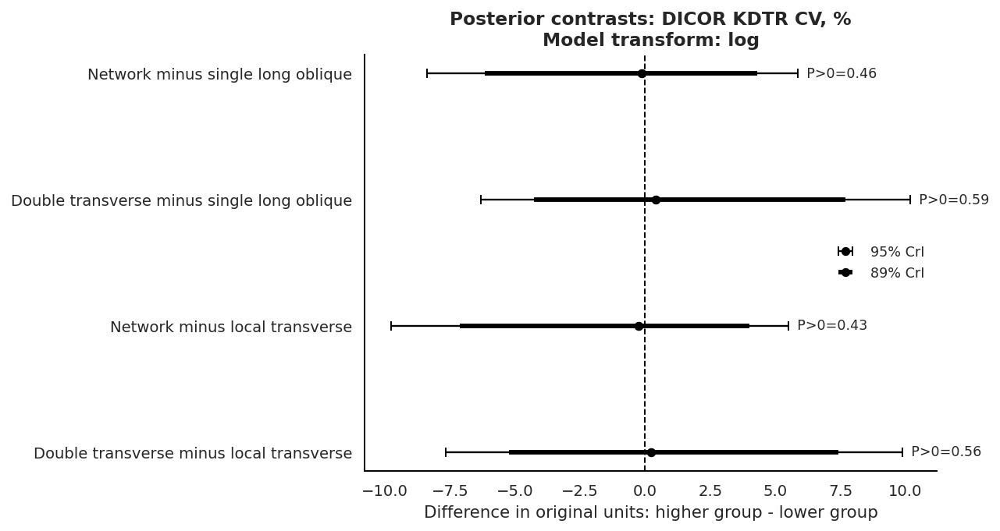

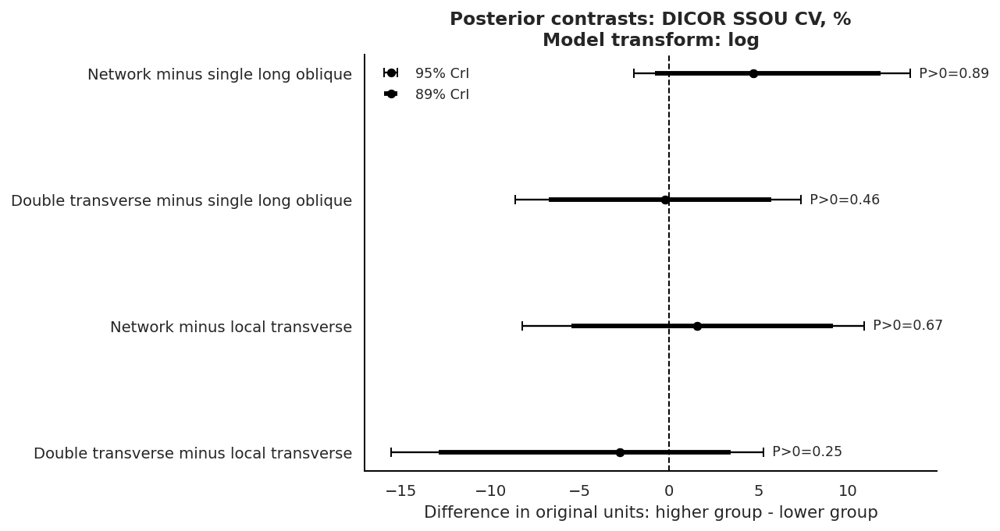

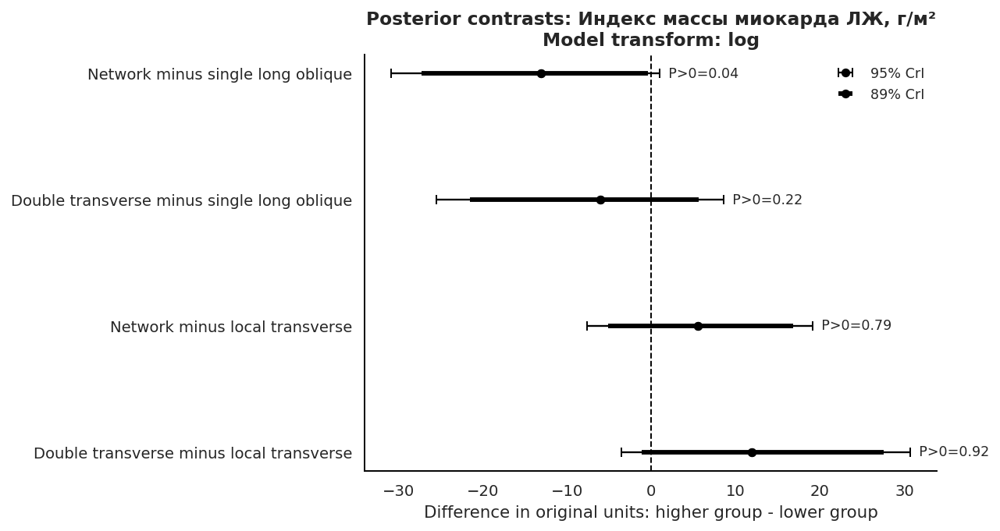

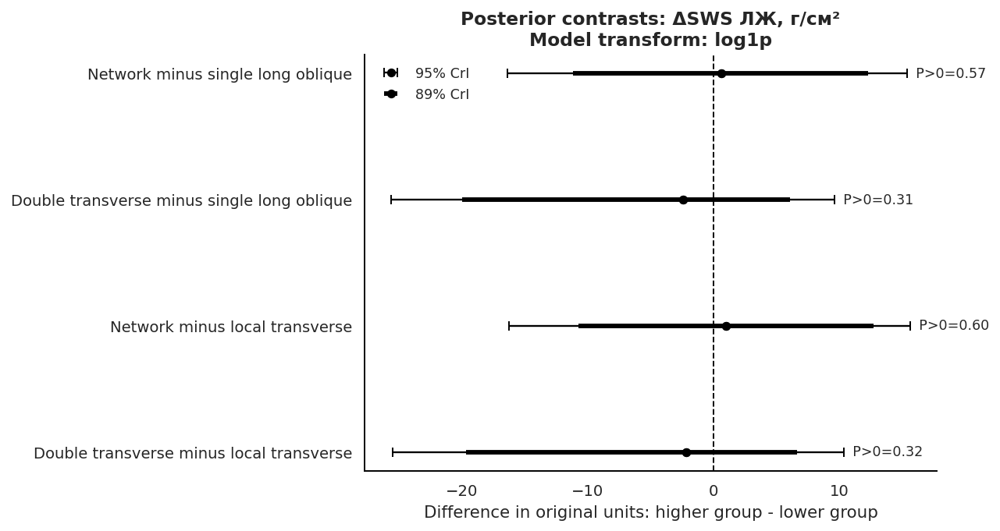

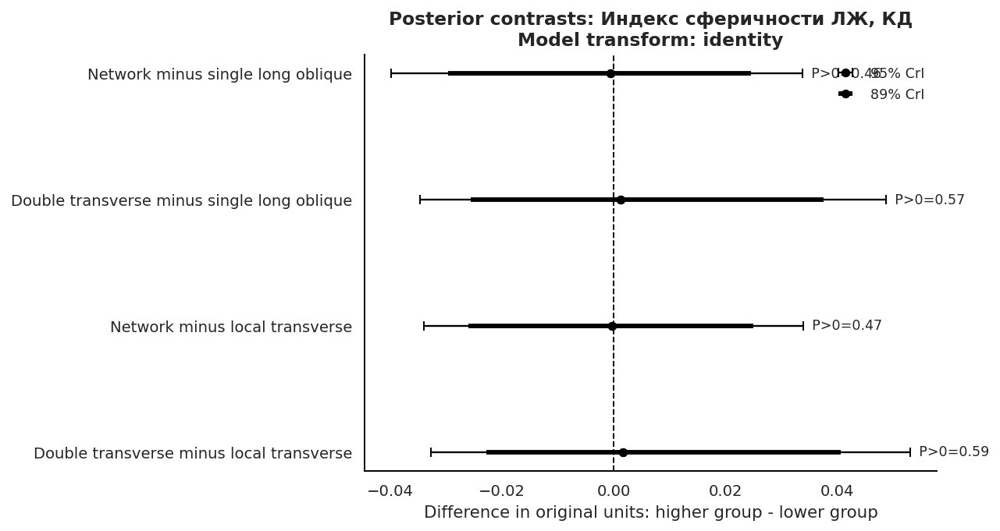

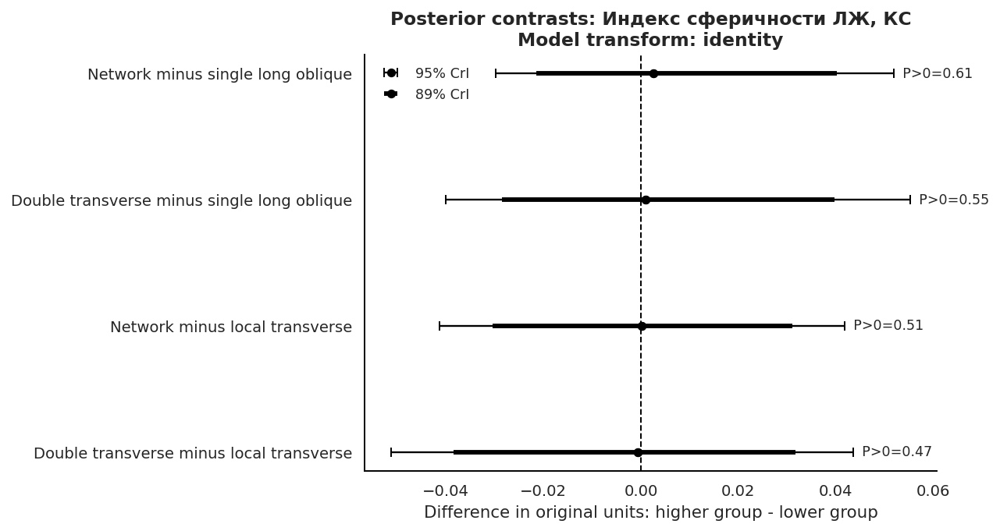

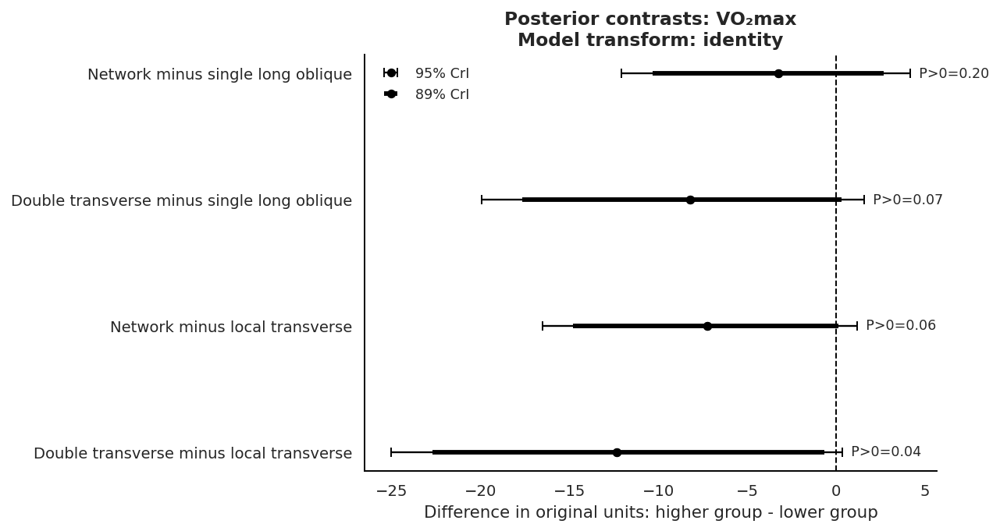

In [24]:
# ============================================================
# Forest plot: predefined mechanistic contrasts
# ============================================================


def plot_predefined_contrasts_forest(outcome):
    d = predefined_contrasts_df[predefined_contrasts_df["outcome"] == outcome].copy()

    if d.empty:
        print(f"No predefined contrasts for {outcome}")
        return

    d["label"] = d["contrast_name"]

    fig, ax = plt.subplots(figsize=(9.2, 5.0))

    y_pos = np.arange(len(d))

    ax.axvline(
        0,
        color="black",
        linestyle="--",
        linewidth=1.0,
    )

    # 95% CrI
    ax.errorbar(
        d["median"],
        y_pos,
        xerr=[
            d["median"] - d["cr95_low"],
            d["cr95_high"] - d["median"],
        ],
        fmt="o",
        color="black",
        ecolor="black",
        elinewidth=1.2,
        capsize=3,
        label="95% CrI",
    )

    # 89% CrI
    ax.errorbar(
        d["median"],
        y_pos,
        xerr=[
            d["median"] - d["cr89_low"],
            d["cr89_high"] - d["median"],
        ],
        fmt="o",
        color="black",
        ecolor="black",
        elinewidth=3.0,
        capsize=0,
        label="89% CrI",
    )

    for pos, (_, row) in enumerate(d.iterrows()):
        ax.text(
            row["cr95_high"],
            pos,
            f"  P>0={row['p_higher_gt_lower']:.2f}",
            va="center",
            fontsize=9,
        )

    ax.set_yticks(y_pos)
    ax.set_yticklabels(d["label"])
    ax.invert_yaxis()

    transform = model_metas[outcome].get("transform", "identity")

    ax.set_title(
        f"Posterior contrasts: {OUTCOME_INFO[outcome]['label_ru']}\nModel transform: {transform}"
    )

    ax.set_xlabel("Difference in original units: higher group - lower group")
    ax.set_ylabel("")

    ax.legend(loc="best", fontsize=9)

    sns.despine(ax=ax)
    plt.tight_layout()

    fig.savefig(
        FIGURES_DIR / f"19_posterior_contrasts_forest_{safe_filename(outcome)}.png",
        bbox_inches="tight",
    )

    plt.show()


for outcome in idatas.keys():
    plot_predefined_contrasts_forest(outcome)


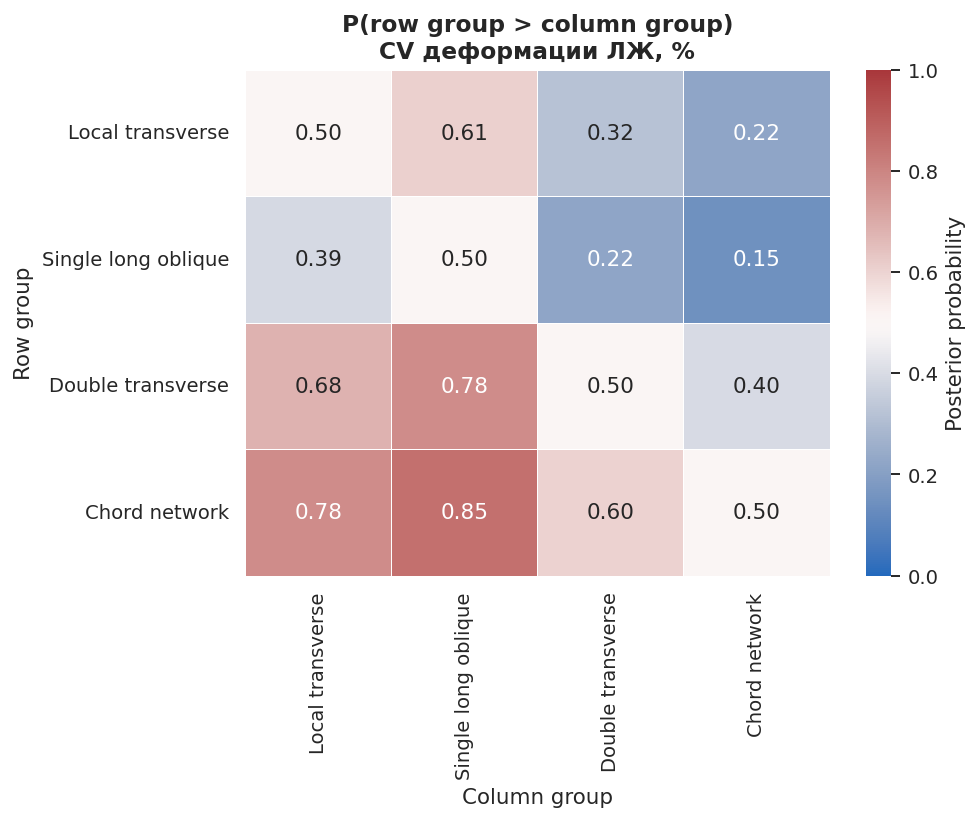

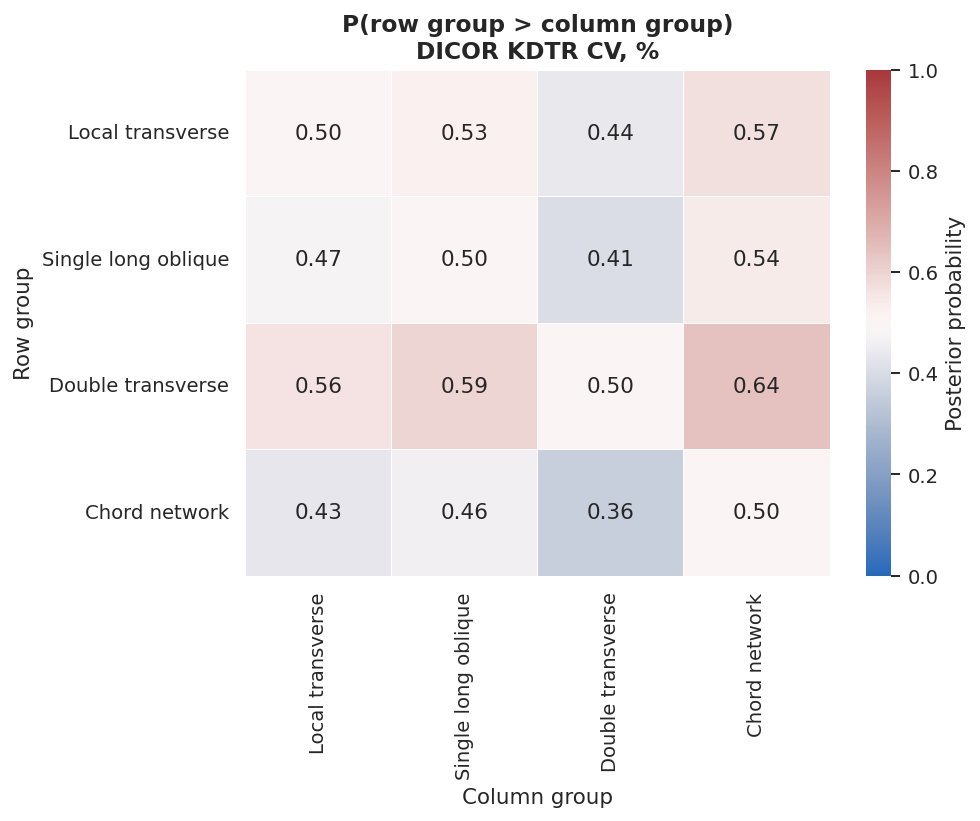

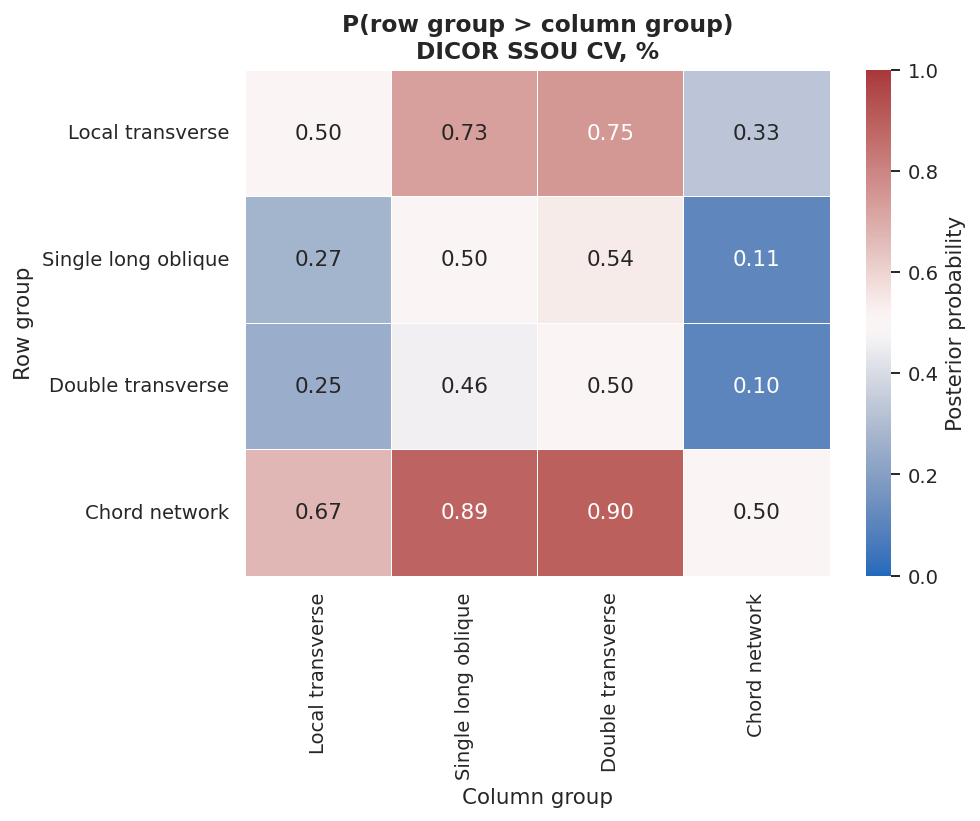

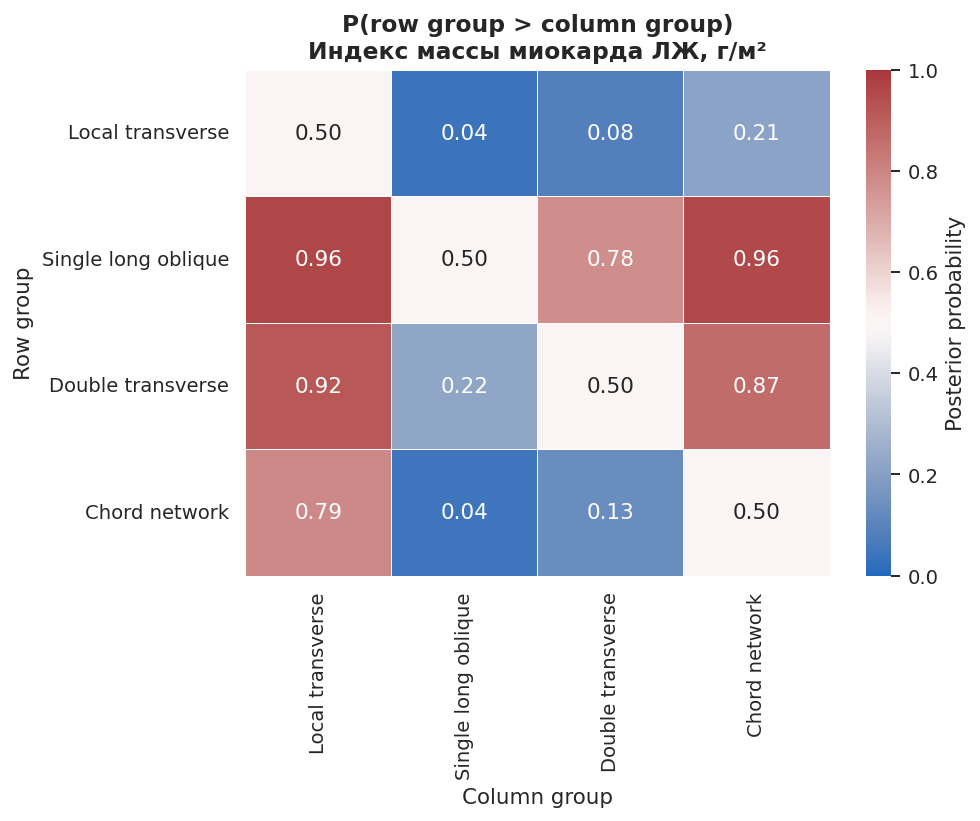

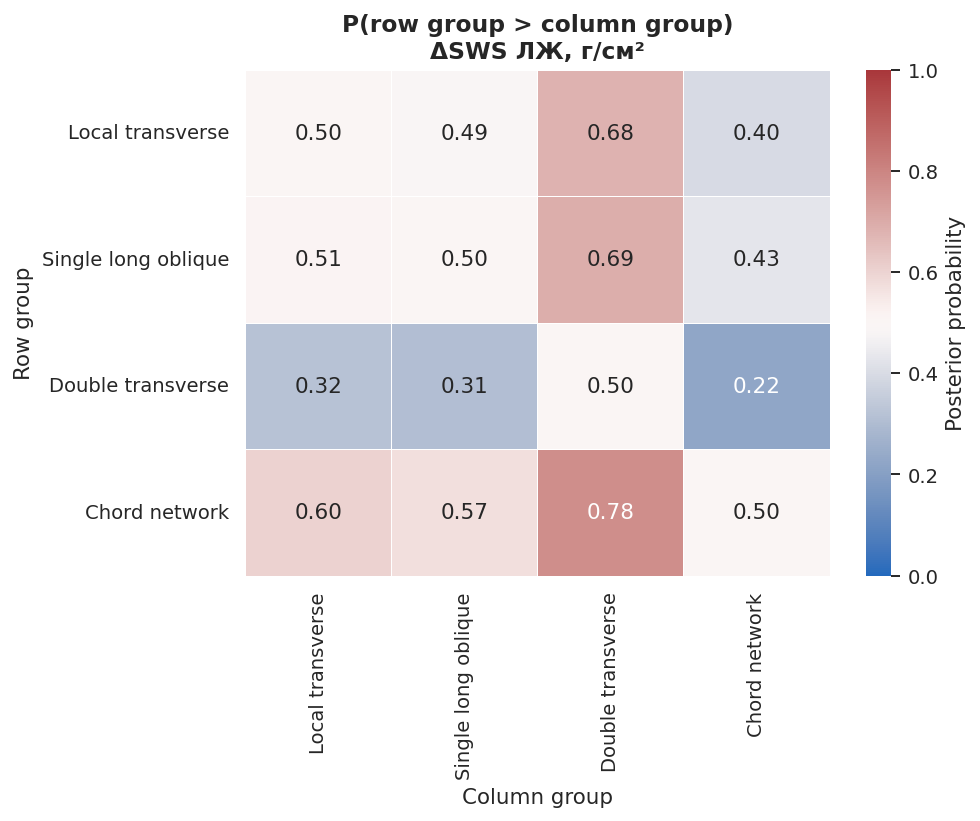

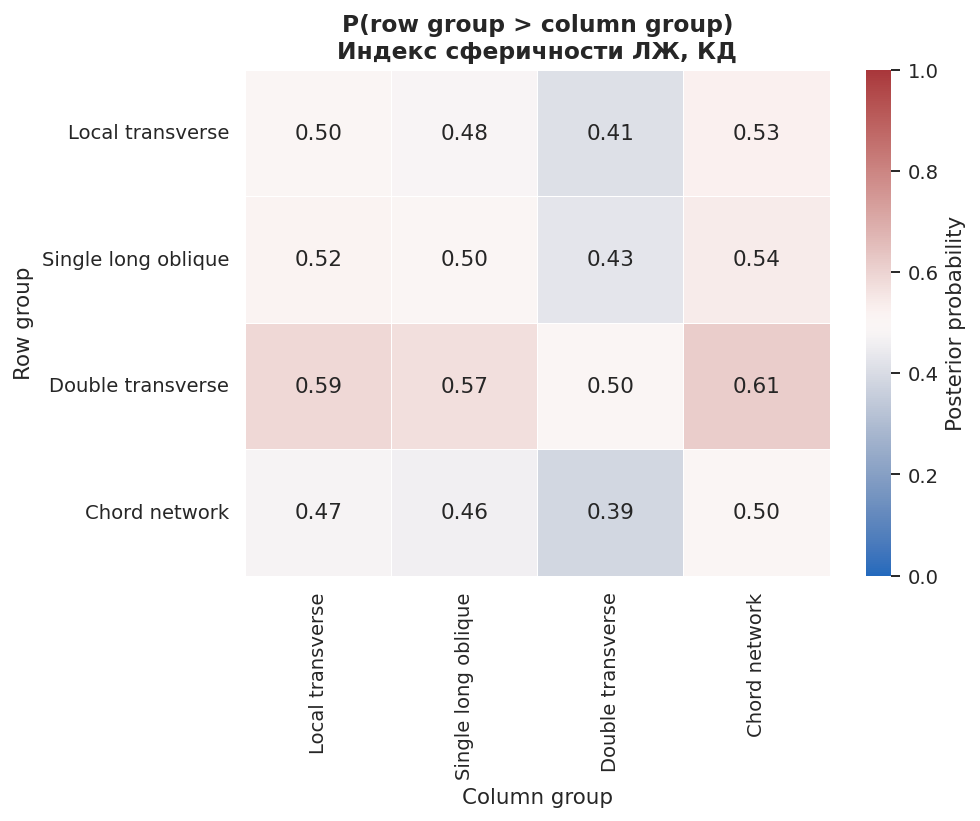

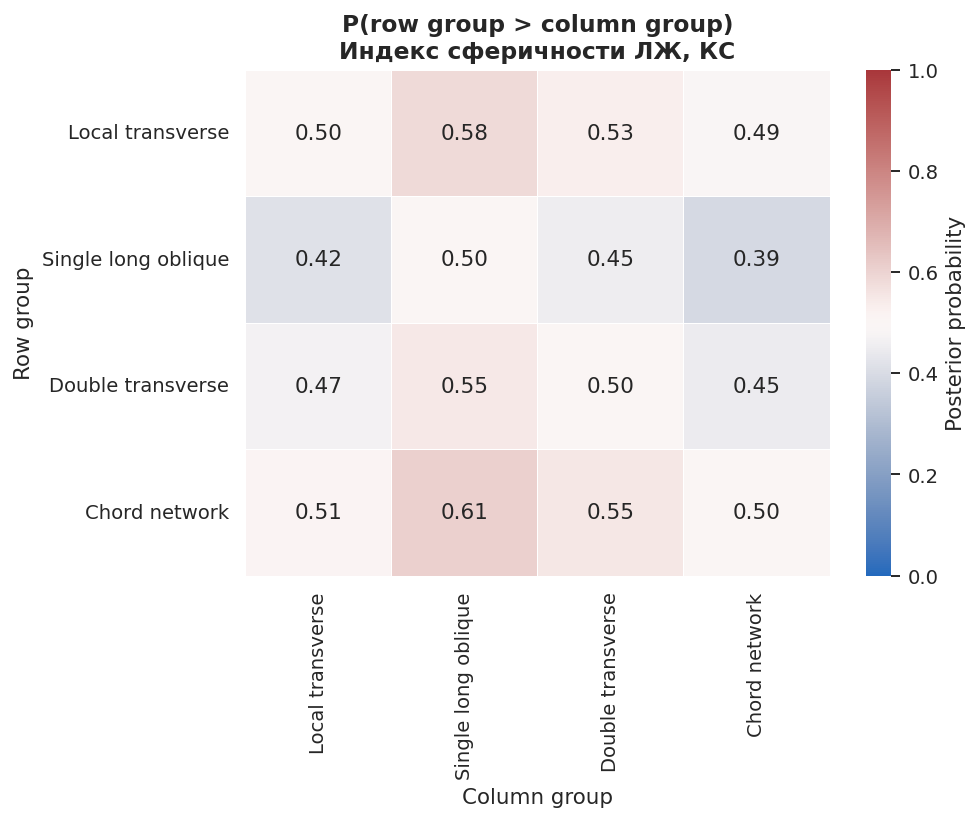

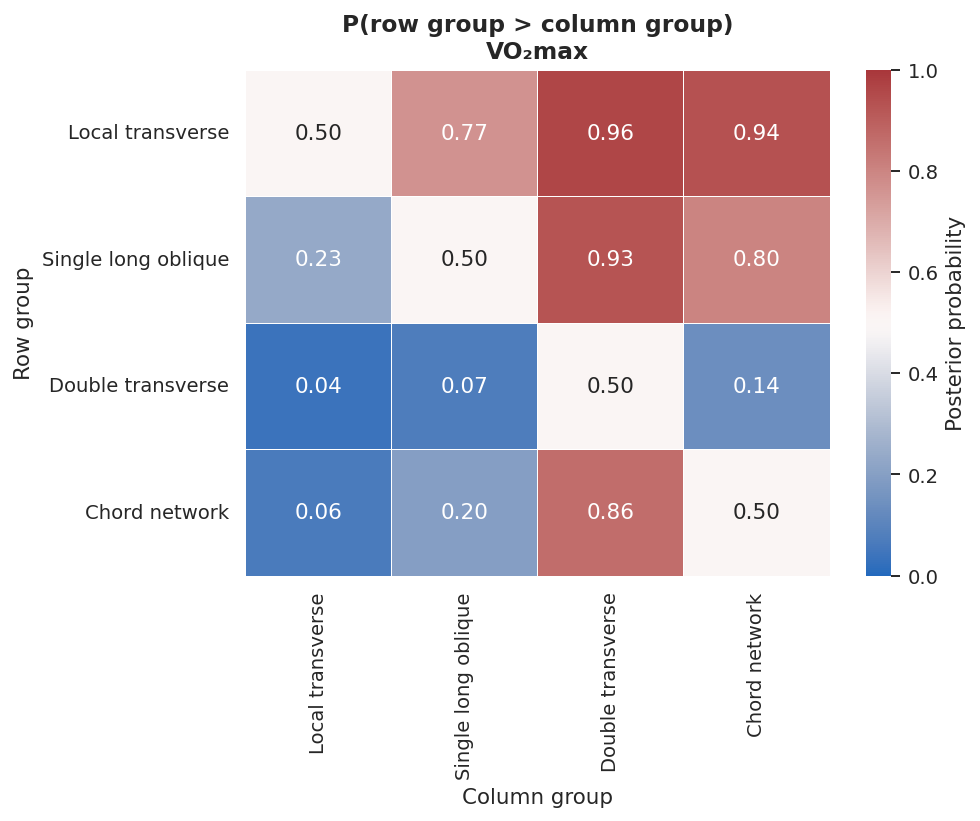

In [25]:
# ============================================================
# Heatmap: posterior probability group higher than another group
# ============================================================


def posterior_probability_matrix(alpha_draws):
    groups = list(alpha_draws.columns)
    mat = pd.DataFrame(index=groups, columns=groups, dtype=float)

    for row_group in groups:
        for col_group in groups:
            if row_group == col_group:
                mat.loc[row_group, col_group] = 0.5
            else:
                mat.loc[row_group, col_group] = np.mean(
                    alpha_draws[row_group].values > alpha_draws[col_group].values
                )

    return mat


def plot_probability_heatmap(outcome):
    if outcome not in posterior_group_draws:
        print(f"No posterior draws for {outcome}")
        return

    alpha_draws = posterior_group_draws[outcome]
    mat = posterior_probability_matrix(alpha_draws)

    groups = [g for g in ARCH_GROUP_ORDER if g in mat.index]
    mat = mat.loc[groups, groups]

    label_map = {g: ARCH_GROUP_LABELS_SHORT.get(g, g) for g in groups}
    mat_plot = mat.rename(index=label_map, columns=label_map)

    fig, ax = plt.subplots(figsize=(7.2, 6.0))

    sns.heatmap(
        mat_plot,
        annot=True,
        fmt=".2f",
        cmap="vlag",
        center=0.5,
        vmin=0,
        vmax=1,
        linewidths=0.5,
        linecolor="white",
        cbar_kws={"label": "Posterior probability"},
        ax=ax,
    )

    ax.set_title(f"P(row group > column group)\n{OUTCOME_INFO[outcome]['label_ru']}")

    ax.set_xlabel("Column group")
    ax.set_ylabel("Row group")

    plt.tight_layout()

    fig.savefig(
        FIGURES_DIR / f"19_posterior_probability_heatmap_{safe_filename(outcome)}.png",
        bbox_inches="tight",
    )

    plt.show()


for outcome in idatas.keys():
    plot_probability_heatmap(outcome)


,outcome,outcome_label_ru,ranking_interpretation,group,group_label,mean_rank,median_rank,p_rank_1,p_rank_2,p_rank_3,p_rank_4
0,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",rank1_highest,1_Local_transverse_or_low_angle,Local transverse,2.853750,3.0,0.133625,0.200125,0.345125,0.321125
1,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",rank1_highest,2_Single_long_oblique_bridge,Single long oblique,3.243875,4.0,0.069750,0.129375,0.288125,0.512750
2,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",rank1_highest,3_Double_transverse_no_long_oblique,Double transverse,2.140125,2.0,0.316250,0.343125,0.224875,0.115750
3,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",rank1_highest,4_Chord_network,Chord network,1.762250,2.0,0.480375,0.327375,0.141875,0.050375
4,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",rank1_highest,1_Local_transverse_or_low_angle,Local transverse,2.465750,2.0,0.267125,0.247625,0.237625,0.247625
5,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",rank1_highest,2_Single_long_oblique_bridge,Single long oblique,2.582125,3.0,0.222875,0.245375,0.258500,0.273250
6,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",rank1_highest,3_Double_transverse_no_long_oblique,Double transverse,2.199000,2.0,0.345625,0.276500,0.211125,0.166750
7,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",rank1_highest,4_Chord_network,Chord network,2.753125,3.0,0.164375,0.230500,0.292750,0.312375
8,dicor_ssou_cv_pct,"DICOR SSOU CV, %",rank1_highest,1_Local_transverse_or_low_angle,Local transverse,2.190000,2.0,0.290375,0.363500,0.211875,0.134250
9,dicor_ssou_cv_pct,"DICOR SSOU CV, %",rank1_highest,2_Single_long_oblique_bridge,Single long oblique,3.074000,3.0,0.061500,0.179250,0.383000,0.376250


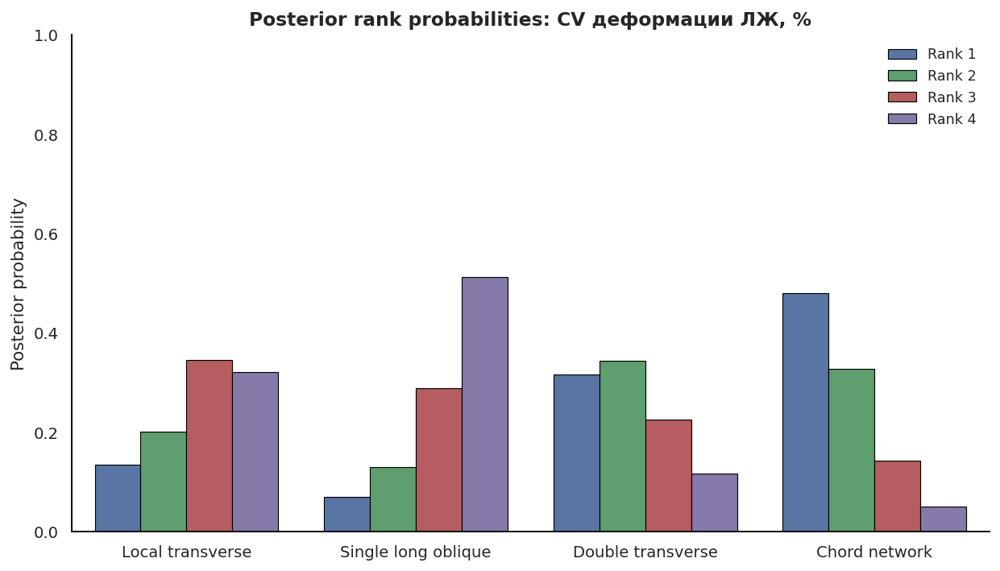

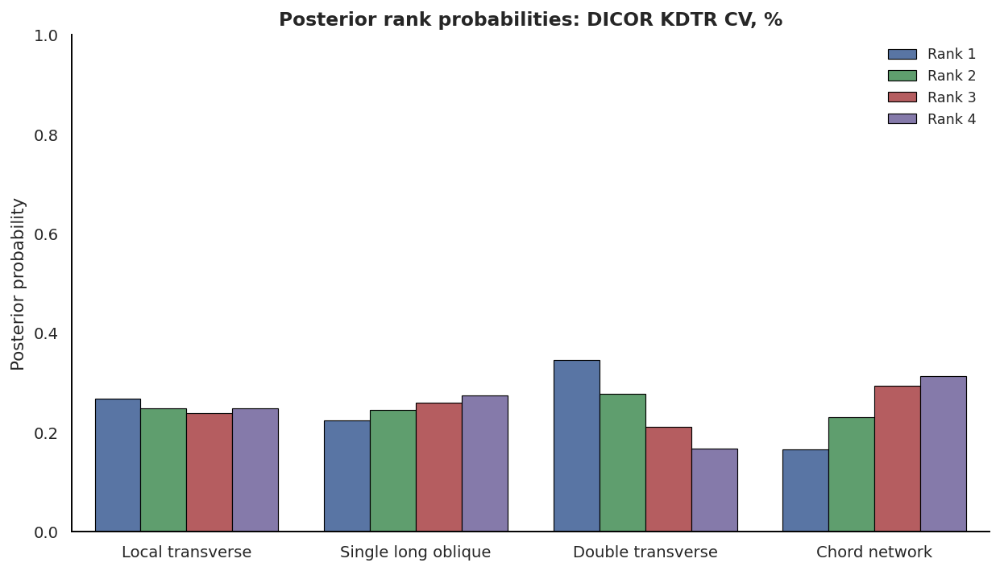

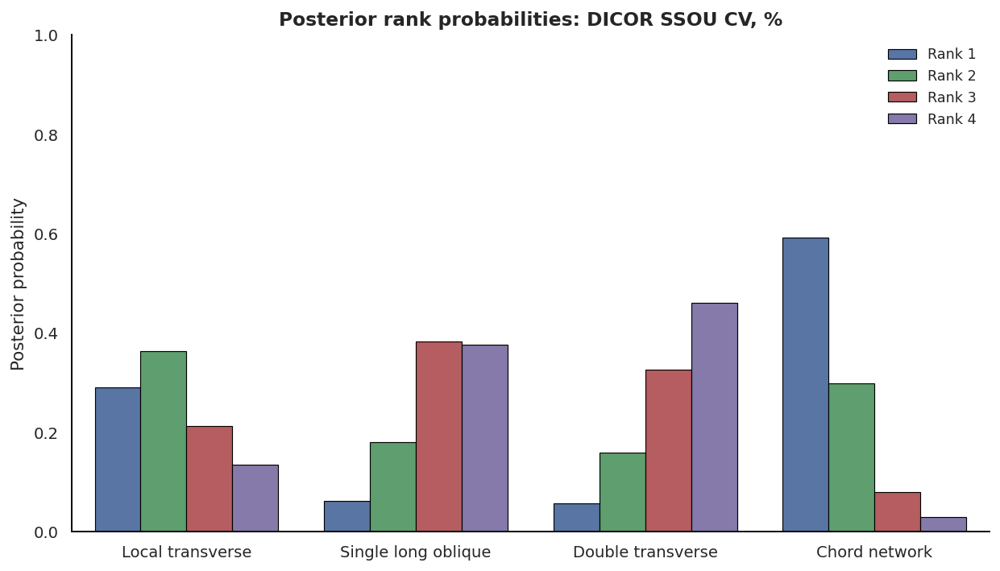

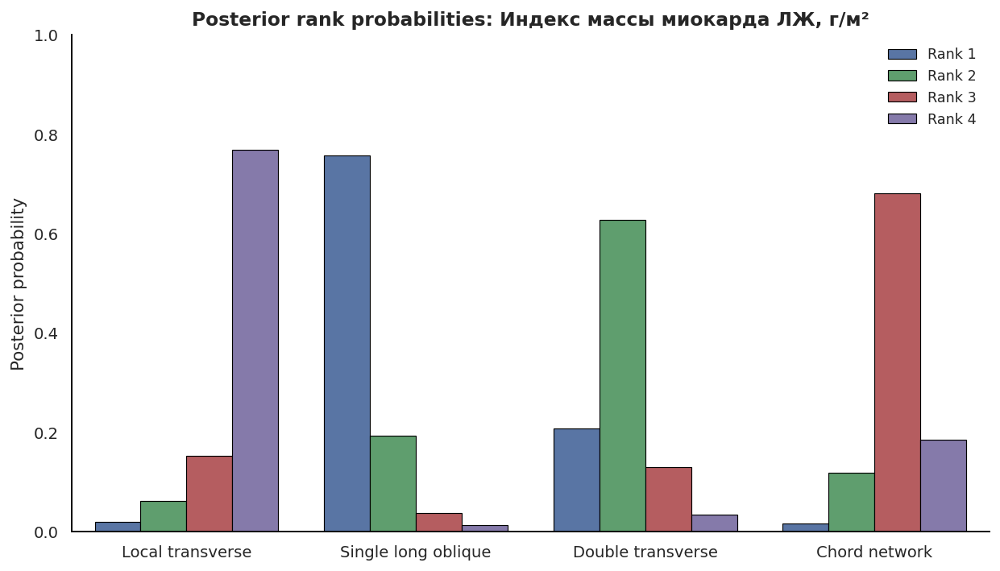

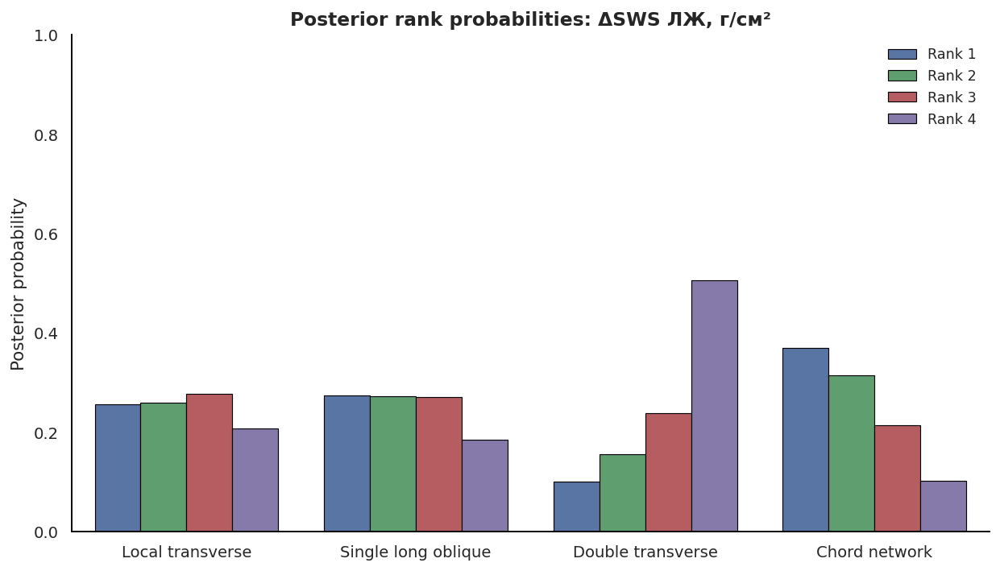

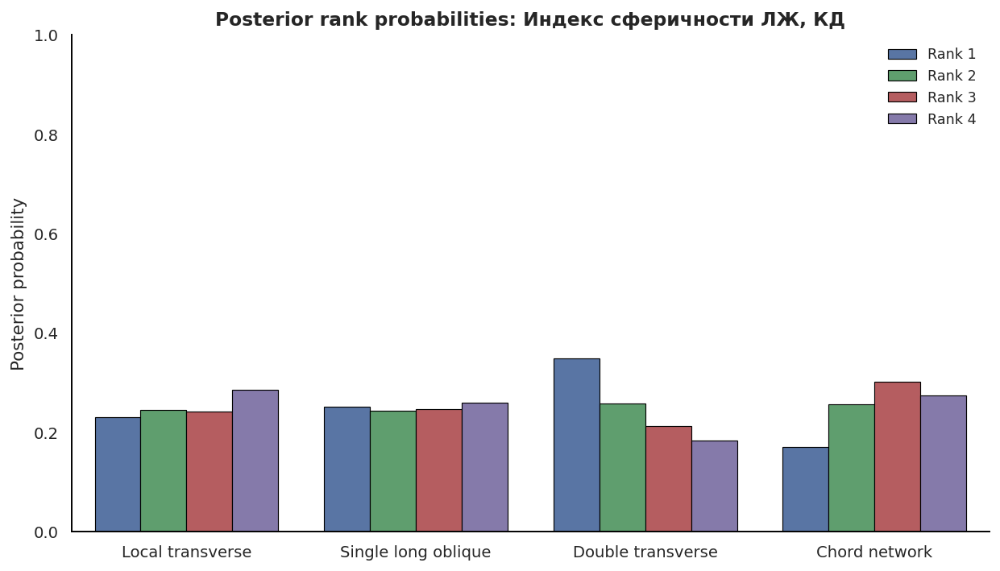

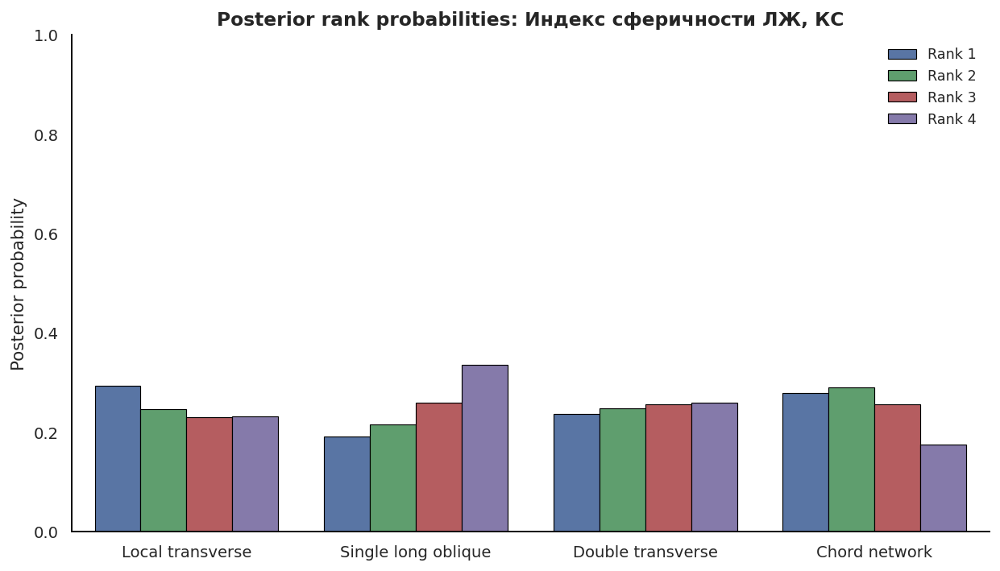

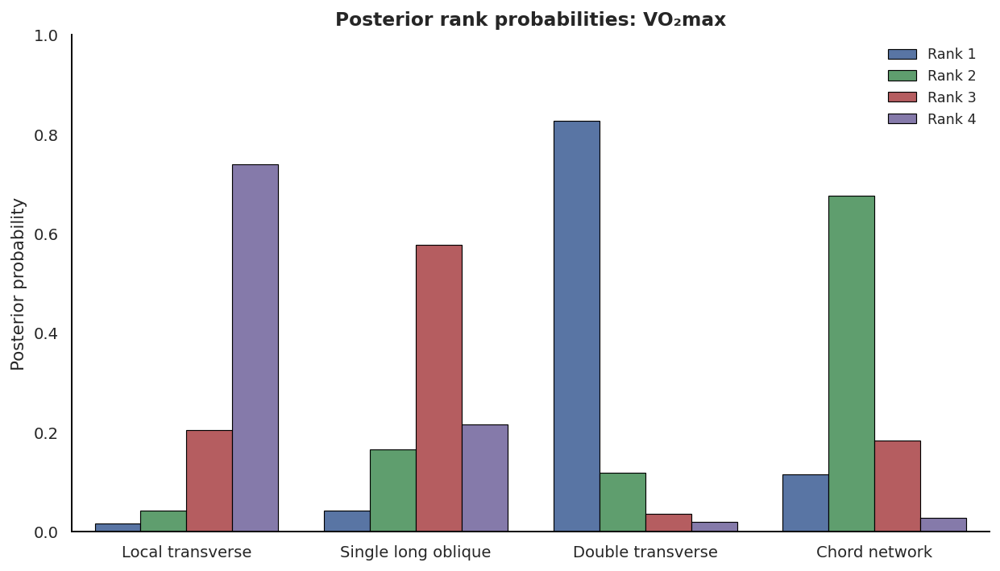

In [26]:
# ============================================================
# Posterior ranking of groups
# ============================================================


def compute_posterior_ranking(alpha_draws, higher_is_worse=True):
    """
    higher_is_worse=True:
        rank 1 = highest value.

    higher_is_worse=False:
        rank 1 = lowest value.
    """

    arr = alpha_draws.values
    groups = list(alpha_draws.columns)

    if higher_is_worse:
        ranks = (-arr).argsort(axis=1).argsort(axis=1) + 1
    else:
        ranks = arr.argsort(axis=1).argsort(axis=1) + 1

    rows = []

    for j, group in enumerate(groups):
        group_ranks = ranks[:, j]

        row = {
            "group": group,
            "group_label": ARCH_GROUP_LABELS_SHORT.get(group, group),
            "mean_rank": np.mean(group_ranks),
            "median_rank": np.median(group_ranks),
        }

        for r in range(1, len(groups) + 1):
            row[f"p_rank_{r}"] = np.mean(group_ranks == r)

        rows.append(row)

    return pd.DataFrame(rows)


ranking_rows = []

for outcome, alpha_draws in posterior_group_draws.items():
    # Для VO2max низкое значение хуже.
    # Для CV/SWS/массы более высокое значение интерпретируется как большая цена/нагрузка.
    higher_is_worse = outcome != "vo2_max_absolute_ml_min"

    ranking_df = compute_posterior_ranking(
        alpha_draws,
        higher_is_worse=higher_is_worse,
    )

    ranking_df.insert(0, "outcome", outcome)
    ranking_df.insert(1, "outcome_label_ru", OUTCOME_INFO[outcome]["label_ru"])
    ranking_df.insert(
        2,
        "ranking_interpretation",
        "rank1_highest" if higher_is_worse else "rank1_lowest",
    )

    ranking_rows.append(ranking_df)

posterior_ranking_df = pd.concat(ranking_rows, ignore_index=True)

display(posterior_ranking_df)

posterior_ranking_df.to_excel(
    TABLES_DIR / "19_posterior_group_ranking.xlsx",
    index=False,
)


def plot_posterior_rank_probabilities(outcome):
    d = posterior_ranking_df[posterior_ranking_df["outcome"] == outcome].copy()

    if d.empty:
        print(f"No ranking data for {outcome}")
        return

    rank_cols = [c for c in d.columns if c.startswith("p_rank_")]

    long = d.melt(
        id_vars=["group", "group_label"],
        value_vars=rank_cols,
        var_name="rank",
        value_name="probability",
    )

    long["rank"] = long["rank"].str.replace("p_rank_", "Rank ", regex=False)

    fig, ax = plt.subplots(figsize=(9.0, 5.2))

    sns.barplot(
        data=long,
        x="group_label",
        y="probability",
        hue="rank",
        edgecolor="black",
        linewidth=0.6,
        ax=ax,
    )

    ax.set_title(f"Posterior rank probabilities: {OUTCOME_INFO[outcome]['label_ru']}")
    ax.set_xlabel("")
    ax.set_ylabel("Posterior probability")
    ax.set_ylim(0, 1)

    ax.legend(title="", loc="upper right", fontsize=9)

    sns.despine(ax=ax)
    plt.tight_layout()

    fig.savefig(
        FIGURES_DIR / f"19_posterior_ranking_{safe_filename(outcome)}.png",
        bbox_inches="tight",
    )

    plt.show()


for outcome in idatas.keys():
    plot_posterior_rank_probabilities(outcome)



Posterior predictive check: merged_lv_deformation_cv_pct


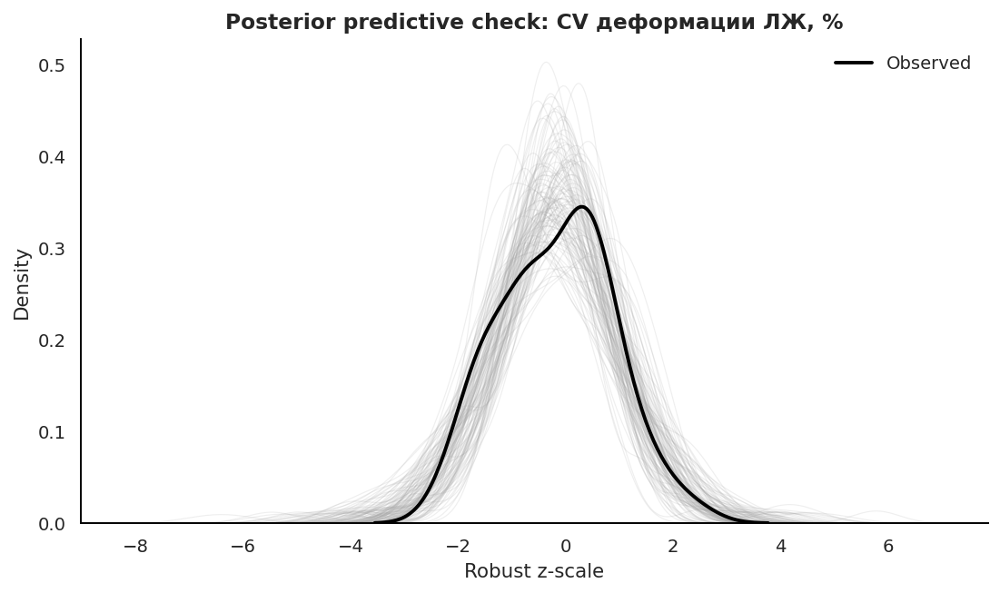


Posterior predictive check: dicor_sm_kdtr_cv_pct


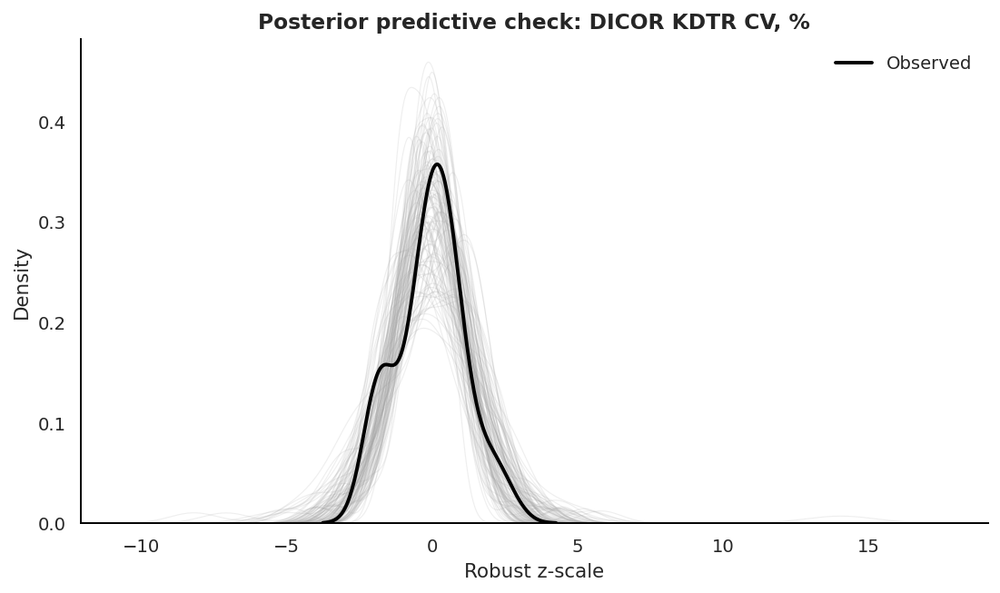


Posterior predictive check: dicor_ssou_cv_pct


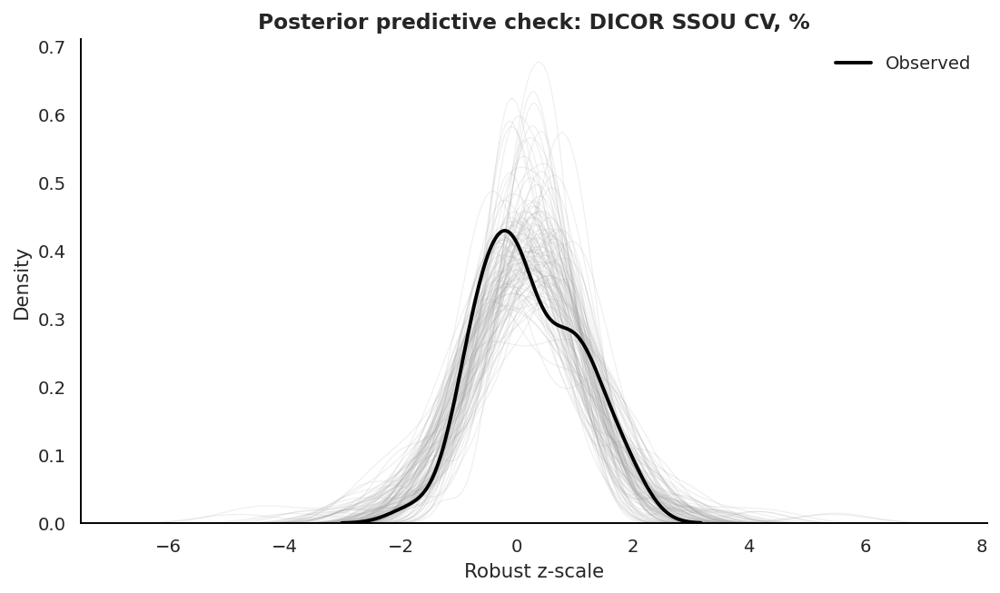


Posterior predictive check: echo_lv_myocardial_mass_index_g_m2


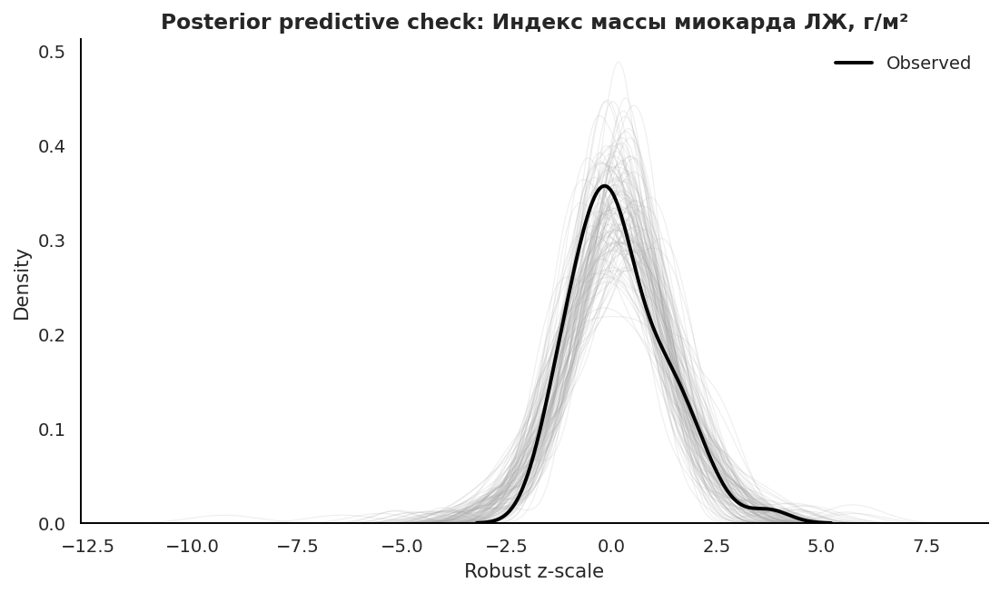


Posterior predictive check: echo_lv_sws_delta_g_cm2


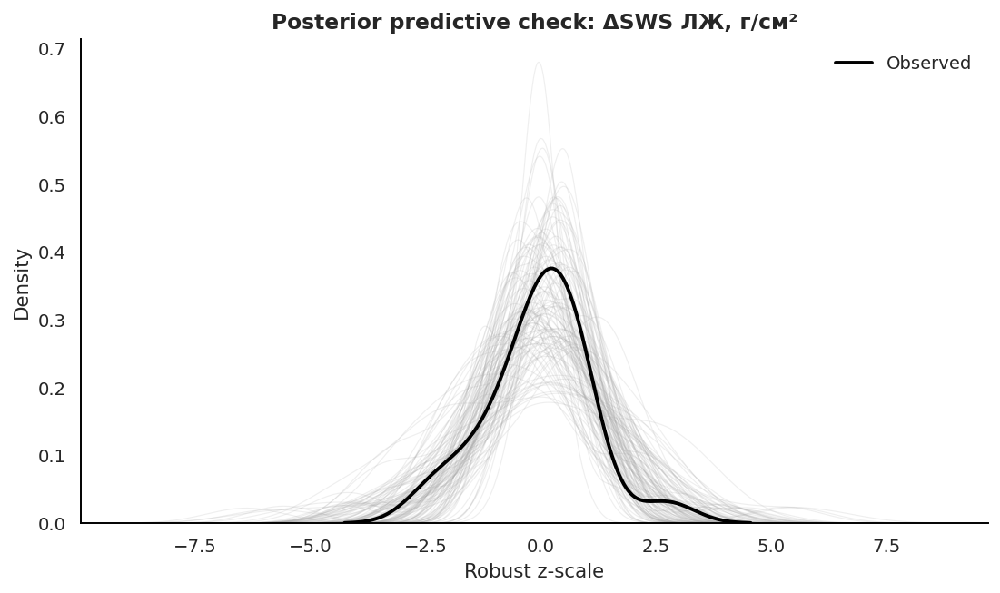


Posterior predictive check: echo_lv_sphericity_index_end_diastolic_ratio


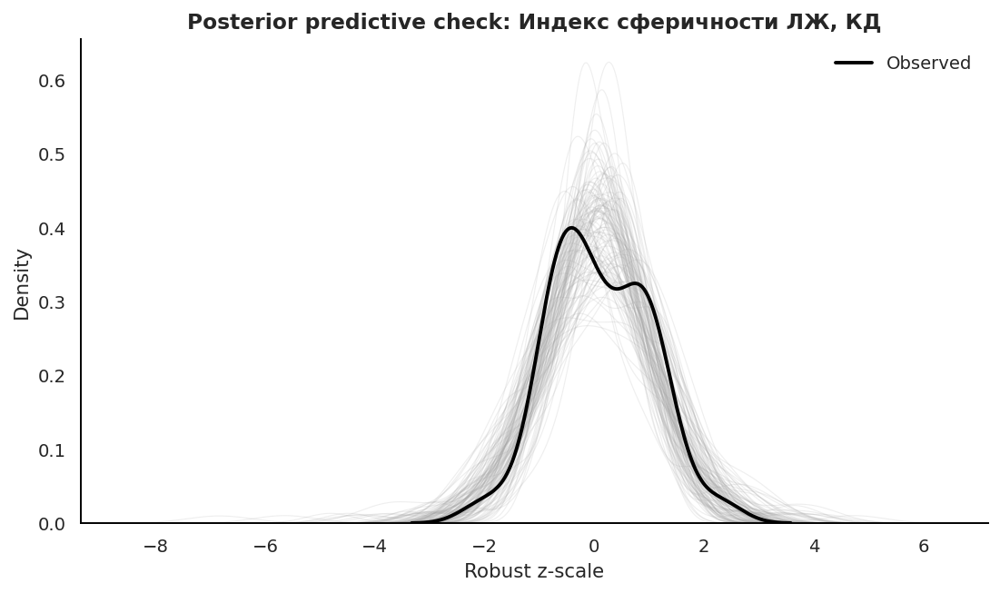


Posterior predictive check: echo_lv_sphericity_index_end_systolic_ratio


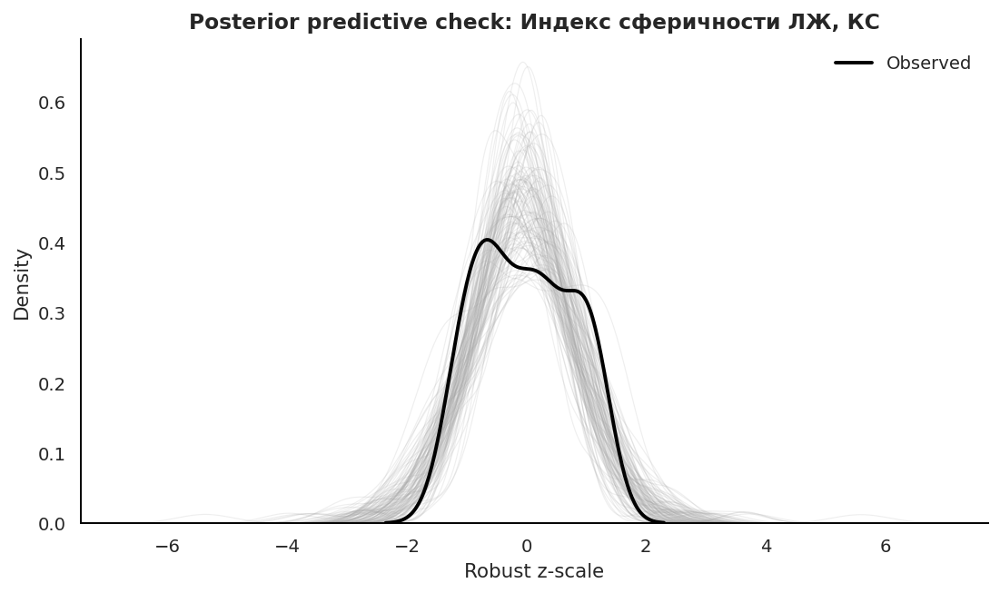


Posterior predictive check: vo2_max_absolute_ml_min


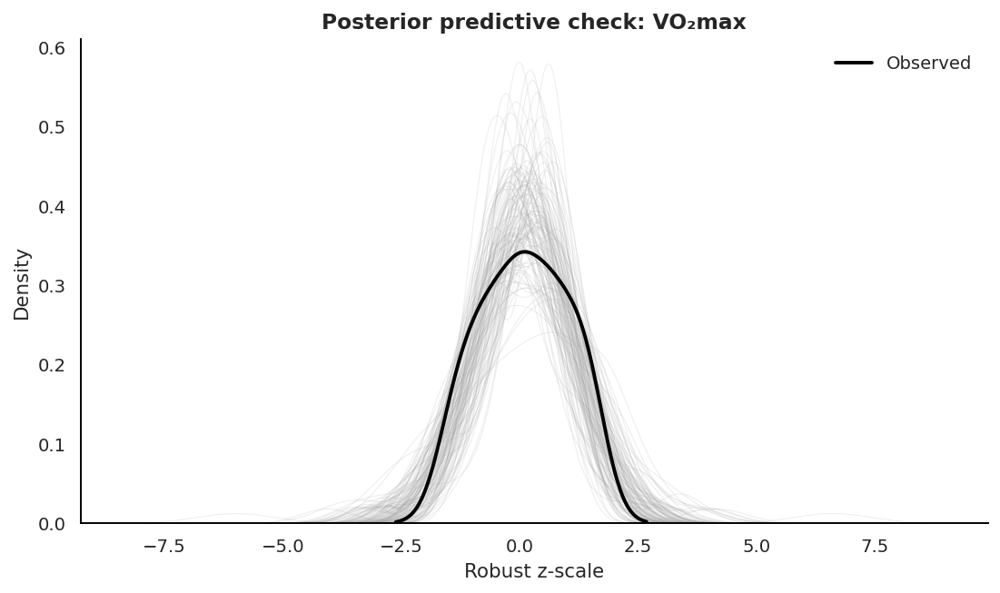

In [27]:
# ============================================================
# Posterior predictive checks
# Custom version, no az.plot_ppc()
# ============================================================


def extract_observed_y(model_data):
    return np.asarray(model_data["y_z"].values, dtype=float)


def extract_ppc_y(idata):
    """
    Достает y_obs из posterior_predictive.
    Возвращает массив samples x observations.
    """

    if not has_idata_group(idata, "posterior_predictive"):
        return None

    ppc = get_idata_group(idata, "posterior_predictive")

    if "y_obs" not in ppc.data_vars:
        return None

    y_ppc = ppc["y_obs"]

    # Обычно dims: chain, draw, obs_id
    stack_dims = [d for d in ["chain", "draw"] if d in y_ppc.dims]

    if len(stack_dims) == 2:
        y_ppc_stacked = y_ppc.stack(sample=("chain", "draw")).transpose("sample", "obs_id")
        return np.asarray(y_ppc_stacked.values, dtype=float)

    values = np.asarray(y_ppc.values, dtype=float)
    values = np.squeeze(values)

    if values.ndim == 2:
        return values

    return None


def plot_custom_ppc(outcome):
    if outcome not in idatas:
        return

    idata = idatas[outcome]
    model_data = model_data_store[outcome]

    y_obs = extract_observed_y(model_data)
    y_ppc = extract_ppc_y(idata)

    if y_ppc is None:
        print(f"No PPC data for {outcome}")
        return

    # ограничиваем количество PPC-кривых
    n_ppc = min(120, y_ppc.shape[0])
    idx = np.random.default_rng(RANDOM_SEED).choice(
        np.arange(y_ppc.shape[0]),
        size=n_ppc,
        replace=False,
    )

    fig, ax = plt.subplots(figsize=(8.0, 4.8))

    # PPC density curves
    for i in idx:
        sns.kdeplot(
            y_ppc[i, :],
            color="0.65",
            linewidth=0.6,
            alpha=0.18,
            ax=ax,
        )

    # Observed density
    sns.kdeplot(
        y_obs,
        color="black",
        linewidth=2.0,
        label="Observed",
        ax=ax,
    )

    ax.set_title(f"Posterior predictive check: {OUTCOME_INFO[outcome]['label_ru']}")
    ax.set_xlabel("Robust z-scale")
    ax.set_ylabel("Density")
    ax.legend(loc="best")

    sns.despine(ax=ax)
    plt.tight_layout()

    fig.savefig(
        FIGURES_DIR / f"19_ppc_custom_{safe_filename(outcome)}.png",
        bbox_inches="tight",
        dpi=300,
    )

    plt.show()


for outcome in idatas.keys():
    print("\nPosterior predictive check:", outcome)
    plot_custom_ppc(outcome)


## 7. Сравнение Student-t и Gaussian likelihood

Так как распределения ключевых outcomes не являются нормальными, основной моделью является Student-t.

Для sensitivity можно сравнить Student-t и Gaussian likelihood.  
Однако из-за новой связки PyMC 6 / ArviZ 1.1.0 автоматический LOO может быть нестабилен, поэтому основной критерий устойчивости:

- posterior predictive checks;
- отсутствие divergences;
- стабильность направления predefined contrasts;
- стабильность posterior ranking.

In [28]:
# ============================================================
# Sensitivity: Student-t vs Gaussian for selected outcomes
# ============================================================

RUN_GAUSSIAN_SENSITIVITY = False
SAVE_IDATA = False

SENSITIVITY_OUTCOMES = [
    "merged_lv_deformation_cv_pct",
    "dicor_sm_kdtr_cv_pct",
    "echo_lv_myocardial_mass_index_g_m2",
]

SENSITIVITY_OUTCOMES = [c for c in SENSITIVITY_OUTCOMES if c in idatas]

gaussian_idatas = {}

if RUN_GAUSSIAN_SENSITIVITY:
    for outcome in SENSITIVITY_OUTCOMES:
        print("\n" + "=" * 110)
        print("Gaussian sensitivity model:", outcome)

        model_data = model_data_store[outcome]
        meta = model_metas[outcome]

        g_model, g_idata = fit_gaussian_group_model(
            model_data=model_data,
            meta=meta,
            adjusted=False,
            model_name=f"{outcome}_gaussian_group",
        )

        gaussian_idatas[outcome] = g_idata

        print("Gaussian model fitted.")

else:
    print("Gaussian sensitivity models are disabled. Set RUN_GAUSSIAN_SENSITIVITY = True to run.")


Gaussian sensitivity models are disabled. Set RUN_GAUSSIAN_SENSITIVITY = True to run.


In [29]:
# ============================================================
# Sensitivity analysis: ΔSWS without extreme upper outlier
# ============================================================

RUN_DELTA_SWS_SENSITIVITY = True
SAVE_IDATA = False

SWS_OUTCOME = "echo_lv_sws_delta_g_cm2"

sws_sensitivity = None

if RUN_MCMC and RUN_DELTA_SWS_SENSITIVITY and SWS_OUTCOME in df_v3.columns:
    sws_values = df_v3[SWS_OUTCOME].dropna().astype(float)

    q1, q3 = np.percentile(sws_values, [25, 75])
    iqr = q3 - q1
    upper_bound = q3 + 1.5 * iqr

    print("ΔSWS Q1:", q1)
    print("ΔSWS Q3:", q3)
    print("ΔSWS IQR:", iqr)
    print("ΔSWS upper outlier bound:", upper_bound)

    df_v3_sws_no_extreme = df_v3[
        (df_v3[SWS_OUTCOME].isna()) | (df_v3[SWS_OUTCOME] <= upper_bound)
    ].copy()

    print("Original n with ΔSWS:", df_v3[SWS_OUTCOME].notna().sum())
    print("After excluding extreme:", df_v3_sws_no_extreme[SWS_OUTCOME].notna().sum())

    model_data_sws_sens, meta_sws_sens = prepare_model_data(
        df_v3_sws_no_extreme,
        outcome=SWS_OUTCOME,
        covariates=None,
        min_group_n=2,
    )

    print("Sensitivity model n:", meta_sws_sens["n"])
    print("Groups:", meta_sws_sens["group_names"])
    print("Transform:", meta_sws_sens.get("transform", "identity"))

    display(
        model_data_sws_sens[ARCH_GROUP_COL].value_counts().reindex(meta_sws_sens["group_names"])
    )

    if meta_sws_sens["n"] >= 8 and len(meta_sws_sens["group_names"]) >= 2:
        model_sws_sens, idata_sws_sens = fit_student_t_group_model(
            model_data=model_data_sws_sens,
            meta=meta_sws_sens,
            adjusted=False,
            model_name="delta_sws_student_t_log1p_without_extreme",
        )

        sws_sensitivity = {
            "model": model_sws_sens,
            "idata": idata_sws_sens,
            "meta": meta_sws_sens,
            "model_data": model_data_sws_sens,
            "upper_bound": upper_bound,
        }

        print("Sensitivity ΔSWS model fitted.")

    else:
        print("SKIP sensitivity ΔSWS model: too few observations or groups.")
else:
    print("ΔSWS sensitivity was not fitted.")


ΔSWS Q1: 16.53414820473645
ΔSWS Q3: 36.85403774514332
ΔSWS IQR: 20.319889540406873
ΔSWS upper outlier bound: 67.33387205575363
Original n with ΔSWS: 21
After excluding extreme: 20
Sensitivity model n: 20
Groups: ['1_Local_transverse_or_low_angle', '2_Single_long_oblique_bridge', '3_Double_transverse_no_long_oblique', '4_Chord_network']
Transform: log1p


chord_architecture_v3
1_Local_transverse_or_low_angle         2
2_Single_long_oblique_bridge            3
3_Double_transverse_no_long_oblique     2
4_Chord_network                        13
Name: count, dtype: int64

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, tau_alpha, alpha_raw, sigma, nu_minus_two]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 24 seconds.
Sampling: [y_obs]


Sensitivity ΔSWS model fitted.


## 8. Interaction model: ΔSWS × chord architecture v3

Следующая модель проверяет идею:

> архитектура хорд может не столько повышать сам ΔSWS, сколько менять связь между ΔSWS и региональной неоднородностью деформации.

Основная модель:

\[
CV_i \sim StudentT(\nu, \mu_i, \sigma)
\]

\[
\mu_i = \alpha_{group[i]} + \beta_{SWS,group[i]} \cdot \Delta SWS_i
\]

То есть для каждой v3-группы оценивается свой наклон связи между ΔSWS и CV деформации.

Это exploratory mechanistic model, а не причинная модель.

In [30]:
# ============================================================
# Interaction model: ΔSWS × chord architecture v3 -> CV deformation
# ============================================================

RUN_INTERACTION_MODEL = True
SAVE_IDATA = False

INTERACTION_Y = "merged_lv_deformation_cv_pct"
INTERACTION_X = "echo_lv_sws_delta_g_cm2"

interaction_model = None
interaction_idata = None
interaction_meta = None
interaction_data = None

if (
    RUN_MCMC
    and RUN_INTERACTION_MODEL
    and INTERACTION_Y in df_v3.columns
    and INTERACTION_X in df_v3.columns
):
    d_int = df_v3[[ARCH_GROUP_COL, INTERACTION_Y, INTERACTION_X]].copy()
    d_int = d_int[d_int[ARCH_GROUP_COL].isin(ARCH_GROUP_ORDER)]
    d_int = d_int.dropna(subset=[INTERACTION_Y, INTERACTION_X])

    group_counts = d_int[ARCH_GROUP_COL].value_counts()
    keep_groups = [g for g in ARCH_GROUP_ORDER if group_counts.get(g, 0) >= 2]

    d_int = d_int[d_int[ARCH_GROUP_COL].isin(keep_groups)].copy()

    d_int[ARCH_GROUP_COL] = pd.Categorical(
        d_int[ARCH_GROUP_COL],
        categories=keep_groups,
        ordered=True,
    )

    d_int["group_idx"] = d_int[ARCH_GROUP_COL].cat.codes.astype(int)

    # Raw variables
    d_int["y_raw"] = pd.to_numeric(d_int[INTERACTION_Y], errors="coerce")
    d_int["x_raw"] = pd.to_numeric(d_int[INTERACTION_X], errors="coerce")

    # Outcome-specific transforms
    y_transform = OUTCOME_TRANSFORM.get(INTERACTION_Y, "identity")
    x_transform = OUTCOME_TRANSFORM.get(INTERACTION_X, "identity")

    d_int["y_transformed"] = apply_outcome_transform(d_int["y_raw"], y_transform)
    d_int["x_transformed"] = apply_outcome_transform(d_int["x_raw"], x_transform)

    # Robust z-scaling after transform
    d_int["y_z"], y_center, y_scale = robust_center_scale(d_int["y_transformed"])
    d_int["x_z"], x_center, x_scale = robust_center_scale(d_int["x_transformed"])

    group_names = list(d_int[ARCH_GROUP_COL].cat.categories)

    interaction_meta = {
        "y": INTERACTION_Y,
        "x": INTERACTION_X,
        "y_transform": y_transform,
        "x_transform": x_transform,
        "y_center": y_center,
        "y_scale": y_scale,
        "x_center": x_center,
        "x_scale": x_scale,
        "group_names": group_names,
        "n": len(d_int),
    }

    print("Interaction model n:", len(d_int))
    print("Groups:", group_names)
    print("Y transform:", y_transform)
    print("X transform:", x_transform)

    display(d_int[ARCH_GROUP_COL].value_counts().reindex(group_names))

    if len(d_int) >= 10 and len(group_names) >= 2:
        coords = {
            "obs_id": np.arange(len(d_int)),
            "group": group_names,
        }

        with pm.Model(coords=coords) as interaction_model:
            group_idx = pm.Data(
                "group_idx",
                d_int["group_idx"].values.astype(int),
                dims="obs_id",
            )

            x = pm.Data(
                "x_z",
                d_int["x_z"].values.astype(float),
                dims="obs_id",
            )

            # Intercepts
            mu_alpha = pm.Normal("mu_alpha", 0, 1)
            tau_alpha = pm.HalfNormal("tau_alpha", 1)
            alpha_raw = pm.Normal("alpha_raw", 0, 1, dims="group")

            alpha = pm.Deterministic(
                "alpha",
                mu_alpha + alpha_raw * tau_alpha,
                dims="group",
            )

            # Group-specific slopes
            mu_beta = pm.Normal("mu_beta", 0, 0.5)
            tau_beta = pm.HalfNormal("tau_beta", 0.5)
            beta_raw = pm.Normal("beta_raw", 0, 1, dims="group")

            beta = pm.Deterministic(
                "beta",
                mu_beta + beta_raw * tau_beta,
                dims="group",
            )

            mu = alpha[group_idx] + beta[group_idx] * x

            sigma = pm.HalfStudentT("sigma", nu=4, sigma=1.0)

            nu_minus_two = pm.Exponential("nu_minus_two", lam=1 / 10)

            nu = pm.Deterministic(
                "nu",
                nu_minus_two + 2,
            )

            pm.StudentT(
                "y_obs",
                nu=nu,
                mu=mu,
                sigma=sigma,
                observed=d_int["y_z"].values.astype(float),
                dims="obs_id",
            )

            interaction_idata = pm.sample(**MCMC_KWARGS)

            interaction_idata = pm.sample_posterior_predictive(
                interaction_idata,
                var_names=["y_obs"],
                extend_inferencedata=True,
                random_seed=RANDOM_SEED,
            )

        interaction_data = d_int.copy()

        print("Interaction model fitted.")

    else:
        print("SKIP interaction model: too few observations or groups.")
else:
    print("Interaction model was not fitted.")


Interaction model n: 20
Groups: ['1_Local_transverse_or_low_angle', '2_Single_long_oblique_bridge', '3_Double_transverse_no_long_oblique', '4_Chord_network']
Y transform: log
X transform: log1p


chord_architecture_v3
1_Local_transverse_or_low_angle         2
2_Single_long_oblique_bridge            3
3_Double_transverse_no_long_oblique     2
4_Chord_network                        13
Name: count, dtype: int64

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, tau_alpha, alpha_raw, mu_beta, tau_beta, beta_raw, sigma, nu_minus_two]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 36 seconds.
Sampling: [y_obs]


Interaction model fitted.


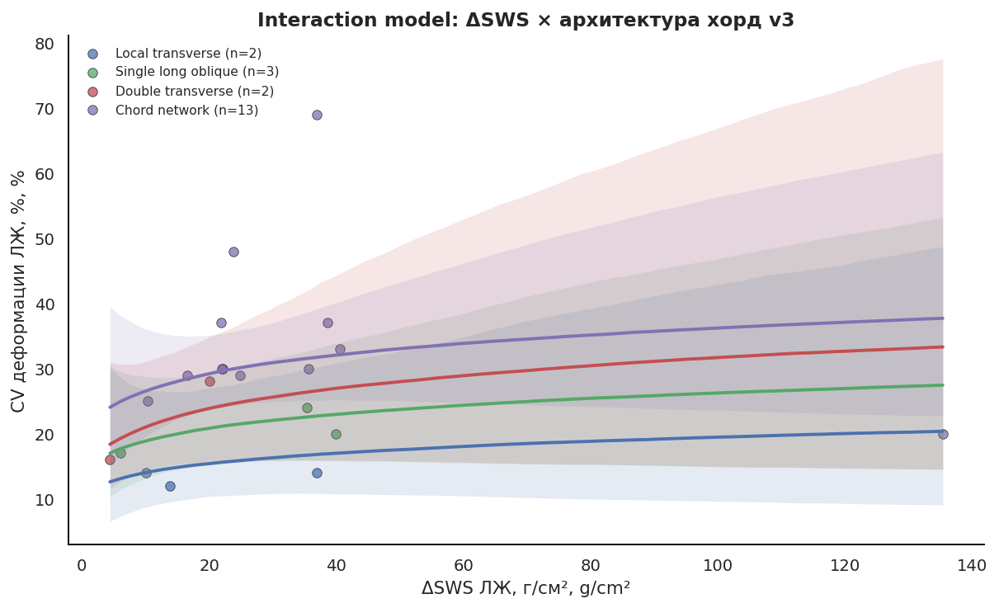

In [ ]:
# ============================================================
# Visualize interaction model fitted lines
# ============================================================


def plot_interaction_fitted_lines():
    if interaction_idata is None or interaction_data is None:
        print("No interaction model fitted.")
        return

    d = interaction_data.copy()

    posterior = get_idata_group(interaction_idata, "posterior")

    alpha = posterior["alpha"].stack(sample=("chain", "draw")).transpose("sample", "group").values

    beta = posterior["beta"].stack(sample=("chain", "draw")).transpose("sample", "group").values

    group_names = interaction_meta["group_names"]

    x_grid_raw = np.linspace(d["x_raw"].min(), d["x_raw"].max(), 80)

    x_grid_transformed = apply_outcome_transform(
        pd.Series(x_grid_raw),
        interaction_meta["x_transform"],
    ).values

    x_grid_z = (x_grid_transformed - interaction_meta["x_center"]) / interaction_meta["x_scale"]

    fig, ax = plt.subplots(figsize=(8.8, 5.4))

    # Raw points
    for group in group_names:
        sub = d[d[ARCH_GROUP_COL] == group]

        ax.scatter(
            sub["x_raw"],
            sub["y_raw"],
            s=35,
            alpha=0.75,
            color=ARCH_PALETTE.get(group, "black"),
            edgecolor="black",
            linewidth=0.4,
            label=f"{ARCH_GROUP_LABELS_SHORT.get(group, group)} (n={len(sub)})",
        )

    # Fitted lines
    for g_idx, group in enumerate(group_names):
        mu_z_draws = alpha[:, g_idx][:, None] + beta[:, g_idx][:, None] * x_grid_z[None, :]

        mu_transformed_draws = inverse_robust_scale(
            mu_z_draws,
            center=interaction_meta["y_center"],
            scale=interaction_meta["y_scale"],
        )

        mu_raw_draws = inverse_outcome_transform(
            mu_transformed_draws,
            transform=interaction_meta["y_transform"],
        )

        median = np.median(mu_raw_draws, axis=0)
        low = np.percentile(mu_raw_draws, 2.5, axis=0)
        high = np.percentile(mu_raw_draws, 97.5, axis=0)

        color = ARCH_PALETTE.get(group, "black")

        ax.plot(
            x_grid_raw,
            median,
            color=color,
            linewidth=2.0,
        )

        ax.fill_between(
            x_grid_raw,
            low,
            high,
            color=color,
            alpha=0.14,
            linewidth=0,
        )

    ax.set_title("Interaction model: ΔSWS × архитектура хорд")
    ax.set_xlabel(get_outcome_label(INTERACTION_X))
    ax.set_ylabel(get_outcome_label(INTERACTION_Y))

    ax.legend(loc="best", fontsize=8)

    sns.despine(ax=ax)
    plt.tight_layout()

    fig.savefig(
        FIGURES_DIR / "19_interaction_delta_sws_by_architecture_cv_fitted_lines.png",
        bbox_inches="tight",
    )

    plt.show()


plot_interaction_fitted_lines()


In [32]:
# ============================================================
# Interaction slopes posterior summary
# ============================================================

if interaction_idata is not None:
    posterior = get_idata_group(interaction_idata, "posterior")

    beta = posterior["beta"].stack(sample=("chain", "draw")).transpose("sample", "group")

    beta_draws = beta.values
    group_names = list(beta["group"].values)

    # Slope in transformed-z terms:
    # y_z per x_z.
    # Для исходной шкалы при log/log1p это не постоянная разница,
    # поэтому честнее сохраняем slope на z-transformed шкале.
    slope_rows = []

    for j, group in enumerate(group_names):
        draws = beta_draws[:, j]
        s = summarize_draws(draws)

        slope_rows.append(
            {
                "group": group,
                "group_label": ARCH_GROUP_LABELS_SHORT.get(group, group),
                "x": INTERACTION_X,
                "y": INTERACTION_Y,
                "x_transform": interaction_meta["x_transform"],
                "y_transform": interaction_meta["y_transform"],
                "interpretation": "slope on robust z-scale after transformations",
                "p_slope_gt_0": np.mean(draws > 0),
                "p_slope_lt_0": np.mean(draws < 0),
                "p_direction": max(np.mean(draws > 0), np.mean(draws < 0)),
                **s,
            }
        )

    interaction_slopes_df = pd.DataFrame(slope_rows)

    display(interaction_slopes_df)

    interaction_slopes_df.to_excel(
        TABLES_DIR / "19_interaction_slopes_delta_sws_by_v3_group.xlsx",
        index=False,
    )
else:
    print("No interaction model fitted.")


,group,group_label,x,y,x_transform,y_transform,interpretation,p_slope_gt_0,p_slope_lt_0,p_direction,mean,sd,median,cr89_low,cr89_high,cr95_low,cr95_high
0,1_Local_transverse_or_low_angle,Local transverse,echo_lv_sws_delta_g_cm2,merged_lv_deformation_cv_pct,log1p,log,slope on robust z-scale after transformations,0.814250,0.185750,0.814250,0.252930,0.341761,0.261576,-0.304540,0.767702,-0.495304,0.926628
1,2_Single_long_oblique_bridge,Single long oblique,echo_lv_sws_delta_g_cm2,merged_lv_deformation_cv_pct,log1p,log,slope on robust z-scale after transformations,0.844125,0.155875,0.844125,0.255581,0.266561,0.258965,-0.170654,0.672564,-0.278093,0.786797
2,3_Double_transverse_no_long_oblique,Double transverse,echo_lv_sws_delta_g_cm2,merged_lv_deformation_cv_pct,log1p,log,slope on robust z-scale after transformations,0.879750,0.120250,0.879750,0.321098,0.291697,0.317367,-0.127562,0.788540,-0.249305,0.916557
3,4_Chord_network,Chord network,echo_lv_sws_delta_g_cm2,merged_lv_deformation_cv_pct,log1p,log,slope on robust z-scale after transformations,0.839625,0.160375,0.839625,0.245601,0.252122,0.247660,-0.154866,0.645970,-0.254633,0.744600


## 9. Таблицы для статьи

Финальные таблицы:

1. Описательная статистика по группам v3.
2. Posterior group estimates.
3. Posterior pairwise contrasts.
4. Предзаданные механистические контрасты.
5. Ratio-контрасты для log/log1p моделей.
6. Posterior ranking.
7. Диагностика MCMC.
8. Sensitivity analysis для ΔSWS.
9. Interaction model, если запускался.

В тексте статьи основной акцент делается не на `p-value`, а на:

- posterior median;
- credible interval;
- posterior probability направленной гипотезы;
- согласованности результатов между outcomes.

In [33]:
# ============================================================
# Article-ready compact summary
# ============================================================

article_rows = []

KEY_ARTICLE_CONTRASTS = [
    "Network minus single long oblique",
    "Double transverse minus single long oblique",
    "Network minus local transverse",
]

for _, row in predefined_contrasts_df.iterrows():
    if row["contrast_name"] not in KEY_ARTICLE_CONTRASTS:
        continue

    article_rows.append(
        {
            "Outcome": row["outcome_label_ru"],
            "Transform": row["transform"],
            "Contrast": row["contrast_name"],
            "Median difference": row["median"],
            "89% CrI": f"[{row['cr89_low']:.2f}; {row['cr89_high']:.2f}]",
            "95% CrI": f"[{row['cr95_low']:.2f}; {row['cr95_high']:.2f}]",
            "P(higher > lower)": row["p_higher_gt_lower"],
        }
    )

article_summary_df = pd.DataFrame(article_rows)

display(article_summary_df)

article_summary_df.to_excel(
    TABLES_DIR / "19_article_ready_key_posterior_contrasts.xlsx",
    index=False,
)


,Outcome,Transform,Contrast,Median difference,89% CrI,95% CrI,P(higher > lower)
0,"CV деформации ЛЖ, %",log,Network minus single long oblique,2.775279,[-0.82; 8.25],[-1.61; 9.33],0.854750
1,"CV деформации ЛЖ, %",log,Double transverse minus single long oblique,1.929064,[-1.70; 8.37],[-2.81; 10.10],0.780500
2,"CV деформации ЛЖ, %",log,Network minus local transverse,1.780162,[-1.82; 7.61],[-2.97; 8.80],0.780250
3,"DICOR KDTR CV, %",log,Network minus single long oblique,-0.120209,[-6.15; 4.31],[-8.39; 5.85],0.460375
4,"DICOR KDTR CV, %",log,Double transverse minus single long oblique,0.407761,[-4.28; 7.68],[-6.31; 10.20],0.594500
5,"DICOR KDTR CV, %",log,Network minus local transverse,-0.257147,[-7.11; 4.00],[-9.77; 5.52],0.430625
6,"DICOR SSOU CV, %",log,Network minus single long oblique,4.705263,[-0.81; 11.84],[-1.95; 13.52],0.889250
7,"DICOR SSOU CV, %",log,Double transverse minus single long oblique,-0.224131,[-6.72; 5.70],[-8.59; 7.37],0.458000
8,"DICOR SSOU CV, %",log,Network minus local transverse,1.570756,[-5.46; 9.16],[-8.20; 10.91],0.668625
9,"Индекс массы миокарда ЛЖ, г/м²",log,Network minus single long oblique,-13.085600,[-27.30; -0.42],[-30.90; 1.01],0.044250


In [34]:
# ============================================================
# Auto-draft: results text snippets
# ============================================================


def format_prob(p):
    return f"{p:.2f}"


def format_ci(low, high):
    return f"[{low:.2f}; {high:.2f}]"


lines = []

lines.append("### Draft results text")
lines.append("")
lines.append(
    "Байесовский MCMC-анализ был выполнен с использованием робастных Student-t моделей "
    "с частичным pooling по группам механистической классификации хорд v3. "
    "Для положительных правосторонне асимметричных показателей применялись log/log1p-преобразования, "
    "после чего переменные переводились в робастную z-шкалу через median/MAD. "
    "Результаты интерпретировались на основе posterior median, credible intervals и posterior probability "
    "направленных гипотез."
)
lines.append("")

for outcome in predefined_contrasts_df["outcome"].unique():
    d = predefined_contrasts_df[predefined_contrasts_df["outcome"] == outcome].copy()
    label = OUTCOME_INFO[outcome]["label_ru"]
    transform = model_metas[outcome].get("transform", "identity")

    lines.append(f"#### {label}")
    lines.append("")
    lines.append(f"Model transform: `{transform}`.")
    lines.append("")

    for cname in KEY_ARTICLE_CONTRASTS:
        sub = d[d["contrast_name"] == cname]

        if sub.empty:
            continue

        row = sub.iloc[0]

        lines.append(
            f"- Контраст `{row['contrast_name']}`: posterior median difference = "
            f"{row['median']:.2f}, 95% CrI = {format_ci(row['cr95_low'], row['cr95_high'])}, "
            f"P(higher > lower) = {format_prob(row['p_higher_gt_lower'])}."
        )

    lines.append("")

draft_text = "\n".join(lines)

print(draft_text)

with open(TABLES_DIR / "19_draft_results_text.md", "w", encoding="utf-8") as f:
    f.write(draft_text)


### Draft results text

Байесовский MCMC-анализ был выполнен с использованием робастных Student-t моделей с частичным pooling по группам механистической классификации хорд v3. Для положительных правосторонне асимметричных показателей применялись log/log1p-преобразования, после чего переменные переводились в робастную z-шкалу через median/MAD. Результаты интерпретировались на основе posterior median, credible intervals и posterior probability направленных гипотез.

#### CV деформации ЛЖ, %

Model transform: `log`.

- Контраст `Network minus single long oblique`: posterior median difference = 2.78, 95% CrI = [-1.61; 9.33], P(higher > lower) = 0.85.
- Контраст `Double transverse minus single long oblique`: posterior median difference = 1.93, 95% CrI = [-2.81; 10.10], P(higher > lower) = 0.78.
- Контраст `Network minus local transverse`: posterior median difference = 1.78, 95% CrI = [-2.97; 8.80], P(higher > lower) = 0.78.

#### DICOR KDTR CV, %

Model transform: `log`.

- Контраст `Networ

## 10. Методический вывод

В данном ноутбуке MCMC используется не как “замена p-value”, а как способ оценить неопределенность при малых группах, ненормальных распределениях и наличии экстремальных значений.

Ключевые интерпретационные правила:

1. Если credible interval широкий, результат трактуется как неопределенный даже при высокой posterior probability.
2. Если posterior probability направленного эффекта высокая, но credible interval включает 0, результат формулируется как вероятностный сигнал.
3. Не используются причинные формулировки: “вызывает”, “приводит”, “ухудшает”.
4. Корректные формулировки: “ассоциировано”, “совместимо с гипотезой”, “имеет большую posterior probability”.
5. Главный фокус статьи — не доказать патологичность хорд, а показать, что разная механистическая архитектура может иметь разную цену адаптации ЛЖ.

In [35]:
# ============================================================
# Save final analysis dataset with v3 classification
# ============================================================

save_cols = [
    ID_COL,
    ARCH_GROUP_COL,
    "chord_architecture_v3_reason",
    "lv_false_tendon_total_count",
    "transverse_load",
    "oblique_load",
    "long_oblique_bridge_load",
    "chord_type_diversity",
    "tethering_index",
    "mechanical_chord_phenotype",
    "chord_type_complexity_class",
    "age",
    "sex",
    "BSA",
] + OUTCOMES

save_cols = [c for c in save_cols if c in df.columns]

df_article = df[save_cols].copy()

df_article.to_excel(
    TABLES_DIR / "19_analysis_dataset_for_bayesian_mcmc_v3.xlsx",
    index=False,
)

print("Saved:", TABLES_DIR / "19_analysis_dataset_for_bayesian_mcmc_v3.xlsx")
display(df_article.head())


Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\output\tables\19_bayesian_mcmc_v3\19_analysis_dataset_for_bayesian_mcmc_v3.xlsx


,subject_full_name,chord_architecture_v3,chord_architecture_v3_reason,lv_false_tendon_total_count,transverse_load,oblique_load,long_oblique_bridge_load,chord_type_diversity,tethering_index,mechanical_chord_phenotype,...,echo_lv_sphericity_index_end_diastolic_ratio,echo_lv_sphericity_index_end_systolic_ratio,echo_lv_myocardial_mass_index_g_m2,echo_lv_sws_delta_g_cm2,merged_lv_deformation_cv_pct,dicor_sm_kdtr_cv_pct,dicor_ssou_cv_pct,echo_lv_strain_plus_cv_pct,echo_lv_strain_rate_cv_pct,vo2_max_absolute_ml_min
0,Абатурова,2_Single_long_oblique_bridge,single_long_oblique_load,1.0,0.0,4.0,1.0,3,1,Oblique-Only,...,0.343,0.463,NaN,35.371669,24.0,15.713484,27.282681,NaN,NaN,54.6
1,Абросимова,NaN,unclassified_by_v3_rules,2.0,NaN,NaN,NaN,0,0,No-selected-chord-types,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Айтиева,4_Chord_network,network_total_chords_ge_3,4.0,4.0,2.0,2.0,4,10,Transverse-Involved,...,0.602,0.505,81.0,38.579679,37.0,28.571429,16.148942,NaN,NaN,38.5
3,Алиева,4_Chord_network,network_total_chords_ge_3,3.0,4.0,1.0,1.0,4,9,Transverse-Involved,...,0.400,0.514,85.0,40.536860,33.0,4.651163,41.583903,NaN,NaN,30.8
4,Артемова,4_Chord_network,network_total_chords_ge_3,3.0,NaN,NaN,NaN,0,0,No-selected-chord-types,...,0.530,0.576,68.0,26.281070,NaN,NaN,NaN,NaN,NaN,38.5


In [ ]:
# ============================================================
# Article figures / tables settings
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns

# ------------------------------------------------------------
# ВАЖНО:
# echo_lv_strain_rate_cv_pct в твоих данных имеет отрицательные значения.
# Поэтому log-transform для него использовать нельзя.
# ------------------------------------------------------------

if "OUTCOME_TRANSFORM" in globals():
    OUTCOME_TRANSFORM["echo_lv_strain_rate_cv_pct"] = "identity"

if "OUTCOME_INFO" in globals() and "echo_lv_strain_rate_cv_pct" in OUTCOME_INFO:
    OUTCOME_INFO["echo_lv_strain_rate_cv_pct"]["label_ru"] = "CV скорости деформации ЛЖ, %"
    OUTCOME_INFO["echo_lv_strain_rate_cv_pct"]["unit"] = "%"

# ------------------------------------------------------------
# Папки для статьи
# ------------------------------------------------------------

ARTICLE_DIR = PROJECT_ROOT / "reports" / "article_figures_v3"
ARTICLE_SUPP_DIR = ARTICLE_DIR / "supplementary"
ARTICLE_TABLES_DIR = ARTICLE_DIR / "tables"

ARTICLE_DIR.mkdir(parents=True, exist_ok=True)
ARTICLE_SUPP_DIR.mkdir(parents=True, exist_ok=True)
ARTICLE_TABLES_DIR.mkdir(parents=True, exist_ok=True)

print("ARTICLE_DIR:", ARTICLE_DIR)
print("ARTICLE_TABLES_DIR:", ARTICLE_TABLES_DIR)

# ------------------------------------------------------------
# Единый порядок групп
# ------------------------------------------------------------

ARCH_GROUP_ORDER_ARTICLE = [
    "1_Local_transverse_or_low_angle",
    "2_Single_long_oblique_bridge",
    "3_Double_transverse_no_long_oblique",
    "4_Chord_network",
]

ARCH_GROUP_LABELS_FULL_RU = {
    "1_Local_transverse_or_low_angle": "Локальная поперечная",
    "2_Single_long_oblique_bridge": "Одиночная косая",
    "3_Double_transverse_no_long_oblique": "Две поперечные\nбез длинной косой",
    "4_Chord_network": "Сеть хорд",
}

ARCH_GROUP_LABELS_SHORT_RU = {
    "1_Local_transverse_or_low_angle": "Локальная",
    "2_Single_long_oblique_bridge": "Длинная\nкосая",
    "3_Double_transverse_no_long_oblique": "Две\nпоперечные",
    "4_Chord_network": "Сеть\nхорд",
}

ARCH_GROUP_MECHANICAL_ROLE_RU = {
    "1_Local_transverse_or_low_angle": "Одна поперечная",
    "2_Single_long_oblique_bridge": "Длинная косая",
    "3_Double_transverse_no_long_oblique": "Две поперечные",
    "4_Chord_network": "распределенная система\nвнутриполостных связей",
}

ARCH_PALETTE_ARTICLE = {
    "1_Local_transverse_or_low_angle": "#4E79A7",
    "2_Single_long_oblique_bridge": "#59A14F",
    "3_Double_transverse_no_long_oblique": "#B07AA1",
    "4_Chord_network": "#6B6B6B",
}

# ------------------------------------------------------------
# Основные показатели для статьи
# ------------------------------------------------------------

ARTICLE_MAIN_OUTCOMES = [
    "merged_lv_deformation_cv_pct",
    "dicor_ssou_cv_pct",
    "dicor_sm_kdtr_cv_pct",
    "echo_lv_sws_delta_g_cm2",
    "echo_lv_myocardial_mass_index_g_m2",
]

ARTICLE_SECONDARY_OUTCOMES = [
    "echo_lv_strain_rate_cv_pct",
    "echo_lv_strain_plus_cv_pct",
    "vo2_max_absolute_ml_min",
    "echo_lv_sphericity_index_end_diastolic_ratio",
    "echo_lv_sphericity_index_end_systolic_ratio",
]

ARTICLE_MAIN_OUTCOMES = [c for c in ARTICLE_MAIN_OUTCOMES if c in df_v3.columns]
ARTICLE_SECONDARY_OUTCOMES = [c for c in ARTICLE_SECONDARY_OUTCOMES if c in df_v3.columns]

print("Основные показатели:", ARTICLE_MAIN_OUTCOMES)
print("Дополнительные показатели:", ARTICLE_SECONDARY_OUTCOMES)

# ------------------------------------------------------------
# Стиль
# ------------------------------------------------------------

sns.set_theme(
    context="paper",
    style="white",
    font_scale=1.05,
)

plt.rcParams.update(
    {
        "font.family": "DejaVu Sans",
        "figure.dpi": 140,
        "savefig.dpi": 600,
        "figure.facecolor": "white",
        "axes.facecolor": "white",
        "axes.edgecolor": "black",
        "axes.linewidth": 0.9,
        "axes.spines.top": False,
        "axes.spines.right": False,
        "axes.grid": False,
        "axes.titleweight": "bold",
        "axes.titlesize": 11,
        "axes.labelsize": 10.5,
        "xtick.labelsize": 9.5,
        "ytick.labelsize": 9.5,
        "legend.frameon": False,
    }
)

# ------------------------------------------------------------
# Более строгие настройки MCMC для новых/повторных моделей
# ------------------------------------------------------------

MCMC_KWARGS.update(
    draws=4000,
    tune=4000,
    chains=4,
    target_accept=0.97,
    random_seed=RANDOM_SEED,
    return_inferencedata=True,
    idata_kwargs={"log_likelihood": True},
)

print("MCMC_KWARGS:", MCMC_KWARGS)


ARTICLE_DIR: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3
ARTICLE_TABLES_DIR: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\tables
Основные показатели: ['merged_lv_deformation_cv_pct', 'dicor_ssou_cv_pct', 'dicor_sm_kdtr_cv_pct', 'echo_lv_sws_delta_g_cm2', 'echo_lv_myocardial_mass_index_g_m2']
Дополнительные показатели: ['echo_lv_strain_rate_cv_pct', 'echo_lv_strain_plus_cv_pct', 'vo2_max_absolute_ml_min', 'echo_lv_sphericity_index_end_diastolic_ratio', 'echo_lv_sphericity_index_end_systolic_ratio']
MCMC_KWARGS: {'draws': 4000, 'tune': 4000, 'chains': 4, 'target_accept': 0.97, 'random_seed': 42, 'return_inferencedata': True, 'idata_kwargs': {'log_likelihood': True}}


In [50]:
# ============================================================
# Additional v3 model: echo_lv_strain_rate_cv_pct
# ============================================================

RUN_STRAIN_RATE_V3_MODEL = True
REFIT_STRAIN_RATE_V3_MODEL = True

STRAIN_RATE_OUTCOME = "echo_lv_strain_rate_cv_pct"

if RUN_STRAIN_RATE_V3_MODEL:
    if STRAIN_RATE_OUTCOME not in df_v3.columns:
        print(f"Нет колонки: {STRAIN_RATE_OUTCOME}")
    else:
        if (STRAIN_RATE_OUTCOME in idatas) and not REFIT_STRAIN_RATE_V3_MODEL:
            print(f"Модель уже есть в idatas: {STRAIN_RATE_OUTCOME}")
        else:
            print("\n" + "=" * 110)
            print("Fitting v3 Student-t model:", STRAIN_RATE_OUTCOME)
            print("Показатель:", OUTCOME_INFO[STRAIN_RATE_OUTCOME]["label_ru"])
            print("Transform:", OUTCOME_TRANSFORM.get(STRAIN_RATE_OUTCOME, "identity"))

            model_data_sr, meta_sr = prepare_model_data(
                df_v3,
                outcome=STRAIN_RATE_OUTCOME,
                covariates=None,
                min_group_n=2,
            )

            print("n:", meta_sr["n"])
            print("groups:", meta_sr["group_names"])
            display(model_data_sr[ARCH_GROUP_COL].value_counts().reindex(meta_sr["group_names"]))

            if meta_sr["n"] < 8 or len(meta_sr["group_names"]) < 2:
                print("SKIP: слишком мало наблюдений или групп.")
            else:
                model_sr, idata_sr = fit_student_t_group_model(
                    model_data=model_data_sr,
                    meta=meta_sr,
                    adjusted=False,
                    model_name="strain_rate_cv_student_t_v3",
                )

                models[STRAIN_RATE_OUTCOME] = model_sr
                idatas[STRAIN_RATE_OUTCOME] = idata_sr
                model_metas[STRAIN_RATE_OUTCOME] = meta_sr
                model_data_store[STRAIN_RATE_OUTCOME] = model_data_sr

                print("Готово: модель для echo_lv_strain_rate_cv_pct добавлена в idatas.")



Fitting v3 Student-t model: echo_lv_strain_rate_cv_pct
Показатель: CV скорости деформации ЛЖ, %
Transform: identity
n: 21
groups: ['1_Local_transverse_or_low_angle', '3_Double_transverse_no_long_oblique', '4_Chord_network']


chord_architecture_v3
1_Local_transverse_or_low_angle         2
3_Double_transverse_no_long_oblique     3
4_Chord_network                        16
Name: count, dtype: int64

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_alpha, tau_alpha, alpha_raw, sigma, nu_minus_two]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 34 seconds.
Sampling: [y_obs]


Готово: модель для echo_lv_strain_rate_cv_pct добавлена в idatas.



Diagnostics: echo_lv_strain_rate_cv_pct | CV скорости деформации ЛЖ, %


,var_name,mean,sd,median,cr95_low,cr95_high,r_hat,n_chains,n_draws,n_samples,note
0,mu_alpha,0.067596,0.418321,0.066155,-0.774516,0.925956,1.000100,4,4000,16000,
1,tau_alpha,0.464338,0.393498,0.361895,0.017014,1.475067,0.999903,4,4000,16000,
2,sigma,1.111392,0.299505,1.071945,0.645607,1.804413,1.000073,4,4000,16000,
3,nu,5.189783,4.560441,3.718519,2.073862,17.597004,0.999961,4,4000,16000,
4,alpha[1_Local_transverse_or_low_angle],-0.013315,0.495377,-0.004535,-1.058032,0.963246,1.000049,4,4000,16000,
5,alpha[3_Double_transverse_no_long_oblique],0.157236,0.476153,0.139391,-0.760208,1.170925,0.999894,4,4000,16000,
6,alpha[4_Chord_network],0.077058,0.312767,0.064295,-0.496938,0.739915,1.000093,4,4000,16000,


Divergences: 0
BFMI: [0.89078522 0.87667389 0.91697022 0.90738667]


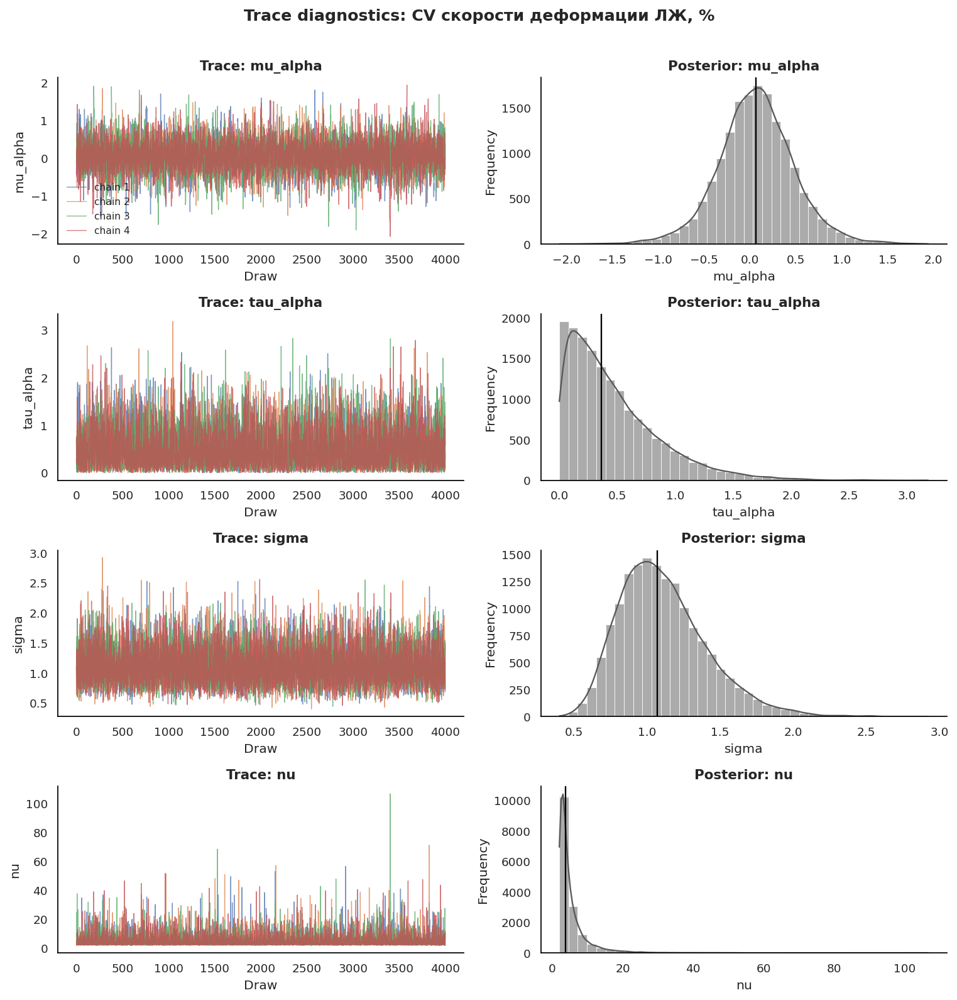

In [51]:
# ============================================================
# Diagnostics for strain rate v3 model
# ============================================================

if STRAIN_RATE_OUTCOME in idatas:
    print("\n" + "=" * 110)
    print("Diagnostics:", STRAIN_RATE_OUTCOME, "|", OUTCOME_INFO[STRAIN_RATE_OUTCOME]["label_ru"])

    diag_sr = diagnostic_summary(idatas[STRAIN_RATE_OUTCOME])
    display(diag_sr)

    diag_sr.to_excel(
        ARTICLE_TABLES_DIR / "diagnostics_strain_rate_cv_v3.xlsx",
        index=False,
    )

    div_sr = count_divergences(idatas[STRAIN_RATE_OUTCOME])
    bfmi_sr = manual_bfmi(idatas[STRAIN_RATE_OUTCOME])

    print("Divergences:", div_sr)
    print("BFMI:", bfmi_sr)

    if div_sr > 0:
        print(
            "WARNING: есть divergent transitions. Для финальной версии можно поднять target_accept до 0.99."
        )

    plot_custom_trace(
        idatas[STRAIN_RATE_OUTCOME],
        STRAIN_RATE_OUTCOME,
        var_names=["mu_alpha", "tau_alpha", "sigma", "nu"],
    )
else:
    print("Модель strain rate еще не рассчитана.")


In [52]:
# ============================================================
# Rebuild posterior estimates and article contrasts
# ============================================================


def article_outcome_label(outcome):
    info = OUTCOME_INFO.get(outcome, {})
    label = info.get("label_ru", outcome)

    # Не дублируем единицы, если они уже вписаны в русское название
    unit = info.get("unit", "")
    if unit and unit not in ["ratio", "check_units"] and unit not in label:
        label = f"{label}, {unit}"

    return label


def article_savefig(fig, base_path):
    """
    Сохраняет рисунок в png, svg, pdf.
    """
    base_path = Path(base_path)
    fig.savefig(base_path.with_suffix(".png"), bbox_inches="tight", dpi=600)
    fig.savefig(base_path.with_suffix(".svg"), bbox_inches="tight")
    fig.savefig(base_path.with_suffix(".pdf"), bbox_inches="tight")
    print("Saved:", base_path.with_suffix(".png"))
    print("Saved:", base_path.with_suffix(".svg"))
    print("Saved:", base_path.with_suffix(".pdf"))


def rebuild_posterior_group_tables():
    group_rows = []
    group_draws = {}
    group_draws_transformed = {}

    for outcome, idata in idatas.items():
        if outcome not in model_metas:
            continue

        meta = model_metas[outcome]

        alpha_raw = posterior_alpha_draws_original_units(idata, meta)
        alpha_transformed = posterior_alpha_draws_transformed_units(idata, meta)

        group_draws[outcome] = alpha_raw
        group_draws_transformed[outcome] = alpha_transformed

        for group in alpha_raw.columns:
            s = summarize_draws(alpha_raw[group].values)

            group_rows.append(
                {
                    "outcome": outcome,
                    "outcome_label": article_outcome_label(outcome),
                    "group": group,
                    "group_label": ARCH_GROUP_LABELS_SHORT_RU.get(group, group).replace("\n", " "),
                    "transform": meta.get("transform", "identity"),
                    "n_model": meta["n"],
                    **s,
                }
            )

    group_df = pd.DataFrame(group_rows)

    return group_df, group_draws, group_draws_transformed


(
    posterior_group_df_article,
    posterior_group_draws_article,
    posterior_group_draws_transformed_article,
) = rebuild_posterior_group_tables()

display(posterior_group_df_article)

posterior_group_df_article.to_csv(
    ARTICLE_TABLES_DIR / "posterior_group_estimates_article.csv",
    index=False,
    encoding="utf-8-sig",
)

posterior_group_df_article.to_excel(
    ARTICLE_TABLES_DIR / "posterior_group_estimates_article.xlsx",
    index=False,
)


# ------------------------------------------------------------
# Таблица наблюдаемых + модельных оценок
# ------------------------------------------------------------


def build_article_group_estimates_table(outcomes):
    rows = []

    for outcome in outcomes:
        if outcome not in posterior_group_draws_article:
            continue

        draws = posterior_group_draws_article[outcome]

        for group in ARCH_GROUP_ORDER_ARTICLE:
            if group not in draws.columns:
                continue

            values = df_v3.loc[df_v3[ARCH_GROUP_COL] == group, outcome].dropna().astype(float)

            if len(values) > 0:
                q1, q3 = np.percentile(values, [25, 75])
                observed_median = np.median(values)
            else:
                q1, q3, observed_median = np.nan, np.nan, np.nan

            s = summarize_draws(draws[group].values)

            rows.append(
                {
                    "outcome": outcome,
                    "outcome_label": article_outcome_label(outcome),
                    "group": group,
                    "group_label": ARCH_GROUP_LABELS_SHORT_RU[group].replace("\n", " "),
                    "n": int(len(values)),
                    "observed_median": observed_median,
                    "observed_q1": q1,
                    "observed_q3": q3,
                    "model_estimate_median": s["median"],
                    "interval_89_low": s["cr89_low"],
                    "interval_89_high": s["cr89_high"],
                    "interval_95_low": s["cr95_low"],
                    "interval_95_high": s["cr95_high"],
                }
            )

    return pd.DataFrame(rows)


article_group_estimates_df = build_article_group_estimates_table(
    ARTICLE_MAIN_OUTCOMES + ARTICLE_SECONDARY_OUTCOMES
)

display(article_group_estimates_df)

article_group_estimates_df.to_csv(
    ARTICLE_TABLES_DIR / "article_table_group_estimates.csv",
    index=False,
    encoding="utf-8-sig",
)

article_group_estimates_df.to_excel(
    ARTICLE_TABLES_DIR / "article_table_group_estimates.xlsx",
    index=False,
)


# ------------------------------------------------------------
# Ключевые контрасты
# ------------------------------------------------------------

ARTICLE_KEY_CONTRASTS = [
    {
        "name_ru": "Сеть хорд − одиночная протяженная косая",
        "higher_group": "4_Chord_network",
        "lower_group": "2_Single_long_oblique_bridge",
    },
    {
        "name_ru": "Две поперечные − одиночная протяженная косая",
        "higher_group": "3_Double_transverse_no_long_oblique",
        "lower_group": "2_Single_long_oblique_bridge",
    },
    {
        "name_ru": "Сеть хорд − локальная",
        "higher_group": "4_Chord_network",
        "lower_group": "1_Local_transverse_or_low_angle",
    },
    {
        "name_ru": "Две поперечные − локальная",
        "higher_group": "3_Double_transverse_no_long_oblique",
        "lower_group": "1_Local_transverse_or_low_angle",
    },
]


def build_article_key_contrasts_table(outcomes):
    rows = []

    for outcome in outcomes:
        if outcome not in posterior_group_draws_article:
            continue

        draws = posterior_group_draws_article[outcome]

        for contrast in ARTICLE_KEY_CONTRASTS:
            high = contrast["higher_group"]
            low = contrast["lower_group"]

            if high not in draws.columns or low not in draws.columns:
                continue

            diff = draws[high].values - draws[low].values
            s = summarize_draws(diff)

            p_gt = float(np.mean(diff > 0))
            p_lt = float(np.mean(diff < 0))

            if outcome == "echo_lv_strain_rate_cv_pct":
                interpretation = "для этого показателя более отрицательное значение соответствует направлению старой модели"
                probability_direction = p_lt
            else:
                interpretation = (
                    "положительная разница означает более высокое значение в первой группе"
                )
                probability_direction = max(p_gt, p_lt)

            rows.append(
                {
                    "outcome": outcome,
                    "outcome_label": article_outcome_label(outcome),
                    "contrast": contrast["name_ru"],
                    "higher_group": high,
                    "lower_group": low,
                    "median_difference": s["median"],
                    "interval_89_low": s["cr89_low"],
                    "interval_89_high": s["cr89_high"],
                    "interval_95_low": s["cr95_low"],
                    "interval_95_high": s["cr95_high"],
                    "p_difference_gt_0": p_gt,
                    "p_difference_lt_0": p_lt,
                    "probability_direction": probability_direction,
                    "interpretation_short": interpretation,
                }
            )

    return pd.DataFrame(rows)


article_key_contrasts_df = build_article_key_contrasts_table(
    ARTICLE_MAIN_OUTCOMES + ARTICLE_SECONDARY_OUTCOMES
)

display(article_key_contrasts_df)

article_key_contrasts_df.to_csv(
    ARTICLE_TABLES_DIR / "article_table_key_contrasts.csv",
    index=False,
    encoding="utf-8-sig",
)

article_key_contrasts_df.to_excel(
    ARTICLE_TABLES_DIR / "article_table_key_contrasts.xlsx",
    index=False,
)


,outcome,outcome_label,group,group_label,transform,n_model,mean,sd,median,cr89_low,cr89_high,cr95_low,cr95_high
0,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",1_Local_transverse_or_low_angle,Локальная,log,69,23.138816,2.648776,23.278406,18.729957,27.139373,17.747187,28.269001
1,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",2_Single_long_oblique_bridge,Длинная косая,log,69,22.267698,2.580561,22.369362,18.020464,26.136618,17.122755,26.960740
2,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",3_Double_transverse_no_long_oblique,Две поперечные,log,69,24.760213,2.396890,24.580548,21.210666,28.789408,20.406956,30.087971
3,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",4_Chord_network,Сеть хорд,log,69,25.374143,1.604002,25.287138,22.926270,28.047154,22.490474,28.790486
4,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",1_Local_transverse_or_low_angle,Локальная,log,47,16.981494,3.557448,16.580224,12.166938,23.058839,11.058744,25.420771
5,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",2_Single_long_oblique_bridge,Длинная косая,log,47,16.608113,3.287955,16.311917,11.931563,22.195418,10.813962,24.151924
6,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",3_Double_transverse_no_long_oblique,Две поперечные,log,47,17.635197,3.368543,17.145519,13.217217,23.448393,12.278781,25.824037
7,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",4_Chord_network,Сеть хорд,log,47,16.119184,2.286408,15.991576,12.655066,19.969196,11.939340,21.119830
8,dicor_ssou_cv_pct,"DICOR SSOU CV, %",1_Local_transverse_or_low_angle,Локальная,log,47,27.405581,4.372825,26.999521,21.050320,34.754119,19.707861,37.113639
9,dicor_ssou_cv_pct,"DICOR SSOU CV, %",2_Single_long_oblique_bridge,Длинная косая,log,47,24.233121,3.260242,24.241441,19.025619,29.408817,18.013665,30.633411


,outcome,outcome_label,group,group_label,n,observed_median,observed_q1,observed_q3,model_estimate_median,interval_89_low,interval_89_high,interval_95_low,interval_95_high
0,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",1_Local_transverse_or_low_angle,Локальная,7,21.094764,16.576961,29.000000,23.278406,18.729957,27.139373,17.747187,28.269001
1,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",2_Single_long_oblique_bridge,Длинная косая,8,20.000000,17.514179,22.500000,22.369362,18.020464,26.136618,17.122755,26.960740
2,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",3_Double_transverse_no_long_oblique,Две поперечные,11,21.934674,18.688724,34.500000,24.580548,21.210666,28.789408,20.406956,30.087971
3,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",4_Chord_network,Сеть хорд,43,28.392743,19.500000,33.275065,25.287138,22.926270,28.047154,22.490474,28.790486
4,dicor_ssou_cv_pct,"DICOR SSOU CV, %",1_Local_transverse_or_low_angle,Локальная,5,37.739383,14.999743,43.213467,26.999521,21.050320,34.754119,19.707861,37.113639
5,dicor_ssou_cv_pct,"DICOR SSOU CV, %",2_Single_long_oblique_bridge,Длинная косая,7,23.401694,20.447962,24.270209,24.241441,19.025619,29.408817,18.013665,30.633411
6,dicor_ssou_cv_pct,"DICOR SSOU CV, %",3_Double_transverse_no_long_oblique,Две поперечные,8,17.830968,16.244615,36.146373,23.843952,18.373933,29.167168,17.316904,30.312077
7,dicor_ssou_cv_pct,"DICOR SSOU CV, %",4_Chord_network,Сеть хорд,27,27.952038,21.545509,41.872353,29.065464,25.286341,33.312492,24.438606,34.410266
8,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",1_Local_transverse_or_low_angle,Локальная,5,21.632739,10.526316,25.000000,16.580224,12.166938,23.058839,11.058744,25.420771
9,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",2_Single_long_oblique_bridge,Длинная косая,7,16.826395,11.856742,19.348324,16.311917,11.931563,22.195418,10.813962,24.151924


,outcome,outcome_label,contrast,higher_group,lower_group,median_difference,interval_89_low,interval_89_high,interval_95_low,interval_95_high,p_difference_gt_0,p_difference_lt_0,probability_direction,interpretation_short
0,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",Сеть хорд − одиночная протяженная косая,4_Chord_network,2_Single_long_oblique_bridge,2.775279,-0.823893,8.248018,-1.611983,9.330854,0.854750,0.145250,0.854750,положительная разница означает более высокое з...
1,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",Две поперечные − одиночная протяженная косая,3_Double_transverse_no_long_oblique,2_Single_long_oblique_bridge,1.929064,-1.699547,8.374445,-2.813844,10.098715,0.780500,0.219500,0.780500,положительная разница означает более высокое з...
2,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",Сеть хорд − локальная,4_Chord_network,1_Local_transverse_or_low_angle,1.780162,-1.820566,7.611516,-2.967595,8.798492,0.780250,0.219750,0.780250,положительная разница означает более высокое з...
3,merged_lv_deformation_cv_pct,"CV деформации ЛЖ, %",Две поперечные − локальная,3_Double_transverse_no_long_oblique,1_Local_transverse_or_low_angle,1.036168,-2.967940,7.569791,-4.294914,9.117472,0.682125,0.317875,0.682125,положительная разница означает более высокое з...
4,dicor_ssou_cv_pct,"DICOR SSOU CV, %",Сеть хорд − одиночная протяженная косая,4_Chord_network,2_Single_long_oblique_bridge,4.705263,-0.806725,11.835183,-1.953951,13.517264,0.889250,0.110750,0.889250,положительная разница означает более высокое з...
5,dicor_ssou_cv_pct,"DICOR SSOU CV, %",Две поперечные − одиночная протяженная косая,3_Double_transverse_no_long_oblique,2_Single_long_oblique_bridge,-0.224131,-6.723479,5.704143,-8.591869,7.366578,0.458000,0.542000,0.542000,положительная разница означает более высокое з...
6,dicor_ssou_cv_pct,"DICOR SSOU CV, %",Сеть хорд − локальная,4_Chord_network,1_Local_transverse_or_low_angle,1.570756,-5.464892,9.158633,-8.200226,10.912050,0.668625,0.331375,0.668625,положительная разница означает более высокое з...
7,dicor_ssou_cv_pct,"DICOR SSOU CV, %",Две поперечные − локальная,3_Double_transverse_no_long_oblique,1_Local_transverse_or_low_angle,-2.739174,-12.907723,3.436607,-15.566497,5.297418,0.248125,0.751875,0.751875,положительная разница означает более высокое з...
8,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",Сеть хорд − одиночная протяженная косая,4_Chord_network,2_Single_long_oblique_bridge,-0.120209,-6.146207,4.307378,-8.387899,5.853802,0.460375,0.539625,0.539625,положительная разница означает более высокое з...
9,dicor_sm_kdtr_cv_pct,"DICOR KDTR CV, %",Две поперечные − одиночная протяженная косая,3_Double_transverse_no_long_oblique,2_Single_long_oblique_bridge,0.407761,-4.277365,7.683011,-6.309680,10.197280,0.594500,0.405500,0.594500,положительная разница означает более высокое з...


In [53]:
# ============================================================
# Focused check: does v3 support previous Oblique vs Transverse result?
# ============================================================


def focused_strain_rate_support_table():
    outcome = "echo_lv_strain_rate_cv_pct"

    if outcome not in posterior_group_draws_article:
        print("Нет posterior draws для", outcome)
        return pd.DataFrame()

    draws = posterior_group_draws_article[outcome]

    reference = "2_Single_long_oblique_bridge"

    comparisons = [
        "1_Local_transverse_or_low_angle",
        "3_Double_transverse_no_long_oblique",
        "4_Chord_network",
    ]

    rows = []

    for group in comparisons:
        if group not in draws.columns or reference not in draws.columns:
            continue

        diff = draws[group].values - draws[reference].values
        s = summarize_draws(diff)

        rows.append(
            {
                "outcome": outcome,
                "outcome_label": article_outcome_label(outcome),
                "contrast": f"{ARCH_GROUP_LABELS_SHORT_RU[group].replace(chr(10), ' ')} − Длинная косая",
                "comparison_group": group,
                "reference_group": reference,
                "median_difference": s["median"],
                "interval_89_low": s["cr89_low"],
                "interval_89_high": s["cr89_high"],
                "interval_95_low": s["cr95_low"],
                "interval_95_high": s["cr95_high"],
                "P(comparison < long_oblique)": np.mean(diff < 0),
                "P(comparison > long_oblique)": np.mean(diff > 0),
                "interpretation": (
                    "Поддерживает старый результат, если P(comparison < long_oblique) высока, "
                    "потому что старая модель показала более отрицательные значения в Transverse-Involved."
                ),
            }
        )

    return pd.DataFrame(rows)


strain_rate_support_df = focused_strain_rate_support_table()

display(strain_rate_support_df)

strain_rate_support_df.to_csv(
    ARTICLE_TABLES_DIR / "strain_rate_v3_support_of_old_model.csv",
    index=False,
    encoding="utf-8-sig",
)

strain_rate_support_df.to_excel(
    ARTICLE_TABLES_DIR / "strain_rate_v3_support_of_old_model.xlsx",
    index=False,
)


""


Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig1_chord_architecture_v3_scheme.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig1_chord_architecture_v3_scheme.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig1_chord_architecture_v3_scheme.pdf


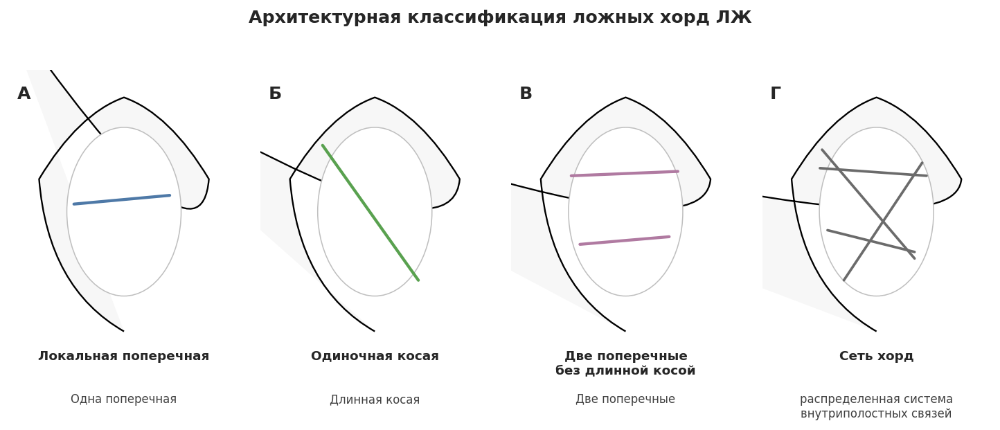

In [57]:
# ============================================================
# Figure 1. Scheme of chord architecture v3
# ============================================================


def draw_lv_outline(ax):
    """
    Условный контур ЛЖ без анатомической детализации.
    """
    lv = patches.PathPatch(
        patches.Path(
            [
                (0.00, -1.05),
                (-0.70, -0.65),
                (-0.78, 0.35),
                (-0.42, 0.95),
                (0.00, 1.10),
                (0.42, 0.95),
                (0.78, 0.35),
                (0.70, -0.65),
                (0.00, -1.05),
            ],
            [
                patches.Path.MOVETO,
                patches.Path.CURVE3,
                patches.Path.CURVE3,
                patches.Path.CURVE3,
                patches.Path.CURVE3,
                patches.Path.CURVE3,
                patches.Path.CURVE3,
                patches.Path.CURVE3,
                patches.Path.CLOSEPOLY,
            ],
        ),
        facecolor="#F7F7F7",
        edgecolor="black",
        linewidth=1.2,
    )
    ax.add_patch(lv)

    # Условная полость
    cavity = patches.Ellipse(
        (0, 0.05),
        width=1.05,
        height=1.55,
        facecolor="white",
        edgecolor="0.75",
        linewidth=0.8,
    )
    ax.add_patch(cavity)


def draw_chords(ax, group):
    color = ARCH_PALETTE_ARTICLE[group]
    lw = 2.2

    if group == "1_Local_transverse_or_low_angle":
        # локальная поперечная 
        ax.plot([-0.46, 0.42], [0.12, 0.20], color=color, lw=lw, solid_capstyle="round")

    elif group == "2_Single_long_oblique_bridge":
        # одиночная длинная косая
        ax.plot([-0.48, 0.40], [0.66, -0.58], color=color, lw=lw, solid_capstyle="round")

    elif group == "3_Double_transverse_no_long_oblique":
        # две поперечные
        ax.plot([-0.50, 0.48], [0.38, 0.42], color=color, lw=lw, solid_capstyle="round")
        ax.plot([-0.42, 0.40], [-0.25, -0.18], color=color, lw=lw, solid_capstyle="round")

    elif group == "4_Chord_network":
        # сеть
        lines = [
            ([-0.52, 0.46], [0.45, 0.38]),
            ([-0.45, 0.35], [-0.12, -0.32]),
            ([-0.50, 0.35], [0.62, -0.38]),
            ([0.42, -0.30], [0.50, -0.58]),
        ]
        for xs, ys in lines:
            ax.plot(xs, ys, color=color, lw=1.9, solid_capstyle="round")


def make_fig1_chord_architecture_scheme():
    fig, axes = plt.subplots(1, 4, figsize=(10.5, 3.8))

    panel_letters = ["А", "Б", "В", "Г"]

    for ax, group, letter in zip(axes, ARCH_GROUP_ORDER_ARTICLE, panel_letters):
        draw_lv_outline(ax)
        draw_chords(ax, group)

        ax.set_xlim(-1.05, 1.05)
        ax.set_ylim(-1.30, 1.35)
        ax.set_aspect("equal")
        ax.axis("off")

        ax.text(
            -0.98,
            1.21,
            letter,
            fontsize=13,
            fontweight="bold",
            ha="left",
            va="top",
        )

        ax.text(
            0,
            -1.22,
            ARCH_GROUP_LABELS_FULL_RU[group],
            ha="center",
            va="top",
            fontsize=9.5,
            fontweight="bold",
        )

        ax.text(
            0,
            -1.62,
            ARCH_GROUP_MECHANICAL_ROLE_RU[group],
            ha="center",
            va="top",
            fontsize=8.5,
            color="0.25",
        )

    fig.suptitle(
        "Архитектурная классификация ложных хорд ЛЖ",
        fontsize=13,
        fontweight="bold",
        y=1.04,
    )

    plt.tight_layout()

    article_savefig(
        fig,
        ARTICLE_DIR / "fig1_chord_architecture_v3_scheme",
    )

    plt.show()


make_fig1_chord_architecture_scheme()


Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig1_chord_architecture_v3_scheme_clean.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig1_chord_architecture_v3_scheme_clean.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig1_chord_architecture_v3_scheme_clean.pdf


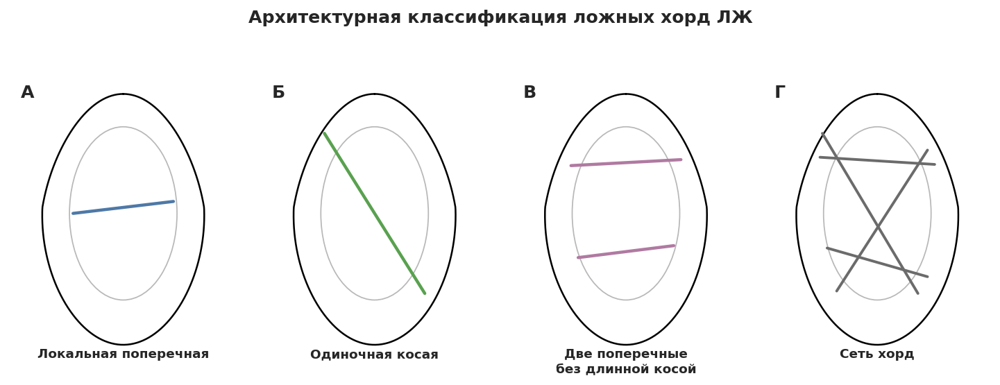

In [59]:
# ============================================================
# Figure 1. Clean scheme of chord architecture v3
# Исправленная версия без лишних боковых линий
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches


def draw_clean_lv_outline(ax):
    """
    Чистая условная схема ЛЖ:
    - внешний контур ЛЖ;
    - внутренняя полость;
    - без боковых анатомических линий, чтобы не путать читателя.
    """

    # Внешний контур ЛЖ как сглаженный "каплевидный" контур
    t = np.linspace(0, 2 * np.pi, 300)

    # Каплевидная форма: шире у основания, уже у верхушки
    y = 1.05 * np.cos(t)
    width_factor = 0.58 + 0.22 * (1 - np.cos(t)) / 2
    x = width_factor * np.sin(t)

    # Немного сужаем верхушку
    y = y - 0.10
    x = x * (1 - 0.18 * np.clip(-y, 0, None))

    ax.plot(x, y, color="black", lw=1.3)

    # Полость ЛЖ
    cavity = patches.Ellipse(
        (0, -0.05),
        width=0.90,
        height=1.45,
        facecolor="white",
        edgecolor="0.72",
        linewidth=0.9,
    )
    ax.add_patch(cavity)

    ax.set_xlim(-0.95, 0.95)
    ax.set_ylim(-1.35, 1.15)
    ax.set_aspect("equal")
    ax.axis("off")


def draw_clean_chords(ax, group):
    """
    Цветные линии — схематическое расположение ложных хорд.
    """
    color = ARCH_PALETTE_ARTICLE[group]
    lw = 2.3

    if group == "1_Local_transverse_or_low_angle":
        # Одна локальная поперечная / низкоугловая хорда
        ax.plot(
            [-0.42, 0.42],
            [-0.05, 0.05],
            color=color,
            lw=lw,
            solid_capstyle="round",
        )

    elif group == "2_Single_long_oblique_bridge":
        # Одна протяженная косая хорда
        ax.plot(
            [-0.42, 0.42],
            [0.62, -0.72],
            color=color,
            lw=lw,
            solid_capstyle="round",
        )

    elif group == "3_Double_transverse_no_long_oblique":
        # Две поперечные хорды без длинной косой
        ax.plot(
            [-0.46, 0.46],
            [0.35, 0.40],
            color=color,
            lw=lw,
            solid_capstyle="round",
        )
        ax.plot(
            [-0.40, 0.40],
            [-0.42, -0.32],
            color=color,
            lw=lw,
            solid_capstyle="round",
        )

    elif group == "4_Chord_network":
        # Сеть хорд
        lines = [
            ([-0.48, 0.48], [0.42, 0.36]),
            ([-0.42, 0.42], [-0.34, -0.58]),
            ([-0.46, 0.34], [0.62, -0.72]),
            ([0.42, -0.34], [0.48, -0.70]),
        ]

        for xs, ys in lines:
            ax.plot(
                xs,
                ys,
                color=color,
                lw=2.0,
                solid_capstyle="round",
            )


def make_fig1_chord_architecture_scheme_clean():
    fig, axes = plt.subplots(1, 4, figsize=(10.5, 3.7))

    panel_letters = ["А", "Б", "В", "Г"]

    titles = {
        "1_Local_transverse_or_low_angle": "Локальная поперечная",
        "2_Single_long_oblique_bridge": "Одиночная косая",
        "3_Double_transverse_no_long_oblique": "Две поперечные\nбез длинной косой",
        "4_Chord_network": "Сеть хорд",
    }

    roles = {
        "1_Local_transverse_or_low_angle": "",
        "2_Single_long_oblique_bridge": "",
        "3_Double_transverse_no_long_oblique": "",
        "4_Chord_network": "",
    }

    for ax, group, letter in zip(axes, ARCH_GROUP_ORDER_ARTICLE, panel_letters):
        draw_clean_lv_outline(ax)
        draw_clean_chords(ax, group)

        ax.text(
            -0.86,
            1.03,
            letter,
            fontsize=13,
            fontweight="bold",
            ha="left",
            va="top",
        )

        ax.text(
            0,
            -1.18,
            titles[group],
            ha="center",
            va="top",
            fontsize=9.5,
            fontweight="bold",
        )

        ax.text(
            0,
            -1.48,
            roles[group],
            ha="center",
            va="top",
            fontsize=8.4,
            color="0.25",
        )

    fig.suptitle(
        "Архитектурная классификация ложных хорд ЛЖ",
        fontsize=13,
        fontweight="bold",
        y=1.04,
    )

    plt.tight_layout()

    article_savefig(
        fig,
        ARTICLE_DIR / "fig1_chord_architecture_v3_scheme_clean",
    )

    plt.show()


make_fig1_chord_architecture_scheme_clean()


In [42]:
# ============================================================
# Article group estimate plotting function
# ============================================================


def posterior_probability(outcome, group_a, group_b, direction="gt"):
    """
    P(group_a > group_b) или P(group_a < group_b) по модельным оценкам.
    """
    if outcome not in posterior_group_draws_article:
        return np.nan

    draws = posterior_group_draws_article[outcome]

    if group_a not in draws.columns or group_b not in draws.columns:
        return np.nan

    diff = draws[group_a].values - draws[group_b].values

    if direction == "gt":
        return float(np.mean(diff > 0))

    if direction == "lt":
        return float(np.mean(diff < 0))

    return np.nan


def plot_group_estimate_panel(
    ax,
    outcome,
    panel_letter=None,
    annotation=None,
    y_label=None,
    show_xlabel=True,
):
    """
    Панель:
    - сырые точки;
    - модельная медиана;
    - 89% и 95% интервалы неопределенности.
    """

    d = df_v3[[ARCH_GROUP_COL, outcome]].dropna().copy()

    d = d[d[ARCH_GROUP_COL].isin(ARCH_GROUP_ORDER_ARTICLE)].copy()

    d[ARCH_GROUP_COL] = pd.Categorical(
        d[ARCH_GROUP_COL],
        categories=ARCH_GROUP_ORDER_ARTICLE,
        ordered=True,
    )

    rng_local = np.random.default_rng(42)

    # Сырые точки
    for i, group in enumerate(ARCH_GROUP_ORDER_ARTICLE):
        values = d.loc[d[ARCH_GROUP_COL] == group, outcome].dropna().astype(float).values

        if len(values) == 0:
            continue

        x = i + rng_local.normal(0, 0.055, size=len(values))

        ax.scatter(
            x,
            values,
            s=22,
            color=ARCH_PALETTE_ARTICLE[group],
            alpha=0.38,
            edgecolor="black",
            linewidth=0.25,
            zorder=2,
        )

    # Модельные оценки
    if outcome in posterior_group_draws_article:
        draws = posterior_group_draws_article[outcome]

        for i, group in enumerate(ARCH_GROUP_ORDER_ARTICLE):
            if group not in draws.columns:
                continue

            s = summarize_draws(draws[group].values)

            # 95%
            ax.plot(
                [i, i],
                [s["cr95_low"], s["cr95_high"]],
                color="black",
                lw=1.1,
                solid_capstyle="round",
                zorder=3,
            )

            # 89%
            ax.plot(
                [i, i],
                [s["cr89_low"], s["cr89_high"]],
                color="black",
                lw=3.1,
                solid_capstyle="round",
                zorder=4,
            )

            ax.scatter(
                [i],
                [s["median"]],
                s=46,
                color="white",
                edgecolor="black",
                linewidth=1.2,
                zorder=5,
            )

    # n по группам
    ymin, ymax = ax.get_ylim()
    yrange = ymax - ymin if ymax > ymin else 1

    for i, group in enumerate(ARCH_GROUP_ORDER_ARTICLE):
        n = int(d.loc[d[ARCH_GROUP_COL] == group, outcome].notna().sum())
        ax.text(
            i,
            ymin + 0.035 * yrange,
            f"n={n}",
            ha="center",
            va="bottom",
            fontsize=8.2,
            color="0.25",
        )

    # Подписи
    ax.set_xticks(range(len(ARCH_GROUP_ORDER_ARTICLE)))
    ax.set_xticklabels(
        [ARCH_GROUP_LABELS_SHORT_RU[g] for g in ARCH_GROUP_ORDER_ARTICLE],
        rotation=0,
    )

    if show_xlabel:
        ax.set_xlabel("Архитектура ложных хорд")
    else:
        ax.set_xlabel("")

    ax.set_ylabel(y_label or article_outcome_label(outcome))

    ax.grid(axis="y", color="0.88", linewidth=0.6)
    ax.set_axisbelow(True)

    if panel_letter is not None:
        ax.text(
            -0.12,
            1.04,
            panel_letter,
            transform=ax.transAxes,
            fontsize=12.5,
            fontweight="bold",
            ha="left",
            va="bottom",
        )

    ax.set_title(article_outcome_label(outcome), fontsize=11, fontweight="bold")

    if annotation:
        ax.text(
            0.02,
            0.96,
            annotation,
            transform=ax.transAxes,
            ha="left",
            va="top",
            fontsize=8.6,
            bbox=dict(
                facecolor="white",
                edgecolor="0.65",
                boxstyle="round,pad=0.25",
                alpha=0.92,
            ),
        )

    sns.despine(ax=ax)


def format_p(p):
    if pd.isna(p):
        return "н/д"
    return f"{p:.2f}"


Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig2_regional_mechanical_heterogeneity.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig2_regional_mechanical_heterogeneity.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig2_regional_mechanical_heterogeneity.pdf


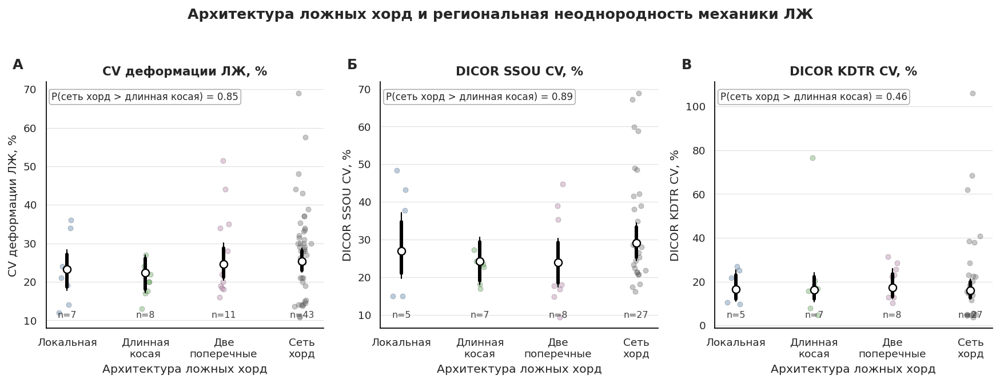

In [43]:
# ============================================================
# Figure 2. Architecture and regional mechanical heterogeneity
# ============================================================


def make_fig2_regional_mechanical_heterogeneity():
    outcomes = [
        "merged_lv_deformation_cv_pct",
        "dicor_ssou_cv_pct",
        "dicor_sm_kdtr_cv_pct",
    ]

    outcomes = [o for o in outcomes if o in df_v3.columns]

    fig, axes = plt.subplots(
        1,
        len(outcomes),
        figsize=(4.2 * len(outcomes), 4.6),
        sharex=False,
    )

    if len(outcomes) == 1:
        axes = [axes]

    annotations = {}

    if "merged_lv_deformation_cv_pct" in outcomes:
        p = posterior_probability(
            "merged_lv_deformation_cv_pct",
            "4_Chord_network",
            "2_Single_long_oblique_bridge",
            direction="gt",
        )
        annotations["merged_lv_deformation_cv_pct"] = (
            f"P(сеть хорд > длинная косая) = {format_p(p)}"
        )

    if "dicor_ssou_cv_pct" in outcomes:
        p = posterior_probability(
            "dicor_ssou_cv_pct",
            "4_Chord_network",
            "2_Single_long_oblique_bridge",
            direction="gt",
        )
        annotations["dicor_ssou_cv_pct"] = f"P(сеть хорд > длинная косая) = {format_p(p)}"

    if "dicor_sm_kdtr_cv_pct" in outcomes:
        p = posterior_probability(
            "dicor_sm_kdtr_cv_pct",
            "4_Chord_network",
            "2_Single_long_oblique_bridge",
            direction="gt",
        )
        annotations["dicor_sm_kdtr_cv_pct"] = f"P(сеть хорд > длинная косая) = {format_p(p)}"

    panel_letters = ["А", "Б", "В"]

    for ax, outcome, letter in zip(axes, outcomes, panel_letters):
        plot_group_estimate_panel(
            ax=ax,
            outcome=outcome,
            panel_letter=letter,
            annotation=annotations.get(outcome),
            show_xlabel=True,
        )

    fig.suptitle(
        "Архитектура ложных хорд и региональная неоднородность механики ЛЖ",
        fontsize=13,
        fontweight="bold",
        y=1.03,
    )

    plt.tight_layout()

    article_savefig(
        fig,
        ARTICLE_DIR / "fig2_regional_mechanical_heterogeneity",
    )

    plt.show()


make_fig2_regional_mechanical_heterogeneity()


Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig3_load_and_morphology.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig3_load_and_morphology.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig3_load_and_morphology.pdf


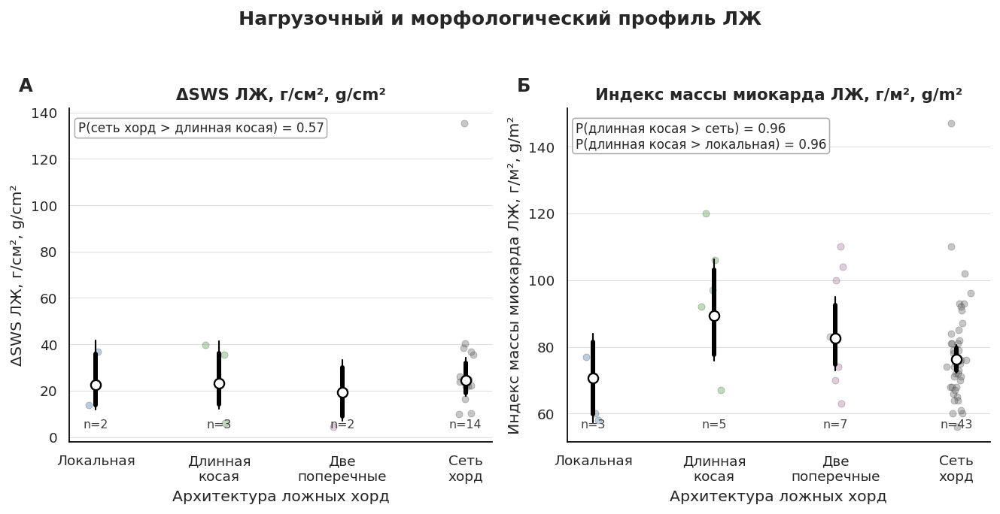

In [44]:
# ============================================================
# Figure 3. Load and morphology profile
# ============================================================


def make_fig3_load_and_morphology():
    outcomes = [
        "echo_lv_sws_delta_g_cm2",
        "echo_lv_myocardial_mass_index_g_m2",
    ]

    outcomes = [o for o in outcomes if o in df_v3.columns]

    fig, axes = plt.subplots(
        1,
        len(outcomes),
        figsize=(4.8 * len(outcomes), 4.7),
        sharex=False,
    )

    if len(outcomes) == 1:
        axes = [axes]

    annotations = {}

    if "echo_lv_myocardial_mass_index_g_m2" in outcomes:
        p1 = posterior_probability(
            "echo_lv_myocardial_mass_index_g_m2",
            "2_Single_long_oblique_bridge",
            "4_Chord_network",
            direction="gt",
        )

        p2 = posterior_probability(
            "echo_lv_myocardial_mass_index_g_m2",
            "2_Single_long_oblique_bridge",
            "1_Local_transverse_or_low_angle",
            direction="gt",
        )

        annotations["echo_lv_myocardial_mass_index_g_m2"] = (
            f"P(длинная косая > сеть) = {format_p(p1)}\n"
            f"P(длинная косая > локальная) = {format_p(p2)}"
        )

    if "echo_lv_sws_delta_g_cm2" in outcomes:
        p = posterior_probability(
            "echo_lv_sws_delta_g_cm2",
            "4_Chord_network",
            "2_Single_long_oblique_bridge",
            direction="gt",
        )

        annotations["echo_lv_sws_delta_g_cm2"] = f"P(сеть хорд > длинная косая) = {format_p(p)}"

    panel_letters = ["А", "Б"]

    for ax, outcome, letter in zip(axes, outcomes, panel_letters):
        plot_group_estimate_panel(
            ax=ax,
            outcome=outcome,
            panel_letter=letter,
            annotation=annotations.get(outcome),
            show_xlabel=True,
        )

    fig.suptitle(
        "Нагрузочный и морфологический профиль ЛЖ",
        fontsize=13,
        fontweight="bold",
        y=1.03,
    )

    plt.tight_layout()

    article_savefig(
        fig,
        ARTICLE_DIR / "fig3_load_and_morphology",
    )

    plt.show()


make_fig3_load_and_morphology()


Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_strain_rate_cv_by_v3_architecture.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_strain_rate_cv_by_v3_architecture.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_strain_rate_cv_by_v3_architecture.pdf


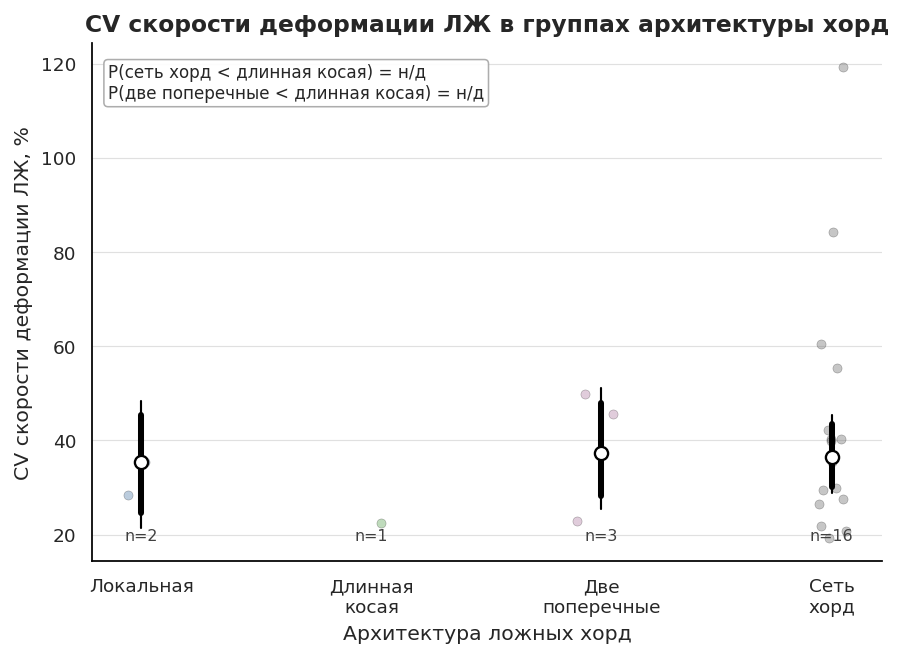

In [45]:
# ============================================================
# Supplementary figure: strain rate CV by v3 architecture
# ============================================================


def make_supp_strain_rate_figure():
    outcome = "echo_lv_strain_rate_cv_pct"

    if outcome not in df_v3.columns:
        print("Нет показателя:", outcome)
        return

    if outcome not in posterior_group_draws_article:
        print("Нет модельных оценок для:", outcome)
        return

    p_network_lt_long = posterior_probability(
        outcome,
        "4_Chord_network",
        "2_Single_long_oblique_bridge",
        direction="lt",
    )

    p_double_lt_long = posterior_probability(
        outcome,
        "3_Double_transverse_no_long_oblique",
        "2_Single_long_oblique_bridge",
        direction="lt",
    )

    annotation = (
        f"P(сеть хорд < длинная косая) = {format_p(p_network_lt_long)}\n"
        f"P(две поперечные < длинная косая) = {format_p(p_double_lt_long)}"
    )

    fig, ax = plt.subplots(figsize=(6.5, 4.8))

    plot_group_estimate_panel(
        ax=ax,
        outcome=outcome,
        panel_letter=None,
        annotation=annotation,
        y_label="CV скорости деформации ЛЖ, %",
        show_xlabel=True,
    )

    ax.set_title(
        "CV скорости деформации ЛЖ в группах архитектуры хорд",
        fontsize=12,
        fontweight="bold",
    )

    plt.tight_layout()

    article_savefig(
        fig,
        ARTICLE_SUPP_DIR / "supp_strain_rate_cv_by_v3_architecture",
    )

    plt.show()


make_supp_strain_rate_figure()


Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig4_dsws_cv_interaction_full.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig4_dsws_cv_interaction_full.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig4_dsws_cv_interaction_full.pdf


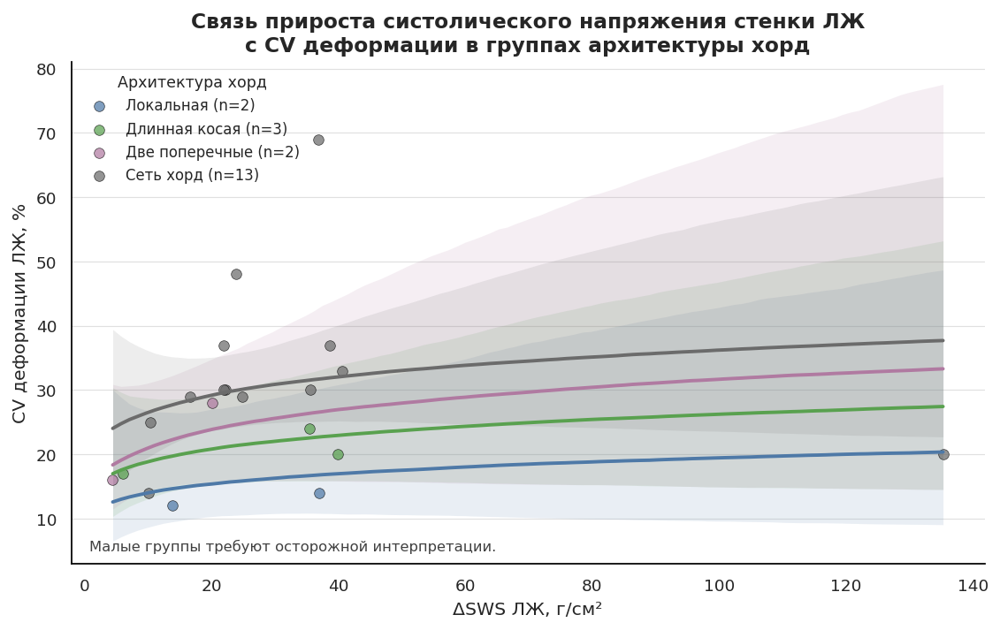

Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig4_dsws_cv_interaction_zoom.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig4_dsws_cv_interaction_zoom.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\fig4_dsws_cv_interaction_zoom.pdf


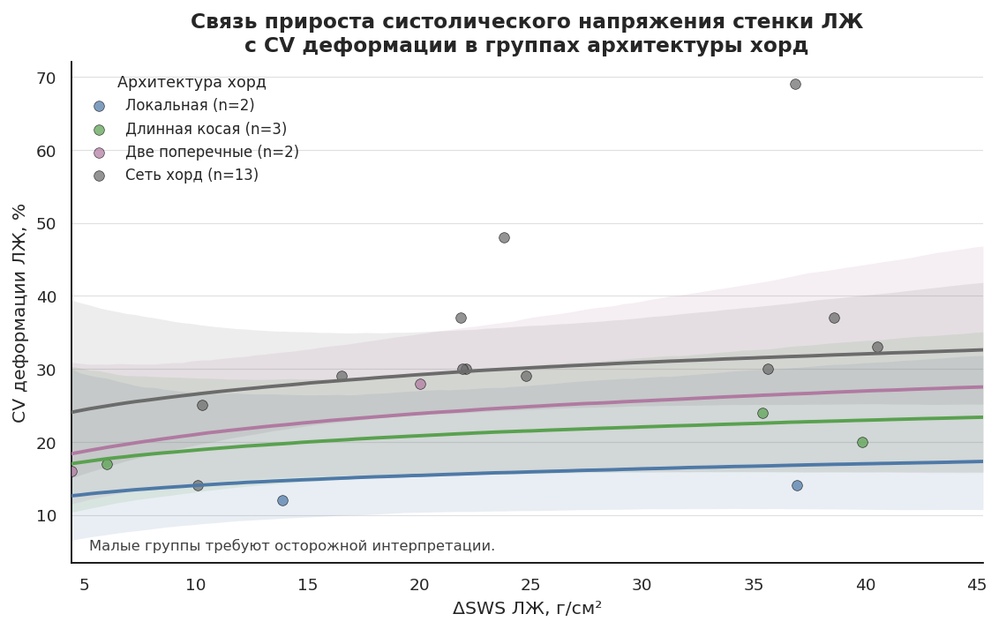

In [60]:
# ============================================================
# Figure 4. ΔSWS × CV deformation interaction
# ============================================================


def plot_interaction_article(version="full"):
    """
    version:
        full — полный диапазон X;
        zoom — основной диапазон без чрезмерного растяжения оси X.
    """

    if "interaction_idata" not in globals() or interaction_idata is None:
        print("Нет interaction_idata. Сначала запусти interaction model.")
        return

    if "interaction_data" not in globals() or interaction_data is None:
        print("Нет interaction_data. Сначала запусти interaction model.")
        return

    if "interaction_meta" not in globals() or interaction_meta is None:
        print("Нет interaction_meta. Сначала запусти interaction model.")
        return

    d = interaction_data.copy()

    posterior = get_idata_group(interaction_idata, "posterior")

    alpha = posterior["alpha"].stack(sample=("chain", "draw")).transpose("sample", "group").values

    beta = posterior["beta"].stack(sample=("chain", "draw")).transpose("sample", "group").values

    group_names = interaction_meta["group_names"]

    if version == "zoom":
        x_min = float(d["x_raw"].min())
        x_max = float(np.percentile(d["x_raw"], 95))
    else:
        x_min = float(d["x_raw"].min())
        x_max = float(d["x_raw"].max())

    x_grid_raw = np.linspace(x_min, x_max, 100)

    x_grid_transformed = apply_outcome_transform(
        pd.Series(x_grid_raw),
        interaction_meta["x_transform"],
    ).values

    x_grid_z = (x_grid_transformed - interaction_meta["x_center"]) / interaction_meta["x_scale"]

    fig, ax = plt.subplots(figsize=(8.2, 5.2))

    # Сырые точки
    for group in group_names:
        sub = d[d[ARCH_GROUP_COL] == group]

        if version == "zoom":
            sub = sub[sub["x_raw"] <= x_max]

        ax.scatter(
            sub["x_raw"],
            sub["y_raw"],
            s=36,
            alpha=0.72,
            color=ARCH_PALETTE_ARTICLE.get(group, "black"),
            edgecolor="black",
            linewidth=0.35,
            label=f"{ARCH_GROUP_LABELS_SHORT_RU.get(group, group).replace(chr(10), ' ')} (n={len(d[d[ARCH_GROUP_COL] == group])})",
            zorder=3,
        )

    # Модельные линии
    for g_idx, group in enumerate(group_names):
        mu_z_draws = alpha[:, g_idx][:, None] + beta[:, g_idx][:, None] * x_grid_z[None, :]

        mu_transformed_draws = inverse_robust_scale(
            mu_z_draws,
            center=interaction_meta["y_center"],
            scale=interaction_meta["y_scale"],
        )

        mu_raw_draws = inverse_outcome_transform(
            mu_transformed_draws,
            transform=interaction_meta["y_transform"],
        )

        median = np.median(mu_raw_draws, axis=0)
        low = np.percentile(mu_raw_draws, 2.5, axis=0)
        high = np.percentile(mu_raw_draws, 97.5, axis=0)

        color = ARCH_PALETTE_ARTICLE.get(group, "black")

        ax.plot(
            x_grid_raw,
            median,
            color=color,
            linewidth=2.0,
            zorder=4,
        )

        ax.fill_between(
            x_grid_raw,
            low,
            high,
            color=color,
            alpha=0.12,
            linewidth=0,
            zorder=1,
        )

    ax.set_title(
        "Связь прироста систолического напряжения стенки ЛЖ\n"
        "с CV деформации в группах архитектуры хорд",
        fontsize=12,
        fontweight="bold",
    )

    ax.set_xlabel("ΔSWS ЛЖ, г/см²")
    ax.set_ylabel("CV деформации ЛЖ, %")

    ax.grid(axis="y", color="0.88", linewidth=0.6)
    ax.set_axisbelow(True)

    if version == "zoom":
        ax.set_xlim(x_min, x_max)

    ax.legend(
        loc="best",
        fontsize=8.5,
        title="Архитектура хорд",
        title_fontsize=9,
    )

    ax.text(
        0.02,
        0.02,
        "Малые группы требуют осторожной интерпретации.",
        transform=ax.transAxes,
        ha="left",
        va="bottom",
        fontsize=8.4,
        color="0.25",
    )

    sns.despine(ax=ax)
    plt.tight_layout()

    suffix = "full" if version == "full" else "zoom"

    article_savefig(
        fig,
        ARTICLE_DIR / f"fig4_dsws_cv_interaction_{suffix}",
    )

    plt.show()


plot_interaction_article(version="full")
plot_interaction_article(version="zoom")


Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_merged_lv_deformation_cv_pct.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_merged_lv_deformation_cv_pct.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_merged_lv_deformation_cv_pct.pdf


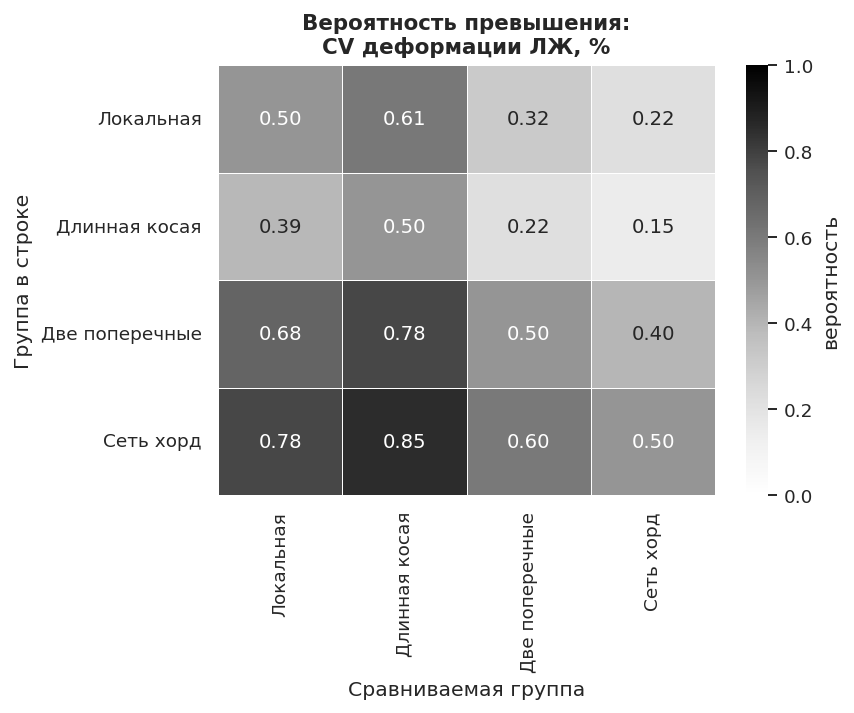

Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_dicor_ssou_cv_pct.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_dicor_ssou_cv_pct.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_dicor_ssou_cv_pct.pdf


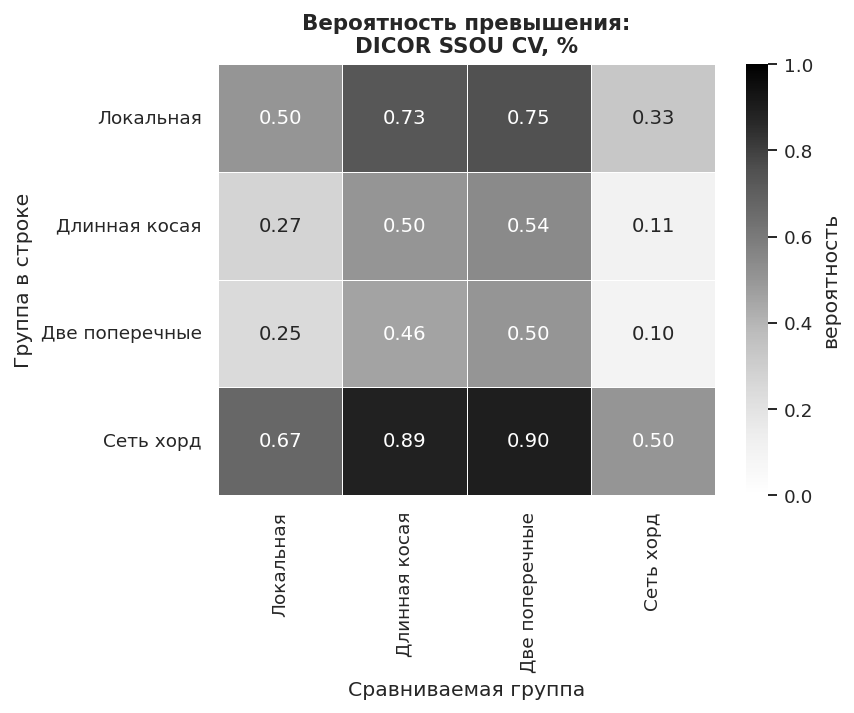

Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_dicor_sm_kdtr_cv_pct.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_dicor_sm_kdtr_cv_pct.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_dicor_sm_kdtr_cv_pct.pdf


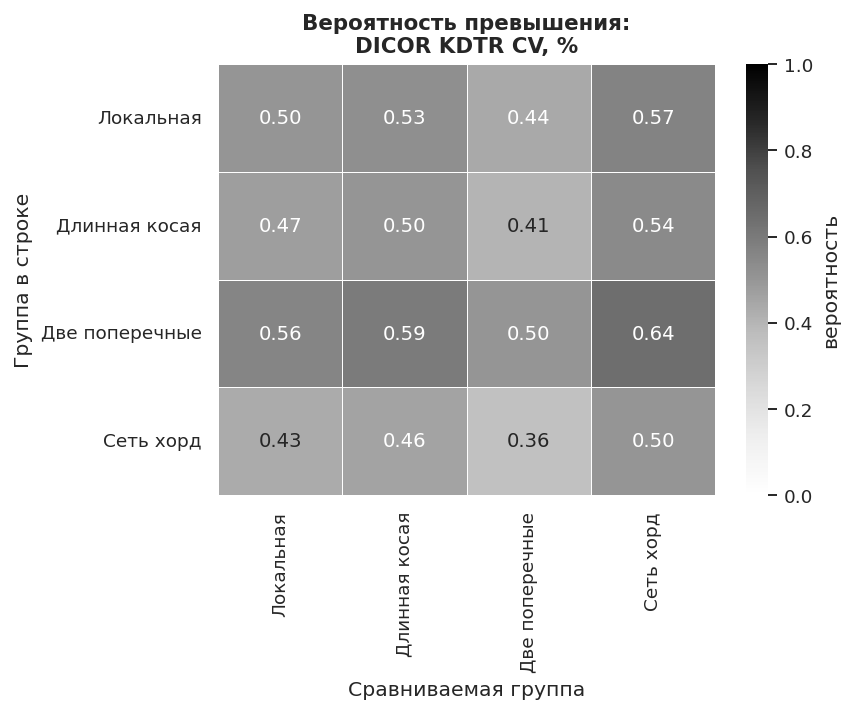

Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_echo_lv_sws_delta_g_cm2.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_echo_lv_sws_delta_g_cm2.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_echo_lv_sws_delta_g_cm2.pdf


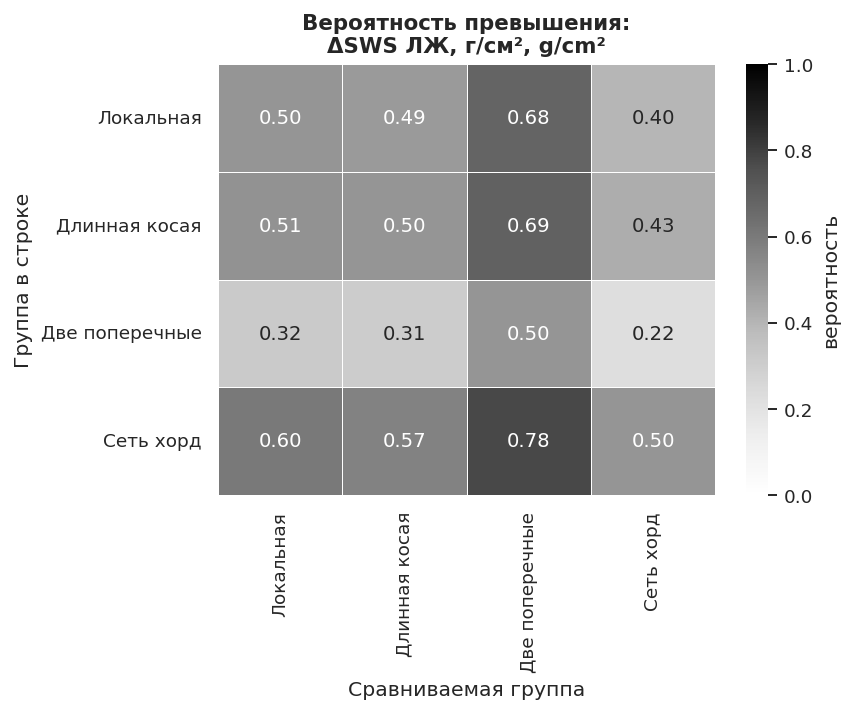

Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_echo_lv_myocardial_mass_index_g_m2.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_echo_lv_myocardial_mass_index_g_m2.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_echo_lv_myocardial_mass_index_g_m2.pdf


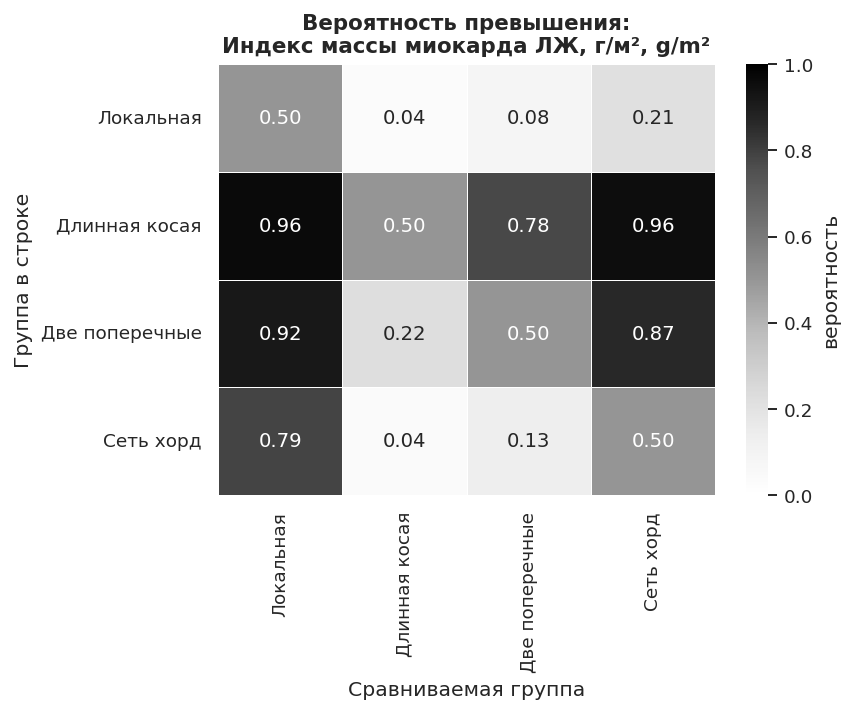

Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_echo_lv_strain_rate_cv_pct.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_echo_lv_strain_rate_cv_pct.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_echo_lv_strain_rate_cv_pct.pdf


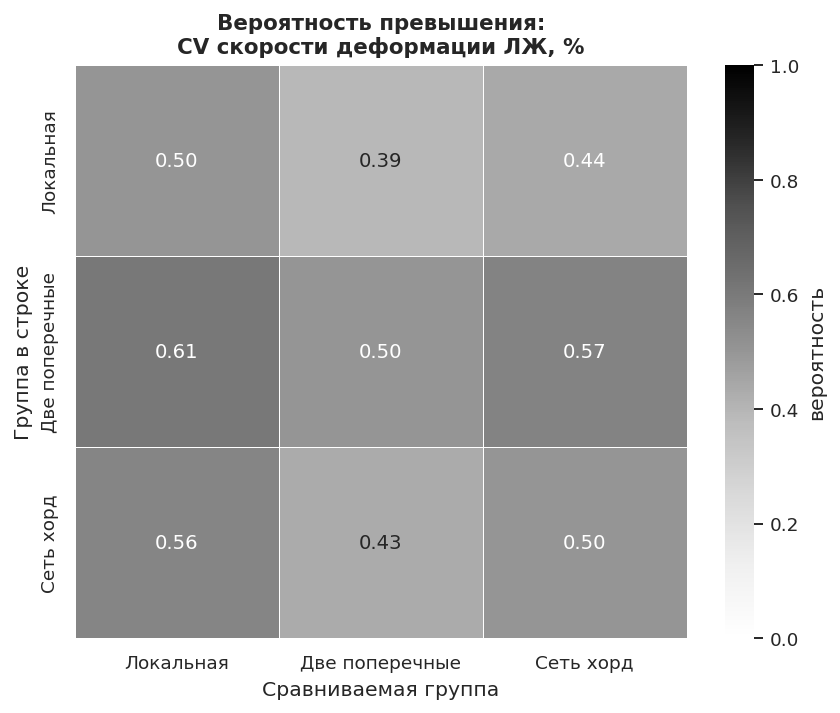

Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_vo2_max_absolute_ml_min.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_vo2_max_absolute_ml_min.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_vo2_max_absolute_ml_min.pdf


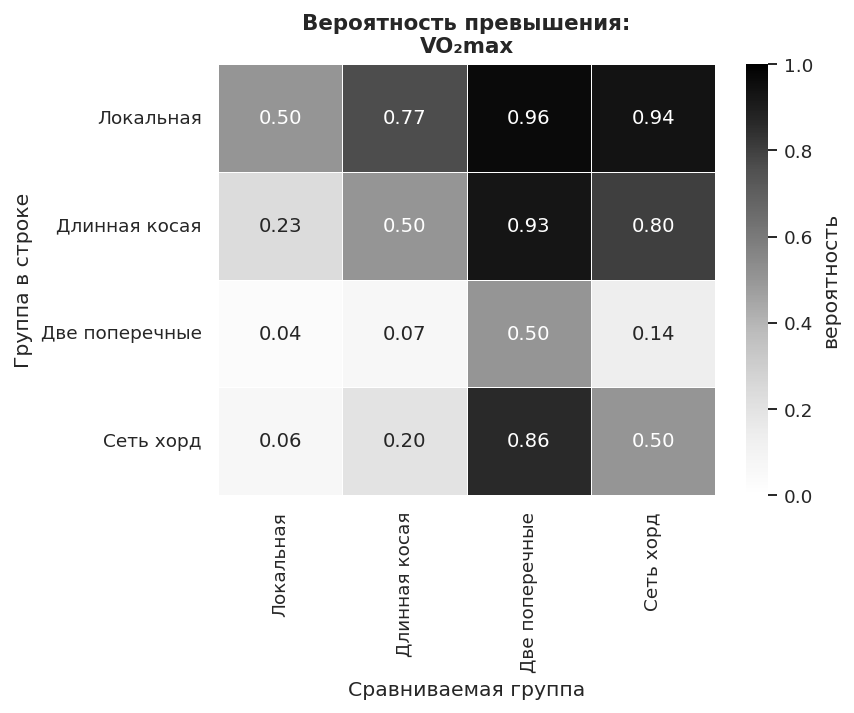

Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_echo_lv_sphericity_index_end_diastolic_ratio.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_echo_lv_sphericity_index_end_diastolic_ratio.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_echo_lv_sphericity_index_end_diastolic_ratio.pdf


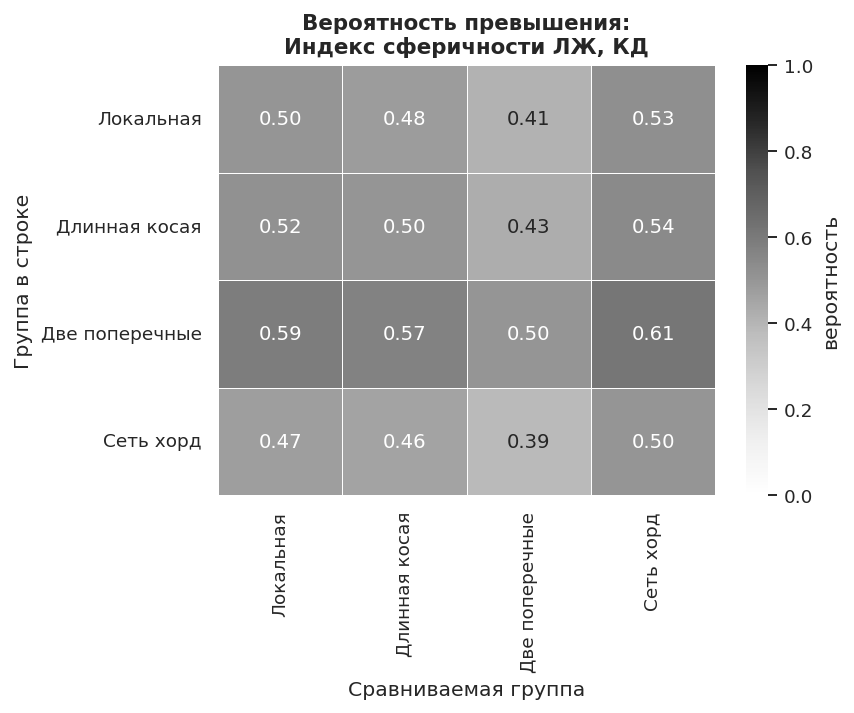

Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_echo_lv_sphericity_index_end_systolic_ratio.png
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_echo_lv_sphericity_index_end_systolic_ratio.svg
Saved: C:\Users\Ars\projects\university\lab_urfu_2026\false-lv-chords\reports\article_figures_v3\supplementary\supp_probability_matrix_echo_lv_sphericity_index_end_systolic_ratio.pdf


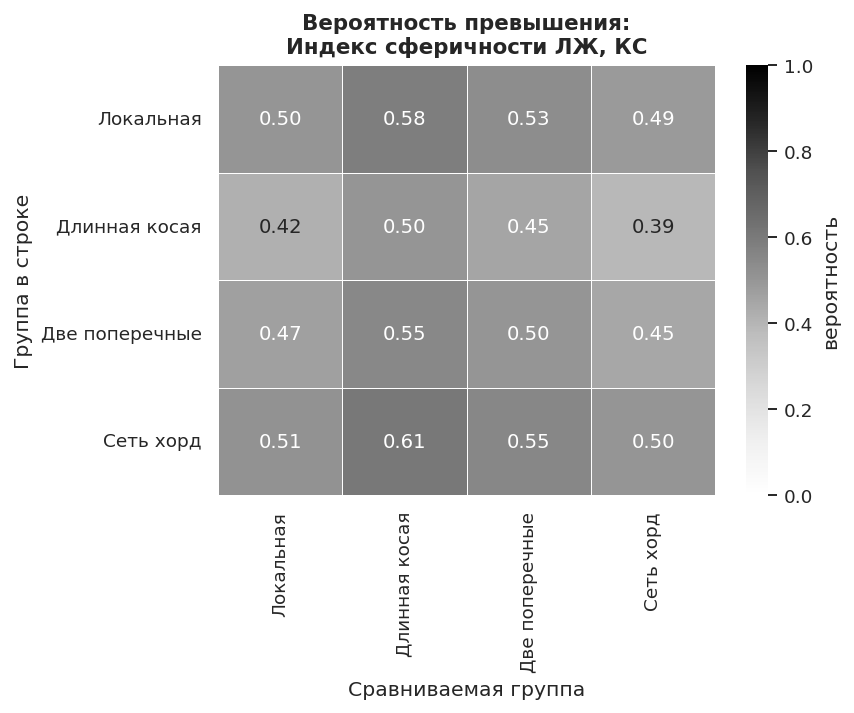

In [47]:
# ============================================================
# Supplementary probability matrices
# ============================================================


def compute_probability_matrix_for_outcome(outcome):
    if outcome not in posterior_group_draws_article:
        return None

    draws = posterior_group_draws_article[outcome]
    groups = [g for g in ARCH_GROUP_ORDER_ARTICLE if g in draws.columns]

    mat = pd.DataFrame(index=groups, columns=groups, dtype=float)

    for row_g in groups:
        for col_g in groups:
            if row_g == col_g:
                mat.loc[row_g, col_g] = 0.50
            else:
                mat.loc[row_g, col_g] = np.mean(draws[row_g].values > draws[col_g].values)

    return mat


def plot_probability_matrix_article(outcome):
    mat = compute_probability_matrix_for_outcome(outcome)

    if mat is None:
        print("Нет posterior draws для:", outcome)
        return

    mat_ru = mat.rename(
        index={g: ARCH_GROUP_LABELS_SHORT_RU[g].replace("\n", " ") for g in mat.index},
        columns={g: ARCH_GROUP_LABELS_SHORT_RU[g].replace("\n", " ") for g in mat.columns},
    )

    fig, ax = plt.subplots(figsize=(6.2, 5.2))

    sns.heatmap(
        mat_ru,
        annot=True,
        fmt=".2f",
        cmap="Greys",
        vmin=0,
        vmax=1,
        linewidths=0.5,
        linecolor="white",
        cbar_kws={"label": "вероятность"},
        ax=ax,
    )

    ax.set_title(
        f"Вероятность превышения:\n{article_outcome_label(outcome)}",
        fontsize=11,
        fontweight="bold",
    )

    ax.set_xlabel("Сравниваемая группа")
    ax.set_ylabel("Группа в строке")

    plt.tight_layout()

    article_savefig(
        fig,
        ARTICLE_SUPP_DIR / f"supp_probability_matrix_{outcome}",
    )

    plt.show()


for outcome in ARTICLE_MAIN_OUTCOMES + ARTICLE_SECONDARY_OUTCOMES:
    if outcome in posterior_group_draws_article:
        plot_probability_matrix_article(outcome)


In [48]:
# ============================================================
# Final file report
# ============================================================

created_files = []

for folder in [ARTICLE_DIR, ARTICLE_SUPP_DIR, ARTICLE_TABLES_DIR]:
    for path in sorted(folder.glob("*")):
        if path.is_file():
            created_files.append(
                {
                    "folder": str(folder.relative_to(PROJECT_ROOT)),
                    "file": path.name,
                    "size_kb": round(path.stat().st_size / 1024, 1),
                }
            )

created_files_df = pd.DataFrame(created_files)

display(created_files_df)

created_files_df.to_excel(
    ARTICLE_TABLES_DIR / "article_output_file_report.xlsx",
    index=False,
)

print("Основные рисунки для статьи:")
print("- fig1_chord_architecture_v3_scheme")
print("- fig2_regional_mechanical_heterogeneity")
print("- fig3_load_and_morphology")
print("- fig4_dsws_cv_interaction_zoom")

print("\nДополнительно:")
print("- supp_strain_rate_cv_by_v3_architecture")
print("- probability matrices")
print("- article_table_group_estimates")
print("- article_table_key_contrasts")
print("- strain_rate_v3_support_of_old_model")


,folder,file,size_kb
0,reports\article_figures_v3,fig1_chord_architecture_v3_scheme.pdf,29.4
1,reports\article_figures_v3,fig1_chord_architecture_v3_scheme.png,617.9
2,reports\article_figures_v3,fig1_chord_architecture_v3_scheme.svg,56.4
3,reports\article_figures_v3,fig2_regional_mechanical_heterogeneity.pdf,47.4
4,reports\article_figures_v3,fig2_regional_mechanical_heterogeneity.png,664.6
5,reports\article_figures_v3,fig2_regional_mechanical_heterogeneity.svg,136.9
6,reports\article_figures_v3,fig3_load_and_morphology.pdf,42.2
7,reports\article_figures_v3,fig3_load_and_morphology.png,508.9
8,reports\article_figures_v3,fig3_load_and_morphology.svg,103.0
9,reports\article_figures_v3,fig4_dsws_cv_interaction_full.pdf,48.0


Основные рисунки для статьи:
- fig1_chord_architecture_v3_scheme
- fig2_regional_mechanical_heterogeneity
- fig3_load_and_morphology
- fig4_dsws_cv_interaction_zoom

Дополнительно:
- supp_strain_rate_cv_by_v3_architecture
- probability matrices
- article_table_group_estimates
- article_table_key_contrasts
- strain_rate_v3_support_of_old_model
